In [1]:
import pandas as pd
import numpy as np
import tweepy
import logging
import pickle
from config import Twitter

## Webscratch Party Tweets

In [2]:
#hier aktueller scraper
def webscratch_parties(party):
    consumer_key = Twitter['consumer_key']
    consumer_secret = Twitter['consumer_secret']
    access_token = Twitter['access_token']
    access_token_secret = Twitter['access_token_secret']

    AUTH = tweepy.OAuthHandler(consumer_key, consumer_secret)

    ## user authentification
    AUTH.set_access_token(access_token, access_token_secret)

    ## access to REST Api (no streaming)
    api = tweepy.API(AUTH, wait_on_rate_limit=True)
    user = api.me()
    logging.critical("connection established with user: " + user.name)

    db_tweets = pd.DataFrame(columns = ['username','following','followers','usercreatedts','tweetfavouritecount','retweetcount', 'text','retweeted_user','hashtags'])

    tweet_list= []
    retweeted_accounts=[]                    
    for status in tweepy.Cursor(api.user_timeline, screen_name='@'+str(party),since="2017-07-25", tweet_mode="extended").items():
        print(status.full_text)
        tweet_list.append(status.full_text)
        username = status.user.screen_name
        following = status.user.friends_count
        followers = status.user.followers_count
        tweetcreatedts = status.created_at
        tweetfavouritecount=status.favorite_count
        retweetcount = status.retweet_count
        hashtags = status.entities['hashtags']
    
        try:
            text = status.retweeted_status.full_text
            retweeted_accounts.append(status.retweeted_status.user.screen_name)
            retweeted_user=status.retweeted_status.user.screen_name
        except AttributeError:  # Not a Retweet
            text = status.full_text
            retweeted_user=''
        iter_tweet = [username, following, followers,
        tweetcreatedts,tweetfavouritecount, retweetcount, text,retweeted_user, hashtags]
        db_tweets.loc[len(db_tweets)] = iter_tweet
        
    db_tweets.to_csv("Tweets_db_"+str(party)+".csv", index = False, header=True)
        
    with open('tweets_'+str(party)+'.txt', 'wb') as fp:
        pickle.dump(tweet_list, fp)
    
    retweeted_accounts=list(set(retweeted_accounts))
    with open('retweeted_user_'+str(party)+'.txt', 'wb') as fp:
        pickle.dump(retweeted_accounts, fp)

In [26]:
webscratch_parties('dieLinke')

CRITICAL:root:connection established with user: Peter Pan Senior


RT @b_riexinger: Danke an Wählerinnen und Wähler. Ein besonderer Dank geht an die Wahlkämpferinnen und Wahlkämpfer in #NRW, die sich trotz…
RT @b_riexinger: Ein Viertel der Bevölkerung des Landes kann heute abstimmen bei der #KommunalwahlNRW. Ein Viertel der Bevölkerung bestimmt…
RT @JoergSchindler: Heute ist #KommunalwahlNRW.

Alle Stimmen für @dieLinke, wenn ihr soziale Kommunen, besseren ÖPNV, gute Krankenhäuser,…
RT @katjakipping: 365-Euro-Ticket für den Nahverkehr, Breitbandausbau und 5G, Mietendeckel, gesunde Krankenhäuser - wer das will, wählt mor…
RT @b_riexinger: Soziale #Gerechtigkeit in der großen #Wirtschaftskrise. Kampf gegen #Klimawandel. Keine Kompromisse im Kampf gegen Rechts.…
RT @jankortemdb: Glückwunsch zum 75., liebe @CSU. In einem Dreivierteljahrhundert Parteigeschichte ist bei euch echt viel passiert. Genug Ü…
RT @katjakipping: Ich hätte angesichts von #Moria mal eine Frage an alle #Grünen, die auf Schwarz-Grün setzen: Wollt ihr ernsthaft Leute wi…
RT @b_riexinger

RT @b_riexinger: Trumps Kampagne zum #Wahlbetrug ist durchsichtig. Das diese Kampagne möglich ist, zeigt aber auch die Defizite des amerika…
RT @DietmarBartsch: In Österreich erhält ein Durchschnittsverdiener rund 800 Euro mehr als ein Durchschnittsverdiener hierzulande. In Öster…
RT @dielinketk: Über den anstehenden Bundesparteitag der LINKEN und welche Herausforderungen wir als Partei im nächsten Jahr haben spricht…
RT @b_riexinger: Präsident #Trump heizt unter dem Deckmantel von #LawAndOrder die Konflikte an. Er trifft damit nicht nur die #Bürgerrechts…
RT @katjakipping: Wenn es in #Moria zu einer #Corona Masseninfektion kommt, trägt  #Seehofer die Verantwortung für das Leid und mögliche To…
RT @JoergSchindler: Heute vor 5 Jahren, am 2.September 2015, ertrank Alan Kurdi vor der Küste von Bodrum auf der Flucht aus Aleppo und Koba…
RT @katjakipping: Gestern bei Klamroths Konter ging es zur Sache und auch um #NeuelinkeMehrheiten, die #4TageWoche sowie um meine ganz pers…
RT @DietmarBar

RT @katjakipping: Die offenbare Vergiftung von Alexej #Nawalnyj muß lückenlos aufgeklärt werden. Es geht um  vorurteilsfreie Aufklärung. Di…
RT @linke_sachsen: Heute starten wir in #Chemnitz unsere Tour gegen die steigende #Altersarmut in #Sachsen. Mit dabei: @katjakipping und OB…
Gerade in der Krise sollte lieber die Arbeit auf alle umverteilt werden, als das mehr Menschen erwerbslos werden. Dazu brauchen wir #Arbeitszeitverkürzung bei Lohnausgleich. Die Bundesregierung sollte ein Wahlarbeitszeit-Gesetz vorbereiten, fordert @b_riexinger. #4TageWoche https://t.co/oMb6xL6CC6
RT @LinksfraktionB: #nichtEgalWerRegiert #r2gwirkt #NieMehrCDU https://t.co/S6s4FyJGgN
RT @DieLinkePresse: .@dieLinke #Pressekonferenz mit @b_riexinger:
https://t.co/AHBgbSSyTX
RT @Amira_M_Ali: Von wegen "#wumms": #Mehrwertsteuersenkung der #Bundesregierung verpufft. Viel besser wäre: Gezielte Unterstützung für Ver…
Mit #Arbeitszeitverkürzung können wir Arbeitsplätze retten, für mehr Lebensqualität sorgen und Mensch

RT @LinksfraktionB: Unser Fraktionsvorsitzender @schatzbln und die Landesvorsitzende von @dielinkeberlin, @Katina_Schubert, beim Gedenken a…
RT @katjakipping: Der #13August1961 erinnert uns daran, dass Menschen beim Versuch die DDR zu verlassen, ihr Leben riskieren mussten oder g…
Menschen in Alten- und Pflegeheimen sind in der #CoronaKrise besonders gefährdet und die Isolation trifft sie besonders hart. Deshalb braucht jedes Alten- oder Pflegeheim mindestens eine Stelle für #Besuchslotsen, fordert @katjakipping. #LINKSBEWEGT https://t.co/mhm1T7gwPE https://t.co/HvXG2vml0E
„Die Polizei ging wahllos und brutal vor, tausende Demonstrantinnen und Demonstranten wurden aufgegriffen und auf die umliegenden Gefängnisse verteilt, weil die Strafanstalten in Minsk bereits überfüllt sind.“ https://t.co/OMJU5iDhfC
„Nach den Präsidentschaftswahlen ebbten die Proteste gegen den ewigen Präsidenten Lukaschenko, dem von den Demonstranten Wahlbetrug und die Umwandlung des Landes in eine Diktatur vorgewo

Do. 06.08. ab 18 Uhr bei Zoom https://t.co/nFjmBXrNg1 oder https://t.co/z1yiczXDpw https://t.co/wLW4X556X5
RT @katjakipping: Beim #Frühstart sprach ich über den #Schulbeginn. Mein Vorschlag: Räumliche Entzerrung &amp; kleinere Teams. Wenn Austausch &amp;…
RT @b_riexinger: Den #Mietendeckel mit auf den Weg gebracht und endlich die Mieterinnen und Mieter geschützt UND trotzdem mehr #Neubau als…
RT @DieLinkePresse: .@katjakipping: "Die #UN hat die Verbrechen an den #Jesidinnen und #Jesiden als Genozid eingestuft. Es ist an der Zeit,…
#Pressekonferenz #dielinke mit der Parteivorsitzenden @katjakipping https://t.co/7ibHZwGR2O
RT @JoergSchindler: Bewegendes Gedenken am Denkmal für die vom Nationalsozialismus ermordeten Sinti und Roma Europas. Am 2. August 1944 wur…
RT @klauslederer: Ich bin meiner Freundin @KLompscher sehr dankbar für jahrelange gemeinsame politische Arbeit und habe großen Respekt vor…
RT @JoergSchindler: Riesen-Respekt für Katrin Lompscher! Wir kämpfen weiter für eine Stadt

RT @schirdewan: Was eben so passiert, wenn Demokratien Autokraten an die Macht wählen und diese dann von denen in autoritäre Regime umgebau…
RT @DietmarBartsch: Es ist gut, dass die #USA beim #Truppenabzug nun Nägel mit Köpfen machen. Bitte, vergesst Eure #Atomwaffen nicht! Bund…
Die #Bundesregierung rüstet auf: Allein der Kauf neuer Bomber zum Transport von #Atomwaffen wird nach Berechnungen von #Greenpeace rund 8 Milliarden Euro kosten. Jeder Cent für die atomare Nachrüstung ist ein Cent zu viel.

#CDU #AKK #F18 #Bundeswehr #Rüstung #Atomwaffen https://t.co/5lO0l0QOCr
"Anstatt gegen prekäre Arbeit insgesamt vorzugehen, rennt BM Heil mit einem Eimer einzelnen Lecks hinterher. Allein ##Werkverträge zu verbieten führt, wie wir im Fall Tönnies sehen dazu, dass durch Subunternehmerstrukturen die Ausbeutung lediglich verlagert wird."
"Ein Verbot von #Werkverträgen in der Logistikbranche und für Paketzusteller ist ebenso überfällig wie in der Fleischindustrie." @b_riexinger #Werkverträge #t

RT @DietmarBartsch: In den Niederlanden hat kein Rentner weniger als 1.255 €. Hierzulande sind es aus gesetzlicher Rente fast 10 Mio. Das R…
RT @b_riexinger: Der social-media-Leiter der #Bundeswehr sympathisiert mit #Nazis. Was muss eigentlich noch passieren damit bei der #Bundes…
RT @DietmarBartsch: Aufwachen!!! Im November 2019 postete die Social-Media-Abteilung eine Hakenkreuzuniform. Nichts passierte! In welchem T…
Extreme Rechte zwischen Parlament und Terror – @Natascha_Strobl (#NatsAnalyse) und @JoergSchindler diskutieren über aktuellen #Rechtsextremismus und Gegenstrategien. 
Heute 18 Uhr bei Zoom https://t.co/nFjmBXrNg1 oder https://t.co/z1yiczXDpw
#halleprozess #nonazis https://t.co/lgZxpXvRCz
RT @b_riexinger: 9 Jahre nach #Utoya ist es beunruhigend, dass gerade #Deutschland die Hochburg rechten Terrors in #Europa ist. Wir erinner…
Kein Kind ist verantwortlich für seine #Armut. Sie ist eine Folge politischer Untätigkeit. 21,3 Prozent der Kinder in Deutschland sind laut Bertels

RT @JoergSchindler: Als erste Partei in Deutschland startet @dieLinke ein Online-Magazin mit journalistischem Anspruch für unsere Mitgliede…
Jetzt ist es fertig: LINKS BEWEGT, unser neues Online-Magazin!
👉 https://t.co/l7Zrbzs4Kn #LINKSBEWEGT #Blog #Weblog https://t.co/YwMXZ2nedL
RT @b_riexinger: Das Urteil zu #Apple ist ein Skandal. Für multinationale Konzerne gibt es wieder mal eine Extrawurst. Diese #Steuervermeid…
RT @SusanneHennig: We don’t fight for flowers. We fight for equal rights - we keep fighting! 💪💪

Ein Schritt für die gleichberechtigte #Tei…
RT @walter_linke: Dieser Tod zeigt, dass Rassismus schon immer zu Taten führte und am Ende leben kostet. So war es und so wird es sein. Der…
Die grandiose @IdilBaydar wird vom #NSU20 bedroht. Auch bei ihr führen erste Spuren zur #Polizei. #Baydar  setzt sich engagiert gegen #Rassismus ein. Teile dieses Video, wenn du deine Solidarität mit ihr ausdrücken möchtest. #nazisraus #nonazis https://t.co/siBv35AOzG
RT @b_riexinger: #DAX-Vorst

„#Seehofer kann bei #Seenotrettung nicht überzeugen. Er kann nicht überzeugend für eine europäische Lösung zur Aufnahme von Flüchtlingen werben und lässt als Innenminister ein Minimum an humanistischem Anstand vermissen“, kritisiert @JoergSchindler. https://t.co/qRkqcI0UsT
RT @linke_sachsen: Sommerlektüre! Wer mit "Mortler deckt auf: Illegales ist in Wahrheit verboten" und der letzten Amthor-Biografie schon du…
RT @DietmarBartsch: Empfehle dazu dringend @fiedelseb in den #Tagesthemen
Die Ergebnisse einer solchen Studie können allen helfen.#Polizei…
RT @Linksfraktion: .@SWagenknecht zum #Konjunkturpaket bei #Lanz: Freiberufler und Soloselbstständige werden auf #Hartz IV verwiesen. Gleic…
RT @LINKE_LTSachsen: Die Realität ist eine andere, berichten auch viele migrationspolitische Initativen. Auch das neue sächsische #Polizeig…
RT @phoenix_de: Die Absage der #Rassismus-Studie von #Seehofer ist eine Unverschämtheit &amp; nicht hinnehmbar, so @JoergSchindler @dielinke. D…
#Pressekonferenz #

RT @DietmarBartsch: Die #Mindestlohnkommission hat sich ausdrücklich nicht bewährt. Sie hat es in 5 Jahren nicht geschafft, den #Mindestloh…
RT @JoergSchindler: Ich hab fix ausgerechnet: Heute muss ein alleinerziehender Vollzeit-erwerbstätiger Elternteil mit 2 Kindern und 600 Eur…
Der #Mindestlohn soll im kommenden Jahr um lächerliche 15 Cent steigen. Danach geht es kleckerweise weiter. Die Blockade der Arbeitgeber ist eine Frechheit gegenüber allen Menschen, die dafür schuften gehen müssen. Dabei gibt es viele Gründe für eine ordentliche Erhöhung. https://t.co/hqSznDxFHT
RT @b_riexinger: Laut @ArminLaschet soll für #Tönnies jetzt auch Recht und Ordnung gelten. Frage: Was galt denn bis jetzt für #Tönnies Herr…
RT @MartinaRenner: Das #KSK wird teilaufgelöst. 
Was fehlt: 
* Verbleib „verschwundene“ Munition/Waffen/Sprengstoff nachgehen
* Rechte Sold…
RT @DietmarBartsch: Die Richtung stimmt. Weiter so! Aber: Teilauflösung klingt wie ein bisschen schwanger. Warum nicht ein konsequenter Neu

RT @Amira_M_Ali: Den #Lockdown in #Gütersloh: Diesen müsste es nicht geben, wenn man im System #Fleischindustrie härter durchgegriffen hätt…
RT @b_riexinger: Der Milliardär #Thiele versucht #Staatshilfen für die #Lufthansa zu verhindern. Nochmal: Warum zahlt die #Bundesregierung…
Knapp 174.000 Euro hat (lt. @a_watch) die #CDU seit 1998 von #Tönnies bekommen. Da drängt sich die Frage auf, welchen Einfluss diese Geldgeschenke haben. Strenge Regulierungen und Kontrollen in der Fleischindustrie jedenfalls haben sie nicht befördert. #Laschet https://t.co/WRuykV3JGB
RT @UlrichSchneider: Ein Landgericht bestätigt die harte Haltung der Bundesregierung: Bezieher von #HartzIV brauchen kein Extra-Geld für Mu…
RT @katjakipping: Druckfrisch eingetroffen, die neue Massenzeitung von @dielinke u.a. zu # Pflegenotstandstoppen, Rassismus bekämpfen, sozi…
RT @SWR2: Bundestagsvizepräsidentin @PetraPauMaHe beklagt, dass es in vielen Institutionen strukturellen Rassismus gebe. Nach rechtsextreme…
Eine reprä

Themenabend #Kuba: Diskussion &amp; Live-Musik beim #FestderLinken, mit  Hans Modrow, @ZaklinNastic u.a., gleich um 20:30 Uhr https://t.co/Rg9VnvoTgK
Es muss geredet werden. Über männliche Privilegien, Rollenbilder und Machtstrukturen, die die Gesellschaft prägen und Ungleichheiten fördern. Dazu gibt es gleich ein Webinar mit Fikri Anıl Altıntaş von @LeftstyleMag, um 20:30 Uhr beim #FestderLinken 
https://t.co/3O2OiOLz90
„Rap und #Empowerment – Wir sind #HipHop, was seid ihr?“ Linke #Musik heißt für Migrant*innen und junge Erwachsene Azad, Apache, Kontra K u.v.m. - Talk mit @JoergSchindlerund @ju_khatib gleich um 20 Uhr beim #FestderLinken.
https://t.co/mCP6P7OIrN
Welchen Weg soll die deutsche Hauptstadt im 21. Jahrhundert wählen? @klauslederer zu 100 Jahre Groß-Berlin, gleich um 19 Uhr beim #FestderLinken 
https://t.co/3pJwhAkdp7
The Swingin’ Hermlins, die großartige Band mit @AndrejHermlin, gleich live um 18:30 Uhr beim #FestderLinken. 
https://t.co/zZLdE4q5Qy
@linksfraktion
Folgt un

„Der Wunsch Tausender nach mehr Demokratie, besseren Arbeits- und Lebensbedingungen, darf niemals mit Repression und Gewalt beantwortet werden. Unsere Lehre daraus ist: kein Sozialismus ohne Demokratie.“
„Die Arbeiterproteste wurden von einer stalinistischen Kaste niedergeschlagen, die glaubte, sozialer Fortschritt sei ohne Freiheit und Demokratie möglich.“
Am #17Juni 1953 protestierten Tausende Arbeiter*innen in der DDR gegen Normerhöhungen. Aus zunächst wirtschaftlichen Forderungen entwickelten sich politische. Der Volksaufstand wurde brutal niedergeschlagen. 
„Ich gedenke der Opfer des Aufstandes vom #17Juni53“, so @katjakipping.
In der #Corona-Pandemie verschärft sich die Ungleichheit zwischen den Geschlechtern. Frauen tragen die Hauptlast. Talk mit @DorisAchelwilm, @maderkath und @kerwolter (DIE LINKE). Heute, 17.6. um 20 Uhr bei Zoom und Youtube.  https://t.co/7OdGtc52Eq #Feminismus #Gleichberechtigung https://t.co/gMxAPEOqaW
RT @Linksfraktion: .@Amira_M_Ali: Trump versteht den a

Ab heute gelten die #Corona-Lockerungen in #Thüringen. Über die aktue…
RT @JoergSchindler: Also, ich bitte euch: Diese Saubermann-Story vom "hart arbeitenden ehrlichen Konservativen" ist doch schon immer eine I…
RT @DietmarBartsch: Übergroße Mehrheit für einen höheren #Mindestlohn. Für die Vermögensteuer. Ein Verbot von Atomwaffen. Die Menschen im L…
RT @Amira_M_Ali: #CDU ist die Partei der Lobbyisten. #Amthor ist kein Einzelfall (man denke nur an Andreas Scheuer oder Julia Klöckner). Di…
RT @katjakipping: Dann sehen wir uns am Sonntag in #Leipzig beim Band der der Solidarität. #SoGehtSolidarisch  @DIELINKELeipzig  @_maxbecke…
RT @katjakipping: Seit dem Beginn der #Coronakrise fordern Geflüchtete &amp;ihre Un­ter­stüt­ze­r*innen, die Unterbringung in Sammelunterkünfte…
RT @Linksfraktion: »Die Bundesregierung setzt Milliarden der Steuerzahler nicht effektiv ein. Zwar ist das Ziel, #Konjunktur anzuschieben,…
@StefanRausch00 @AndrejHermlin @b_riexinger @IdilBaydar @GregorGysi @sebkrumbieg

RT @BAntifaschismus: Es sind wohl 7000 Menschen in #Koeln am demonstrieren, gegen Rassismus und Polizeigewalt. Unser Genosse @Pferdezeitung…
RT @bodoramelow: Warum lügt BILD?  Warum lügt BILD? Warum lügt BILD?  
Das Parlament hat entschieden und auch den Entschliessungsantrag ver…
RT @DietmarBartsch: Der US-Truppenteilabzug muss als Chance begriffen werden. Die BuReg sollte ihn dankend annehmen und zeitnah einen Kompl…
RT @DietmarBartsch: Meine Rede...@NetzwerkgegenKA @Linksfraktion
RT @katjakipping: Das #GroKo-Konjunkturpaket ist leider auch ein  gigantisches Rüstungsprojekt. Bis zu 10 Mrd für »neue Rüstungsprojekte mi…
RT @brunnersandra1: "Es bleibt unbegreiflich, warum bei 130 Milliarden Euro so viele der Armen unberücksichtigt bleiben."
https://t.co/niCn…
RT @LinksfraktionB: #DeutscheWohnen muss in 30 % ihrer Wohnungen die Miete absenken, weil sie mehr als 20% über der zulässigen Obergrenze l…
RT @katjakipping: Morgen lade ich wieder herzlich zum Kaffee im Live-Chat ein. Freue mich

Heute erklärt #Trump die #Antifa zur Terro…
RT @schirdewan: Nach dem Mord an #GeorgeFloyd erleben die #USA einen sozialen, antirassistisch-demokratischen Aufstand.

#Trump spielt den…
@DaniLudwigMdB @MAStrackZi https://t.co/682saaVFc6
Grünes Wachstum oder linker Green New Deal? Um 10 Uhr diskutiert unser Vorsitzender @b_riexinger mit dem Bundesgeschäftsführer der @Die_Gruenen @MiKellner. Schaltet euch ins Webinar ein. 
Zoom: https://t.co/fpBajU4wCd
Youtube: https://t.co/DFuv8eUjwv
#Klimagerechtigkeit #FFF https://t.co/5ZxYalSI4w
RT @b_riexinger: #GreenNewDeal oder Grünes Wachstum? Darüber diskutiere ich morgen um 10 Uhr mit dem Bundesgeschäftsführer der Grünen @MiKe…
RT @DietmarBartsch: #MitteLinks statt @Markus_Soeder 
@spdde @dieLinke @Die_Gruenen 
 https://t.co/J7CgtGs9Jq
RT @katjakipping: „Man darf nicht den Kommunen die Alternative aufdrücken: schließt das Schwimmbad oder das Frauenhaus. Wir müssen auf Bund…
RT @lgbeutin: Solidarische, friedliche Proteste bei #Datteln4 gegen das u

RT @b_riexinger: Die #Bundesregierung zahlt für #Lufthansa das Doppelte des Unternehmenswertes und verzichtet gleichzeitig auf jede Bestimm…
RT @phoenix_de: Es gehöre wohl nicht mehr zur unternehmerischen Fähigkeit von Automobilkonzernen, Verluste durch Gewinne der vergangenen Ja…
RT @Amira_M_Ali: #BGH gibt Dieselkunden Recht: #VW muss Schadensersatz zahlen! Diese Grundsatzentscheidung ist ein ganz wichtiges Zeichen.…
RT @NiemaMovassat: Das Urteil des #BGH im #VW-#Dieselskandal ist ein gutes Zeichen für den Rechtsstaat und die geschädigten Verbraucher*inn…
#Pressekonferenz #dielinke mit dem Parteivorsitzenden @b_riexinger https://t.co/Zi8j3sJMme
RT @rosaluxstiftung: Save the Date: Das #FestderLinken findet auch 2020 statt, und zwar am 19./20. Juni. In diesem Jahr allerdings nicht al…
RT @schirdewan: Um soziale &amp; wirtschaftliche Folgen der #Coronakrise zu bewältigen, braucht es eine #Digitalsteuer, eine umfassende #Finanz…
RT @katjakipping: Artikel 1: „Die Würde des Menschen ist una

Schon wieder gibt es einen massiven #Corona-Ausbruch im #Schlachthof. Die Liste der betroffenen Bundesländer wird immer länger. Klar ist: Die schlechten Arbeits- und Lebensbedingungen der Beschäftigten sind das Problem. #Coronakabinett #Fleischindustrie #Schlachthöfe #Fleisch https://t.co/3ar2S7FI0T
RT @katjakipping: "Es gibt bei #Covid19 eine starke soziale Komponente. Gerade Minderheiten &amp; sozial Schwache sind am stärksten betroffen.…
RT @DietmarBartsch: Es darf nicht sein, dass die Union mit ihrem Familienbild aus dem vergangenen Jahrhundert die Verlängerung blockiert. I…
RT @b_riexinger: Die Gewerkschaft @DeineEVG warnt vor dem Abbau von 10.000 Stellen bei der #Bahn. Hat die @Bundesregierung nicht aus der #B…
RT @OezlemADemirel: Mit den ungarischen Rechtspopulisten bin ich im EP immer wieder konfrontiert.  Und die Entwicklung dort ist erschrecken…
RT @JoergSchindler: Der #Irrsinn der #GroKo in zwei Fakten. Erstens: #Deutschland vermittelt mit #Ägypten, #VAE, #Türkei eine #Waffe

Der #Pflegenotstand gefährdet die Gesundheit von Patient*innen und Pflegekräften. Um den Kampf für eine bessere #Pflege zu unterstützen, haben wir gestern, am #TagderPflegenden, vor dem Bundeskanzleramt protestiert. #TagderPflege https://t.co/R32xdpIy0q
RT @Linksfraktion: Schlachthöfe haben sich in #Deutschland zu #Corona-Brennpunkten entwickelt. @Amira_M_Ali verurteilte die #Arbeitsbedingu…
RT @schirdewan: Superanalyse von @rosaluxstiftung
&amp; Netzwerk Steuergerechtigkeit @steuergerecht. 

Es braucht verbindliches Transparenzregi…
RT @berlinliebich: Während die größten deutschen Unternehmen Milliarden an Dividenden an ihre Aktionäre auszahlen, verlangen sie Milliarden…
RT @Amira_M_Ali: Heute ist #TagderPflege:
Unsere Pflegekräfte brauchen endlich bessere Arbeitsbedingungen und höhere Löhne. Das galt vor, d…
Aktiv gegen den #Mietenwahnsinn. Danke, @dielinkeberlin und @LinksfraktionB! #Mietendeckel https://t.co/kfJVmozxbX
Am #TagderPflege nur „Danke“ zu sagen, reicht nicht. Die #Pfleg

RT @Linksfraktion: Sergej Netschajew, Botschafter Russland: Dieses Datum ist heilig für uns, absolut heilig. Wir haben für diesen Sieg eine…
RT @schirdewan: Anlässlich des #Europatag2020 "fordert der Linken-Fraktionschef mehr Solidarität und Umverteilung", berichtet @RND_de 
#Sch…
RT @GUENGL: Today, Europe marks #VEDay75.

We remember all who perished under Nazism &amp; fascism. 

We honour those who gave their lives in d…
RT @DietmarBartsch: Viel habe ich an der Politik von Angela #Merkel zu kritisieren, aber den Tag der Befreiung vom Hitlerfaschismus gleichz…
RT @GregorGysi: Der 8. Mai sollte Anlass sein, das Verhältnis zwischen Deutschland &amp; Russland aus der Sackgasse zu führen - trotz aller Grü…
RT @OezlemADemirel: Heute ist 8. Mai - Tag der Befreiung.

#TagderBefreiung #Befreiung #8mai #8mai45 #niewieder #Feiertag @dielinke https:/…
RT @katjakipping: "Die einzige nachhaltige Lösung ist das Virus so weit wie mögl zurückzudrängen, so dass die verbleibenden Infektionskette…
RT @J

#Pressekonferenz #dielinke mit @b_riexinger https://t.co/ypzInYfQQW
RT @jankortemdb: Ich meine: Unternehmen, die Managerboni zahlen, Dividenden ausschütten oder Gewinne in Steueroasen parken dürfen keine öff…
RT @tpflueger: Unglaublich, die Bundeswehr übt einfach weiter - trotz #coronavirus
Und zwar zu Recht. https://t.co/efKaij4BHp
RT @b_riexinger: #Rentner an #Corona-Kosten beteiligen?! Das fordert ausgerechnet #Rürup, der die #Rente für Millionen Menschen unsicher ge…
RT @katjakipping: Die Langversion meines Kommentars im Tagesspiegel zu den #Lockerungen in der #Coronakrise gibt's auf meiner Website: "Die…
RT @Linksfraktion: .@Amira_M_Ali wirbt Corona-Vermögensabgabe: Bei den Quandt-Klattens, die immer noch 3 Mio. € am Tag Dividende bekommen,…
RT @JoergSchindler: "Vergessen" im #Sozialschutzpaket: #Mindeststandards für Unterkünfte von Monteuren und Vertragsarbeitern, dazu #Unterne…
😅 #corona https://t.co/nZ31vtKC7S
RT @CarenLay: Die #Coronakrise darf die #Mietenkrise nicht verstärke

RT @b_riexinger: Ein erster Platz auf den niemand stolz sein kann: #Deutschland führt die #Aufrüstungsspirale in Westeuropa an. Hatte diese…
RT @klauslederer: „Unter Druck steigt die Fehleranfälligkeit. Sich die Offenheit zu bewahren, auf Kritik nicht pauschal und abwiegelnd zu r…
RT @DietmarBartsch: Regierungen weltweit häufen gigantische Waffenarsenale an und verpulvern dabei Milliarden, die im Kampf gegen wirkliche…
Um 18h geht's los: Die Linke in Zeiten von #Corona – Der interaktive Talk mit @JoergSchindler, @anked und euch. Ihr könnt euch bei Zoom einwählen, mit diskutieren und eure Erfahrungen schildern: 👉https://t.co/1zJGaRsNIN oder auf 👉 https://t.co/OkdFGIUY7S #CoronaApp #corona https://t.co/x7f9xbHoUF
RT @b_riexinger: Das Finanzminister #Scholz keine #Staatshilfen an Konzerne ausschütten will, die noch #Dividenden zahlen, ist richtig. Abe…
RT @b_riexinger: "Nicht nur der #Schutz menschlichen Lebens ist wichtig" sagt Wolfgang Schäuble. Ja, was kann denn sonst wichtiger sein He

@__redcat Uups, sorry. Da konnten wir die Buchstaben nicht klar erkennen... 😉
@Moorbek @DrKissler Ja. Genau deshalb ist eine aufklärerende Drogenpolitik so dringend notwendig.
Es ist 16:20 Uhr!
#420day
Noch immer ist kiffen illegal, während der Staat am Alkohol ordentlich mitverdient. Das ist unlogisch und drogenpolitisch falsch. Wir brauchen eine aufgeklärte Drogenpolitik mit Entkriminalisierung und Legalisierung. #Cannabis #Ledalizeit #Drogen https://t.co/KhQgJZIKfv
RT @ARD_BaB: Vorbild Dänemark: Hier erklärt Linken-Chefin @katjakipping, welche Unternehmen keine Staatshilfe bekommen sollten. https://t.c…
"Es ist gut, dass sich auch in der SPD die Stimmen mehren, die eine Erhöhung des #Kurzarbeitergeld|es fordern. Die Blockadehaltung von CDU/CSU ist unsozial und für mich völlig unverständlich", so @b_riexinger. 
https://t.co/SC6Hb6xOsj #Kurzarbeit #CoronaKrise
#Pressekonferenz #dielinke mit @katjakipping https://t.co/HQq1p6I2yY
RT @LINKE_LTSachsen: Die #Flüchtlingslager in #Griechenla

#CoronaKrise bedroht Existenzen. Die Regierung muss Vertrauen stiften. Wir brauchen eine koordinierte Beschaffung der mediz. Materialien sowie #Corona-Lohnzuschläge. Gefeilsche um Hilfen für Spanien + Italien muss aufhören. #Weltgesundheitstag #COVID19 
https://t.co/FwgIPaEdo0
RT @MartinaRenner: Bei Waffenfunden ist man ja inzwischen viel gewöhnt. Aber 1 Million Schuss Munition. Das gab es bisher nicht. https://t.…
Jede*r von uns kann pflegebedürftig werden. Aber was, wenn den viel zu wenigen Pflegekräften die Kraft ausgeht? Unterzeichne den Aufruf gegen den #Pflegenotstand. 

#Corona #CoronaVirus #Covid19 #Weltgesundheitstag #TagderGesundheit #Gesundheit #CoronaKrise https://t.co/NrVAErteVT
RT @DieLinkePresse: Zum Vorschlag Ursula von der Leyens, einen #Marshallplan für die EU aufzulegen, erklärt @b_riexinger: „Diese Ansage ist…
RT @Linke_Thl: Die #Corona-Krise solidarisch meistern - dafür arbeiten wir jeden Tag. Auch von zu Hause aus. Wir sagen Danke an alle, die w…
RT @DIELINKEHESSE

Was @GregorGysi sagt! https://t.co/kX3IZUCZr4
Unser Gesundheitssystem muss krisenfest werden - nicht erst seit #Corona. Ein riesiger Schritt wäre eine Solidarische Gesundheitsversicherung, in die alle einzahlen - auch Politiker*innen, Beamt*innen und Selbstständige. #krankenkassen #Krankenversicherung #coronavirusdeutschland https://t.co/pSi7rNRUqb
RT @b_riexinger: Sichtbarkeit im öffentlichen Raum ist aus gegebenen Anlass aktuell nicht erlaubt. Dann müssen wir die Sichtbarkeit ganz ei…
RT @jankortemdb: Parallel zur Bekämpfung der #Corona-Pandemie soll die #Bundesregierung mit den Ländern eine Entprivatisierungsstrategie er…
RT @DieLinkeBrdburg: Die Nummern sind übrigens häufig für alle die etwas mitbekommen. Nicht nur für Betroffene! #passtaufeinanderauf https:…
RT @HaraldWolf20: Ich erfahre gerade, dass der Verkehrsverbund die Züge nur noch stündlich fährt, die Züge sind brechendvoll und damit eine…
RT @schirdewan: Übrigens wurde in #Ungarn heute die Demokratie abgeschafft. 

Keine P

RT @CarenLay: Heute berät der #Bundestag über #Mieterrechte in der #Coronakrise. Wir finden: Zu kurz gesprungen! #Zwangsräumungen müssen ve…
RT @b_riexinger: Wir sind nicht mit allem einverstanden und haben uns weitere Verbesserungen angesichts der Krise gewünscht. Aber eine schn…
RT @katjakipping: Genau das habe ich die Regierung auch gefragt. Faktisch fällt das ganze System von Fordern &amp; Fordern durch Kontaktsperre…
RT @IGBAU: Von #Sylt bis #Fürth: Unsere Kollegen aus der Dachdecker-Fachgruppe zeigen Gesicht und fordern die Aufstockung des Kurzarbeiterg…
RT @Linksfraktion: .@Amira_M_Ali: Schutzausrüstungen müssen bei denen mit viel Kontakt zu Menschen flächendeckend vorhanden sein. Ein Pausc…
RT @_verdi: ✊ #Kurzarbeitergeld erhöhen! Bereits mehr als 210.000 Menschen unterstützen unsere Petition. Vielen Dank! Jede Stimme zählt, wi…
RT @klauslederer: Das ist Wahnsinn. Und unverantwortlich.
RT @katjakipping: Dramatisch! Jetzt gibt es mehr #corona-Todesopfer in #Spanien als in China.

RT @katjakipping: So, der Chat "Auf nen Kaffee mit Kipping in Zeiten der Krise" lief gerade zum 1.Mal. Hab mich über das Interesse gefreut.…
RT @b_riexinger: Die Besitzer der Discounterketten gehören in #Deutschland zu den reichsten Menschen. Ihre Mitarbeiter riskieren ihre Gesun…
RT @SenIAS_Berlin: .@ElkeBreitenbach in @rbbabendschau: Häusliche Quarantäne funktioniert nicht, wenn man keine Whg. hat. Wir versuchen, Kä…
RT @Unteilbar_: Am 21. März ist Internationaler Aktionstag gegen Rassismus. Wegen #CoronaVirusDE verlagert sich der Protest ins Netz. Seid…
RT @LinksfraktionHB: Eigentlich wird am 21. März immer das Frühlingsfest (#Nouruz) begangen. "Auch wenn wir in diesem Jahr wegen #Corona ni…
RT @Linksfraktion: Bundesinnenminister #Seehofer (CSU) hat am Donnerstag eine #Reichsbürger-Gruppierung verboten. In zehn Bundesländern kam…
RT @JoergSchindler: Wenn schon, denn schon: Warum nur über Steuerrückzahlungen reden? Warum nicht auch die ausgeschütteten Gewinne mit einb…
RT @DietmarBar

#Pressekonferenz #dielinke mit @katjakipping https://t.co/gqgwCNtUQi
RT @b_riexinger: Herzlichen Dank an alle Wahlkämpferinnen und Wahlkämpfer und alle unsere Kandidatinnen und Kandidaten für ihren großen Ein…
RT @Linksfraktion: .@jankortemdb: Ein unsozialeres, unsolidarischeres und rücksichtsloseres Vorgehen im weltweiten Kampf gegen die Pandemie…
RT @Amira_M_Ali: Unfassbar, wie #Trump wieder agiert!
Medizinisches Wissen darf niemals exklusives Wissen sein! Alle Menschen müssen den gl…
RT @Katina_Schubert: Der liberale Macron: „Diese Pandemie hat jetzt schon deutlich gemacht, daß es Güter und Dienstleistungen gibt, die auß…
RT @DietmarBartsch: Ein riesiges Dankeschön und Respekt für alle, die im Beruf und privat aktuell Außerordentliches für ihre Mitmenschen un…
RT @DietmarBartsch: Gegen @FCBayern hätte gestern der @fcunion natürlich gewonnen. 😉 Für eine echte Überraschung könnte heute die @LINKE_Ba…
Heute sind Kommunalwahlen in #Bayern. Die Vorkehrungen sind getroffen, die Helfer vor

RT @CarenLay: Gewinne von Deutschlands drittgrößtem Wohnungskonzern #LEG und Dividenden für Aktionäre steigen. Wie? Weil Mieten in nicht ge…
RT @dwenteignen: „@AndiScheuer ist der #Enteignungsminister der Bundesregierung.

In Zusammenhang mit dem Bau von Autobahnen und Bundesstra…
RT @DieLinkePresse: Und für die Bundesregierung gilt: Deutschland muss Geflüchtete aufnehmen. Das Netzwerk solidarischer Städte will genau…
RT @OezlemADemirel: #Unfassbar! Neuer #SIPRI Bericht deckt auf: der weltweite #Waffenhandel boomt. Und #Europa mittendrin. #Deutschland ste…
RT @Amira_M_Ali: Deutschland wieder viertgrößter Waffenexporteur. Von schärferen Kontrollen der #Bundesregierung keine Spur. Waffenexporte…
RT @b_riexinger: #FreieMarktwirtschaft gab es noch nirgendwo und das ist auch nicht erstrebenswert. Überall braucht es einen Staat, der reg…
RT @schirdewan: Demokraten dürfen sich nie in Abhängigkeitsverhältnis von Despoten begeben, Frau @vonderLeyen. Stattdessen den #EU-Türkei-F…
#Pressekonferen

RT @katjakipping: Danke für den guten Abend an @larsklingbeil, @misik und die klugen Fragen von @stefanreinecke. Möge der Dialog weitergehe…
RT @ZDFheute: Bodo Ramelow verweigert Björn Höcke den Handschlag. In seiner Rede danach macht er sehr deutlich, warum. #thueringen https://…
❤️ @bodoramelow. #keinhandschlag #noAfD #Ramelow https://t.co/CjYpZlOhVs
Jetzt live aus dem taz-Cafe aus Berlin. @katjakipping spricht mit @misik und @larsklingbeil über ihr Buch "#neuelinkemehrheiten - Eine Einladung". 
https://t.co/tTrkhodkhY
RT @SusanneHennig: Der Ministerpräsident des Freistaats #Thüringen heißt @bodoramelow - die Minderheitsregierung #r2g kann nach verlorenen…
RT @Linke_Thl: Klare Worte von MP @bodoramelow: Wer die Demokratie mit Füßen tritt, Leimruten legt und Fallen stellt, der hat etwas zu klär…
RT @Linke_Thl: Kein Handschlag mit Faschisten! Danke @bodoramelow! #noafd #nonazis #bodobleibt #r2g #thueringen #bernd #bodoramelow @spdthl…
RT @jtjengel: Wehrhafte Demokratie?
CHOOSE YOUR FIG

Wir müssen unsere Kultur ändern. Wir definieren uns über Akzeptanz und Anerkennung. Es reichen nicht nur quotierte Redelisten. Wir müssen auch unser Denken und Handeln ändern. @betti_gutperl #LINKEStrategie https://t.co/Ut5JYP1mT4
RT @katjakipping: #LINKEStrategie Es muss klar sein, wozu @dieLinke immer NEIN sagt  Sozialabbau,Privatisierung,Krieg. Darüberhinaus lautet…
Im gesamten Bundesgebiet haben wir in den letzten Jahren vor allem bei Frauen zugelegt. Wir müssen jetzt unsere Strukturen, Kultur und Problematik ändern, um alle einzubinden. @betti_gutperl #LINKEStrategie #StrangerThings4
Zum Schluss: Holt euer Handy raus: Schreibt einer Person, die noch nicht Mitglied, aber eintrittsbereit ist: Servus/Gude/Moin: Ich bin gerade bei der #Strategiekonferenz der LINKEN. Bitte wag doch den Schritt und mache mit: https://t.co/OyifWhnc48 @AtesGuerpinar #LINKEStrategie https://t.co/bwgvEefRZF
Andere Parteien erhalten ihre Kraft über rassistische Hetze, Lobbyismus oder Konzern-Spenden. Linke e

#LINKEStrategie
Wir müssen diejenigen adressieren, die die Hauptverursacher sind. Die oberen 
1% verursachen 40mal so viel Ressourcen als die Durchschnittsbevölkerung. #Klimapolitik ist eine #Klassenfrage. @RaulZelik #LINKEStrategie
Ich würde mich für den Begriff Öko-Sozialsmus einsetzen. Denn wir müssen deutlich machen, dass wir etwas anderes als @Die_Gruenen wollen. Inge Höger #LINKEStrategie
Wir müssen aus der feministischen Debatte die Begriffe Care-Revolution und Sorgearbeit aufgreifen. Wir brauchen ein neues Paradigma in den Wirtschaftswissenschaften. Dort müssen wir ein neues Paradigma, dass der Sorge und der Pflege, durchsetzen. @RaulZelik #LINKEStrategie
Wir müssen mit einem #GreenNewDeal klarmachen, dass dieser einen internationalistischen und antirassistischen Aspekt haben muss. #Klimagerechtigkeit ist nicht nur ein moralischer Schnickschnack, sondern da geht es auch um globale soziale Rechte. @RaulZelik
#LINKEStrategie https://t.co/GCWUpGjuoK
RT @sebastiank: Vieles, was in 

Ein Blick über die nationalen Grenzen macht uns deutlich: Wir erleben einen Aufstieg von Nationalismus, Autoritarismus und der Beschleunigung des #Klimawandels. Die Welt ist in Umbruch und wir erleben einen Wendepunkt von historischer Dimension. @HaraldWolf20 #LINKEStrategie
"Die Volksparteien sind in der Krise. Die @spdde ist in einer Dauerkrise. Die @CDU hat eine Führungskrise. Auf der rechten Seite hat sich mit der #noAfD eine Partei etabliert, die sich als Stichwortgeber für rechten #Terrorismus erweist." @HaraldWolf20 #LINKEStrategie
@WormWorthless @JoergSchindler Ja, die gab es.
"Das ist mein Vorschlag für eine Politik der LINKEN: Hoffnungsvoll in der Haltung, radikal im Herangehen, pragmatisch in der Umsetzung. Und auch rebellisch." @JoergSchindler #LINKEStrategie
"In Thüringen zeigen wir klare Kante gegen Rechts. Und gewinnen da die meisten Stimmen. Dass wir dort zulegen, sagt doch: “Keine Deals mit Faschisten!” ist richtig und finden große Teile der Thüringer gut." @JoergSchin

RT @misik: Berlin, ich komme (wenn nächste Woche noch Flugzeuge fliegen und Züge fahren...) https://t.co/MjtBVQORuV
RT @MartinaRenner: Die Opfer von #Hanau sind bevor sie ermordet wurden ausgegrenzt und zu Anderen gemacht worden. Wenn wir solche Taten auf…
RT @DIELINKELeipzig: .@bodoramelow sagt »JA« zu @Burkhard_Jung im 2. Wahlgang der #OBMLE20-Abstimmung am 1. März und dankt für seine #Solid…
Wir helfen wo wir können. Die #Schuldenbremse ist eine Investitionsbremse und muss daher weg. https://t.co/s4WY5007I6
RT @CansuOezdemir: Eine wirklich wichtige und erfreuliche Entwicklung! Der Hamburgischen Bürgerschaft @buergerschaftHH gehören nun 54 Fraue…
RT @berlinliebich: Endlich. 

https://t.co/fozVTbgjeL
RT @SevimDagdelen: 4. Verhandlungstag im Auslieferungsverfahren USA vs #JulianAssange : Heute wird es darum gehen, ob #Assange weiterhin im…
RT @DieLinkeNRW: Am #EqualCareDay wird an die Menschen erinnert, die Sorgearbeit leisten, meist nicht oder schlecht bezahlt. 
https://t.co/…
RT @but

#Antifaschismus und #Demokratie sind uns eben ein Herzensanliegen. Da sind wir ganz uneigennützig.

#HamburgWahl #HHWahl #noAfD https://t.co/Rbj19IxTcm
RT @b_riexinger: Danke an alle Wahlkämpferinnen und Wahlkämpfer in #Hamburg für tausende Haustürgespräche, ungezählte Kundgebungen gegen #M…
Wir haben zugelegt. Prozentual und in absoluten Zahlen. Wir sind aus einem weiteren westdeutschen Parlament nicht mehr wegzudenken. Und auch dies ist eine Botschaft dieser Wahl: Die Parteien der #Kemmerich-Koalition haben verloren. @katjakipping #HHWahl
RT @die_linke_th: Nach dem #tatort &amp; @tagesthemen unsere Landesvorsitzende @SusanneHennig bei @annewill
#Hanau #Dammbruch #HamburgWahl
RT @DieLinke_HH: Auf gehts... die Wahllokale schließen um 18 Uhr!
Alle 10 Stimmen für DIE LINKE 🌹
🎯🎯🎯🎯🎯🎯🎯🎯🎯🎯
#Hamburg #HHWahl https://t.co/…
RT @NiemaMovassat: Deutschland 2020. Morde, Drohungen und Anschläge gegen Migrant*innen sowie ihre Einrichtungen wie Moscheen sind an der T…
RT @OezlemADemirel: Auf geht's. 

RT @katjakipping: Nach #Hanau höre ich von unvorstellbarer Trauer, von Wut &amp; wachsender Angst vor weiterem rechten Terror. Alles zusammen e…
RT @GregorGysi: 1/2 Ein in jeder Hinsicht entsetzlicher Gewaltakt in Deutschland, in #Hanau. Es wird Zeit, dass wir begreifen, dass der rec…
RT @linke_sachsen: Die Ermordeten kommen aus unser aller Mitte und sind nicht mehr oder weniger "Fremde" als wir alle. #Hanau https://t.co/…
RT @SWagenknecht: Verursachtes Leid durch offenbar rassistischen Anschlag in #Hanau ist riesig. Meine Gedanken sind bei den vielen Opfern &amp;…
RT @b_riexinger: Wieder #RechterTerror, wieder in #Deutschland. Die Häufung dieser unmenschlichen Taten ist nicht hinzunehmen und das lange…
RT @Janine_Wissler: Meine Anteilnahme gilt den betroffenen Familien, den Verletzten und Hinterbliebenen.
 
Wenn sich die Hinweise bestätige…
RT @alexfischer: Nein, das ist das Deutschland, in dem eine rechtsradikale Partei jeden Tag Hetze und Angst verbreitet. #Hanau https://t.co…
RT @S

RT @FabioDeMasi: SPD, CDU &amp; FDP kassierten in #Hamburg in 2017 Spenden der #Warburg Bank. Gleichwohl ließ die Finanzbehörde Forderungen von…
RT @jan_vanaken: Donnerstag kommt Susanne Henning-Wellsow nach Hamburg und berichtet über die aktuelle Lage in Thüringen. Das freut mich se…
RT @b_riexinger: Statt der #UN Preise zu überreichen, sollten die Staaten die UN wieder ernster nehmen. Es ist ein Witz, dass gerade #vonde…
RT @DietmarBartsch: Die #Rente ist für Millionen Menschen alles andere als sicher. Reförmchen wie die Grundrente reichen nicht aus. Wir bra…
RT @katjakipping: Das Dossier der Fraktion DIE LINKE "15 Jahre Hartz IV. Eine politische Bilanz" ist online: Fakten, Hintergründe, Statemen…
RT @ndaktuell: "Nur links der #Union können wir sicher sein, dass es nicht zur Kumpanei mit der #AfD kommt." meint @katjakipping, vorsitzen…
RT @schirdewan: Auch heute Wahlkampf für eine starke @LINKE_Bayern und eine starke Linke in Augsburg. Am 15. März alles Stimmen für die Lin…
RT @DieLi

RT @DietmarBartsch: Nach dem #Kemmerich-Desaster sollte eine in Thüringen 5% Partei Zurückhaltung und keine Wichtigtuerei an den Tag legen.…
RT @DieLinke_HH: Liebe @GRUENE_Hamburg, 
in #Hamburg sind 81 % Eurer Wähler*innen für den #Mietendeckel. Bundesweit sogar 83 %. Katharina F…
RT @DieLinke_HH: Niedrige Löhne verursachen #Altersarmut - auch deshalb muss der #Mindestlohn rauf. 🗜 Druck machen gegen #Armut und #Ausbeu…
RT @DietmarBartsch: #Rentner haben 2019 in Deutschland 40,82 Milliarden Euro #Einkommensteuer gezahlt – mehr als doppelt so viel wie vor ze…
RT @DieLinke_HH: Keine Profite mit Boden und Miete! Macht mit, sammelt Unterschriften! https://t.co/T5Vhva84FH #Hamburg #Wohnen #Volksiniti…
RT @Amira_M_Ali: Glückwunsch #SinnFein zu über 22% bei der Parlamentswahl in #Irland! Ein Zugewinn von 9%! Toll! Aber keine große Überrasch…
RT @bodoramelow: Mit dieser Ankündigung der AfD wird deutlich, dass es Herrn Höcke,den man - gerichtlich bestätigt - einen Faschisten nenne…
RT @bodoramel

RT @lgbeutin: Danke Bodo #Ramelow, danke @SusanneHennig für klare Kante rechts ☀️ "Bodo oder Barbarei" war nicht weit hergeholt, das wissen…
Uns laufen gerade die Menschen die Bude ein. Ein ermutigendes Zeichen. Und wer mit uns die Brandmauer gegen die #noAfD verteidigen will: https://t.co/OyifWhnc48 https://t.co/McB6AEm74K
RT @bodoramelow: https://t.co/Nz1EUlA0Ya
RT @JoergSchindler: Überfällig! Jetzt muss @c_lindner nur noch erklären, weshalb hat er gestern noch Wahl von Kemmerich verteidigte. Oder s…
#Thüringen hatte einen Ministerpräsidenten, den 71 % der Thüringer*innen gut fanden. Jetzt hat Thüringen einen Ministerpr., der von einem Bündnis der Schande ins Amt manövriert wurde - am Wählerwillen vorbei. Das darf nicht so bleiben.  #ramelow #kemmerich #KemmerichRuecktritt https://t.co/otNQySATsk
RT @Linke_Thl: Wer wäre im Falle einer Neuwahl der Kandidat von #R2G? "Der Kandidat von #RRG ist @bodoramelow" - @St_Dittes @Linke_Thl @gru…
RT @DietmarBartsch: Ärmel hochkrempeln, Mitglied 

RT @DieLinke_HH: Ab heute im Fernsehen: unser TV-Spot zur Bürgerschaftswahl am 23. Februar. Warum DIE LINKE ❤️ die bessere Wahl ist: https:…
RT @die_linke_th: Heute haben @bodoramelow und @SusanneHennig gemeinsam mit den Spitzen von @SPDThueringen @spdthl @Gruene_TH @gruenethl de…
@vinorosso22 @NiemaMovassat @vvn_bda @b_riexinger Stimmt. Aber nicht in Bayern.
RT @DieLinke_HH: "Eine richtige Depression macht sich unter den Kollegen breit." Maik ist #Krankenpfleger und weiß, was der #Pflegenotstand…
RT @DieLinkePresse: US-Militär will wieder Landminen einsetzen. Hierzu @b_riexinger : "Das ist ein traurige und entsetzliche Nachricht. Nac…
Krass: Unser Bürgermeisterkandidat in #Bamberg darf nicht kandidieren, weil er Antifaschist im @vvn_bda ist. Er hat die Staatsbürgerschaft von Österreich, aber die nötige Einbürgerung wird ihm als Antifaschist verweigert. @b_riexinger #vvnbda #Antifaschismus https://t.co/jfWuq3Qtxq
RT @dielinkelsa: DIE LINKE. Sachsen-Anhalt steht solidarisch an der Seite

RT @LinksfraktionB: Die Plenarsitzung im #Agh startet mit der Aktuellen Stunde zum #Mietendeckel. Berlin macht ernst gegen Mietenwahnsinn u…
Dem Dank schließen wir uns an! https://t.co/YAg5jEW71l
RT @DieLinkeBrdburg: Wir sehen uns heute Nachmittag 16:00 Uhr hoffentlich in #Cottbus am Bahnhof zu unserer Kundgebung gegen die #NATO und…
RT @schirdewan: #Brexit #EPlenary https://t.co/yYWUVqlQdO
RT @dielinkeberlin: #Mietenwahnsinn ist längst auch bei Gewerbe ein Thema 👇
RT @jankortemdb: Anhörung im Kulturausschuss: AFD hat sich ordentlich ins Zeug gelegt für die Interessen der kleinen Leute der Erbengemeins…
RT @MartinaRenner: Es ist nämlich nicht so, dass sich das Wissen über die gewaltbereite extreme Rechte den Titel-Geschichten des „Spiegel“…
RT @DieLinke_HH: Hamburg ist sozial gespalten: Auf der Veddel verdienen die Leute durchschnittlich 90 % weniger als in Nienstedten. Damit w…
RT @katjakipping: Jedes Bild ein Schrei - Der Bundestag eröffnete heute eine Ausstellung mit Bildern von Dav

RT @schirdewan: Kämpfer, Waffen, Munition gelangen weiter nach #Libyen. Geliefert auch von an der #Libyenkonferenz teilnehmenden Ländern, d…
RT @b_riexinger: Wir dürfen niemals vergessen welche grausamen Taten im Namen von Deutschland verübt wurden. Morgen jährt sich zum 75. Mal…
RT @DieLinke_HH: "Hamburg muss eine Stadt für alle sein." Johan Grasshoff ist aus #Rahlstedt und Kandidat für @dielinke bei der Bürgerschaf…
Eine Million Follower sind gut! Aber lasst uns ein Zeichen setzen und sorgen für dafür, dass das @AuschwitzMuseum
weit mehr als eine Million Follower erreicht. Denn nur wer die Geschichte kennt und aus ihr lernt, kann verhindern, dass sie sich wiederholt. #Auschwitz75 https://t.co/2n6DO8Kkk8
RT @die_linke_th: Konstruktive Gespräche &amp; Diskussionen zum neuen #koalitionsvertrag prägten die Basiskonferenz. Der Mitgliederentscheid de…
RT @schirdewan: Der Parteivorstand @dieLinke beschließt einstimmig, dass Bundespartei &amp; Landesverbände aktiv gg #defender2020 mobilisier

@SeeroiberJenny Nicht unterkriegen lassen! ✊💪
#Klarnamenpflicht schränkt Bürgerrechte ein. Solange einige wenige große Internetkonzerne die Verstärkungsmechanismen in den Netzwerken bestimmen, dominieren Hetze und negative Botschaften. Deshalb brauchen wir statt Klarnamen-Unsinn eine scharfe Regulierung von Facebook und Co.
Die bisherigen Hartz-IV-Sanktionen sind verfassungswidrig. Die unbürokratischste Umsetzung des #BVerfG-Urteils vom November wäre, #Sanktionen komplett abzuschaffen, so @katjakipping. Jetzt für die #Sanktionsfreiheit unterschreiben! 
https://t.co/COUhPFodMK 
#sanktionsfrei #Hartz4 https://t.co/4vFhZu9wvB
#Pressekonferenz #dielinke mit @katjakipping https://t.co/KiWzuuoYkz
RT @b_riexinger: Was interessiert es schon #Kaeser und #Siemens, wenn grosse Teile von #Australien brennen?! "Abgeschlossene Verträge" sind…
RT @Linksfraktion: „Das Problem ist das System“, bringt es @Amira_M_Ali auf den Punkt. Sei es die sich öffnende Schere zwischen Arm &amp; Reich…
RT @Linksfrakt

RT @linke_ltbb: Es gibt kein Bundesland mit weniger Feiertagen als #Brandenburg. Das wollen wir ändern!
Im 75. Jahr der Befreiung vom Fasch…
RT @JoergSchindler: Erst #HartzIV mitverbrochen, dann Millionen #Steuergeld in der #Bundesagentur für Arbeit verzockt, danach Präsident des…
RT @Amira_M_Ali: Keine weitere Eskalation! Herr #Maas muss jetzt klare Haltung zeigen und sich in den diplomatischen Gesprächen zum geltend…
RT @b_riexinger: "Private #Seenotrettung führt zu mehr Toten" sagt Sebastian #Kurz via #BILD. Kennt man: Deswegen geht auch niemand im Notf…
RT @JoergSchindler: Der @Markus_Soeder fordert, in der zweiten Halbzeit der #GroKo ein paar Minister auszuwechseln. Das Versagen der Minist…
RT @DietmarBartsch: Die Kritiklosigkeit der #Bundesregierung gegenüber der brandgefährlichen US-Politik ist beschämend. Auf Sondersitzung d…
RT @DietmarBartsch: Höhere #Erbschaftssteuer, höhere #Kapitalertragssteuer, nicht nur @dieLinke Forderung. Auch Bill Gates sagt: Die Reiche…
RT @b_riexing

RT @schirdewan: Mit #Gremliza verliert die radikale Linke einen ihrer brillantesten Köpfe und @konketmagazin seinen streitbaren Herausgeber…
RT @b_riexinger: #FridaysForFuture vergreifen sich mal im Ton. Die Konservativen, die sie jetzt mit moralischem Furor angreifen, verderben…
RT @DieLinke_HH: Wir wünschen all unseren Freundinnen und Freunden schöne Feiertage! 🎁❤️🌲🥂 https://t.co/eXtgRP3U2u
RT @walter_linke: Ein Vermögen von über 16 Milliarden ist fragwürdig und nicht die #Vermögensteuer Diese Jammerei ist unfassbar. Eigentum v…
RT @ndaktuell: Unsere Argumentation, wir stünden einem Parteienkartell des #Neoliberalismus gegenüber, funktioniert nicht mehr, sagt @Joerg…
RT @pascalmeiser: „Wer über die miesen Arbeitsbedingungen bei den Paketunternehmen redet, der darf über #Amazon und Co. nicht schweigen.“ -…
RT @b_riexinger: Es ist gruselig, wenn #Grundrechte wie das #Streikrecht so beschnitten werden. Wo bleibt der Aufstand für die #Demokratie…
RT @klauslederer: Zum 4. Advent wird es n

RT @GregorGysi: Ich halte die Polarisierung in allen Gesellschaften für eine Entwicklung, die die Demokratie bedroht, weil sie nicht auf de…
RT @b_riexinger: Wenn jetzt hier manche ernsthaft darüber klagen, dass eine #Finanztransaktionssteuer die #Mitte belastet. Nur 16% der Mens…
RT @katjakipping: Die Politik steht in der Verantwortung, das Recht auf soziale Sicherheit und gesellschaftliche Teilhabe allen Menschen zu…
RT @b_riexinger: Gemeinsam mit @RaulZelik habe ich Jordi #Cuixart im Gefängnis besucht. Er wurde als Präsident eines katalanischen Kulturve…
RT @b_riexinger: Während die #Immobilienlobby vor dem Brandenburger Tor demonstriert, mal was handfestes. Die Bundesländer können #Mieten r…
RT @OezlemADemirel: Traurig, aber wahr. Die 100 größten Rüstungskonzerne der Welt haben erneut ihren Umsatz gesteigert.
Dabei fehlen die Mi…
RT @DieLinkePresse: Zum Start der Initiative „Arbeit die zum Leben passt“ erklärt @katjakipping: „Paket- und Briefzusteller*innen arbeiten…
RT @phoenix_de

RT @DietmarBartsch: Es ist gut, dass die #Bahn endlich mehr investiert. Bei 48 Mrd.€ Investitionsstau &amp; 6500 km stillgelegtem #Schienennetz…
RT @LinksfraktionHB: Die Suppenengel versorgen in #Bremen jeden Tag bis zu 200 Menschen, die kein Geld für🍲🥪Essen haben. @SofiaLeonidakis:…
RT @OezlemADemirel: Solidarische Grüße nach Frankreich! In #Frankreich werden heute die größten Proteste seit Beginn der "Gelbweste"-Bewegu…
RT @b_riexinger: Der #Generalstreik in #Frankreich gegen den Neoliberalen #Macron ist mehr als verständlich. Von einer guten #Rente können…
Ansgar Klinger (@gew_bund) ist auf unserer Konferenz zur #Digitalisierung am 7.12. dabei. Workshop: „Vernetzte und digitale Welt – Was braucht Bildung in der digitalisierten Gesellschaft?“ #digitalLINKS 
https://t.co/IGoAWRaVDV https://t.co/O9x2K5wGep
RT @OezlemADemirel: Steigende #Armut trotz sinkender Arbeitslosigkeit scheint zur Normalität zu werden. Das ist inakzeptabel &amp; dagegen muss…
RT @MartinaRenner: Grund für schleppe

Pressekonferenz mit @katjakipping und der Inklusionsbeauftragten Margit Glasow https://t.co/qDqCyEe65m
RT @dielinke_rlp: Zum Wochenstart nach dem #linkelpt für euch die Rede von Amira Mohamed Ali als Einzelvideo, damit ihr euch das Suchen ers…
Von uns ein Dankeschön an alle, die am Wochenende dort waren. ✊
#noAfD #noNazis #bs3011 #AfDBpt19 https://t.co/f1vUyEjJCc
RT @JuttaKrellmann: Eine tolle Aktion am Wochenende! Die Hetze der AfD bleibt nicht unbeantwortet, über 20.000 Menschen waren gegen die Naz…
RT @DietmarBartsch: Deutschland ist für Milliardäre und Multimillionäre ein Steuerparadies: Großerben zahlten auf Erbschaften von 31 Mrd.€…
„Die Spy-App als persönliche Bedrohung“ - Für Ars Hartmann (@bff_gegenGewalt) hängt virtuelle Kontrolle immer stärker mit direkter geschlechtsspezifischer Gewalt zusammen. #Digitalisierung #DigitaleGewalt #DigitalLINKS 
https://t.co/F4ma6BE599 https://t.co/FuZz5hA923
RT @AnneWillTalk: "Es braucht ein Regierungsprojekt, das Begeisterung entfacht, weil 

@KuehniKev @kahrs Sehr richtig. Wer möchte, kann hier übrigens unsere Online-Unterschriftenaktion unterschreiben: https://t.co/RetQGDrtI0 #Hohenzollern
@CDU 😉https://t.co/ttjUOIKQSQ
RT @GregorGysi: 2%-@NATO-Rüstungsziel: Wozu? Es gibt gar kein Nachbarland, dass sich gerade auf einen Krieg gegen uns vorbereitet. Wieso mü…
RT @OezlemADemirel: Die #EUKommission wurde heute von einer satten Mehrheit im EU-Parlament gewählt. Doch klar ist: Trotz blumiger Worte wi…
RT @Amira_M_Ali: Auch 30% #HartzIVSanktionen sind ein Angriff auf die Menschenwürde, @hubertus_heil. 
Es kann nur einen Weg geben: Sanktion…
RT @schirdewan: #vdl wollte eine Kurswechsel, einen Aufbruch vermitteln, doch die blumigen Worte lenkten nur davon ab, dass es weitergehen…
RT @JoergSchindler: Wenn es doch nur für euren Lustgewinn wäre. Aber mit der schwarzen Null quält ihr Kranke, Schülerinnen, Bahnfahrer und…
Wohnungen statt Waffen! 
#Generaldebatte #Bundeshaushalt #Groko #Bundestag #Haushalt2020 #Haushalt #Haushaltswoche 

@linksfrakt…
RT @linke_sachsen: Von Freitag bis Sonntag findet in Dresden unser Landesparteitag #15lpt2 statt. Dort wählen wir u.a. einen neuen Landesvo…
Was braucht Bildung in der digitalisierten Gesellschaft? @Birke_Bull, Julia Landgraf (@gew_bund) und @Petra_Sitte_MdB gehen dieser Frage in einem zweiteiligen Workshop auf unserer Digitalkonferenz auf den Grund. https://t.co/IGoAWRaVDV #Digitalisierung #DigitalLINKS
„Ich denke, wir brauchen einen neuen linken Populismus. Damit meine ich kreative Ansätze, mit denen wir das Wir-Gefühl zwischen den vielen bei gemeinsamen Kämpfen verstärken können.“ @katjakipping über Wege zu neuen linken Mehrheiten in der Bundesrepublik. https://t.co/gPmsHRUkJo
RT @JoergSchindler: Sagen wir schon seit Monaten: Keine Geschenke den #Hohenzollern. #Linke #prinzdumm
 https://t.co/7WkPth3olj https://t.c…
👍 https://t.co/FeVZvjTkoz
RT @Linksfraktion: »Herr Spahn sollte […] eine breit angelegte Impfkampagne starten. Das Geld dafür wäre allemal besser angelegt al

RT @b_riexinger: Der 9. November mahnt uns auch frühzeitig zu verhindern, was später nicht mehr aufzuhalten ist. #NieWieder Antisemitismus.…
RT @katjakipping: Der Fall der Mauer war der Erfolg eines demokratischen Aufbruchs. Die Erinnerungen an die friedliche Revolution in der DD…
RT @JoergSchindler: Sei nicht #SokoLinX. Sei #Antifa.

#SeiIrmela https://t.co/H3OLWay4NM
#9November: "Es ist geschehen, und folglich kann es wieder geschehen: darin liegt der Kern dessen, was wir zu sagen haben." (Primo Levi) Es ist unsere Verantwortung, dass wir das Gedenken lebendig halten und #niemalsvergessen. https://t.co/6fcoRcek26
RT @DietmarBartsch: Wir lassen in Sachen #Treuhand nicht locker. 30 Jahre #Mauerfall ist für uns Verpflichtung, Fehler der Nachwendezeit au…
RT @tpflueger: "Die Bundesregierung muss sich von diesen Morden klar distanzieren." Meine Stellungnahme für DIE LINKE zur Gewalt gegen die…
Genau vor 80 Jahren explodierte im Münchner Bürgerbräukeller eine Bombe. Hitler, dem der Anschla

RT @JoergSchindler: Wegen §§ 40 Abs. 3 S. 1 SGB II, 330 Abs. 1 SGB III können Betroffene trotz der Entscheidung des #BVerfG nicht nachträgl…
RT @JoergSchindler: Schöner Zwischenerfolg im Kampf gegen #HartzIV heute: Aber auch, wenn das #BVerfG heute die irresten Sanktionen aus #Ha…
RT @Tobias_Schulze: Die Deutsche Wohnen machte 2018 mit 165.500 Wohnungen voraussichtlich etwa 480 Milllionen Euro operativen Jahresgewinn.…
"Die #GroKo kann sich nicht einmal auf eine #Grundrente einigen, um drei Millionen Menschen den Gang zum Sozialamt zu ersparen. Das ist beschämend. Diese GroKo hat das Haltbarkeitsdatum längst überschritten." @JoergSchindler https://t.co/7vaokZEVOY
Die #Rentenblockade der #CDU geht zulasten von Millionen Menschen. Dabei wäre es die #GroKo den Menschen schuldig, endlich eine #Rente oberhalb der #Grundsicherung zu verabschieden. @b_riexinger #NoGroKo #SPD #Bedarfsprüfung https://t.co/rCbvRq69Oj
RT @DietmarBartsch: Stefan Heym 04.11.89: "Die Macht gehört nicht in die Hand e

RT @TiloJung: Die Linke nach der Wahl in Thüringen: Komplette BPK mit @bodoramelow @katjakipping @b_riexinger @SusanneHennig https://t.co/A…
RT @sebastiank: #Berlin bleibt stabil. Trotz #Mietendeckel weiter hohe Zustimmung bei den Berliner*innen zur Enteignung großer Immobilienko…
RT @SusanneHennig: .@die_linke_th hat heute Abend beschlossen, mit allen demokratischen Parteien #Gespräche anzustreben. Wir wollen eine st…
Der Parteivorstand bedankt sich bei @bodoramelow, @SusanneHennig, @Linke_Thl und allen anderen Wahlkämpfer*innen für den grandiosen Erfolg der LINKEN in #Thüringen! #ltwth19 #ltwThueringen #Landtagswahl https://t.co/DacLVqZCOG
Jetzt im @phoenix_de-Livestream: Bundespressekonferenz mit @bodoramelow, @SusanneHennig, @katjakipping und @b_riexinger zur #Landtagswahl in #Thüringen. #ltwTH2019 #ltwThueringen 
https://t.co/qjED8qaSvg
RT @SWagenknecht: Mit Abstand stärkste Partei und klarer Regierungsauftrag: Ich freue mich sehr über den großartigen Wahlsieg von Bodo Rame…
RT @d

RT @berlinliebich: "Ein beispielloser und ehrloser Verrat an den Kurdinnen und Kurden" - heute redete ich im #Bundestag über den Einmarsch…
#Pressekonferenz #dielinke mit Leyla Imret (@HdpDeutschland), @katjakipping und @b_riexinger https://t.co/nPQIeKB3CA
RT @JoergSchindler: Was ist eigentlich die rechtliche Komplexität für eine Rechtsanwaltskanzlei, Presseanfragen abzuwehren, die Stundenhono…
Um 14:15 Uhr im Livestream hier bei Twitter und bei Facebook: Pressekonferenz mit Leyla Îmret (@HdpDeutschland) und @katjakipping und @b_riexinger anlässlich des türkischen Einmarsches in Nordsyrien. #Syrien #Krieg #Syrienkrieg #hdp #Kurden @HDPgenelmerkezi #Türkei #Erdogan
RT @b_riexinger: Die #Bundesregierung äußert sich zwar gegen die türkische Invasion Nordsyriens, blockierte gestern aber nach Medienbericht…
RT @Linksfraktion: .@SWagenknecht: 149 Millionen Kinder unter fünf sind mangelernährt. Besonders bitter ist, dass Hunger &amp; schlechte Ernähr…
RT @Linksfraktion: »Minister Scheuer ist 

In [27]:
with open ('retweeted_user_dieLinke.txt', 'rb') as fp:
    tweet_list_dieLinke_retweets = pickle.load(fp)
len(tweet_list_dieLinke_retweets)

224

In [28]:
tweet_list_dieLinke_retweets

['bund_net',
 'katjakipping',
 'taznord',
 'LoetzschMdB',
 'NiemaMovassat',
 'LinksfraktionHH',
 'LinksfraktionMV',
 'derspiegel',
 'dielinke_queer',
 'ndaktuell',
 'Kevin_Kulke',
 'klauslederer',
 'FabioDeMasi',
 'martina_michels',
 'Linke_Thl',
 'BerlinerNotizen',
 'ErikMarquardt',
 'Amira_M_Ali',
 'mittagsmagazin',
 'bayern2',
 'PetraPauMaHe',
 'ClausReisch',
 'linksjugend_th',
 'LinksfraktionB',
 'NicoUnkelbach',
 'BenjaminHoff',
 'igorpianist',
 'presse_rbb',
 'LinkeLTGHessen',
 'dieLinkeEP',
 'DieLinkeNRW',
 'TLZnews',
 'LucyRedler',
 'sebastiank',
 '_danielkerekes',
 'BuntesDresden',
 'die_linke_bw',
 'MWBirkwald',
 'DieLinkeBrdburg',
 'wegwarte_',
 'raulde',
 'wellsow',
 'morgenmagazin',
 'SWR2',
 'DieLinke_HH',
 'DIELINKELeipzig',
 'Mobile_Beratung',
 'MDRAktuell',
 'GUENGL',
 'NordMdb',
 'SusanneHennig',
 'butenunbinnen',
 'SusanneFerschl',
 'KatharinaKoenig',
 'ZaklinNastic',
 'wohnraum_hh',
 'Katina_Schubert',
 'LINKE_Klima',
 'St_Dittes',
 'DLFNachrichten',
 'georgrestle',

In [29]:
with open ('tweets_dieLinke.txt', 'rb') as fp:
    tweet_list_dieLinke = pickle.load(fp)

In [30]:
tweet_list_dieLinke

['RT @b_riexinger: Danke an Wählerinnen und Wähler. Ein besonderer Dank geht an die Wahlkämpferinnen und Wahlkämpfer in #NRW, die sich trotz…',
 'RT @b_riexinger: Ein Viertel der Bevölkerung des Landes kann heute abstimmen bei der #KommunalwahlNRW. Ein Viertel der Bevölkerung bestimmt…',
 'RT @JoergSchindler: Heute ist #KommunalwahlNRW.\n\nAlle Stimmen für @dieLinke, wenn ihr soziale Kommunen, besseren ÖPNV, gute Krankenhäuser,…',
 'RT @katjakipping: 365-Euro-Ticket für den Nahverkehr, Breitbandausbau und 5G, Mietendeckel, gesunde Krankenhäuser - wer das will, wählt mor…',
 'RT @b_riexinger: Soziale #Gerechtigkeit in der großen #Wirtschaftskrise. Kampf gegen #Klimawandel. Keine Kompromisse im Kampf gegen Rechts.…',
 'RT @jankortemdb: Glückwunsch zum 75., liebe @CSU. In einem Dreivierteljahrhundert Parteigeschichte ist bei euch echt viel passiert. Genug Ü…',
 'RT @katjakipping: Ich hätte angesichts von #Moria mal eine Frage an alle #Grünen, die auf Schwarz-Grün setzen: Wollt ihr ernstha

In [31]:
db_dieLinke=pd.read_csv('Tweets_db_dieLinke.csv')

In [32]:
db_dieLinke

,username,following,followers,usercreatedts,tweetfavouritecount,retweetcount,text,retweeted_user,hashtags
0,dieLinke,1499,302003,2020-09-13 16:19:57,0,12,Danke an Wählerinnen und Wähler. Ein besondere...,b_riexinger,"[{'text': 'NRW', 'indices': [118, 122]}]"
1,dieLinke,1499,302003,2020-09-13 15:27:25,0,20,Ein Viertel der Bevölkerung des Landes kann he...,b_riexinger,"[{'text': 'KommunalwahlNRW', 'indices': [85, 1..."
2,dieLinke,1499,302003,2020-09-13 08:03:58,0,55,Heute ist #KommunalwahlNRW.\n\nAlle Stimmen fü...,JoergSchindler,"[{'text': 'KommunalwahlNRW', 'indices': [30, 4..."
3,dieLinke,1499,302003,2020-09-12 17:58:42,0,64,"365-Euro-Ticket für den Nahverkehr, Breitbanda...",katjakipping,[]
4,dieLinke,1499,302003,2020-09-12 17:35:27,0,12,Soziale #Gerechtigkeit in der großen #Wirtscha...,b_riexinger,"[{'text': 'Gerechtigkeit', 'indices': [25, 39]..."
...,...,...,...,...,...,...,...,...,...
3211,dieLinke,1499,302003,2019-10-15 12:52:12,8,3,Strategiedebatte: „Unsere Partei muss eine Erz...,NaN,"[{'text': 'dielinkediskutiert', 'indices': [93..."
3212,dieLinke,1499,302003,2019-10-15 12:49:52,16,3,Strategiedebatte: „Die Strategie ist der Weg z...,NaN,"[{'text': 'dielinkediskutiert', 'indices': [12..."
3213,dieLinke,1499,302003,2019-10-15 12:47:18,13,2,Strategiedebatte: “Nicht unsere guten Ideen so...,NaN,"[{'text': 'dielinkediskutiert', 'indices': [14..."
3214,dieLinke,1499,302003,2019-10-15 11:13:17,0,94,Wer ernsthaft Selbstbewaffnung für mehr Sicher...,b_riexinger,"[{'text': 'FreieWähler', 'indices': [84, 96]},..."


##  Webscratch Partisanship

In [124]:
with open ('retweeted_user_dieLinke.txt', 'rb') as fp:
    tweet_list_linke_retweets = pickle.load(fp)
tweet_list_linke_retweets

['bund_net',
 'katjakipping',
 'taznord',
 'LoetzschMdB',
 'NiemaMovassat',
 'LinksfraktionHH',
 'LinksfraktionMV',
 'derspiegel',
 'dielinke_queer',
 'ndaktuell',
 'Kevin_Kulke',
 'klauslederer',
 'FabioDeMasi',
 'martina_michels',
 'Linke_Thl',
 'BerlinerNotizen',
 'ErikMarquardt',
 'Amira_M_Ali',
 'mittagsmagazin',
 'bayern2',
 'PetraPauMaHe',
 'ClausReisch',
 'linksjugend_th',
 'LinksfraktionB',
 'NicoUnkelbach',
 'BenjaminHoff',
 'igorpianist',
 'presse_rbb',
 'LinkeLTGHessen',
 'dieLinkeEP',
 'DieLinkeNRW',
 'TLZnews',
 'LucyRedler',
 'sebastiank',
 '_danielkerekes',
 'BuntesDresden',
 'die_linke_bw',
 'MWBirkwald',
 'DieLinkeBrdburg',
 'wegwarte_',
 'raulde',
 'wellsow',
 'morgenmagazin',
 'SWR2',
 'DieLinke_HH',
 'DIELINKELeipzig',
 'Mobile_Beratung',
 'MDRAktuell',
 'GUENGL',
 'NordMdb',
 'SusanneHennig',
 'butenunbinnen',
 'SusanneFerschl',
 'KatharinaKoenig',
 'ZaklinNastic',
 'wohnraum_hh',
 'Katina_Schubert',
 'LINKE_Klima',
 'St_Dittes',
 'DLFNachrichten',
 'georgrestle',

In [5]:
with open ('retweeted_user_AfD.txt', 'rb') as fp:
    tweet_list_AFD_retweets = pickle.load(fp)
len(tweet_list_AFD_retweets)

124

In [6]:
with open ('retweeted_user_CDU.txt', 'rb') as fp:
    tweet_list_CDU_retweets = pickle.load(fp)
len(tweet_list_CDU_retweets)

155

In [7]:
with open ('retweeted_user_Die_Gruenen.txt', 'rb') as fp:
    tweet_list_Die_Gruenen_retweets = pickle.load(fp)
len(tweet_list_Die_Gruenen_retweets)

292

In [8]:
with open ('retweeted_user_fdp.txt', 'rb') as fp:
    tweet_list_fdp_retweets = pickle.load(fp)
len(tweet_list_fdp_retweets)

244

In [125]:
consumer_key = Twitter['consumer_key']
consumer_secret = Twitter['consumer_secret']
access_token = Twitter['access_token']
access_token_secret = Twitter['access_token_secret']

AUTH = tweepy.OAuthHandler(consumer_key, consumer_secret)

    ## user authentification
AUTH.set_access_token(access_token, access_token_secret)

    ## access to REST Api (no streaming)
api = tweepy.API(AUTH, wait_on_rate_limit=True)
user = api.me()
logging.critical("connection established with user: " + user.name)

CRITICAL:root:connection established with user: Peter Pan Senior


In [126]:
def webscratch_db_partisan(partisan):
    

    for status in tweepy.Cursor(api.user_timeline, screen_name='@'+str(partisan),since="2020-09-01",count=1).items():

        username = status.user.screen_name
        print(username)
        following = status.user.friends_count
        print(following)
        followers = status.user.followers_count
        print(followers)
        
        iter_tweet = [username, following, followers]
        db_tweets.loc[len(db_tweets)] = iter_tweet
        break

In [14]:
db_tweets = pd.DataFrame(columns = ['username','following','followers'])
webscratch_db_partisan('thomaskutschaty')
db_tweets.drop_duplicates(keep='first', inplace=True)
db_tweets.to_csv("db_"+'SPD'+'_partisan'+".csv", index = False, header=True)

thomaskutschaty
525
2709


In [127]:
db_tweets = pd.DataFrame(columns = ['username','following','followers'])
for partisan in tweet_list_linke_retweets:
    webscratch_db_partisan(partisan)
db_tweets.drop_duplicates(keep='first', inplace=True)
db_tweets.sort_values(by='followers', ascending=False, inplace=True)   
db_tweets.to_csv("db_"+'linke'+'_partisan'+".csv", index = False, header=True)

bund_net
855
144831
katjakipping
389
114855
taznord
338
5478
LoetzschMdB
1204
6002
NiemaMovassat
1186
18826
LinksfraktionHH
992
5273
LinksfraktionMV
356
644
derspiegel
318
2670048
dielinke_queer
99
375
ndaktuell
939
48459
Kevin_Kulke
2026
729
klauslederer
3438
16998
FabioDeMasi
1590
12365
martina_michels
681
1605
Linke_Thl
1185
6694
BerlinerNotizen
802
8099
ErikMarquardt
5604
63145
Amira_M_Ali
319
5359
mittagsmagazin
803
4010
bayern2
1639
9369
PetraPauMaHe
674
14385
ClausReisch
70
21487
linksjugend_th
320
2216
LinksfraktionB
966
7977
NicoUnkelbach
259
180
BenjaminHoff
1234
7635
igorpianist
2205
100754
presse_rbb
1225
3906
LinkeLTGHessen
253
2227
dieLinkeEP
903
3308
DieLinkeNRW
1365
9494
TLZnews
460
6269
LucyRedler
643
1242
sebastiank
2083
3179
_danielkerekes
410
1607
BuntesDresden
410
4863
die_linke_bw
973
3540
MWBirkwald
1714
4715
DieLinkeBrdburg
890
4157
wegwarte_
174
80
raulde
6094
31944
wellsow
2589
1402
morgenmagazin
693
167893
SWR2
571
11364
DieLinke_HH
248
4900
DIELINKELeipzig
1

In [31]:
db_tweets = pd.DataFrame(columns = ['username','following','followers'])
for partisan in tweet_list_fdp_retweets:
    webscratch_db_partisan(partisan)
    
db_tweets.sort_values(by='followers', ascending=False, inplace=True)
db_tweets.to_csv("db_"+'fdp'+'_partisan'+".csv", index = False, header=True)

SebCzaja
452
4773
starkwatzinger
647
4488
christianwilp
597
1799
TexterKlar
647
276
szmagazin
470
85407
AnnaVTreuenfels
335
1629
Wissing
996
10770
ntvde
34217
654691
FAZ_NET
189
55277
johasenau
918
325
_MartinNeumann
1011
1619
DirkBergner
1161
332
Konvo_Pat
256
69
robinalexander_
1291
54457
KonstantinKuhle
4023
24198
BILD
564
1745590
rheinpfalz
94
13019
KemmerichThL
2242
8888
ManuelHoeferlin
1056
6308
rlpNews
693
69230
sandra_weeser
1236
2899
solms
666
7242
fdp_berlin
831
3869
aktuelle_stunde
462
73226
rbbinforadio
840
50789
GoetzHP
455
725
franksitta
1835
3347
m_a_zimmermann
448
270
sascha_p
2027
40784
cathibruns
800
5355
HolgerZastrow
82
855
BILD_Bremen
231
5968
wznewsline
800
10757
MarcoBuschmann
1280
15147
florian_toncar
1204
4622
FDPFraktionRLP
352
1797
robwande
719
747
aggelidis_fdp
320
841
ZDFerfurt
1574
7263
nicole_ae_bauer
1320
1938
RainerMatheisen
1146
3018
ThomasSigmundHB
7312
14230
berndulrich
847
29201
constantinweiss
1307
402
carina_konrad
1312
1698
JuLiBrandenburg
317
13

In [128]:
db_linke_partisan=pd.read_csv('db_linke_partisan.csv')

In [129]:
db_linke_partisan

,username,following,followers
0,tagesschau,319,2769953
1,derspiegel,318,2670048
2,heuteshow,14,1038942
3,ntvde,34213,654822
4,ZDFheute,308,641589
...,...,...,...
219,NicoUnkelbach,259,180
220,JulienThen,533,169
221,dielinketk,152,134
222,wegwarte_,174,80


In [113]:
db_AfD_partisan=pd.read_csv('db_AfD_partisan.csv')

In [116]:
db_AfD_partisan.drop_duplicates(keep='first', inplace=True)
db_AfD_partisan

,username,following,followers
0,welt,225,1412695
1,matteosalvinimi,1995,1325972
2,NZZ,2621,422808
3,Tagesspiegel,1475,413765
4,RolandTichy,666,274312
...,...,...,...
119,Sylvia_Limmer,36,699
120,afdkrefeld,408,552
121,Schweiburger,150,327
122,BrauerHagen,444,322


In [117]:
db_SPD_partisan=pd.read_csv('db_SPD_partisan.csv')

In [120]:
db_SPD_partisan.drop_duplicates(keep='first', inplace=True)
db_SPD_partisan

,username,following,followers
0,tagesschau,319,2768501
1,derspiegel,316,2669376
2,zeitonline,40,2246134
3,BILD,564,1745597
4,SZ,415,1636825
...,...,...,...
372,SimonRoth95,92,37
373,palla_l,75,31
374,fabi_heinrich01,57,22
375,MarekWunderWPT,89,21


In [121]:
db_CDU_partisan=pd.read_csv('db_CDU_partisan.csv')
db_CDU_partisan

,username,following,followers
0,tagesschau,319,2768504
1,RegSprecher,157,959206
2,NATO,822,741258
3,ZDFheute,307,640964
4,pablocasado_,5791,491589
...,...,...,...
150,RieckVogt,464,219
151,OMVBund,117,207
152,CduMainz,43,143
153,netzwerkmmb,83,91


In [123]:
db_gruene_partisan=pd.read_csv('db_gruene_partisan.csv')
db_gruene_partisan

,username,following,followers
0,MesutOzil1088,124,24965911
1,GretaThunberg,2129,4190842
2,tagesschau,319,2768505
3,nowthisnews,11941,2679926
4,derspiegel,316,2669376
...,...,...,...
287,ChKuehl,102,80
288,Felix_Be96,261,65
289,FacesDemocracy,103,58
290,GF_eSport,343,48


In [32]:
db_fdp_partisan=pd.read_csv('db_fdp_partisan.csv')
db_fdp_partisan.head()

,username,following,followers
0,tagesschau,319,2768482
1,derspiegel,316,2669346
2,BILD,564,1745590
3,welt,225,1412696
4,ntvde,34217,654691


In [ ]:
consumer_key = Twitter['consumer_key']
consumer_secret = Twitter['consumer_secret']
access_token = Twitter['access_token']
access_token_secret = Twitter['access_token_secret']

AUTH = tweepy.OAuthHandler(consumer_key, consumer_secret)

## user authentification
AUTH.set_access_token(access_token, access_token_secret)

## access to REST Api (no streaming)
api = tweepy.API(AUTH, wait_on_rate_limit=True)
user = api.me()
logging.critical("connection established with user: " + user.name)

In [5]:
#hier aktueller scraper für partisanship
def webscratch_parties_partisan(partisan):
    
    
    for status in tweepy.Cursor(api.user_timeline, screen_name='@'+str(partisan),since="2017-07-25",exclude_retweets=True, tweet_mode="extended").items():
        
        print(status.full_text)
        tweet_list.append(status.full_text)
        username = status.user.screen_name
        print(status.user.screen_name)
        following = status.user.friends_count
        followers = status.user.followers_count
        tweetcreatedts = status.created_at
        tweetfavouritecount=status.favorite_count
        retweetcount = status.retweet_count
        hashtags = status.entities['hashtags']
    
        try:
            text = status.retweeted_status.full_text
        except AttributeError:  # Not a Retweet
            text = status.full_text
            retweeted_user=''
        iter_tweet = [username, following, followers,
        tweetcreatedts,tweetfavouritecount, retweetcount, text, hashtags]
        db_tweets.loc[len(db_tweets)] = iter_tweet

In [38]:
#hier AfD partisan tweets
list_partisan_top5=['RolandTichy','Alice_Weidel','Joerg_Meuthen','Beatrix_vStorch','Steinhoefel']
tweet_list= []
db_tweets = pd.DataFrame(columns = ['username','following','followers','usercreatedts','tweetfavouritecount','retweetcount', 'text','hashtags'])
for partisan in list_partisan_top5:
    webscratch_parties_partisan(partisan)

with open('tweets_partisan_'+'AfD'+'.txt', 'wb') as fp:
        pickle.dump(tweet_list, fp)
        
db_tweets.to_csv("tweets_"+'AfD'+'_partisan'+".csv", index = False, header=True)

Das neue Heft ist da. Inhaltsstark und mit prallen Themen.
https://t.co/jdC7hkVkqW
RolandTichy
RT @TichysEinblick: Frankreich, Italien und Israel unterstützen Griechenland gegen die Aggression der Türkei. Nur Berlin fürchtet sich vor…
RolandTichy
Kleine Ermahnung vom Verkehrsstudio des  wdr zur Kommunalwahl: grün wählen.  https://t.co/g748R3jDAV
RolandTichy
Frankreich, Italien und selbst Israel unterstützen Griechenland gegen die Aggression der Türkei. Nur Berlin fürchtet sich vor türkischen Wählern in NRW? Dazu viel Theater um Moria. https://t.co/gtbgNn6PgQ
RolandTichy
RT @TichysEinblick: Es ist ein Unterschied, ob man über eine Lage aus dem Ü-Wagen berichtet oder selbst in ihr lebt. Die Griechen auf Lesbo…
RolandTichy
RT @TichysEinblick: Wenn andere Menschen nach dem Vorbild der kirchlichen Migrationsdogmen dieselben Rechte in Anspruch nähmen, dann dürfte…
RolandTichy
RT @TichysEinblick: „Statt der von mir geschätzten Zuwanderung von 100.000 im Jahr haben wir in den letzten zehn Jahr

Linke, Grüne und SPD wollen Bürgerrechtler boykottieren. Wir sind wieder so weit. Arnold Vaatz soll nicht sprechen dürfen. https://t.co/f5TqKDTxfH
RolandTichy
Die nächste Besetzung des Reichstags. Für noch mehr Migration wird das gerne gesehen.  https://t.co/1Tl7b8QQSN
RolandTichy
RT @TichysEinblick: Hans-Georg Maaßen: „Die Gefahr aus dem Osten wurde unterschätzt“. Es sei „ein fataler Fehler“ gewesen, die „Ost-CDU in…
RolandTichy
Die nächste Blockade des Reichstags mit 13.000 Stühlen. Ach, das macht nichts? Es sind ja die Guten. https://t.co/1Tl7b8QQSN
RolandTichy
Großbritannien erwägt, extreme Klimaaktivisten als Terroristen einzustufen. https://t.co/zjrr3AIhpF
RolandTichy
Wieder die alten, weißen Männer: Laut UNO sind sie für Corona verantwortlich. Man möchte lachen, aber es zeigt: UNO ist nur eine kranken linke  Krake. https://t.co/tk0WJd6fHF
RolandTichy
Dicke Geschäfte mit Flüchtlingen: Kommunen kassieren für überteuerte Flüchtlingsunterkünfte 12,4 Milliarden € - Kontrollen durch R

Wegen des Mordanschlags auf Nawalny kein vergiftetes Russengas für Deutschland? Ein Schuss geht nach hinten los und zerdeppert Merkels Energiewende. https://t.co/MC6lUMZc9p
RolandTichy
Makaber: Im neuen "Expertenkreis Muslimfeindlichkeit" sitzen erklärte islamistische Radikale. Was will Horst Seehofer von dieser Gruppe lernen? Deutschenfeindlichkeit üben? https://t.co/mJC7UyqQjh
RolandTichy
Ein Appell für Meinungsfreiheit: Publizisten und Wissenschaftler unterschiedlicher Lager kämpfen gemeinsam für die Meinungsfreiheit in Deutschland. https://t.co/5h2rhc7APx
RolandTichy
Arnold Schwarzenegger läßt es wieder krachen: "Darum bin ich für Atomenergie". Werden seine Filme  in Deutschland verboten? https://t.co/w7cetUq9IF
RolandTichy
Ersparnisse und Lebensversicherungen ohne Ertrag: Der Null-Zins wird zur Dauereinrichtung. https://t.co/XeSHn1ntS8
RolandTichy
RT @TichysEinblick: Nach den islamistischen Morden bei Charlie Hebdo zelebrierten Macron und Co Pressefreiheit, aber damit ist es auch 

Die Evangelische Kirche will die Bedeutung ihrer Gemeinden beschneiden, dafür NGOs fördern, auf den Sonntagsgottesdienst verzichten und reduziert Gott auf einen Grüßaugust ohne Allmacht: Eine grüne Funktionärskirche soll entstehen. https://t.co/aqCxfm5AQN
RolandTichy
Die polnische Gewerkschaftsbewegung Solidarność feiert 40. Jubiläum. Die Konflikte aus der Zeit der Unterdrückung durch die Sozialisten prägen Polen bis heute.
https://t.co/oCtGOa4fHX
RolandTichy
Corona-Update: Die 2. Welle kommt - nicht. Alle Indikatoren zeigen derzeit ein Auslaufen der Pandemie. https://t.co/u8z4AebimE
RolandTichy
Warren Buffets Geburtstagsparty wird zum krachenden Fest. Willkommen bei der Flucht in Sachwerte. https://t.co/iu7JrDD2Ax
RolandTichy
Sturm auf den Reichstag. Wer dazu wirklich den Befehl gab. Wenn die Wirklichkeit sich selbst überholt. https://t.co/wDlRbNt5Qp
RolandTichy
statt abzuflauen heizt sich gerade Stimmung auf und die Politik redet sich heiß. Besser wäre es die Reportage von Georg Gafr

Das Schiff des Bischofs fordert erstes Opfer. Aber natürlich ist er dafür nicht verantwortlich. Gar nicht. Er sammelt Menschenfracht für sein gutes Gewissen und wird sie in Europa abladen. Wo sich andere drum kümmern sollen. https://t.co/Tgpcb0x91R
RolandTichy
Jeden Tag eine neue Peinlichkeit, die doch einem Kalkül folgt: Die SPD wirft sich der LINKEN an den Hals. Heute muss das Totengedenken daran glauben. https://t.co/odirsVpJD8
RolandTichy
Die Dramatisierung von Merkel/Söder, wonach uns eine zweite Welle trifft wie ein massenmörderischer Tsunami löst sich in Badewannensturmfluten auf. https://t.co/00cMyoJaUG
RolandTichy
"Ich bin nicht Ihrer Meinung. Aber ich werde alles tun, dass Sie diese äußern dürfen". In der Corona-Demokratie mit begrenzter Freiheit gehen Prinzipien vor die Hunde - aber genau das ist Merkels Regierungsstil: Spaltung. https://t.co/Wv8jPKSPJw
RolandTichy
Das Demonstrationsrecht ist unteilbar und kein Gnadenakt.  https://t.co/07pdxUPePP
RolandTichy
RT @KlausMai1: V

Ein Wohnblock nur für Flüchtlinge - in Berlin wird praktisch nicht mehr für Einheimische gebaut. Jetzt ärgert sich sogar die Refugee-Welcome-Fraktion über Ghetto-Bildung. https://t.co/6B8FXgvUmv
RolandTichy
Frieden in Nahost ist einen großen Schritt näher gerückt. Es ist eine Meisterleistung - und Deutschland wie die EU stehen daneben wie ein Paar abgetragener Schuhe.   https://t.co/B6oln5PEsd
RolandTichy
RT @TichysEinblick: Weißrussland: Das Weiß-Rot-Weiß der Nationalflagge bestimmt die Szenerie. Darin liegt für Putin, der ohne Zweifel längs…
RolandTichy
Ist Türkisch künftig die Sprache an der Schule?  https://t.co/FeNiOTeH78
RolandTichy
Das kommt von schnell. Jetzt so: Die Aufstände an den Urlaubsstränden griffen auf vielen niederländische Städte über. Um die migrantischen Krawalle unter Kontrolle zu bringen fordern manche schon den Einsatz von Militär. https://t.co/cdzdRp0icN
RolandTichy
Die Aufstände an den Urlaubssträngen griffen auf vielen niederländischen Städten über. Um die mi

Der Duden: Ehemals ehern. Heute zeitgeistweich wird die politisch-Korrekte "Neusprech" durchgesetzt um per Sprache das Denken zu kontrollieren. https://t.co/bBUid0yEtY
RolandTichy
Der Duden: Ehemals ehern. Heute zeitgeistweich wird die politisch-Korrekte "Neusprech" durchgesetzt um per Sprache das Denken zu kontrollieren. https://t.co/bBUid0yEtY
RolandTichy
Vor genau 100 Jahren: Als die Polen Deutschland retteten. Sonst wäre es zur Sowjetisierung Europas gekommen.  Die Schlacht von Warschau als historischer Wendepunkt. https://t.co/aduxW4iUnN
RolandTichy
Wie Karl Lauterbach (SPD) Kritik an seinen Verfälschungen und mutwilliger Panikmache unterbinden will: https://t.co/rhDMexB794
RolandTichy
"Frauen in Angst, Städte immer unsicherer". Richtiger Befund. Aber was wirklich dahintersteckt wird nicht offensiv formuliert. Wir legen nach. https://t.co/4DtZBIrVYl
RolandTichy
Pflichttermin und welke Kränze: Jahrestag des Mauerbaus. Und aus den Löchern kriecht der neue Sozialismus wieder. https:/

Genial: Saskia Esken will den Sozialismus und kriegt die CDU. Warum Olaf Scholz als Kanzlerkandidat der SPD ein Lachnummer ist. https://t.co/R3e4Jmerkb
RolandTichy
Brutaler, staatlich hingenommener und teilweise unterstützter  Linksextremismus in Berlin - jetzt wird es sogar der ARD zu viel. https://t.co/C6v5kSshwJ
RolandTichy
Die Gefährdung durch islamistische Täter hat nicht abgenommen - im Gegenteil: Der IS will den Krieg nach der Niederlage nach Europa bringen, fürchtet @Ismailtipi   https://t.co/5eidKRixZ0
RolandTichy
Das ist die Partei, mit der zusammen künftig die SPD das Land regieren will: Eine Organisation von Raffkes und Unterdrückern. https://t.co/1t6St2MnwI
RolandTichy
ja, ja, wir hören es oft: Bildung entscheidet über die Zukunft. Aber wie sieht das weltweit aus? Wo sind die Bildungsgewinner  und -Verlierer? https://t.co/uRycBC0Xl9
RolandTichy
RT @katharina_munz: Könnte unter Umständen das Eine etwas mit dem Anderen zu tun haben?

Meldung 1 @TichysEinblick :
„Ökonom Bernd

@ArioMirzaie @cducsubt @Tagesspiegel Außer versuchter Denunziation fällt halt einem grünen Troll nicht viel ein. Breit gelaufener Beitrag - hier komplett und verlinkt zum nachlesen. Viel Vergnügen. https://t.co/XtDa2jjLjp
RolandTichy
@ElektronischerM So weit würde ich nicht gehen  dass #Blacklivesmatters für Dummheit demonstrieren.
RolandTichy
RT @shlomosapiens: Früher konnten Journos noch das Wort „kolossal“ unfallfrei schreiben, heute vergeigen sie’s. https://t.co/TpBvm9vOkq
RolandTichy
Wie ein migrantisches Vorzeige-Paar auf Linie gebracht wird: Bei mangelnder Linientreue schützt auch Hautfarbe nicht vor Vernichtung - oder geht es darum, Prominenten zu signalisieren: Legt Euch nicht mit Merkel an! https://t.co/S93X4pwwFQ
RolandTichy
Warum behandelt eigentlich die Politik uns Bürger wie unmündige Kinder? Schließlich sind die Politiker unsere Angestellten.  https://t.co/JPFCnBEiA6
RolandTichy
Bei #Maischberger werden die Berliner Demo-Teilnehmer flott zu Verfassungsfeinden, sie seien 

Während Demonstranten ohne Mundschutz beschimpft werden tänzelt der Bundespräsident ohne Mundschutz durch das Corona-Zentrum Südtirol - unter Missachtung der dortigen Gesetze. Recht gilt nicht mehr für Alle, sondern ist Mächtigenauslegungssache? https://t.co/w5Z1YCTxwF
RolandTichy
RT @RobertFimblebee: Wie in den düstersten Zeiten des #Stalinismus bitten die Verräter um ihr Todesurteil, das in modernen Zeiten der Kommu…
RolandTichy
Der Kampf gegen Rechts, Ausgrenzung und Dieter Nuhr: Wer keine Maske trägt ist ein Nazis? Über die Methode Merkels zur Bekämpfung jeder Kritik und der fortdauernden Spaltung des Landes. https://t.co/8QeD0dsnux
RolandTichy
Berliner Groß-Demo: Wieviele Teilnehmer waren es wirklich? Wie fair waren die Medien? Peter Hahne spricht mit einem Teilnehmer  https://t.co/ZlDjmxvQ5M
RolandTichy
Wes Geistes Kinder da bei #BlackLivesMattters am Werk sind zeigt sich immer deutlicher. https://t.co/4aRvajbL1v
RolandTichy
Der Rechtsstaat ist unbequem, weil er Regeln gegen Jede

Liberalitas Bavariae auf SPD: Wie erkennt man einen Afd-ler im Biergarten? Durch Lauschen? Und wenn er von der SPD ist? Und überhaupt, muss man künftig im Augustiner  aus Angst vor SPD-Spitzeln schweigen? https://t.co/h45rYWZNnB
RolandTichy
Das Jüngste Gericht. In den Predigten kaum mehr vorkommend. Aber im Leben wichtiger Persönlichkeiten Maßstab. War es Maßstab - ehe die Karrieristen übernahmen, fürchtet Peter Hahne. https://t.co/sAmVPVW0xN
RolandTichy
Deutschland steigt wirtschaftlich ab - und die Ausrede ist schon da: Alles Corona oder was? Dazu Hans-Werner Sinn in seinem neuesten Buch und zu den Folgen der EU-"Rettungsmilliarden" und EZB-Geddruckerei. https://t.co/M2hrp6pkuD
RolandTichy
Gegen die gängige Verharmlosung und das bemühte  Wegschauen bei der Kriminalität von Tätern mit Migrationshintergrund: @Ismailtipi, Integrationspol. Sprecher der CDU/H  fordert entschiedene Maßnahmen und endlich Abschiebung ohne Zögern.
https://t.co/LgCFxxGdfa
RolandTichy
Gegen die Verharmlosung un

Wehe wenn Die erst losgelassen werden: Journalist*innen Schüler*innen wollen bessere BIPoCs sein und nicht mehr weiß schreiben sondern bunte Haltung beweisen. https://t.co/NDcM83wUI8
RolandTichy
Wer sind die wirklichen Gewinner des Multimilliardendeals der EU? Jedenfalls nicht Macron, Merkel und ihre Schuldenunion. https://t.co/YFRuTHrNBf
RolandTichy
RT @TichysEinblick: Soykans Berufung ins Außenministerium fügt sich ein in die Abstimmungspolitik Deutschlands im UN-Sicherheitsrat, wo der…
RolandTichy
Wirecard entwickelt sich zu einem Sumpf, in dem der Bundesfinanz-, der Wirtschaftsminister, die Kanzlerin und Geheimdienste verwickelt sind, so @f_schaeffler, der im Bundestag Aufklärung fordert. https://t.co/PHCGmZCR7t
RolandTichy
Konflikte zwischen Griechenland und Türkei eskalieren: Nach dem Versuch der mit Flüchtlingspolitik geht es jetzt um Bodenschätze in der Ägäis. https://t.co/fjly2G0TT6
RolandTichy
Oberbürgermeister in Baden-Württemberg warnen vor radikalisiertem und gewaltbereite

RT @TichysEinblick: Experten wussten es längst, nun auch der Verfassungsschutz: Im Zentralrat der Muslime sitzen auch türkische Rechtsextre…
RolandTichy
Soll natürlich Wimmelbild heißen. Oder auch: Sie wissen nicht, was sie tun - viele Botschaften über unsere Regierenden. Mehr als denen Recht ist.  https://t.co/7CS9K6EEoR
RolandTichy
Ein Wimmelnild mit vielen Botschaften über unsere Regierenden. Mehr als denen Recht ist.  https://t.co/7CS9K6EEoR
RolandTichy
EU-Gipfel: Gefeilsche und Geschiebe von Milliarden, die Europa nicht hat und die den Bürgern abgepresst werden, ehe sie einen kleinen Teil zugeteilt erhalten. https://t.co/9547EOKZxu
RolandTichy
Angriff auf die Bundeswehr: nicht nur die sog. Verteidigungsministerin, auch viele andere Politiker wollen die Bundeswehr marginalisieren und sozial ächten. https://t.co/2vJ6g6jhzc
RolandTichy
Bundeswehr abschaffen, bei Bedarf die Fremdenlegion mieten? Annegret Kramp-Karrenbauer bringt uns auf eine Idde, was mit der Bundesmaladie geschehen k

Das wählerische, sogar rassistische Corona-Virus: verbreitet sich bei Trump-Anhängern, aber nicht bei #BlackLivesMatter Oder  deutsche Medien als Medizinmänner. https://t.co/K5sUM9DCc1
RolandTichy
Robert Habeck posiert mir Pferden - und schon entdeckt die Süddeutsche Zeitung Pferde als Klimaschützer. Doof nur: vor 1 Jahr waren sie noch Klima-Sünder. So schnell geht der Sinneswandel.... https://t.co/M8xOuAmFzR
RolandTichy
Wird die Hagia Sophia zerstört? In Griechenland u d Russland Entsetzen über Erdogans Machtanspruch. https://t.co/qn5ntH25Py
RolandTichy
Überraschend große Biker-Demo in Leipzig. Immer mehr Bürgern stinkt die Bevormundungspolitik auf allen Feldern des Lebens. https://t.co/czhsqE0kHx
RolandTichy
RT @TichysEinblick: Seit 1957 ist Südkorea beim Pro-Kopf-Einkommen fünfzehnmal stärker geworden als Ghana. In fünfundzwanzig Jahren hat Süd…
RolandTichy
RT @TichysEinblick: Deutschland verliert, auf mehr als einem Feld – und zuerst verliert es seine Freiheit und seine Sicherheit.

RT @BrittaSamsinger: @RolandTichy Die SPD ist schon jetzt keine Partei mehr, sondern ein Schmelztiegel von Verwirrten die ihren Weg suchen.…
RolandTichy
Rassismusverdacht gegen SPD bestätigt:   Von der Wurzel her rassistisch.  Da gibt’s nur eins: SPD muss weg - Verbot oder Selbstauflösung https://t.co/HFo3LAOQIV
RolandTichy
@BrittaSamsinger Vielleicht muss die Wahl dann korrigiert werden?
RolandTichy
Wenn sich Grüne schwarz ärgern  weil ihr  X als U durchschaut wurde  https://t.co/LraU1CJxlx
RolandTichy
Kein Fleisch mehr? Schnitzel ist Gift? Wie eine Ideologie aufgepropft wird. Ein Lob auf Kotellet und Vernunft. https://t.co/UGH4Aifjb1
RolandTichy
Wählen die Polen auch richtig? Deutsche Medien sorgen sich um die Wahl am Wochenende. https://t.co/YElLeuqcbu
RolandTichy
Bauern protestieren und die Polizei schlägt die Proteste brutal nieder: Was gestern in den Niederlanden geschah droht auch in Deutschland: Protest gegen das Bauernlegen durch EU-Regeln. https://t.co/xExD8MFYix
RolandTichy


RT @RobertFimblebee: "Wolfgang Kubicki, die alte Unkenrübe der #FDP, hatte sich ja schon recht früh aus dem Fenster gelehnt, als er sagte „…
RolandTichy
Sollte Berlin wegen seiner unrühmlichen NS-Vergangenheit nicht umbenannt werden? Peter Hahne plädiert für "Blamage". Das B auf dem Nummernschild könnte bleiben. https://t.co/sbbYMyBmiT
RolandTichy
In der SPD-Bundestagsfraktion geht die Angst um: Mit dem Doppelversager Esken/Borjans gehen mehr Jobs verloren als durch eine weitere Aufblähung des Monsterbundestages dazu kommen.  https://t.co/jwQSRyTHt5
RolandTichy
Watson https://t.co/uU1rGXFszl
RolandTichy
Die Zeit der Banner und dröhnenden Bekenntnisse ist zurück - erinnert an die DDR.  Öffentliche Einrichtungen werden für dümmliche Bekenntnisse mißbraucht. https://t.co/a1R0CHRkmD
RolandTichy
Die Opferolympiade. Warum es sich lohnt, zu tun, als sei man verfolgt und diskriminiert - so wie Annegret Kramp-Karrenbauer, die es damit zur Verteidigungsministerin schaffte.  https://t.co/kyttvoSv

Wir dokumentieren Donald Traums Rede zum Unabhängigkeitstag. Deutsche Medien kritisieren nur seine Kritik an #blacklivesmatters, als ob diese über jede Kritik erhaben sei. https://t.co/Yt6JqBHOgR
RolandTichy
Angela Merkel - "heute die Königin der Antifa,"  so Bettina Röhl. Wie Linksextremismus zur neuen Staatsraison wurde. https://t.co/XcNRmVfne2
RolandTichy
Die neue Wehrbeauftragte Eva Högl hat schon wieder die Bundeswehr als von Rechtsextremisten-durchsetzt  erkannt. Ihr Gegenrezept: Wehrpflicht und Umerziehung. Wie peinlich ist das denn? https://t.co/VNfbrrHNKx
RolandTichy
Die Regierung lobt sich und die Medien loben auch die Regierung. Öffentlich-rechtliche wie private; die freuen sich darauf, dass sie auch bald Gebühren erhalten. https://t.co/IjYcCQ8LP4
RolandTichy
Ein neues Gesellschaftssystem fürchtet  @HerlesW. „Treiber  ist Angst. Erst sitzt den Deutschen die Angst im Nacken. Danach die Faust. Erst die zweite Welle, dann die Hitzewelle, dann die  Schweinegrippe. Wie bestellt –

Dass Corona vorbei ist merkt man daran, dass die Bahn wieder pünktlich Verspätung hat.
RolandTichy
KSK-Auflösung: Wieder ein Stück Sicherheit weg. Wer braucht schon Soldaten? https://t.co/90xMFsqVx8
RolandTichy
Radikale Umweltschützerin wechselt ins Pro-Kernkraftlager.
https://t.co/WtJA3VRR3b
RolandTichy
„Ich sage weiter Negerkuss“. Bundestagsvizepräsident Wolfgang Kubicki empfiehlt, sich nicht einschüchtern zu lassen und bleibt beim „Zigeunerschnitzel“
RolandTichy
Systematisch geschürter Hass auf Polizisten bis es knallt: Wie #blacklivesmatter entstanden ist und warum Deutschland diese Fehler nachmacht. Eine Lektion in politischer Manipulation https://t.co/zNe3u1ZdVL
RolandTichy
RT @Panthea2019: Wollte Frau ⁦@vonderleyen⁩ nicht eine KSK aufstellen, die zur Hälfte mit Frauen besetzt wird und eine mobile Kita mit in d…
RolandTichy
Die Wahlen in Polen: Mal eine Sicht, die nicht von der üblichen Falschberichterstattung geprägt ist, wie sie in D. aus Osteuropa üblich ist. https://t.co/roMR

Freifahrtscheine für Migranten in Leipzig. https://t.co/B8mC00betp
RolandTichy
Jetzt soll auch Jesus vom Kreuz und seine weiße Mutter Maria: Statuen abreissen, Kirchenfenster zerstören. #blacklivesmatter wird immer offener zu einer rassistischen Bewegung.  https://t.co/Kx048O08Yt
RolandTichy
Mit einer der grausamsten religiösen Praktiken werden immer mehr Mädchen in Deutschland gequält: Genitalverstümmelung. Die Politik schweigt sich zu den islamischen Hintermännern aus. Ist ja bunt. https://t.co/pmIOpvqtrt
RolandTichy
In den USA schickt #blacklivesmatters seine Truppen schon wieder nach Hause. Könnte wohl sein, dass Trump die Wahl gewinnt angesichts der Spinnereien. https://t.co/KIXvgsaRCL
RolandTichy
RT @Pietbull47: Schöne neue Welt: Bekannte aus Gütersloh haben sich einen Mietwagen mit Münchner Kennzeichen genommen, um unerkannt in Urla…
RolandTichy
RT @TichysEinblick: Die Marxistische-Leninistische Partei Deutschland wird seit Jahren vom Verfassungsschutz beobachtet. Nun huldigt si

Die #Stuttgart-Krawalle habe uns viele neue Begriffe der Newspeak gelehrt. Eine kurze Übersicht. https://t.co/fMWeWJk4bP
RolandTichy
RT @TichysEinblick: Es empfiehlt sich zu warten, bis eine Staanwaltschaft den Eingang der Anzeige des Bundesinnenministers gegen die Taz-Ko…
RolandTichy
Seehofer ermannt sich und versucht, sich doch noch vor die Polizei zu stellen. Wie lange? https://t.co/cEfvRoOkqj
RolandTichy
@pmuench1 Erwischt.
RolandTichy
Herta Berlin soll mit Millionen aus  Steueroasen in verschlungenen Wegen an die Tabellenspitze gepusht werden - der frühere Baby-Investor Lars Windhorst zieht die Fäden. So, wie man Fußball nicht mag. https://t.co/iW1euWKOnV
RolandTichy
Daniel Stelter: Mit Coronomics weg von der gefährlichen Nähe zur AfD.  Ein empfehlenswertes Buch mit Nebenwirkung. https://t.co/2HfTMigMtI
RolandTichy
RT @yvonne43118229: @MDRAktuell Das ist die Erklärung, wirklich. Was ist das für eine komische Partyszene die Sturmhauben dabei hat
RolandTichy
RT @AF_Will: Spannend. „

RT @NicolaCrow2: #DDR 2.0:  Die eingeleitete #Gesinnungsprüfung stellt sich damit als Misstrauenserklärung gegen aktive Soldaten sonderglei…
RolandTichy
RT @AF_Will: Mein schönster Spaß des Morgens: Die #SPD erklärt uns, wie viele Geschlechter es gibt - und verwirrt sich im zusammenkonstruie…
RolandTichy
Einige unbequeme Wahrheiten für jene, die Statuen zerstören und deren Anti-Rassismus rassistisch ist. https://t.co/nHzV90p0tT
RolandTichy
Wieder Mißtrauensorgie gegen die Bundeswehr: Einzelfälle werden zum "System" aufgetaucht;  die Soldaten unter Generalverdacht gestellt. Man will sich gefällig zeigen, indem man den Soldaten in den Rücken fällt. https://t.co/AT9DTBNjMt
RolandTichy
In den USA: Ein Kulturkampf gegen das europäische Erbe droht das Land zu spalten. Alte Frontlinien brechen auf, wenn die Versöhnungsurkunde nach dem Bürgerkrieg gekündigt wird. Spannende Historie von Tomas Spahn.  https://t.co/LuEm7tfXet
RolandTichy
Wieder mal im Schweinsgalopp durch den Bundestag: Milliarde

RT @Michael_Leh: .@RolandTichy in amüsanter Replik an die Adresse der #FDP: "Erst wenn ihr den letzten Nichtlinken beschimpft, das tausends…
RolandTichy
RT @Gertuselix: #Ansehen:
@RolandTichy geht mit gutem Beispiel voran und entkolonisiert sich selbst . Zusammen  mit Achim Winter entwickelt…
RolandTichy
Rumäniens Regierungschef wurde bestraft, weil ohne Maske. In Deutschland dagegen gelten Sonderregelungen für Politiker. Zur Corona-Lage in Südosteuropa - mit weiteren erstaunlichen Ergebnissen. https://t.co/yErEzVoPV7
RolandTichy
RT @RolandTichy: Was Saskia Esken für die SPD und Ruprecht Polenz für die CDU ist für die FDP Alexander Lambsdorff: Internet-Trolle im Kamp…
RolandTichy
Was Saskia Esken für die SPD und Ruprecht Polenz für die CDU ist für die FDP Alexander Lambsdorff: Internet-Trolle im Kampf gegen ihre möglichen Wähler. https://t.co/dNnz79dUZK
RolandTichy
RT @TichysEinblick: Nun ist sie es halt: Wie die CDU endgültig eine linke Verfassungsfeindin zur Verfassungsrichterin befö

DER SPIEGEL verabschiedet sich "vom überholten Ideal des neutralen Journalismus". Die Zukunft gehört dem Haltungsjournalismus und der neuen Gedankenpolizei. https://t.co/VJMYHkaxtG
RolandTichy
Wenn es um LIFE, LIBERTY, AND PROPERTY geht - 
Deutschland in der Weltkonkurrenz
https://t.co/EG7215J3ZX
RolandTichy
Verständnisvolle Justizministerin Lambrecht: Missbrauch von Kindern soll weiterhin nicht als "Verbrechen" eingestuft werden. Stattdessen will sie das Netzdurchsetzungsgesetz zu Zensurzwecken aufrüsten. Tolle Regierung. https://t.co/oLKRvBOcku
RolandTichy
Donald Trump und die Bibel: Darf der das - und was dürfen KOMMENTATOREN: ALLES BEHAUPTEN? https://t.co/38lowq0C6h
RolandTichy
Hektik, Aktionismus, dummes Zeug: In der Berliner GroKo bricht die Panik aus. Anders sind die aktuellen wirtschaftspolitischen Fehler nicht zu erklären.  https://t.co/GqxhjGgkmj
RolandTichy
Es geht wieder los mit Klima: "Gleicher Sprit für Alle", Rationierung von Mobilität und andere tolle Ideen. https://t.c

Wie sozialistisch war Hitler? Eine Auswertung seiner Reden. https://t.co/rkDtUPXnVI
RolandTichy
Warum wir Meinungsfreiheit und Meinungsvielfalt im Netz verteidigen.  Ein Urteil und seine Folgen.  https://t.co/loo4LK3dYD
RolandTichy
Beweislastumkehr: In Berlin gilt die Unschuldsvermutung nur noch für Tatverdächtige, nicht mehr für Polizisten und Landesbeamte. Sie müssen beweisen, dass sie unschuldig sind. https://t.co/aqUilKNLyj
RolandTichy
Wumms! Strompreise explodieren. Alle bezahlen für Unfähigkeit und Lobby https://t.co/z8Ky80agMP
RolandTichy
Jubel, Trubel, Heiterkeit bei #maybritillner : Wie die Bundesregierung mit einem CD-Player, einer Torte oder einem neuen Outfit vor Corona-Folgen rettet.  https://t.co/ow4hlL7DBs
RolandTichy
Beim viertelstaatlichen VW-Konzern (20% plus goldene Aktie) Machtkampf um den Vorstandschef. https://t.co/ciLcEGdZuD
RolandTichy
Hongkong braucht Unterstützung, schreibt @f_schaeffler https://t.co/e01EQkI7EI
RolandTichy
RT @Hallaschka_HH: Darf man einer Fra

Wer #twitter verfolgt sieht Videos brutaler Gewalt und Plünderungen in den USA. Wer ARD und ZDF verfolgt sieht liebe Demonstranten. Analyse und Einordnung werden durch Trump-Beschimpfung ersetzt. https://t.co/TQoM23dqOo
RolandTichy
SPD und Gewalt: Wie jetzt auch Wikipedia gefälscht wird, um Saskia Eskens skandalöses Bekenntnis zur politischen Gewalt zu schönen. Mehr als das: Wikipedia offenbart sich als Beute linker Extremisten.  https://t.co/hrIrQ7QQrj
RolandTichy
Seit 157 Jahren kämpft die SPD gegen den Faschismus - oder warum Vorsitzende Saskia Esken um Nachhilfe bittet.  https://t.co/Ts7FCplBmH
RolandTichy
RT @TichysEinblick: Ähnlich wie Islamisten ideologischen wie finanziellen Rückhalt in der Fassade nach »moderaten« Kreisen finden, so finde…
RolandTichy
RT @centralgewalt: Wer Stromversorgung nicht ernst nimmt, schaltet alte Kraftwerke ab, kein neues an und wählt die Grünen.
RolandTichy
RT @TichysEinblick: 80% der festgenommenen Randalierer stammen nicht aus Minnesota. Man kann s

Griechenland baut einen Grenzzaun, Türkei rüstet auf, Konfliktlage in der Ägäis verschärft sich. https://t.co/dvIyt5nTX2
RolandTichy
Danke, SPD und CDU. Ihr zeigt uns Euer wahres Gesicht mit dieser Wahl. https://t.co/I0HuvC3Ntd
RolandTichy
Ursula von der Leyens Betrugsmoment: Ihre Behauptung, die verschenkten 750  Milliarden würden aus dem EU-Haushalt jemals zurückbezahlt grenzt an politischen Betrug, so Prof. Markus Kerber.
https://t.co/hGIokNAiQE
RolandTichy
In eigener Sache: Warum wir die Meinungsfreiheit im Netz gegen Correctiv verteidigen: Es ist nicht Aufgabe von Plattformen, ihre Nutzer zu zensieren. Dies gesteht auch Facebook ein.  https://t.co/CGRCEOUcZo
RolandTichy
RT @philfritzhelm: „Das öffentliche Austragen von widersprüchlichen wissenschaftlichen Erkenntnissen verwirrte – nicht überraschend – beson…
RolandTichy
Steuersenkung in Italien, Grundeinkommen in Spanien, Höchsttsteuern in Deutschland und Kredite für Unternehmen statt Beihilfen. #Wirzahlendas https://t.co/0bmt52oG

Garri Kasparow hat als Schachweltmeister gegen einen Computer verloren und ist jetzt Anhänger der Künstlichen Intelligenz. https://t.co/fA15yXFvb0
RolandTichy
Friedrich Merz taucht wieder auf  bei #Maischberger, aber bleibt ein wirtschaftspolitisches Konzept schuldig; ach ja und Katja Riemann zeigt Locken und Herz. Was sonst? https://t.co/MC8UPEumag
RolandTichy
Darum geht's bei den gigantischen EU-Krediten: Die Südstaaten können sich nur mit der Bonität der Nord-Staaten  Kredit verschaffen - und auch der Norden wird dann kreditunwürdig. https://t.co/I77zcPIstS
RolandTichy
RT @TichysEinblick: Berliner allein zu Haus? Polizei der anderen Länder will nicht mehr aushelfen, weil die Beamten in Berlin prinzipiell a…
RolandTichy
RT @TichysEinblick: Der frühere Schachweltmeister Garri Kasparow verlor gegen einen Computer - und hat keine Angst vor künstlicher Intellig…
RolandTichy
RT @TichysEinblick: Es ist gleichermaßen Segen und Fluch der Masse, dass sie die Überzeugung des von ihr umschlosse

RT @shlomosapiens: @joergscheller1 @Gert_Woellmann Schlachtende und Elektrisierende.
RolandTichy
Lerne von der twitter-Afrikanistin @polypepper, dass das #GenderSchnackseln von #AnneWill in Khoisan, Zulu, Xhosa, Süd-Sotho oder Yeyi üblich sei. Aber nur Ton-mäßig.  Nicht inhaltlich. Also denkt daran. Danke. Das Video: https://t.co/bbnL6W8pXA
RolandTichy
Lerne von einer twitter-Afrikanistin, dass das #GenderSchnackseln von #AnneWill in Khoisan, Zulu, Xhosa, Süd-Sotho oder Yeyi üblich sei. Aber nur Ton-mäßig.  Nicht inhaltlich. Also denkt daran. Danke
RolandTichy
Zum lustigen #GenderSchnackseln von #Annewill Hintergrund und eine Video-Reihe. https://t.co/SNXIoM90zB
RolandTichy
@chuenringe @ArminWolf Deshalb: Hier  das Interview in ungekürzter Länge. Viel Vergnügen beim knacken.  Jeder Knack und jeder Klick zählt beim Genfer*innen-Lach. https://t.co/6ml5Yc9cnh
RolandTichy
@CullhajMajlinda @ArminWolf Hier für Sie das Interview in ungekürzter Länge. Viel Vergnügen beim knacken.  Jeder Knack 

RT @M_Wolffsohn: "Michael Wolffsohn sagt als Historiker der Fachidiotie den Kampf an. Jetzt hat der große Kenner der deutschen und deutsch-…
RolandTichy
Krach in der #AfD - aber der "Flügel" ist zu schwach zur Abspaltung. Angst vor dem Lucke/Petry-Desaster. https://t.co/61ZrRn8ydg
RolandTichy
Der sächsische Ministerpräsident Kretschmer für Verschärfung der Netzzensur. Klar, sonst reicht es nicht mal mehr, dass er gnadenhalber von Grün und SPD im Amt geduldet wird.  https://t.co/w5TqX9n9Zb
RolandTichy
Klimaschutz als Vorwand für Verfassungsbruch? Hinter den populären Forderungen verbergen sich alte Ideen. https://t.co/wpoqhrE3FA
RolandTichy
Das Netzdurchsetzungsgesetz soll nach dem Willen von CDU-Politikern weiter verschärft werden. Abweichende Meinungen sollen endlich verschwinden.  https://t.co/10B0rSSsbA
RolandTichy
Neue Jets für "Nukleare Teilhabe" klingt nach Atomwaffen und bedeutet es auch. Welche Flugzeuge braucht die Bundeswehr dafür - oder keine? Entscheidende Zukunftsfrage. ht

Spaltung der #AfD? Sieht so aus als ob #Meuthen   mit seinen Gedankenspielen doch Recht kriegt und die Spaltung vollzieht. Auch entlang der Ost-West-Dichotomie. https://t.co/4mfYuWAUck
RolandTichy
RT @TichysEinblick: Die Steuereinnahmen sinken. Die Politik wird nicht mit Sparsamkeit reagieren, sondern die Steuerzahler bald mehr zur Ka…
RolandTichy
Arnold Vaatz: Warum die wirklich CDU mit der Linken für die Wahl einer Verfassungsfeindin und früheren SED-Funktionärin stimmte - so zerstört man eine Verfassung. https://t.co/41OuPIABZZ
RolandTichy
Armes Tantchen SPD. Wer solche Vorsitzende hat braucht keinen politischen Gegner. Wie sich eine Traditionspartei selbst massakriert. https://t.co/P2Dey14gbK
RolandTichy
Nur ein Not-Programm: Schule zu Hause ist kein vollwertiger Ersatz für die Pauke, so Josef Kraus, lange Lehrerpräsident. https://t.co/oJxEdR2hML
RolandTichy
Zum reinhören: TE-Autor Ferdinand Knauss bei swr2-Forum. https://t.co/mF1mGNO6yX
RolandTichy
RT @LindaTeuteberg: Hier hat der

Kühltürme des Kernkraftwerks Philippsburg gesprengt: So zerstört man mutwillig teure Infrastruktur. Strom kommt jetzt aus Frankreich, Strompreise gehen durch die Decke. Toll! Jubel!  https://t.co/HUcFPPtAsV
RolandTichy
Wenn Bürger gegen die Corona-Politik aufmucken:  Wer ist das?Und wieviele? Und wieviel Poliziei braucht man dann? Wieviele kann man ausgrenzen bis es die Mehrheit ist? https://t.co/kZP6NeV4Os
RolandTichy
Corona-Studie aus dem Innenministerium: Bemerkenswert, wie sich Medien zu Pressesprechern von Horst Seehofer machen. Doch die Leser merken es - vorgeführt am #Tagesspiegel Kein Wunder, dass die Auflage verfällt. https://t.co/lF5xDy9MRP
RolandTichy
Mit dem kleinen Buchstaben "r" für Reproduktionszahl werden die staatlichen Corona-Maßnahmen begründet. Aber was bedeutet diese Zahl wirklich, wie wird sie ermittelt? Fragen über eine Zahl, die über dem Grundgesetz steht... 
https://t.co/L9DbsGVWJ9
RolandTichy
Bei #Maischberger ein Innenminister, der ob seiner Angst davor, dass

RT @Ferdi_oo_: Bitte mal die Auszüge der internen E-Mails des BMI lesen und sich selbst ein Urteil bilden. https://t.co/SR8zRv79UW
RolandTichy
Corona-Fehlalarm? Warum das Dokument aus dem Bundesinnenministerium keine "Privatsache" ist und veröffentlicht werden muss. https://t.co/1HKhlNAsij
RolandTichy
@Sims4Thoddy Sie wissen, dass Ihre Behauptungen falsch sind. Fehlalarm Corona? Das Bundesinnenministerium erfindet unhaltbare Behauptungen und DER SPIEGEL übernimmt das unkritisch: Vom Sturmgeschütz der Demokratie zu Seehofers Ja-Sager-Postille.   https://t.co/MNBGTWSLCZ
RolandTichy
Fehlalarm Corona? Das Bundesinnenministerium erfindet unhaltbare Behauptungen und DER SPIEGEL übernimmt das unkritisch: Vom Sturmgeschütz der Demokratie zu Seehofers Ja-Sager-Postille.   https://t.co/MNBGTWSLCZ
RolandTichy
Der 8. Mai und die Fallstricke der Sprache: Plötzlich taucht die Sprache der Gewalt wieder auf, als wäre nichts gewesen - etwa bei der ARD und dem Bundespräsidenten. https://t.co/ptwzz5Sjg4


Märchen, Erfindungen, Mythen und Fakten: Viel wird geschwafelt über den 8. Mai als "Tag der Befreiung", auch vom Bundespräsidenten. Ein Blick auf die Fakten. https://t.co/3UowOJJkvZ
RolandTichy
Tag der Befreiung oder der Niederlage? Hubertus Knabe darüber, wie sich Deutschland auf die Opferseite schummelt - verlogen wie die DDR.  https://t.co/990pIPS9fQ
RolandTichy
Corona zeigt endlich seine guten Seiten: Nach der Pandemie leben wir wie Madonna. Jedenfalls fast und die ARD verzichtet auf Gebühreneinzug. https://t.co/fQ4hA5o1ks
RolandTichy
RT @RobertFimblebee: Maybrit #Illner, kommt ohne moralische Attitüde durch jedes Thema. Mit einer gewissen Grundfröhlichkeit würde sie ihr…
RolandTichy
Viele Zuschauer fragen nach den beiden Büchsen Krombacher im Hintergrund. Zufallsfunde. Abgelaufen im Dezember 2017. Sind die noch trinkbar? https://t.co/47DYqEn6S2
RolandTichy
Karl Lauterbach und Peter Altmaier waren nicht dabei. Das ist das Gute, was über #MaybrittIllner zu berichten ist. Ansonsten a

TE-Vorab-Meldung: Unions-Fraktion im Bundestag stoppt Regelungen einer "Impf-Pflicht" von Gesundheitsminister Spahn. https://t.co/moWF3DoawX
RolandTichy
Italien: Illegale Migration nimmt trotz Corona dramatisch zu: Während die Italien zu Hause bleiben müssen sind offensichtlich die Häfen geöffnet.  https://t.co/8nxmLBHXn2
RolandTichy
Gute Nachrichten in Zeiten von Corona: Es gibt also doch Männer und Frauen. Haben Sie immer schon gewußt? Nun, jetzt wissen es auch die Journalistinnen früherer Hamburger  Intelligenzblätter wieder. https://t.co/85Tqp6zTJW
RolandTichy
Kommt die Pflicht zur Impfung noch im Mai, wie der derzeitige Gesetzes-Fahrplan vorsieht? Die Bundesregierung jedenfalls will wohl das Parlament überfahren. https://t.co/h5qByQIRVs
RolandTichy
RT @TichysEinblick: Corona zeigt: Losgelöst vom Bedarf verteuert Ökostrom Energie. Krisenbedingt gesunkener Verbrauch trifft auf subvention…
RolandTichy
RT @TichysEinblick: Bis jetzt hat niemand ein Hochschnellen der Sterbezahlen für Me

https://t.co/fFKodke586
RolandTichy
Corona-Update: Gerichte kippen die Ausgangsbeschränkung und Fernwirkung eines Virus: Flughafen Berlin-Brandenburg geöffnet und schon wieder tot. https://t.co/7a0HdXTQIn
RolandTichy
Die Floskel „Bleiben Sie gesund!“ wird zum Hohn. Denn das angestrengte Gesundbleiben macht krank, macht mehr Menschen krank, als das Virus krank machen kann. @HerlesW über den Kampf der Zivilisation gegen die Natur.
https://t.co/ugQP3RziN1
RolandTichy
60 € abdrücken für das neue Auto der Anderen? So viel kostet die von der Autoindustrie geforderte Kaufprämie jeden Bürger vom Baby bis zum Greis. Nicht sinnvoll, sagt @f_schaeffler https://t.co/XeHG3GGSes
RolandTichy
Alles nur Panikmache, Angst und Schrecken statt vernünftiger Umgang mit einem Virus? Stefan Homburg gegen Angsthysterie.   https://t.co/019gjsmQIG
RolandTichy
Glaubt an den einen, den allmächtigen, den klugen und allwissenden Staat! Eine Predigt der anderen Sorte von Pfarrer  Achijah Zorn https://t.co/6sdZpRdsZX


Die neurotische Nation - voller Ängste und übertriebener Reaktionen. Wolfgang Herles über sinnlose Zumutungen und lustvolle Unterwerfung.   https://t.co/LpyPn8kycL
RolandTichy
Massive Betrügereien auf den Sozialämtern bleiben folgenlos. https://t.co/oju7Otn7xa
RolandTichy
Auto-Industrie: Warum es nicht mehr so sein wird wie vorher - und was aus der (einstigen) Leitbranche wird.  https://t.co/081SL8LQd3
RolandTichy
Ein düsteres wie ehrliches Gespräch mit einer Sachbearbeiterin im Job-Center: "Wir haben die total verwöhnt, bemuttern sie,  haben sie an die Unselbständigkeit gewöhnt. https://t.co/oju7Otn7xa
RolandTichy
harte Ausgangsbeschränkungen in Frankreich, Defizite im Gesundheitssystem. Und eine Musterrechnung, wer noch behandelt wird - der Triade-Faktor als Todesurteil.
https://t.co/CueCgHYpoQ
RolandTichy
Der Automobilclub AVD fordert: Dieselfahrverbote aufheben. ADAC kuscht. Tatsächlich - kaum Verkehr aber steigende Schadstoffwerte. Wie paßt das zusammen?  https://t.co/fwCMwyZdb9
R

Weltweit sinken die Energiepreise ins Bodenlose - nur in Deutschland steigt der Strompreis auf ein neues Rekordhoch. Die dummen Regeln der "Energiewende" zerstören die wirtschaftlichen Grundlagen von Haushalten und Wirtschaft. https://t.co/KyAT5QrGl9
RolandTichy
Kirchen zu, aber revolutionäre Demos zum 1. Mai erlaubt? Berlin denkt ganz neu nach. https://t.co/aGnpqVQham
RolandTichy
Wegen ihm bekommen das offizielle Europa, deutsche Politiker und Medien Schaum vor den Mund. Wer ist dieser Victor Orbán, was will er? Ein Porträt aus der Nähe statt Ferndiagnose.  https://t.co/C9VZ1JacYJ
RolandTichy
Es ist eine dieser Lächerlichkeiten, die zum Weinen sind: Wie die Bundeswehr mit ausgemusterten niederländischen Museums-Flugzeugen auf Mission ins Mittelmeer geschickt wird.
https://t.co/Xr8nhcabFx
RolandTichy
Corona-Update: Politiker versprechen sich von einer sagenhaften App die Rettung. Aber was verbirgt sich dahinter, was leistet sie und wann kommt sie wirklich wirklich? https://t.co/lBv8vIu

Einschleusen gewollt, dann Abschieben versucht, zuletzt Bleibe für immer: Wie Afghanen via Türkei legal nach Deutschland kommen. https://t.co/SxYcIXtgWh
RolandTichy
Keine Zeit für Sozialismus - oder gerade doch? Es geht uns ja noch gut. https://t.co/V8PwZpuiV9
RolandTichy
Das Merkel-kritische Buch "Die Getriebenen" wird - und jetzt fällt es mir schwer nicht zu schreiben:Staatsfunk- es wird also von den Öffis verfilmt. So ist dann das Ergebnis. Ein Witz von Stefan Paetow. https://t.co/RrlpKZ19na
RolandTichy
RT @TichysEinblick: Afghanen können in der Türkei legal Visa für Deutschland erhalten. Wie viele damit einreisen, kann das Auswärtige Amt n…
RolandTichy
RT @Ismailtipi: Demokratiefeinde schlafen nicht https://t.co/pUDsl9ZJO8 via @tichyseinblick
RolandTichy
Kein Einzelfall: Islamistischer Haßprediger nutzt Corona für Betrug, so @Ismailtipi .  https://t.co/43Y1Um95N1
RolandTichy
Langsam fallen Diesel-Fahrverbote. Im Großexperiment Corona zeigt sich, dass offensichtlich andere Ursachen 

Corona-Update: Gottesdienstverbot, China riegelt wieder eine Stadt ab. Die große 3,6-Milliarden-Wette um den Impfstoff.  https://t.co/urpcNdK0yR
RolandTichy
Die europäische Einigung: Der Norden der EU haftet jetzt für die Schulden des Südens. Das ist schön solidarisch - und im Ergebnis zahlen die Deutschen oder verschulden sich dramatisch. Das Eine wie das Andere fördert den Verfall der EU und des Euros.  https://t.co/Cul3wHmYuc
RolandTichy
Schnapsideen, die weg können (aber bezahlt werden müssen): Oberleitungen für LKWs. Subventionsmaschinen für die üblichen Öko-Spezl. https://t.co/vrZ3MMkERB
RolandTichy
Ist es wirklich ein Wettkampf der Systeme - oder Zwang zum uniformen Handeln; wobei die Bevölkerung systematisch an die Hingabe ihrer Bürgerrechte gewöhnt wird? https://t.co/9qP9ppQBXR
RolandTichy
Ob zu Ostern Gottesdienste abgehalten werden dürfen - darüber entscheiden nun Gerichte. Die Kirchen selbst wollen gar nicht, aber diese lästigen Gläubigen...die stören die Ruhe der Bischöfe.

RT @trankovits: Corona als Brandbeschleuniger: die Verachtung der Alten https://t.co/DlZorQ8kBD via @tichyseinblick
RolandTichy
RT @TichysEinblick: Eine wahre Geschichte aus Deutschland in der Coronakrise - auch wenn sie sich liest wie eine Posse. 
https://t.co/MTHMv…
RolandTichy
RT @TichysEinblick: Die strikte Zurückweisungspolitik der Griechen ist vorbei. Auch die 1800 Zuwanderer, die durch die gesperrte Grenze aus…
RolandTichy
RT @TichysEinblick: Inzwischen hat sich auch in Südeuropa herumgesprochen, dass gemeinsame europäische Anleihen ohne EU-Vertragsänderungen…
RolandTichy
RT @vera_lengsfeld: https://t.co/ExiIoVPofJ
RolandTichy
RT @TichysEinblick: Ein Kochbuch der besonderen Art vereint Rezepte mit cleveren Tipps, wie sich eine vierköpfige Familie 28 Tage lang von…
RolandTichy
RT @osi28: Aus dem aktuellen „Tichys Einblick“ https://t.co/kBWEdzhnOc
RolandTichy
Gewalt lohnt sich: Migranten, die mit türkischer Hilfe am Evros die griechische Grenze überschritten haben dürfen nun doch 

Börsengewinner: Orangensaft. Einer der wenigen Gewinner und viele Verlierer. https://t.co/FnA69FUWAD
RolandTichy
Anti-Amerikanismus geht immer, wenn man selber nix zustande bringt und ablenken muss. Der Berliner Senat auf unterster Ebene. https://t.co/HMQIHV72hh
RolandTichy
Die Wirtschaft nach Ostern wieder anfahren! In der CSU beginnt das nachdenken.  https://t.co/nekuMwYhPZ
RolandTichy
Warum die wirtschaftliche Krise die Folgen der Finanzkrise weit übersteigt.   https://t.co/SpXARtcFHB
RolandTichy
Alles geht den Corona-Bach hinunter? Wirklich alles? Nein, die Windmüller kassieren weiter für Strom, den keiner verbraucht und den alle zahlen. https://t.co/8Pt2v29zAa
RolandTichy
RT @HGMaassen: „Bismarck prägte das Wort von der „wechselseitigen Korrumpierung“, das auch für politisch-medialen Engtanz der offiziellen R…
RolandTichy
Italien mit Corona-Bonds retten? Eine deutsch-italienische Debatte. https://t.co/TITBGXiost
RolandTichy
RT @KoeppelRoger: Schön, dass die Schweiz Massstäbe setzt

Politik macht nicht das Richtige, sondern das Medial- Populäre. Das gilt auch für den Abbau demokratischer Rechte. Eine Perspektive verbliebene für Freunde der Freiheit. https://t.co/pYucEVmARY
RolandTichy
Machtspiele der Politik gehen unbeirrt weiter. Notwendige Daten aus Taiwan werden von der Weltgesundheits-Organsisation blockiert. Rücksicht auf China...https://t.co/2bI6sAFJqh
RolandTichy
RT @TichysEinblick: Bayern führt die Statistik der Fallzahlen pro Hunderttausend an. In Italien könnte die Zahl der Todesfälle weit höher l…
RolandTichy
RT @TichysEinblick: Doktor Helge Braun, Kanzleramtsminister, gehört offensichtlich zu den Spezialisten seiner Zunft – er ist Anästhesist –…
RolandTichy
Keine Diesel mehr unterwegs - aber die Schadstoffbelastung steigt? Jetzt wird deutlich, was die Feinstaub-Öko-Politik wirklich ist: Grüner Humbug. https://t.co/pLXygM4jMb
RolandTichy
Warum es dieses Jahr so wenige Aprilscherze gab: Die Wirklichkeit überholt den Scherz. https://t.co/dvDxpIcm4Y
Roland

RT @TichysEinblick: „Die Menschheit ist nicht dazu geschaffen, Epidemien zu bekämpfen. Jeder Mensch hat zwischen Geborenwerden und Abtreten…
RolandTichy
RT @KlausMai1: Roland Tichy: "Dumm nur, wenn der Mieter nicht ein armer Sozialhilfeempfänger ist, sondern ein Großkonzern und der Vermieter…
RolandTichy
RT @RobertFimblebee: Neben der resultierenden Tendenz zur »Hofberichterstattung« spielen in Jarrens Kritik auch die Formate des öffentlich-…
RolandTichy
RT @TichysEinblick: Auch so kann man eine Pandemie bekämpfen - Robert-Koch-Institut taucht ab. Keine kritischen Fragen mehr zugelassen. 
ht…
RolandTichy
Wachsende Kritik am Offizial-Ton der Bundesmedien.  https://t.co/PUVhPqiKXf
RolandTichy
@fractality ...dann warten Sie ab, wenn die Maßnahmen wie vorgesehen verlängert werden. steht da drin.
RolandTichy
@SeibertJohannes das steht da drin, genau.  Schon vor 3 Tagen....https://t.co/sZFdm1mcZy
RolandTichy
@blade__racer Nach diesem Gesetz der GroKo sind die Anständigen die Dummen.
RolandTi

Corona-Morgenbriefing: Im Elsass Sterbebegleitung mit Opiaten, in NRW kommen Häftlinge Corona-Frei; stark ansteigende Fallzahlen. https://t.co/eBsfH21iAp
RolandTichy
RT @Michael_Leh: #FAZ vom 24.2.: "Gesundheitsminister #Spahn sagt, das deutsche Gesundheitswesen sei so gut wie möglich vorbereitet."

#FAZ…
RolandTichy
Die SPD-Postille "Vorwärts", herausgegeben vom Generalsekretär Klingbeil, will die Einwanderung von 2015 unbedingt wiederholen. Die schaffen das. Bis auf unser 5%. https://t.co/5nTOW5dg3F
RolandTichy
Die EU ist Corona gelähmt - aber in Syrien und Libyen werden gerade vollendete Tatsachen geschaffen. Und die Berliner Libyen-Konferenz in  die Tonne getreten. https://t.co/bWDuZsZYMZ
RolandTichy
Zum Corona-Sozialismus und Corona-Resterampe der Demokratie noch das Corona-Abi. Die Schnapsidee der Karin Prien (CDU), noch nicht durch Kompetenz auffällig geworden.  https://t.co/hoD502bIKi
RolandTichy
RT @AF_Will: Ich hätte nie gedacht, noch einmal einen solchen abgefuckten #Vulgärm

https://t.co/ubGJ8XdcMf
RolandTichy
Da sollte der Söder vorgeführt werden, aber der läßt kühl #Annewill abtropfen: Bundeseinheitlich ist, wenn Merkel Bayern nachfolgt und NRW hinterher humpelt. Wettbewerbsföderalismus um besseres Regieren.  https://t.co/RycUhF7NcH
RolandTichy
Corona-Morning-Briefing zum Montag: Hamburg bleibt Hotspot. Ämter zählen Sonntags nicht und symbolische Bilder aus Italien. https://t.co/3FfT6EKM8D
RolandTichy
@Markus_Krall hier gibts noch ein paar Originale. Nicht mehr viele, aber es gibt sie noch. https://t.co/MsAgMbYBob
RolandTichy
@norberthaering von der guten, alten Kremlologie zum Ezetbeismus
RolandTichy
Rauf und runter, drum ist es an der Börse munter. Noch ist der DAX nicht so tief gefallen wie in der Finanzkrise... https://t.co/w0nVhv47hZ
RolandTichy
Zum neuen Buch von Markus Krall:  https://t.co/O5nfygnRAH  hier bestellen https://t.co/MsAgMbYBob
RolandTichy
Mit Klopapier ist es nicht getan. Was Sie wirklich brauchen, wenn es eng wird. https://t.co/G3g3I

In Großbritannien werden die Älteren in Quarantäne geschickt - nicht die Jungen. Der klare Plan von Boris Johnson: riskant aber offen kommuniziert. https://t.co/x4nPBLwZTM
RolandTichy
RT @TichysEinblick: Lagarde will offensichtlich die Coronakrise instrumentalisieren zur Selbstermächtigung der EZB als öffentlicher Wohltät…
RolandTichy
Die EU setzt Prioritäten: Nicht um den Schutz der Bürger geht es, sondern um mehr Zuzug und Kampf gegen Rassismus. Der Kampf gegenlas Virus wird derweilen von den Nationalstaaten geführt. https://t.co/RaEqtXLymX
RolandTichy
Wirtschaft im Corona-Schock: Jetzt ballernde Geld-Bazookas auf Freund und Feind...Was jetzt zu tun wäre um Arbeitsplätze zu retten.   https://t.co/81zKvMxS6T
RolandTichy
RT @TichysEinblick: Corona-Update zum 20. März: Krankenhäuser steuern auf die Pleite zu und die Lieferketten für Medikamente und Desinfekti…
RolandTichy
RT @TichysEinblick: Wenn bei #maybritillner zum Thema Corona alle auf Trump und Amerika schimpfen, liegt der Verdach

In Japan weitet sich das Corona-Virus langsamer aus - das Land handelte schneller und entschiedener. https://t.co/lFmOLpoVyf
RolandTichy
Donald Trump will uns eine  CureVac wegkaufen? Das Unternehmen dementiert. Aber wen interessiert das schon, wen die Story so schön klingt? https://t.co/CLPOVp0ct8
RolandTichy
@ralfheimann @ufomedia gerne. Wir brauchen mehr Leser und ich setze auf Ihre Hilfe. ...E-Paper gibt's noch. ServiceTweet für @ufomedia und @ralfheimann: Hier Menge unbegrenzt. https://t.co/i6OibDdNrp
RolandTichy
@ralfheimann @ufomedia bitte nicht. Schon ausverkauft. Aber trösten Sie sich.E-Paper gibt's noch. ServiceTweet für @ufomedia und @ralfheimann: Hier Menge unbegrenzt. https://t.co/i6OibDvoiX
RolandTichy
@ufomedia @ralfheimann ...E-Paper gibt's noch. ServiceTweet für @ufomedia und @ralfheimann: Hier Menge unbegrenzt. https://t.co/i6OibDdNrp
RolandTichy
@ufomedia @ralfheimann Shop gerade ausverkauft, E-Paper gibt's noch. https://t.co/i6OibDdNrp
RolandTichy
@NikolausBlome @Af

Wieder neues Format, opulente Kulisse und doch immer das alte  Fahrwasser: Bei #Maischberger allenfalls eine Steigerung - bald soll jede Islamkritik verboten sein. https://t.co/2NMIWWnlzn
RolandTichy
@nulleberg Sensationell. Bayerischer Rundfunk deckt auf: WHO und Wissenschaft alle rechts! Italien wird von AfD regiert. Kranke simulieren nur.
RolandTichy
RT @TichysEinblick: Was für ein Unterschied zu heutigen Unionspolitikern! Franz Josef Strauß mit einer seiner besten Reden von 1986. Heute…
RolandTichy
RT @TichysEinblick: Für einen Moment sollte sich jeder vorstellen, wie ein Kanzler Habeck reagieren würde, wenn er unter einem ähnlichen Dr…
RolandTichy
Nicht nur einen Crash, sondern das Ende der westlich dominierten Weltwirtschaft fürchtet @maxotte_says https://t.co/gf11Wpiz5V
RolandTichy
Willkommen auf dem rot-rot-grünen Narrenschiff.   https://t.co/bXeGCQgTY6
RolandTichy
Vorwärts in die DDR? Die neue Lust am Sozialismus und woher das kommt. https://t.co/zJsiLdEM8J
RolandTichy
Was Hab

Wer Corona fürchtet ruft "im System" an - „en bissken inne Waateschleife is nich so schlimm.“   Was den Regierungen dieses Landes so einfällt im Land ohne Tests. (und mit wenig Fällen) https://t.co/KjY1CqMnWL
RolandTichy
Die Corona-Lage in Italien. Was ist dort strukturell anders? https://t.co/SVc8p4wiyU
RolandTichy
Retten die alten weißen Männer. Ab sofort Freie Fahrt in der 1. Klasse. Alles andere wäre Rassismus. https://t.co/OXitAZmlf6
RolandTichy
Die rote Zone in Italien: Als würde man ganz NRW abriegeln oder wirtschaftlich Bayern und Baden-Württemberg. Massive Maßnahmen - in Deutschland wirklich kaum Gefahr? https://t.co/SVc8p4wiyU
RolandTichy
In der Union wächst die Furcht vor den Wählern - wann ist sie größer als die Angst vor Merkel? https://t.co/YyfyZux3Wo
RolandTichy
Bundestags-Vize Hans-Peter Friedrich kritisiert Merkel zu Thüringen. "Offensichtlich muss man heute sogar Mut aufbringen, um demokratische Regeln und Selbstverständlichkeiten zu verteidigen.“ https://t.co/6IVLZq3

RT @TichysEinblick: Schüler in Berlin sollen über ein "Supergirl" singen, das einen "Bösewicht" verprügelt. Dazu sollen sie einen Gruß mach…
RolandTichy
Schon wieder Afrika helfen um Fluchtursachen zu bekämpfen?  Der falsche Weg - viele Probleme Afrikas sind hausgemacht. Ein Insider berichtet. https://t.co/V3M3UB11fz
RolandTichy
Erschießen, einsperren, plündern. Die Gewalt-Pläne und Phantasien der LINKEN. https://t.co/T5KZo0MHfU
RolandTichy
RT @ChristophCanne: Die FDP erniedrigt sich zum Steigbügelhalter der SED-Nachfolgepartei und Herr Lindner hält eine Laudatio auf Herrn Rame…
RolandTichy
Mietendeckel in Berlin: Schon mal 200 Kontrolleure werden eingestellt; Wohnungen werden natürlich nicht gebaut. Der linke Bürokratiestaat wächst. https://t.co/hR6Diqbqv5
RolandTichy
Die Umsiedlungspläne der EU vor Gericht: Mit dem Schlagwort "Solidarität" soll zukünftig die Selbstständigkeit der Staaten aufgehoben und Zwangseinwanderung europaweit ermöglicht werden. https://t.co/Q2816B0O46
RolandTic

RT @RolandTichy: Russisches Panzer-Landungsschiff auf dem Weg nach Syrien - Russland schickt erstmal auch Bodentruppen nach Syrien. Es wird…
RolandTichy
RT @TichysEinblick: Netanjahu gilt in Israel den meisten Bürgern als Sicherheitsgarant, der willens und fähig ist, die Grenzen des Staates…
RolandTichy
Handelt Erdogan rechtens und schwindelt Merkel? Merkels "Deal" mit Erdogan ist kein "Abkommen" sondern nur eine "Zusage": Und das offensichtlich mit der Verabredung, dass die EU bis zu 250.000 Flüchtlinge jährlich aufnimmt.  
https://t.co/CBAVjalHMV
RolandTichy
Verhandeln? GroKo und ihre Grünen träume vom Verhandeln in Syrien, während Putin Panzer abladen läßt. Über die Zuspitzung des Syrienkriegs der Türkei und ihrer Menschenwaffe.
https://t.co/JcHebgmvuQ
RolandTichy
Russisches Panzer-Landungsschiff auf dem Weg nach Syrien - Russland schickt erstmal auch Bodentruppen nach Syrien. Es wird eng für Erdogan. Griechenland setzt freihändig Asylrecht außer Kraft und schickt Truppen gegen Erdo

RT @_donalphonso: Folgt Marco, seid besser informiert über Italien. https://t.co/iIxQh2Hrec
RolandTichy
RT @TichysEinblick: Wer auch immer CDU-Vorsitzender wird: Den Kanzlerbonus hat er nicht. „Es ist verrückt, dass der Neue von Aufbruch nur s…
RolandTichy
RT @TichysEinblick: Weitgehend unbemerkt hat der EU-Rat schon 2008 einen Beschluss zur Bekämpfung des Rassismus gefasst, der der politische…
RolandTichy
Das Corona-Virus schon länger aktiv als China zugegeben hat. Italien - wirklich stärker getroffen oder nur ehrlicher mit den Zahlen? https://t.co/gjkXaHaGAz
RolandTichy
Riskieren wir das Unmögliche. Ein Gespräch. Über die Fronten der Lager. https://t.co/iHXehA1Iqh
RolandTichy
Zwei Krisen auf einmal in Deutschland - das trifft auf eine Regierung, die nur weiß, wie man die persönliche Macht sichert, nicht aber Probleme anpackt.   https://t.co/PJZcq8BI6K
RolandTichy
Ein Rückblick auf Schönrednerei: 2015 wird sich nicht wiederholen.  Es wird übler. https://t.co/q4ODUfvRFZ
RolandTichy
201

Auch geradezu vorbildlich integrierte Zuwanderer der 2. und 3. Generation empfinden tiefe Angst nach den Morden von Hanau: Das Gift wirkt und spaltet weiter. https://t.co/D0t4EPhYMn
RolandTichy
Geschäfte mit Sterbehilfe zukünftig erlaubt. Bundesverfassungsgericht hat überraschend geurteilt und fordert breites Spektrum von Suizid-Möglichkeiten. https://t.co/lzJv8dGIMh
RolandTichy
RT @TichysEinblick: Mörder wie der von Hanau, die die Hoffnung einer ganzen Gesellschaft auf ihrem Gewissen haben, egal welcher Herkunft, e…
RolandTichy
RT @TichysEinblick: Wenn das Recht zugunsten einer tagesaktuellen Ideologie gebrochen wird – man mag es heute fälschlich „Moral“ nennen – d…
RolandTichy
RT @AnnKristin_S_: @c_lindner @ArminLaschet Ich glaub, wir (#FDP) haben gerade andere Sorgen, als die Frage, mit welchem neuen Vorsitzenden…
RolandTichy
Nachlese #HamburgWahl: Es ist ein persönlicher Sieg des Spitzenkandidaten - nicht der SPD. Deren Probleme bleiben ungelöst. https://t.co/pxZVaixZ7C
RolandTichy

RT @wataneman: @RolandTichy 

"Volkserziehung. Wie Reden und Denken und privates Leben bis zum Karneval politisch dominiert und vorgeschrie…
RolandTichy
Wegen Corona-Virus Städte in Italien blockiert wie Wuhan. Erinnerung an die Pest, die oft in Venedig an Land ging.... https://t.co/f6kRxF88GM
RolandTichy
Volkserziehung. Wie Reden und Denken und privates Leben bis zum Karneval politisch dominiert und vorgeschrieben wird. https://t.co/Xqi44WwoVE
RolandTichy
Wieviel SED und Stasi in Thüringens LINKER stecken und wie der "Kampf gegen den Faschismus" sowie Meinungsmache ganz Deutschland verändern - zu besichtigen heute bei der Hamburg-Wahl... https://t.co/RXrPsYSeEa
RolandTichy
Wenn einfach alles politisch wird - selbst der Karneval in Mainz. Boris @reitschuster über die Sowjetisierung unseres Alltags und wachsende Freiheit unter Putin in Russland. https://t.co/Xqi44WwoVE
RolandTichy
Wie Angela Merkel gegen Ende ihrer Karriere auf die Methoden zurückgreift, die ihr in der DDR eingebimst wu

OK, das Gegenteil wäre eine Nachricht - aber der Beweis, dass viele Entwicklungsgelder auf den schwarzen Konten der Machthaber wandert ist dann doch erschütternd. https://t.co/0mnHVl43dq
RolandTichy
Die weiße Fahne flattert oder wie die CDU sich von den Linken herumschubsen läßt - die Selbstaufgabe einer einst großen Partei, befürchtet Olaf Opitz. https://t.co/OOkzgW6El0
RolandTichy
Der Verfassungsrechtler Murswiek über Merkels Coup in Thüringen, den versuchten Verfassungsbrüchen durch die Linke und die Einseitigkeit der ARD. https://t.co/mhbNhyEUUC
RolandTichy
RT @TichysEinblick: Bodo Ramelow beweist sich als Meister darin, Krisen zu bereden, die es ohne ihn nicht gäbe. Man sollte sich daran erinn…
RolandTichy
Passen Sie bloß auf, dass Sie nicht rechts sitzen, fahren oder gehen. Wie der Verschissmusverdacht unsere Sitzordnung ändert. https://t.co/M7Jk5rnSWv
RolandTichy
Polizei fragt zur Abschiebung Verurteilten, ob er sich abschieben läßt. Der sagt Nein, Polizei geht wieder. Ist das a

Alice_Weidel
Das VG #Berlin hat das von Innensenator #Geisel verhängte Demo-Verbot gekippt. Auf der einen Seite ein Sieg für die Demokratie, auf der anderen eine völlige Blamage für die SPD &amp; Geisel. Der ehemalige #SED-Funktionär &amp; Antidemokrat muss noch heute seinen Platz räumen! #Berlin2908
Alice_Weidel
Willkommen in #Spahns #Quarantäne-Regime! Peinlicher als das, was er derzeit wieder abliefert, geht es kaum. @jensspahn fügt sich ausgezeichnet ins Kabinett #Merkel, das unserem Land schlechter dient als jede andere #Regierung der Nachkriegszeit! #AfD #CDU https://t.co/KI1I7IfFAc https://t.co/RSXTbyUwT1
Alice_Weidel
Die regierungskritischen #Coronademo/s für das Wochenende wurden von #SPD-Innensenator Geisel mit ebenso fadenscheinigen wie politisch durchschaubaren Argumenten abgesagt, die Teilnehmer aufs Übelste verunglimpft. #Geisel muss zurücktreten! #AfD #Berlin https://t.co/0zULuBefA9 https://t.co/jN0bHx7oaq
Alice_Weidel
Die Abgabenlast steigt 2020 ganz erheblich. Angesich

Die Statistik der #Polizei belegt es schwarz auf weiß: #Stuttgart hat, wie viele andere Städte, ein massives Problem mit krawallbereiten jungen männlichen Migranten. Von mittlerweile 50 ermittelten Tatverdächtigen haben 80 Prozent einen Migrationshintergrund oder sind Ausländer. https://t.co/3A1QyFvOBM
Alice_Weidel
+++#Wohlstand und #Arbeitsplätze sichern - Neue Perspektiven für unser Land!+++ 
Zum Auftakt unserer #AfD-Sommerkampagne lade ich Sie herzlich zu unserer Informationsveranstaltung in #Friedrichshafen (Ludwig-Roos-Halle) am morgigen Donnerstag ein. Um 19 Uhr geht´s los. https://t.co/vfXfLagJoa
Alice_Weidel
#Merkel betreibt einmal mehr Europapolitik gegen die Interessen der deutschen Bürger und Steuerzahler, um sich als "große Europäerin" feiern zu lassen. Rechts- und Verfassungsbruch wird in Kauf genommen. Merkel und #Macron sind die Totengräber der Demokratie in #Europa! #EUGipfel https://t.co/qizNdWpjAD
Alice_Weidel
„#PartyundEventszene“ wieder aktiv: Randalierer verwüsten 

Klar. NIEMAND konnte SOWAS ahnen. Das ist das Ergebnis einer ungeregelten, illegalen #Einwanderung aus gewaltaffinen Gesellschaften, die auf unseren Rechtsstaat pfeifen. Davor haben wir immer gewarnt! #Stuttgart #StuttgartRiots #Kretschmann #Migration #AfD https://t.co/VVwrz9pWrR
Alice_Weidel
#Stuttgart: Statt wohlfeiler Lippenbekenntnisse müssen wir Ross &amp; Reiter beim Namen nennen &amp; unseren Polizeibeamten uneingeschränkte politische Rückendeckung bei der Durchsetzung von Recht und Gesetz geben! #Partyszene #Polizei #Antifa #Bundestag #Seehofer https://t.co/7tvxtP9dfh https://t.co/nYHWUtJIDZ
Alice_Weidel
#Stuttgart: Verharmlosend spricht Polizeipräsident Lutz von Tätern aus der "Party- &amp; Eventsszene". So als hätten Feiernde über die Stränge geschlagen. Grotesk und den verletzten Beamten gegenüber unwürdig. Schämen Sie sich, Herr Lutz - und geben Sie Ihr Amt ab! #Migrantifa #AfD
Alice_Weidel
+++ Gewalttätige Ausschreitungen in #Stuttgart und #Berlin: #Antifa &amp; "Migrantif

Der Merkel-#Macron-Plan läuft auf die Haftung Deutschlands für die Rückzahlung der Staatsschulden anderer hinaus. Das ist ein Dammbruch, der das geltende Recht auf den Kopf stellt. #Merkel betreibt den endgültigen Ausverkauf der deutschen Staatsfinanzen! #Wiederaufbaufonds #EU https://t.co/iEG0nM7OUp
Alice_Weidel
+++ Antidemokraten fackeln drei Veranstaltungslastwagen vor #Grundrechte-Demo in #Stuttgart ab!
 +++ #Corona 
https://t.co/e92H3F0NDY https://t.co/6ogv5urJ8A
Alice_Weidel
"#Merkel stimmte die Unions-Abgeordneten [...] darauf ein, dass man erheblich mehr Geld nach Brüssel überweisen müsse"? #Deutschland ist nicht der #Zahlmeister der #EU! https://t.co/iBrXHvgnB8
Alice_Weidel
RT @AfDimBundestag: Der Energiekonzern E.on warnt eindringlich, die #EEG-Umlage werde 2021 „durch die Decke schießen“. Dazu die #AfD-Frakti…
Alice_Weidel
Höchste Zeit, dass die Medien wieder eine unabhängige Rolle einnehmen und die vorhandene Meinungsvielfalt widerspiegeln! Mehr dazu: https://t.co/mvAH9AhVb

#Corona #AfD https://t.co/7GjVYxlNc0
Alice_Weidel
#Trump versuchte persönlich das 🇩🇪 Unternehmen #Curevac, das an einem wirksamen #Corona-Impfstoff arbeitet, mit einem Milliarden-Übernahmeangebot in die 🇺🇸 zu holen. Technologie- &amp; Schlüsselbranchen müssen vor Ausverkauf geschützt werden! #coronapocolypse https://t.co/aorsYcyRqT https://t.co/2F9b9UEcAV
Alice_Weidel
Die sinkenden Aktienkurse sind auch eine Chance: Jetzt wäre die Zeit gekommen, Staatsfonds zur Sicherung der #Rente aufzubauen! #CoronaVirusDE https://t.co/X1Tl9h6qgs https://t.co/DWuHmXQieD
Alice_Weidel
Die Verharmlosung geht weiter: Im Gegensatz zu anderen Ländern testet man in #Deutschland nicht, ob Verstorbene an #Covid19 erkrankten. Das erklärt die niedrige Mortalitätsrate. Verpflichtende Tests sind sofort einzuführen! #coronadeutschland https://t.co/7q2TTEiotT
Alice_Weidel
Die PK von #Haldenwang hat deutlich gemacht: Mit unterirdischen Methoden kriminalisiert der #VS die größte Oppositionspartei. Die #AfD wird mit a

https://t.co/g7asIZrlv6
Alice_Weidel
1/2 Irrer Gewalttäter mit Wahnvorstellungen stellt nach eigenen Angaben mehrfach Anzeigen bei der Polizei wegen „geistiger Überwachung“. Wenn das stimmt, dann stellt sich die Frage: Warum wurde seine Gefährlichkeit nicht erkannt? #Hanau
Alice_Weidel
Schreckliche Tat in #Hanau. 11 Tote und mehrere Schwerverletzte nach Schüssen. Meine Gedanken sind bei den Opfern und ihren Angehörigen. Den Verletzten wünsche ich schnelle und vollständige Genesung. https://t.co/5fTVvw4bcj
Alice_Weidel
+++#Deutschland braucht die marktwirtschaftliche Wende!+++
Laut Zahlen des Statistischen Bundesamts ist die Beschäftigung in der Industrie im letzten Quartal 2019 zurückgegangen. Dank einer falschen Politik der #GroKo steht die deutsche #Industrie am Abgrund! 
#AfD https://t.co/kMTjdp9K6d
Alice_Weidel
Norbert #Röttgen sagte 2012 mit Blick auf die Landtagswahl in NRW: „Bedauerlicherweise entscheidet nicht allein die CDU darüber, sondern die Wähler entscheiden darüber“. Mit

Die #SPD sollte den #SPDbpt19 zur Umbenennung in "Sozialistische Partei Deutschlands" nutzen. @EskenSaskia hat bereits ordentlich vorgelegt &amp; die Delegierten in Anlehnung an die Internationale gefragt: "Hört ihr die Signale?" Deutschland hört sie - die SPD hat keine Zukunft mehr.
Alice_Weidel
Der #Brexit könnte die 🇩🇪 Steuerzahler zusätzliche 22 Mrd. #Euro jährlich kosten. Die #GroKo lässt das alles mit sich machen. Sie transferiert das Geld der Bürger nach Brüssel, ohne die damit verbundenen Einflussmöglichkeiten zu nutzen. Schluss damit! 
#EU
https://t.co/gUgNgGbce0
Alice_Weidel
+++#Klimanotstand in Berlin? #PISA2018 zeigt: Bildungsnotstand!+++
Kinder und ihre Lehrer schwänzen die Schule, demonstrieren seit Monaten gegen den nahenden Weltuntergang. Unterdessen: Ein neuer Pisa-Schock für Deutschland. Jeder fünfte 15-Jährige kann kaum lesen! #AfD #PISA https://t.co/emgTS7m7EA
Alice_Weidel
Die #SPD und die #Umvolkung. Dafür darf man sein, nur dagegen nicht. Den Tweet von @KuehniKev 

Platte statt Eigenheim: Die #Grünen wollen den Häuslebauern an den Kragen - die sollen lieber in Mehrfamilienhäusern leben. Der grüne Sozialismus ist aber politischer Selbstmord: Gerade die bürgerliche Wählerklientel wendet sich mit Entsetzen ab. Gut so! https://t.co/cnmrjklM2x https://t.co/qDDp9oXB5b
Alice_Weidel
Ein Moslem, der von sich selbst sagt, er sei ein „deutscher Patriot“, will in #FFM ein #Hallenbad eröffnen, das nur Moslems Zutritt gewährt. #Integration vollkommen gescheitert - sowohl beim Urheber, als auch bei denen, die ein solches Angebot fordern! https://t.co/Ocg4TvPs9Z
Alice_Weidel
Zum Wochenstart gibt es diese Nachricht: 52,3 % aller Arbeitslosen haben Migrationshintergrund. Die Einwanderung in unser Sozialsystem muss endlich gestoppt werden! #Staatsversagen #Migration #Arbeitslose #AfD https://t.co/9rufUEznQS https://t.co/0GyI5XJBFs
Alice_Weidel
Holger Friedrich, neuer Besitzer der #berlinerzeitung, war als Inoffizieller Mitarbeiter für die #Stasi tätig. Oh Wunder! D

Die Posse um den Bremer Clanchef Ibrahim #Miri, der erst im August mit viel Tamtam in den Libanon abgeschoben wurde und kürzlich wieder einreiste, zeigt das ganze #Staatsversagen der #Groko auf. Statt sofortiger Ausweisung bleibt er Dauergast! #Asyl #AfD https://t.co/ikCZgnyjYN https://t.co/AgQDaVMJxa
Alice_Weidel
Strategielosigkeit innerhalb der #CDU sorgt für Wählerschwund. Jemanden abzustrafen, der für eine Koalition mit der #AfD eintritt &amp; stattdessen mit der Mauerschützenpartei zu  kokettieren, wird Folgen haben. Die nächste Wahlniederlage kommt bestimmt! 😊

https://t.co/y51USweo7x
Alice_Weidel
#SPD-Arbeitsminister Heil will Geld aus der #Rentenkasse künftig zusätzlich an rund 175.000 #EU-Ausländer im Ausland auszahlen. Ich meine: Die Bekämpfung der immer mehr zunehmenden #Altersarmut in 🇩🇪 sollte für die Politik oberste Priorität haben! #AfD https://t.co/9DEq8e1WkB
Alice_Weidel
Ich wünsche Peter #Altmaier eine schnelle und vollständige Genesung. #Digitalgipfel2019
Alice_Weide

Womit betreibt #ExtinctionRebellion eigentlich das Camp am Kanzleramt? Damit: 😂 #Klimaschutzgesetz #BerlinBlockieren https://t.co/K5nKNK5cJY
Alice_Weidel
@WimAnders @AfDimBundestag @Leif_Erik_Holm Wir empfehlen Ihnen einen Klick auf den Link zur Pressemitteilung Leif-Erik Holms. Trauen Sie sich! 😉Herzliche Grüße Team Weidel
Alice_Weidel
RT @AfDimBundestag: Für @Leif_Erik_Holm ist die Debatte um den #Unrechtsstaat #DDR zynisch - und an "Peinlichkeit und Geschichtsvergessenhe…
Alice_Weidel
Nicht nur in #Berlin wird #ExtinctionRebellion dem eigenen Ansinnen schaden. Denn ist der Bogen erst einmal überspannt, haben die Bürger kein Verständnis mehr. Es bleibt zu hoffen, dass uns eben das zurückführt zu einer sachlichen Klimadebatte. #HowDareYou
https://t.co/QUnstjOtaF https://t.co/zdUolvcokM
Alice_Weidel
Mit Morddrohungen und Belästigungen fiel dieser Afghane in einem Londoner Zug auf. Dann passierte das hier. Der Mann wird für seine Zivilcourage gefeiert. Ich frage mich, was in Berlin pass

@Tim_P_C_ Auch die sollen nach dem Willen der Grünen verboten werden: https://t.co/gF0PSalabx
Alice_Weidel
Bevor die #Grünen auch noch #Luftballons verbieten wollen, sollten sie schnell mal in den eigenen Onlineshop schauen. 😉 #Doppelmoral #Luftballonverbot #Luftballon https://t.co/mjond6kgeC https://t.co/K0o9hsJemJ
Alice_Weidel
+++Die nächste Welle steht schon vor der Tür!+++
Der „Türkei-Deal“ ist gescheitert. Die Balkanroute ist wieder offen, aber die Regierung verschließt die Augen. Die #GroKo versagt auf ganzer Linie, nicht nur in der Migrationspolitik. Meine Rede von heute. 
#Generaldebatte #AfD https://t.co/T74hcACECu
Alice_Weidel
Ein fröhliches 9jähriges Mädchen lebt seit der Tat in panischer Angst - und der Täter aus #Niger, dessen Duldung eine Woche nach der Tat ablief, kommt bei guter Führung nach 2-3 Jahren als freier Mann aus dem Gefängnis. Dieses Urteil ist unfassbar! https://t.co/y71aFY693Q
Alice_Weidel
Ich wünsche Manuela #Schwesig und ihrer Familie viel Kraft und eine s

11 Milliarden Euro Rückzahlung für Flüchtlingskredite reißen ein Loch in die Kassen der Regierung - dafür zahlen werden die Bürger, beispielsweise mit einer #Fleischsteuer. Und treffen wird das vor allem die Ärmsten. #Staatsversagen #Fleisch https://t.co/IytktJovK9 https://t.co/1O0zarwDPP
Alice_Weidel
Digitale Wüste: #Deutschland belegt im internationalen Vergleich nur noch den 70. (!) Platz bei der Netzabdeckung! #Staatsversagen #Digitalisierung  https://t.co/fjakuAFHQV https://t.co/qdWQGLJsNM
Alice_Weidel
10 Jahre Haft bei Widersetzung, bis 1 Mio Geldstrafe, Konfiszierung der #NGO-Schiffe: #Italien greift gegen Schlepper durch! Bravissimo, @matteosalvinimi! #Seawatch #Migration https://t.co/ovbfatbUWE https://t.co/Fju6xnCZki
Alice_Weidel
Ja, so ein Ärger aber auch. Sogar Otto-Normalverbraucher darf seine Meinung sagen. Die Leute dürfen sogar wählen gehen. Unglaublich! 😂 https://t.co/jTLJ6FiTAt
Alice_Weidel
Der #Maschinenbau bekommt die Folgen der ideologischen Politik der #Groko nun 

Höhere Preise treffen in erster Linie wieder nur die Familien, die einfach dem deutschen "#Sommer" entkommen wollen! #Flüge #FridaysForFuture #Fliegen #Schulze https://t.co/0ZQDvFTtoA https://t.co/CQ94f5hQtF
Alice_Weidel
Schlepper bestätigen, dass sie in regem Kontakt mit #NGO-Wassertaxen wie dem von #SeaWatch3-Kapitänin Carola #Rackete stehen. Sie sind Handlanger der Schlepper und damit nichts anderes als Kriminelle, die auch so bestraft werden müssen! #Migration #Salvini https://t.co/J7unaczetI https://t.co/EBCJb5xVgX
Alice_Weidel
Immer wieder hat Annegret Kramp-Karrenbauer versichert, nicht in das Regierungskabinett von Angela #Merkel eintreten zu wollen - und nun geschieht das Gegenteil. Ist das die Form von Verlässlichkeit, mit der diese Frau Kanzlerin werden will? #AKK #Verteidigungsministerium #AKK47
Alice_Weidel
Kanzlerkandidatur adieu? Und die leidgeprüfte Truppe kommt vom Regen in die Traufe. #AKK #Verteidigungsministerin #Verteidigungsministerium https://t.co/mGJcTCMysH
Alic

Frauen sind kein Freiwild - ob sie nun geschminkt oder ungeschminkt, mit weiter oder aber mit enger Kleidung unterwegs sind! #Kuchler #EKD #AfD Ganzen Text lesen: https://t.co/b5HqMxII7b https://t.co/2CinY82trM
Alice_Weidel
Es ist wichtiger denn je, alle Angriffe auf Politiker aufs Schärfste zu verurteilen - ganz egal, wo sie politisch stehen. #AfD #Bundestag https://t.co/qP4LIULHvT https://t.co/AM0GOyNSdZ
Alice_Weidel
Fall #Luebcke: Die Vertreter der #Groko sollten sich fragen, wer hier schon seit spätestens 2015 das politische Klima vergiftet, seither Millionen Menschen in die rechte Ecke stellt. Spätestens jetzt ist Abrüsten das Gebot der Stunde! Gesamten Text lesen: https://t.co/qiyY6gks2G https://t.co/DP3Kg52PrL
Alice_Weidel
Enthemmt sind offensichtlich Frau #Kramp-Karrenbauer und Herr #Tauber, die einen Mordanschlag dazu nutzen, um den politischen Mitbewerber auf tiefste Art und Weise zu diskreditieren! #AKK #Luebke #Verfassungsschutz  https://t.co/g1wHIsRfXn
Alice_Weidel
Geldpol

Angela #Merkel bezweifelt Annegret Kramp-Karrenbauers Fähigkeiten hinsichtlich des Kanzleramtes? Unfähig sind sie beide! #AKKgate #AKKRücktritt #AKK #Meinungsfreiheit #Meinungsmache #meinungsregulierung https://t.co/fHMGT8lrkj
Alice_Weidel
Annegret Kramp-Karrenbauer möchte eine "klare Meinungsmache vor Wahlen einschränken": Wann wird eigentlich die CDU vom Verfassungsschutz beobachtet? #AKKRuecktritt #annegate #Meinungsfreiheit #KrampKarrenbauer #Meinungsmache https://t.co/JKh5pQ02Vm
Alice_Weidel
Ein sehr gutes Ergebnis für die #AfD und Jörg Meuthen. Es zeigt sich, dass die Arbeit der letzten Jahre Früchte trägt. 
Außerdem: Die GroKo hat fertig. Nach dieser gewaltigen Wahlklatsche der SPD aber auch der Union kann man dort nicht zur Tagesordnung übergehen. #Europawahl19
Alice_Weidel
Großer Erfolg: Die #AfD erzielt ersten Hochrechnungen nach 11,5% bei den #Europawahlen2019. Im EU-Ausland konnten unsere Partner ebenfalls gute Ergebnisse einfahren. Europa wird sich drastisch ändern - und i

„Wenn die Linken gewinnen, wird Europa ein islamisches Kalifat,“ warnen der ungarische Premier Viktor Orbán und Italiens Innenminister Matteo Salvini. 
Beide haben konsequenten Grenzschutz zur Chefsache erklärt.
#AfD
➡️ https://t.co/5ZDr9mnWXe
https://t.co/C6aGtzr1VU
Alice_Weidel
Na sowas! Im letzten Jahr war in Berlin der am häufigsten gewählte #Vorname für männliche Neugeborene #Mohammed. Auch in Bremen rangiert er in den  Top 10 - Tendenz steigend...
https://t.co/ByTZxgeAiw https://t.co/r0th8WZtgy
Alice_Weidel
+++ Sozialdemokraten träumen von Neuauflage der DDR +++
Der Chef der SPD-Jugendorganisation „Jusos“, @KuehniKev, will private Vermieter enteignen und Automobilkonzerne wie #BMW sozialisieren.
Arbeitnehmerfeindlicher geht es nicht mehr!
#Enteignung
➡️ https://t.co/w5mXf3tCGb https://t.co/vUWOHPzHKb
Alice_Weidel
Den heutigen #TagderArbeit nutzen insbesondere diejenigen, die noch nie in  ihrem Leben gearbeitet haben und stattdessen auf Kosten des deutschen  Steuerzahlers leben, u

+++Der deutsche Hochsteuerstaat ist sozial ungerecht – Durchschnittseinkommen steuerfrei stellen!+++

Die hohe Steuer- und Abgabenlast ist für Durchschnittsverdiener das größte Armutsrisiko.
#AfD #Bundestag
➡️ https://t.co/eifD5rRdE1

https://t.co/MVaEtqj5hW
Alice_Weidel
+++ #OECD-Studie: Rekord-Steuerlast während Infrastruktur verfällt! +++
Wir zahlen für die bunte Zuwanderung, während unsere Infrastruktur verrottet und der normale Arbeitnehmer keine Aussicht mehr auf Wohlstand hat.
#AfD #Bundestag
➡️ https://t.co/86WAD7RKaF https://t.co/L7HH7RmbDS
Alice_Weidel
+++ Der Nationalstaat ist unverzichtbar! +++ Meine Rede zur Debatte im #Bundestag um die Rolle Europas in einer Welt des Umbruchs. Ohne Nationalstaaten lassen sich Rechtsstaatlichkeit, Demokratie und gesellschaftliche Solidarität nicht organisieren.
#AfD
🎬https://t.co/ziTrmBc5iN https://t.co/NXA7Ffvgox
Alice_Weidel
#Bundestagsvizepräsident: Unser Kandidat Gerold #Otten wurde ebenfalls nicht gewählt - die anderen Fraktionen verw

➡️https://t.co/kj1Na1yAnJ https://t.co/6NmIadKmQF
Alice_Weidel
Als Vorbereitung auf den sächsischen Wahlkampf hat mir gestern mein Kollege @Tino_Chrupalla ein sächsisches Wörterbuch überreicht. Ohne #Widerworte nahm er dann auch ein Exemplar meines neuen Buches entgegen. 😉
#AfD #Bundestag #LtwSachsen #LtwSn #Sachsen https://t.co/pwXzPo87Yh
Alice_Weidel
Papa versucht Gretas genialen PR-Deal mit der Atomlobby in letzter Minute zu sprengen. 😂😂😂
#GretaThunberg
https://t.co/dSifbVHjV6
Alice_Weidel
+++ Eigentum schützen! +++ 
"Mehr Rechtssicherheit und weniger Aktionismus ist das beste Konjunkturprogramm."
In regelmäßigen Abständen stelle ich Auszüge aus meinem neuen 📘 Buch "#Widerworte" vor - diese dürfen gerne geteilt werden. 😉
#AfD #Bundestag
➡️ https://t.co/44eSLqjxfV https://t.co/JBbsd8lNB0
Alice_Weidel
+++ Der 🇩🇪 deutsche Wohlstand steht auf dem Spiel! +++
Sehen Sie hier meine Antwort im #Bundestag auf die #Regierungserklaerung der Bundeskanzlerin zum Europäischen Rat. #Europawahl #EP2

++Selbstbedienungsmentalität am Geldbeutel des Bürgers ist unerträglich!++
Jeder sollte die Wahl haben, ob er überhaupt das Angebot nutzen möchte. Weg mit der Gebührenpflicht! 
#AfD #Bundestag #Rundfunkbeitrag #GEZ
➡️ https://t.co/17ooT30v5l https://t.co/d3P5hHFRK4
Alice_Weidel
+++ Zuschlag fürs Anspucken durch Asylbewerber: 1,20 Euro. Bessere  Ausstattung und mehr Befugnisse für Polizeibeamte: Unbezahlbar! +++
Die Beamten brauchen mehr Befugnisse, mehr Geld und vor allem mehr Anerkennung für ihren harten Job.
#AfD #Bundestag
➡️ https://t.co/eJpKOfBkEC https://t.co/JqcHDypHCG
Alice_Weidel
+++ Grüne Verkehrssenatorin @RegineGuenther aus Berlin macht aus ihrer Ablehnung von Autofahrern keinen Hehl! +++
Die kruden Ideen einer offenbar vollkommen überforderten Verkehrssenatorin sind höchstens etwas für #Karneval.
#AfD #Bundestag
➡️ https://t.co/oyCjf2F9yQ https://t.co/QHpBi0h9yo
Alice_Weidel
Ich möchte allen Angehörigen der #Bundeswehr an dieser Stelle herzlich für ihr Engagement danken.
D

+++ Aufruf an die Mitglieder der #AfD Baden-Württemberg! +++ @Joerg_Meuthen und ich bitten Sie, am 23. &amp; 24. Februar zu unserem 13. Landesparteitag nach #Heidenheim zu kommen. Es werden der Landesvorstand, Konventsdelegierte und das Schiedsgericht neu gewählt. Ihre Stimme zählt! https://t.co/RMu7wvdr8Z
Alice_Weidel
+++ CDU-„#Werkstattgespräch“ zur Migrationspolitik ist überflüssige Alibi-Veranstaltung! +++
Von den hochtrabenden Ankündigungen, einen  "Plan" für die Migrationspolitik zu entwickeln, ist nur heiße Luft geblieben. 
#AfD #Bundestag
➡️ https://t.co/02WJhmGkK5 https://t.co/vlc7jtLHu9
Alice_Weidel
++Bürger endlich richtig entlasten: Einkommen bis 2000 Euro steuerfrei!++
Damit hätten viele Arbeitnehmer mehr in der Tasche &amp; Arbeit würde sich  wieder lohnen. Nicht Gießkannen-Prinzip dient 🇩🇪, sondern der Fleiß seiner Bürger.
#AfD #Sozialstaatspapier
➡️ https://t.co/NYHuqIyoOH https://t.co/nP47Wt5VVQ
Alice_Weidel
...und wenn der Wind dann mal so richtig bläst, gehen die Din

➡️ https://t.co/hO2KgDuuoK https://t.co/dLDrCrtcpI
Alice_Weidel
Muttis beste Freundin Charlotte #Knobloch hat sich wirklich entblödet, im  Bayerischen Landtag eine Gedenkveranstaltung für geschmacklose Parteipolitik zu missbrauchen. Wie tief muss man sinken?
https://t.co/px2MobTXU9
Alice_Weidel
Da unterstellt der Extremismusforscher Hafeneger Polizeibeamten, die sich in der #AfD engagieren, ein unterentwickeltes Demokratieverständnis. Geradezu absurd! Was unseren Polizisten noch gefehlt hat, sind Denkverbote und Maulkörbe! https://t.co/SVhpWyYCbi https://t.co/U02z8KEDNn
Alice_Weidel
++Das Schröpfen der Bürger muss ein Ende haben!++
Aktuelle Umfragen zeigen: Die Unzufriedenheit mit der #GroKo wächst. Die Regierung hat in den letzten Jahren alles unternommen, um die Menschen zutiefst zu verunsichern und die Gesellschaft zu spalten. #AfD
https://t.co/m4E62uPfww https://t.co/7POqg6aJh7
Alice_Weidel
+++#Deutschland darf zahlen!+++
Der #AachenerVertrag ist französische Interessenpolitik in e

Grenzenlose Verblödung linker #Bundestagsabgeordneter für ein grenzenloses Deutschland. Sie sollen dann auch bitteschön privat zahlen für ihre boat people.
#AfD
https://t.co/k26wGSonxh
Alice_Weidel
Liebe Frau Merkel, in unserem Land gibt es nur noch 15 Mio. Steuerzahler im nichtstaatlichen Sektor. Was glauben Sie, wie lange diese Leistungsträger diesen Wahnsinn eigentlich noch mitmachen?
https://t.co/Ui4kiB2n2j
Alice_Weidel
+++ Ein neuer, feiger Anschlag gegen die Demokratie hat sich ereignet! +++
Unbekannte zündeten einen Sprengkörper vor dem #AfD-Büro in #Döbeln in #Sachsen. Ich bin tief schockiert über diese schamlose, feige Tat. Zum Glück wurde niemand verletzt.
➡️ https://t.co/V42DH3BQJC https://t.co/V1Rz2Dp2PD
Alice_Weidel
+++ Zeichen eines zerfallenden Staates! ++
Im Fall von Hannover wurden die „Minderjährigen“, die einen Mann eine Rolltreppe hinuntertraten, nicht etwa einem Haftrichter vorgeführt, sondern ihren Eltern übergeben.
➡️ https://t.co/GAKSYIxjNJ
https://t.co/U4slRL7

+++ #Michelle (16) von Afghanen (17) erstochen! +++
Erneut ist ein minderjähriges Mädchen Opfer eines Asylbewerbers geworden, diesmal in Österreich.
Mein aufrichtiges Beileid gilt Michelles Eltern.
#AfD
➡️ https://t.co/hquuDeWV9S https://t.co/hd1Un5gM9c
Alice_Weidel
++#OECD-Studie belegt desaströse Lage!++
Die Mär von all den Fachkräften glaubt niemand mehr, der klar bei Verstand ist.  Es gilt endlich zu erkennen, dass Wohlstand &amp; wirtschaftliche Prosperität keine Geschenke sind, die über die Grenze spazieren.
#AfD
➡️ https://t.co/5NeU9bPmFr https://t.co/O51d6AX5ro
Alice_Weidel
Kanzlerin Merkel lobt den #UNMigrationspakt in den höchsten Tönen.
Langfristig wird er allen schaden, sowohl den Aufnahme- als auch den Herkunftsländern. Die Aufnahmeländer und ihre Sozialsysteme und Gesellschaftsstruktur wird diese Politik an den Rand des Zusammenbruchs bringen. https://t.co/84O96aQcKV
Alice_Weidel
RT @AfDimBundestag: ++ Annahme des #Migrationspakts durch scheidende Bundeskanzlerin ist unv

Allen Unkenrufen und einer unsäglichen Medienkampagne zum Trotz steigen unsere Umfragewerte.
Das ZDF-#Politbarometer sieht die #AfD bei derzeit 16 %, das sind 2 Prozentpunkte mehr als bei der letzten Umfrage. 
Ich danke Ihnen für Ihre Unterstützung!
https://t.co/4SIg4JwEyU https://t.co/Ejy9nsao0B
Alice_Weidel
+++ #Seehofer schützt Straftäter, aber nicht die eigenen Bürger! +++
Horst Seehofer sollte sich dringend daran erinnern, dass er als Innenminister vordringlich die eigenen Bürger zu schützen hat.
#AfD #Bundestag
➡️ https://t.co/mUxWuk88Sv https://t.co/iMFpr5DkBm
Alice_Weidel
+++ #Petition gegen #Migrationspakt unterzeichnen!+++
Nachdem wir als #AfD-Fraktion für ordentlich Druck gesorgt haben, veröffentlichte der #Bundestag gestern eine der eingereichten Petitionen gegen den #UNMigrationspakt:
ℹ️ https://t.co/nNoySCcz7p
➡️https://t.co/n95KAzQ9G2 https://t.co/iqUPHfo4P1
Alice_Weidel
Sehen Sie hier meine heutige Rede in der #Generaldebatte des #Bundestages:
❝Lassen Sie uns über #Spe

 ➡️ https://t.co/pfmSa4Toay https://t.co/Xy6gP05QrV
Alice_Weidel
Man muss sich das einmal vorstellen:
Eine gemeinnützige Rettungsorganisation verweigert aus politischen Gründen, Angestellte zu Ersthelfern auszubilden, die im Ernstfall Menschenleben retten könnten!
#AfD #Bundestag #ASB
https://t.co/szYBRF2092
Alice_Weidel
RT @AfDimBundestag: #UNMigrationspakt einfach ohne jede Diskussion durchwinken? Nichts da!
Ihre #AfD-Fraktion im #Bundestag lässt nicht loc…
Alice_Weidel
Wir schaffen das!
https://t.co/H03RzEhPTy
Alice_Weidel
+++Auf drohende #Rezession nicht vorbereitet!+++ 
Deutschland muss wieder zum sicheren, wirtschaftlich starken und innovativen Land werden, das es immer war. Dazu sind Investitionen in Bildung, Infrastruktur &amp; Wirtschaft dringend nötig!
#AfD #Bundestag
➡️ https://t.co/KtjdK6k9i6 https://t.co/K1IWGIJEnn
Alice_Weidel
+++ #FreeAsiaBibi: für politisches Asyl in 🇩🇪 Deutschland! +++
#AsiaBibi #AfD #Bundestag #Christenverfolgung https://t.co/x19CKJM37S
Alice_Weidel
R

https://t.co/E4JO9JN7fs
Alice_Weidel
+++ Zahlen wir bald auch noch für die Arbeitslosen in ganz Europa? Weitere Belastungen in Mrd.-Höhe zeichnen sich für Deutschland ab! +++
SOD: Für die eigenen Bürger nichts übrig, aber das Geld mit vollen Händen in alke Welt verteilen.
#AfD #Bundestag
➡️ https://t.co/iz8LEQocOU https://t.co/SnzgUVNtz3
Alice_Weidel
++#Siemens-Chef #Kaeser ist ein Heuchler, wie er im Buche steht.++
Hier in Deutschland spielt er sich als moralischer Saubermann auf, aber in Saudi-Arabien hat er kein Problem damit, sich mit potenziellen Staatsmördern an einen Tisch zu setzen.
#AfD
➡️ https://t.co/iz8LEQocOU https://t.co/zTfPgf99YF
Alice_Weidel
Während die anderen Fraktionen und allen voran Angela Merkel immer “mehr  Europa” fordern, und damit eigentlich die Auflösung jeglicher Souveränität der einzelnen Staaten meinen, wird nur ein Rückbau der EU für eine europäische Einheit in Vielfalt sorgen können.
#AFD #Bundestag https://t.co/0moFtMOJzK
Alice_Weidel
+++ Polizeibekann

+++Erneute Messerattacke!+++
Die Einschläge rücken näher, die Menschen fühlen sich immer unsicherer.
So wie aktuell in #Ravensburg, wo ein Asylbewerber wahllos mehrere Menschen mit mit einem Messer attackierte, 3 wurden verletzt, 1 davon schwer.
#AfD
➡️ https://t.co/lVsKMnCmLi https://t.co/I0cOs2ErZ6
Alice_Weidel
+++ Energiewende stoppen - Milliardenverschwendung beenden +++
Für ein ideologisches Trugbild sind ganze Landstriche verschandelt und die Bürger dreist zur Kasse gebeten worden.
Sofortiger Ausstieg aus der Energiewende!
#AfD #Bundestag #LtwBayern
➡️ https://t.co/YgKm4ladZ6 https://t.co/WbbIypTpeg
Alice_Weidel
An diesem Wochenende bin ich wieder in #Bayern unterwegs.
Am Samstag in #Exing/Eichendorf und am Sonntag in #Eging am See und in Bad #Aibling.
Schauen Sie doch einmal vorbei!
#AfD #Bundestag #LtwBayern https://t.co/oY0rCuBQFO
Alice_Weidel
AKP, DITIB und andere feiern demonstrativ den #Erdoganbesuch in #Berlin, Hunderte drangen mit Türkeiflaggen in abgesperrte Bereiche vor

➡️ https://t.co/CaBJKsSv57 https://t.co/cqXEvta9rX
Alice_Weidel
Eine ältere Frau, eine Flaschensammmerlin, bittet mich am Flughafen um meine Pfandflasche. Ein Staat, der die eigenen Menschen vergisst, hat jede Würde verloren!
#AfD #LtwBayern #LtwHessen #AnneWill https://t.co/vY8tXUSode
Alice_Weidel
Klasse war's!
Ich wünsche allen alles Gute für die #LtwBayern und drücke fest die Daumen.
#AfD #LtwBY18 https://t.co/EkphTiIBov
Alice_Weidel
Wieder volles Haus. #AfDwirkt ❤
#AfD #LtwBayern https://t.co/gKmIei8CAZ
Alice_Weidel
In wenigen Stunden bin ich zu Gast in #Wunsiedel, der letzten  Wahlkampfveranstaltung in #Bayern an diesem Wochenende.
Ab 12 Uhr wird es einen Livestream geben, schalten Sie ein! 
Weitere Infos finden Sie auch hier:
https://t.co/9UheoqL0bR
#AfD #LtwBayern https://t.co/e4w2P3uXak
Alice_Weidel
Guten Morgen aus dem Bayrischen Wald! Gleich geht‘s weiter mit dem Wahlkampf in #Wunsiedel ❤️
#AfD #LtwBayern https://t.co/Xo0B5fSBMe
Alice_Weidel
Es war spitze in Günzburg! Danke❤️

"Der Staat hat sein Gewaltmonopol nicht etwa nur aufgegeben, er hat es  delegiert &amp; privatisiert. Dorthin, wo er für die erwünschten Ausschreitungen nicht die Verantwortung übernehmen muss. In Kauf genommen wird ein punktueller Bürgerkrieg."
#AfD #Chemnitz
https://t.co/3gxtJoVIV7
Alice_Weidel
#Steinmeier verlässt hier nicht nur abermals den neutralen Boden, auf dem ein #Bundespraesident stehen müsste, sondern hat sich augenscheinlich die Liste der Bands, die sich bei diesem Konzert in #Chemnitz "die Ehre geben", nicht wirklich angesehen!
➡️ https://t.co/LyVxS3Y1bj https://t.co/a22uF8WxRR
Alice_Weidel
+++KFZ-Steuer ab 1. September um bis zu 75 % höher!+++
Statt die Bürger generell zu entlasten oder die Berechnung der KFZ-Steuer in diesem speziellen Fall entsprechend anzupassen, wird der deutsche Steuerzahler über Gebühr zur Kasse gebeten.
#AfD
➡️ https://t.co/9HMtmKdDMq https://t.co/ZAZGfeTu1t
Alice_Weidel
++Konsequenz aus #Chemnitz: Kriminelle Zuwanderer sofort abschieben!++
Auch D

++ Geht es Ihnen auch so gut wie nie? 😉 ++
Die etablierte Politik sollte damit aufhören, den Menschen Sand in die Augen zu streuen, die Scheuklappen ablegen &amp; endlich im 🇩🇪 Sinne handeln. Die Bürger lassen sich nicht länger für dumm verkaufen!
#AfD
➡️ https://t.co/DgkM2ZwmT2 https://t.co/KaoqDsr6KD
Alice_Weidel
++ Ich sage: Es reicht! Wie viele Opfer soll diese Asylpolitik noch kosten? ++
Deutschland weiterhin marodierenden Banden zu überlassen, die eine Bedrohung der Sicherheit unserer Gesellschaft darstellen, ist unverantwortlich!
#Offenburg #AfD #Dresden
➡️ https://t.co/I6oCwuy97C https://t.co/az93HvPSzS
Alice_Weidel
+++ Absurdes #SamiA-Urteil demontiert den Rechtsstaat! +++
Die Anordnung des OVG Münster ist ein Stück aus dem Tollhaus. Urteile wie dieses zerstören das Vertrauen der Bürger in den Rechtsstaat und machen Deutschland zum Gespött in der Welt.
#AfD
➡️ https://t.co/jXsljQeVaq https://t.co/5x8Wuwm7IG
Alice_Weidel
+++Mini-Sammelabschiebungen nach Afghanistan sind eine Fa

➡️ https://t.co/ekXC2Iddoo https://t.co/DuLuV9TTG9
Alice_Weidel
++ ~600 afrikanische Migranten überrennen 🇪🇸 Grenze in Exklave #Ceuta! ++
Dabei verwendeten sie selbstgebaute #Flammenwerfer und Branntkalk - mehr als ein Dutzend Sicherheitskräfte wurden verletzt.
#AfD #FestungEuropa https://t.co/1KXa6erR0j
Alice_Weidel
++ Ein Pyrrhussieg der Frechheit für die @fdpbt! ++
Wer Verträge nicht erfüllt und Vertragspartnern zustehende Leistungen mit  Tricks und Kniffen vorenthält, verrät liberale Prinzipien und untergräbt die marktwirtschaftliche Ordnung!
#AfD #Bundestag
➡️ https://t.co/JCkBdt4Suq https://t.co/CZat6Tkyof
Alice_Weidel
🎉 Frau @SteinbachErika feiert heute ihren 75. Geburtstag - dazu gratuliere ich ihr sehr 💙lich! 
#AfD #Bundestag #Steinbach https://t.co/o45shAzLoQ
Alice_Weidel
Frau @SteinbachErika feiert heute ihren 75. Geburtstag - dazu gratuliere ich ihr sehr 💙lich! 🎉
#AfD #Bundestag #Steinbach https://t.co/8DqBUEr3xz
Alice_Weidel
Danke für die Werbung! 😉
#AfD https://t.co/18BRW

➡ https://t.co/nBtayQ3Txe https://t.co/EDKJRC3hiC
Alice_Weidel
"#Asylkompromiss": Mit SPD-Hilfe hat Bundeskanzlerin Angela Merkel die ohnehin dürftige Mogelpackung der Union noch einmal kräftig verwässert. Sie führt die Bürger zum soundsovielten Mal mit Ankündigungen und Absichtserklärungen hinter die Fichte.
#AfD
➡ https://t.co/I2aBc30ybu https://t.co/Ehaa4IWOaQ
Alice_Weidel
#Seehofer ist ein Ankündigungsweltmeister, und der Symbolpolitiker Söder ist der Apfel, der nicht weit vom Stamm fällt.
Lesen Sie hier mein vollständiges Interview:
#AfD #Bundestag #Unionsstreit #Asylstreit
https://t.co/OWbAC50D30
Alice_Weidel
Die Kanzlerin muss sich jetzt bei dem leichtfertig als ‚Populist‘  herabgewürdigten #Orban als Bittstellerin hinten einreihen. Das zerschlagene Porzellan lastet wie ein Mühlstein auf den Bemühungen um ein bilaterales Asyl-Abkommen.
#AfD #Bundestag
➡️ https://t.co/jQIq0QJhTA https://t.co/BwziPSyjCe
Alice_Weidel
Lesen Sie hier meine heutige Rede im #Bundestag zur #Generaldebat

➡️ https://t.co/HnAfxsls1u https://t.co/LFKV0RInkk
Alice_Weidel
++ Abenteuerliche Äußerungen des #EZB-Vize zur dt. Finanzkultur! ++
Vítor Constâncio verteidigt nicht nur die unverantwortliche Nullzinspolitik der EZB, sondern kritisiert die 🇩🇪 auch noch dafür, dass sie sich nicht für Wohneigentum veschulden.
#AfD
➡️ https://t.co/qokpLvbmIK https://t.co/M9lTqUTvVS
Alice_Weidel
RT @AfDimBundestag: +++ Vormerken! LIVE auf unserer Facebook-Seite! +++
Am Donnerstag (31. Mai) um 10 Uhr ist es endlich soweit:
Der Antrag…
Alice_Weidel
+++ Bamf-Skandal: Verantwortung liegt bei der Führung! +++
Die falsche Asylpolitik der Bundesregierung zwang das #Bamf, Millionen illegaler Einwanderer durch ein Asylverfahren zu schleusen, das für einen solchen Massenansturm nicht geeignet ist.
#AfD
 https://t.co/0ObBObu7SF https://t.co/VS7t8OliU1
Alice_Weidel
Das Geschäftsmodell der CSU ist Rosstäuscherei:
In Berlin immer schön unauffällig mitregieren &amp; jeden Unfug mittragen, aber in Bayern den Leuten vormac

++ Erdogan ist für #Gündogan &amp; #Özil "ihr Präsident“! ++
Der aktuelle Skandal um 2 "deutsche" Nationalspieler ist ein trauriges Beispiel dafür, wie gering die Identifikation der türkischstämmigen Jugend in 🇩🇪 mit der Wahlheimat ihrer Eltern ist.
#AfD
➡️https://t.co/G68N44IgJc https://t.co/l0d8bQhXkd
Alice_Weidel
++ 🔪-Attentat in Paris weiterer 🚨-Ruf! ++
Der tschetschenische Islamist war den Behörden bekannt und konnte trotzdem ungehindert morden. Auch in 🇩🇪 ist die Zahl der Gefährder infolge der unkontrollierten Massenzuwanderung rapide angestiegen.
#AfD
➡️ https://t.co/r14x7UEizd https://t.co/tOUx04cKkY
Alice_Weidel
#Lindners markige Sprüche täuschen nicht darüber hinweg, dass die FDP seit Langem keine liberale rechtsstaatliche Politik mehr verfolgt. 
Jedem #AfD-Antrag zur Wiederherstellung der Rechtsstaatlichkeit in 🇩🇪 hat man sich verweigert!
#Baecker #Baeckerei
https://t.co/SMM2UgdkfA
Alice_Weidel
++ "Flüchtlinge" aus Gambia beherrschen Drogen-Szene in BaWü! ++ 
Die Zahl solch

➡️ https://t.co/uZni8mzPSJ https://t.co/tRS8nTdW8W
Alice_Weidel
Kinder sind unsere Zukunft &amp; Familien das Rückgrat einer jeden Gesellschaft!
🇭🇺Ministerpräsident Orbán betreibt seit Jahren zukunftsorientierte Familienpolitik, während die Bundesregierung die demographische Zuspitzung schlicht ignoriert.
#AfD #Bundestag
https://t.co/AJWGq4nYps
Alice_Weidel
Die Einflussorganisation einer ausländischen Regierung kann kein Partner der 🇩🇪 Politik sein:
#Ditib ist von Ankara ferngesteuert, ihre Moscheegemeinden sind der  verlängerte Arm des islamistischen 🇹🇷 Präsidenten Erdogan.
#AfD #Bundestag
➡️ https://t.co/MtpCYHg5Rl https://t.co/wEAFDhR2Ns
Alice_Weidel
Viel wichtiger als ein ✟ #Kreuz im Eingangsbereich ist die Frage, wer unter diesem hindurch schreitet, um sich vom deutschen Sozalsystem zu bedienen, während er gleichzeitig unsere Kultur und Werte verachtet.
#AfD #LtwBY
➡️ https://t.co/IyrQChNRi1 https://t.co/XdIjFDP1zb
Alice_Weidel
RT @AfDimBundestag: Die #AfD-Fraktion fordert diese W

Gefährliche Körperverletzung in #Berlin = zwei Jahre Bewährung. In #Deutschland urteilt die Kuscheljustiz inzwischen im Namen des neuen Volkes. Solche Täter gehören hinter Gitter - nicht auf die Straße! #AfD
https://t.co/2iPNAqDnKU https://t.co/W4prTTHVFL
Alice_Weidel
Herr #Erdogan,
ich vertraue unserer 🚔&amp; nehme sie in Schutz vor Propagandaanrufen!
Unsere Polizei arbeitet und handelt nach demokratischen Grundsätzen und Prinzipien.
Dieses Verhalten würden wir uns auch von den Ordnungskräfte in Ihrer 🇹🇷wünschen.
#AfD
➡https://t.co/VNeDs9IyaD https://t.co/mADk714vpf
Alice_Weidel
Wer in 🇩🇪 Juden beleidigt, mobbt oder sogar körperlich attackiert, nur weil sie  eben Juden sind, der hat in unserem Land n͟i͟c͟h͟t͟s verloren - da gibt es überhaupt keine Diskussion!
#AfD #AnneWill #Antisemitismus
➡️ https://t.co/YMXNQwUlM0 https://t.co/j0Bn0tl5gh
Alice_Weidel
RT @AfDimBundestag: +++ #AfD-Fraktionsvorsitzende gratulieren Victor #Orban! +++
❝48,5 Prozent der 🇭🇺 Ungarn haben in einer demokratis

➡️https://t.co/gr5CwMpd2n https://t.co/EPDHk3hxFC
Alice_Weidel
Schön war es auf dem arbeitsreichen #AfD-Satzungsparteitag der @AlternativeBW in #Heidenheim.
Großen Dank an den Landesvorstand, die Landesgeschäftsstelle, die Junge  Alternative und die vielen Mitglieder und Helfer. 👍 https://t.co/0iftVamJ1J
Alice_Weidel
Wildes Gemessere. Woran mag das bloß liegen?
#AfD
https://t.co/eA9M4ceUPj
Alice_Weidel
Das war der Offenbarungseid.
#AfD #Bundestag
https://t.co/HPDM3z04rj
Alice_Weidel
+++Wir bleiben dabei - Grenzkontrollen unabdingbar!+++
Soeben wurde unser Antrag, die 🇩🇪 Grenzen wieder zu kontrollieren, von allen anderen im #Bundestag vertretenen Parteien mit an den Haaren herbeigezogenen Argumenten abgelehnt!
#AfD #Bundestag
➡️ https://t.co/uxovo8JNe7 https://t.co/ApoPadl8js
Alice_Weidel
RT @AfDimBundestag: +++ Ton an: Dr. @GottfriedCurio zum Antrag der #AfD-Fraktion auf "Einführung umfassender Grenzkontrollen". +++
❞Frau #M…
Alice_Weidel
Was bedeutet für uns und mich Heimat? Das wurde

RT @AfDimBundestag: Pressekonferenz aus dem #Bundestag zum #SPDMitgliederentscheid pro #Groko mit den Fraktionsvorsitzenden Alexander #Gaul…
Alice_Weidel
RT @AfDimBundestag: (1) An diesem Wochenende hat sich unser Vorstand zu einer Klausurtagung in der Nähe von Berlin zusammengefunden. Bei sc…
Alice_Weidel
(3) wie Roland Baader in seiner Streitschrift „Totgedacht. Warum Intellektuelle  unsere Welt zerstören“ ausführt, steht die sozialistische Gesinnungsdiktatur schon vor der Tür.
Alice_Weidel
(2) Wenn jeder Gegner von unbegrenztem Wohlfahrtsstaat &amp; schrankenloser Einwanderung &amp; Multikulturalismus, kurz: jeder Nicht-Linke unterschiedslos als potenziell rechts gleich rechtsextremistisch gleich „faschistisch“, „rassistisch“ &amp; „menschenverachtend“ diffamiert werden kann,
Alice_Weidel
Lesetipp!
(1) Es ist ein gefährliches Gebräu, das da angerührt wurde und unter Etiketten wie „Kampf gegen rechts“ weit über den ideologischen Kern der sozialistischen Linken hinaus Einfluß gewonnen

#AfD #FreeDeniz #FreeDenizIsFree https://t.co/RcQ6tGW79E
Alice_Weidel
Ein 🇮🇱 Journalist schlüpfte für eine Doku in die Rolle eines syrischen Flüchtlings - und beantragte Asyl in 🇩🇪.
Was er schildert, ist die Zersetzung Deutschlands von innen.
Asylrecht darf nur Schutz auf Zeit für tatsächlich Verfolgte sein!
#AfD
➡️ https://t.co/fKQh7Uf3Ho https://t.co/wo50WIIo2d
Alice_Weidel
Nur noch 1 Prozentpunkt trennen #AfD (15 %) und SPD (16 %) - und damit ist endgültig klar: Wir lösen die SPD als Stimme der Arbeitnehmer ab!
Hier finden Sie die aktuellen Umfragewerte aller Parteien:
https://t.co/bcNlxGSmr6
#GroKo https://t.co/YydzJPiK1R
Alice_Weidel
RT @AfD: Mal wieder soll der deutsche Steuerzahler für Verfehlungen aufkommen!
Dass der #Brexit ursächlich dem anmaßenden Diktat seiner Kan…
Alice_Weidel
Plötzlich vernehmen Sie ein lautes „Allahu Akbar“!?
Ist dieses interaktive Lernbuch aus dem Ravensburger-Verlag für Kinder ab 4 Jahren geeignet? Oder erobert der Islam nun unsere Kinderzimmer?
Was is

➡️ https://t.co/ey2V9bg2e3 https://t.co/CbBzGh7sdw
Alice_Weidel
🇩🇪 muss sich dringend vor solchen Entwicklungen wie in 🇫🇷 schützen!
Bürgerkriegsähnliche Zustände in #Calais: Illegale Einwanderer liefern sich mit der Polizei und untereinander gewalttätige Auseinandersetzungen. 
#AfD 
➡️ https://t.co/quBPe9xGc4 https://t.co/pWECuYt6wE
Alice_Weidel
RT @AfDimBundestag: Veranstaltung der #AfD-Fraktion gg. #Antisemitismus - Alexander #Gauland freut sich über Unterstützung aus 🇮🇱:
Der früh…
Alice_Weidel
Wann hört das endlich auf!?😡 
»Sie habe angegeben, dass der afghanische Asylbewerber gegen ihren Willen  Geschlechtsverkehr mit ihr gehabt habe. Er war schon einmal wegen versuchter  Vergewaltigung zu 1 Jahr Jugendstrafe ohne Bewährung verurteilt worden.«
https://t.co/iDYZKEYMaD
Alice_Weidel
RT @AfDimBundestag: ++ Israelische Geheimdienstlegende Rafi Eitan unterstützt #AfD ++
Videobotschaft &amp; Grußwort des 🇮🇱 Minister a. D. Rafi…
Alice_Weidel
Gegen christenfeindliche Übergriffe helfen nicht

https://t.co/Z0vfGxeoTp
Alice_Weidel
Warum meint in 🇩🇪 auf einmal gefühlt jeder junge Mann - gleich welcher Nationalität - , ein 🗡️mit sich führen zu müssen? Hat es das etwa immer schon gegeben?
Einige erschreckende Beispiele der letzten Tage:
https://t.co/wbk2Rizffq
Alice_Weidel
Erinnern Sie sich noch an die mediale Empörung, als ich bei #AfD-Wahlveranstaltungen mehrfach die Worte "Männer" &amp; "Messer" googelte und den Zuhörern die reichhaltigen Ergebnisse vorlas?
Leider habe ich recht behalten - die Anzahl dieser Vorfälle steigt rasant an!
#Lünen #Kandel
Alice_Weidel
Fraktionssitzung der @AfDimBundestag:
Gut gelaunt wählen wir seit gestern alle Positionen der Ausschüsse und Gremien durch. 😄
#AfD #AfDimBundestag #GroKo https://t.co/qCfwvFluxD
Alice_Weidel
RT @AfDimBundestag: Auf der Tagesordnung der nächsten 3 #Bundestag|s-Sitzungen stehen Gesetzesentwürfe der #AfD-Fraktion bzgl.:
🔹Aufenthalt…
Alice_Weidel
Wir brauchen ein zentrales Abschiebezentrum, in dem alle ausreisepflichtige  

Läuft...
»Laut den Angaben der Länder und des Bundeskriminalamtes sind bereits mehr als 200 mutmaßliche Terrorhelfer nach Deutschland zurückgekehrt –  aber nur ein Bruchteil von ihnen befindet sich in Haft.«
#AfD
https://t.co/fF4qvZU1M1
Alice_Weidel
Unfassbar: Wert von 220.000 in den #GrokoSondierungen ist eine einzige Farce!
Wie will die #GroKo OHNE Grenzsicherung eine #Obergrenze denn bitte schön umsetzen, nachdem unser Antrag im #Bundestag dazu übrigens kategorisch abgelehnt wurde?
#AfD 
https://t.co/XonHRkCfKc https://t.co/AHtWBW63JW
Alice_Weidel
RT @AfDimBundestag: Auf der Tagesordnung des #Bundestages für die Sitzungen 6-8 stehen folgende Anträge der #AfD-Fraktion:
🔹Do., 18.01., 14…
Alice_Weidel
In den ersten 8 Tagen des umstrittenen #NetzDG hat es beim zuständigen Bundesamt für Justiz bereits 52 Beschwerden über soziale Netzwerke gegeben, weil diese rechtswidrige Inhalte nicht fristgemäß gelöscht oder gesperrt hätten.
#AfD #Meinungsfreiheit
➡️ https://t.co/fO1ct2Nt3R https://t.c

Viele #AfD-Mitglieder sind im Polizeidienst an unterschiedlichen Stellen tätig, sie wissen, wo die Probleme liegen, und bringen dies in unsere Programmatik ein.
Beamten wie denen aus #Friedrichshafen gebührt mein Respekt:
Vielen Dank für Ihren Einsatz!
➡️https://t.co/Sz1G1qT5DM https://t.co/uOROGmjIJB
Alice_Weidel
RT @AfD: Unterdessen lehnt die rheinland-pfälzische Ministerpräsidentin #Dreyer (SPD) ab, Konsequenzen aus dem Mord zu ziehen. So soll auch…
Alice_Weidel
RT @AfD: Ökonom Prof. #Bontrup:
❞Arbeitslosenstatistik ist Volksverdummung, weil die Zahlen manipuliert sind - wofür die Politik verantwort…
Alice_Weidel
+++Bitte retweeten!+++
Diese Grafik hält Twitter beim offiziellen Kanal der #AfD-Bundestagsfraktion zurück - mir fehlt dafür jede Erklärung.
Inwiefern verstößt die als Frage formulierte Aussage gegen Gesetze?
WARUM wurde das zensiert? 
Bitte folgen! 😉
https://t.co/A0N704oZEV https://t.co/LNXbn8IEwE
Alice_Weidel
RT @Frank_Pasemann: Der Herr geschäftsführende „Zensurminister“

Bitte helfen Sie unserer #AfD mit Ihrer Spende dabei, auch im Jahr 2018 konkurrenzfähig…
Alice_Weidel
RT @AfDimBundestag: 100 € spendete @DrFriesenMdB im Rahmen eines Besuchs ganz unspektakulär an die Tafel #Sonneberg. 
Die Spende kam nun al…
Alice_Weidel
RT @AfD: In einem normalen Land säßen radikale Imame längst zwecks Abschiebung im 🛫  - in 🇩🇪 dürfen sie sogar die Hinterbliebenen der Opfer…
Alice_Weidel
RT @Georg_Pazderski: Tafeln vermelden traurigerweise einen Ansturm von Rentnern. In den letzten  10 Jahren hat sich die Zahl der Bedürftige…
Alice_Weidel
Weiteres Beispiel unserer verblödeten „Elite“:
Stattdessen radikale Imame des Landes verweisen, ausbürgern &amp; mit Wiedereinreiseverbot belegen.
DAS wäre die richtige Antwort eines wehrhaften Staates ohne vertrottelte Staatsdiener.
Frohe #Weihnachten!
#AfD
https://t.co/sfKegGg2eY
Alice_Weidel
Die 2 größten Kirchen üben sich darin, pol. Einflussnahme zu nehmen, kategorisieren Gläubige in "Gut &amp; Böse". Gute Schäfchen wählen die 

RT @AfDimBundestag: Offener Brief des MdB @KayGottschalk1 an BT-Präsident Schäuble aufgrund der Übergriffe in Hannover:
❞Wenn ein Staat nic…
Alice_Weidel
RT @AfDimBundestag: Die 4⃣. Sitzung des Deutschen #Bundestag|es am Dienstag, den 12. Dezember können Sie ab 9⃣.0⃣0⃣ Uhr LIVE hier verfolgen…
Alice_Weidel
Das "breite Bündnis" hat wieder zugeschlagen:
MdB @KayGottschalk1 trug einen Bruch des Handgelenks davon &amp; das Fahrzeug von Joachim Senger, #AfD-Kreisvorsitzender im Schwarzwald-Baar-Kreis, erlitt laut Gutachten einen wirtschaftlichen Totalschaden!
➡️ https://t.co/eYovBxdu5N https://t.co/WEJH6WlXxq
Alice_Weidel
RT @AfD: Dr. @Alice_Weidel, Vorsitzende der @AfDimBundestag: 
❞Erschreckende Daten:
Die Zahl radikaler Islamisten hat sich in den vergangen…
Alice_Weidel
RT @AfD: Morgen beantragt die @AfDimBundestag, umfassende Grenzkontrollen einzuführen. Und am 13.12. setzt sich die #AfD-Fraktion dafür ein…
Alice_Weidel
Abschaum.
https://t.co/QTdtkJWGi8
Alice_Weidel
RT @AfD: Am 12. &amp

Meine 1. Rede im #Bundestag verbreitet sich rasant in den sozialen Medien. Aber  eben nur dort.
Leider betrifft dies die gesamte #AfD-Fraktionsarbeit der letzten beiden Sitzungstage, über die kaum von den sog. Leitmedien berichtet wird.
https://t.co/nS4ki9pcxh
Alice_Weidel
RT @AfD: +++ Anschauen und weitersagen! +++
#AfD-Fraktionsvorsitzende Dr. @Alice_Weidel hält eine fulminante erste Rede im Deutschen Bundes…
Alice_Weidel
RT @AfDimBundestag: Stephan Mayer verwechselt hartnäckig Rückführung mit freiwilliger Rückkehr.
#AfD-Abgeordneter @NKleinwaechter stellt da…
Alice_Weidel
RT @AfDimBundestag: ℹ️ Alles zur 2️⃣. Sitzung des Deutschen #Bundestag|es am 21. November 2017 (Dienstag) finden Sie hier:
🔹Plenarprotokoll…
Alice_Weidel
RT @AfDimBundestag: Reden der #AfD-Abgeordneten vom 22. November (3. Sitzung):
🔹Rüdiger Lucassen (@Buerger2016)
🔹Dr. Bernd Baumann (2x)
🔹Ul…
Alice_Weidel
Liebe Freunde der #AfD (und die, die es noch werden...), bitte schauen und hören Sie sich an, was diejenigen, 

❝Das ist vollkommen verantwortungslos. Wir müssen en…
Alice_Weidel
RT @AfDimBundestag: #AfD-Fraktionsvorsitzende Dr. @Alice_Weidel im Gespräch mit der ehemaligen Bundestagsabgeordneten @SteinbachErika (Auss…
Alice_Weidel
RT @AfD: Was denken Sie:
Wie weit geht es noch bergab für die Union?
Und vor allem: Bei wie viel Prozent wird man intern die Reißleine zieh…
Alice_Weidel
RT @Georg_Pazderski: Während unsere deutsche Kultur von den Altparteien mit Füßen getreten wird,  schwadronieren abgehobene Politiker von m…
Alice_Weidel
Es kann und darf nicht sein, dass hier Menschen einfach verschwinden, trotz abgelehntem Asylbescheid nicht ausreisen und von Flughafen verschwinden und damit den ganzen Betrieb lahmlegen!
#AfD
➡️ https://t.co/plXkVgGlYM https://t.co/FM6hVVf8BZ
Alice_Weidel
RT @AfD: Eine Krähe...
❝EU-Kommission hält interne Dokumente zu ihrer Bewertung des deutschen Facebook-Gesetzes unter Verschluss. 
Damit er…
Alice_Weidel
Anabel #Schunke (@ainyrockstar) wurde kürzlich für "Sexuelle

RT @AfDimBundestag: #AfD-Fraktionsvorsitzender Dr. Alexander #Gauland zur #FDP-Forderung nach einer "politischen Wende" in der Flüchtlingsp…
Alice_Weidel
RT @AfDimBundestag: In der Frage um die Kandidatur zum Amt des Bundestagsvizepräsidenten hält die #AfD-Fraktion nach wie vor an Albrecht #G…
Alice_Weidel
RT @AfDimBundestag: Unsere #AfD-Fraktion macht sich nach der konstituierenden Sitzung des Bundestages direkt wieder ans Werk und hält heute…
Alice_Weidel
RT @AfDimBundestag: #AfD-Fraktionsvorsitzende Dr. @Alice_Weidel
»Es ist und bleibt politischer Wahnsinn, Menschen ohne jedwede Kontrolle in…
Alice_Weidel
RT @Joerg_Meuthen: Was ist nur los in unserem Land?
Meine besten Genesungswünsche der jungen Dame von dieser Stelle!
#AfD
➡️ https://t.co/s…
Alice_Weidel
RT @AfDimBundestag: »Der erstmalige Einzug der #AfD in den Deutschen #Bundestag beschert Phoenix neue Rekorde. Mehr Zuschauer verzeichnete…
Alice_Weidel
RT @AfDimBundestag: #AfD-Fraktionsvorsitzende Dr. @Alice_Weidel im @heutejour

»Wir werden als einzige echte Opposition auch im Bundestag den Druck auf d…
Alice_Weidel
RT @AfD: #AfD-Vorstandsmitglied Dirk #Driesang
»Eine Zukunft ohne Wirklichkeit ist für die #AfD nicht vorstellbar!«
#LtwNds
➡️https://t.co/…
Alice_Weidel
RT @AfD: Ein muslimischer Feiertag?
Sehr gerne - der 3️⃣0️⃣. Februar bietet sich da an!
Was meinen Sie?
#AfD #LtwNds
Quelle: https://t.co/Q…
Alice_Weidel
RT @AfD: Dr. Alexander #Gauland:
»Die Grünen setzen den sozialen Frieden in 🇩🇪 aufs Spiel!«
#Familiennachzug #AfD #LtwNds
➡️ https://t.co/Z…
Alice_Weidel
RT @AfD: #AfD-Bundessprecher Prof. @Joerg_Meuthen konfrontiert die Altparteien im #LtBW mit deren Doppelmoral &amp; den unsäglichen #AfD-Diffam…
Alice_Weidel
RT @AfDimBundestag: »Die erste, konstituierende Sitzung des Parlaments in seiner 19. Wahlperiode seit 1949 beginnt um 11 Uhr im Plenarsaal…
Alice_Weidel
RT @AfDimBundestag: »Erfreuliche Zunahme der Unternehmer ausschließlich darauf zurückzuführen, dass AfD &amp; FDP (wieder) im Bundestag ve

RT @AfDimBundestag: 93 #AfD-Abgeordnete beraten die Satzung, danach wird der Fraktionsvorstand gewählt.
 🇩🇪 erhält HEUTE endlich wieder ein…
Alice_Weidel
RT @AfDimBundestag: +++Vorläufiges amtliches Endergebnis: 1️⃣2️⃣,6️⃣ Prozent!+++
 🇩🇪 hat gewählt - und die #AfD zur drittstärksten Kraft ge…
Alice_Weidel
RT @WMuhsal: Bundesweit top &amp; in Thüringen stabil zweitstärkste Kraft! Danke an alle Wähler, unsere Kandidaten &amp; alle fleißigen Helfer! #Af…
Alice_Weidel
RT @AfD: Der offizielle Account der sich in der nächsten Woche konstituierenden #AfD-Fraktion lautet:
➡️ @AfDimBundestag
Bitte folgen!
#Btw…
Alice_Weidel
RT @AfD: Aktuelle Hochrechnungen zur #Btw17 - Werte der #AfD:

🔹ZDF - 19.30 Uhr: 1️⃣3️⃣,2️⃣ %

🔹ARD - 19.41 Uhr: 1️⃣3️⃣,3️⃣ %

➡️ @AfDimBun…
Alice_Weidel
RT @AfD: Hochrechnungen:

🔹ARD - 18.57 Uhr: 1️⃣3️⃣,2️⃣ Prozent

🔹ZDF - 19.00 Uhr: 1️⃣3️⃣,2️⃣ Prozent https://t.co/Q3Q8YPWTF7
Alice_Weidel
Von 💙mein tiefer Dank an alle #AfD|ler, die durch Einsatz, Mut und Leidenschaft dies

Alice_Weidel
Katrin Göring-Eckardt (Grüne) im Radiointerview:
»Ohne den Islam in 🇩🇪 wäre es ganz schön langweilig!«
#AfD
➡️ https://t.co/rLzmuA7nq8 https://t.co/RgNY0ryInb
Alice_Weidel
RT @AfD: ++LIVE-Stream #AfD-Pressekonferenz "Kriminalität durch Zuwanderung" mit @Alice_Weidel &amp; Alexander Gauland++
➡️ https://t.co/yhM1k2…
Alice_Weidel
RT @AfD: Dienstag, 19.09. - #AfD-Großkampftag!
🔹@Alice_Weidel - #Düren
🔹A. Gauland - #Cottbus
🔹@FraukePetry - #Ebersbach
🔹@Joerg_Meuthen -…
Alice_Weidel
RT @AfD: »Die neue Arbeiterpartei: 24 % der #AfD-Wähler gehören einer Gewerkschaft an, bei der SPD sind es nur noch 19 %.«
https://t.co/HAx…
Alice_Weidel
RT @AfD: #AfD-Spendenstand per 16.09.: 7️⃣8️⃣7️⃣.0️⃣0️⃣0️⃣ €
Im Schnitt 117 € von 6.710 Unterstützern - herzlichen Dank!
➡️ https://t.co/YI…
Alice_Weidel
RT @AfDBerlin: Wer sich 🇩🇪 zugehörig fühlt, unser Land liebt und als Heimat betrachtet, MUSS am 24. September #AfD wählen!
#TrauDichDeutsch…
Alice_Weidel
📺-TIPP (Aufzeichnung)!
22.05 Uhr in Pro 7 

RT @AfD_HD: #AfD #btw17 @Beatrix_vStorch auf Wahlkampftour in #Heidelberg. @MalteKaufmann #Neckarsonne #TrauDichDeutschland https://t.co/H1…
Alice_Weidel
RT @AfD: »Wähler &amp; Unterstützer laufen der Partei davon, als hätte die eine ansteckende Krankheit.«
#AfD ➡️ #Grueneversenken
https://t.co/w…
Alice_Weidel
RT @AfD: 🇩🇪 ist ein Land, in dem offenbar vor allem im Bundestag gut und gerne gelebt wird.
#TrauDichDeutschland: #AfD
➡️ https://t.co/uGLH…
Alice_Weidel
RT @AfD: Prof. Dr. Max #Otte:
«Ich gehe ein großes Risiko ein und komme auf schwarze Listen.«
#TrauDichDeutschland: #AfD
https://t.co/nuRvC…
Alice_Weidel
RT @Joerg_Meuthen: Vielleicht interessiert es Sie zu erfahren, wer eigentlich an zentraler Stelle die Geschicke der @welt lenkt?
#AfD
➡️htt…
Alice_Weidel
Prügelattacke wegen ✟?
Mitten in Berlin! Unfassbar, was sich in unserem Land abspielt.
#TrauDichDeutschland: #AfD
https://t.co/37YetuqW5H
Alice_Weidel
Bis heute Abend in #Jena - ich freue mich sehr darauf!
#TrauDichDeutschland

Hier ein Ausschnitt aus "Unter den Linden"-Spezial auf Phoenix zum Thema Innere Sicherheit.
#AfD
Komplette Sendung: https://t.co/8eQSwcgZch https://t.co/0OsRQOX93j
Alice_Weidel
Heute bin ich zu Gast bei "Wie geht´s 🇩🇪?" mit Ursula von der Leyen, @HeikoMaas, @AndiScheuer, @katjakipping, @JTrittin &amp; @KatjaSuding.
#AfD https://t.co/9C8zXWJth0
Alice_Weidel
RT @AfD: #AfD-Spitzenkandidatin @Alice_Weidel zur #Diesel-Problematik:
»Wir fordern eine Garantie bis 2050!«
#TrauDichDeutschland
#Fuenfkam…
Alice_Weidel
RT @AfD: #AfD-Spitzenkandidatin @Alice_Weidel zur Inneren Sicherheit:
»Unterstützung der Polizei unabdingbar.«
#TrauDichDeutschland: #Fuenf…
Alice_Weidel
RT @AfD: Dr. @Alice_Weidel im #5Kampf:
»Es wird keine Unterscheidung mehr zwischen Flüchtlingen und Migranten getroffen.«
#TrauDichDeutschl…
Alice_Weidel
RT @AfD: #AfD-Spitzenkandidatin @Alice_Weidel beim #5Kampf zur Familienpolitik:
»Nachhaltige Förderung dringend notwendig!«
#TrauDichDeutsc…
Alice_Weidel
RT @AfD: Dr. @Alice_Weide

RT @AfD_Bund: Zu Gast in #Pforzheim am 06.09. bei einem Highlight des #AfD-Wahlkampfs:
🔹@SteinbachErika
🔹@Alice_Weidel
🔹Alexander #Gauland…
Alice_Weidel
RT @AfD_Bund: Lebendige #AfD-Politik statt #TVDuell-Langeweile:
Auf nach #Hanau zu @Alice_Weidel, @M_HarderKuehnel &amp; @Frohnmaier_AfD!
#Trau…
Alice_Weidel
Hier das Videos meiner Rede vom 01.09. in #Trier vor rund 350 interessierten Bürgern:
#AfD #Btw17
➡️ https://t.co/UuYDGgb6VL https://t.co/zYdcat9BKg
Alice_Weidel
Ein phantastischer Abend heute in #Saarlouis!
Vielen Dank für alles und viel Erfolg den Freunden der @AfD_Saar!
#AfD #Btw17 #TVDuell https://t.co/nQOF3yCujM
Alice_Weidel
RT @AfD_Bund: LIVE aus #Trier vor der Porta Nigra mit @Uwe_Junge_MdL und gleich @Alice_Weidel!
#TrauDichDeutschland: #AfD
https://t.co/v1TZ…
Alice_Weidel
Wie hat Ihnen unser 1. TV-Wahlspot gefallen? Ihre Meinung würde mich sehr interessieren!
#TrauDichDeutschland: Bei der #Btw17 #AfD wählen! https://t.co/XlibomDDGl
Alice_Weidel
RT @AfD_Bund: Hier für Sie 

Liebe Sachsen, heute bin ich nachmittags in #Chemnitz &amp; abends in #Leipzig:  Sehen wir uns auf einem der Termine?
#TrauDichDeutschland: #AfD https://t.co/JKRxOtkKgT
Alice_Weidel
"Auf ein Wort mit" @CelleHeute-TV am Rande der Veranstaltung in #Celle am 26.08.
#TrauDichDeutschland: #AfD
https://t.co/IqmBVluHGu
Alice_Weidel
RT @AfD_Bund: Werte @hartaberfair-Redaktion:
Was sagt Ihr zur Formulierung "entsorgt" der @SZ?
(via @RolandTichy)
#hartaberfair
https://t.c…
Alice_Weidel
RT @AfD_Bund: #AfD-Spitzenkandidat Dr. Alexander #Gauland bei #hartaberfair:
»Die Sanktionen gegen 🇷🇺 sind grundfalsch!«
#TrauDichDeutschla…
Alice_Weidel
RT @AfD_Bund: Dr. Alexander #Gauland spricht bei #hartaberfair das kürzlich vorgestellte asylpolitische Konzept der #AfD an.
#TrauDichDeuts…
Alice_Weidel
RT @AfD_Bund: Dr. Alexander #Gauland bei #hartaberfair:
»Es ist Sache der 🇺🇸, wen sie zum Präsidenten wählen. Wir müssen 🇩🇪 Interessen vert…
Alice_Weidel
RT @AfD_Bund: Was war noch einmal das Thema heute bei #ha

RT @AfD_Bund: Spitzenkandidatin Dr. @Alice_Weidel fasst die Eckpunkte des asyl-und  entwicklungspolitischen Konzepts der #AfD zusammen (Tei…
Alice_Weidel
RT @AfD_Bund: Spitzenkandidatin Dr. @Alice_Weidel fasst die Eckpunkte des asyl-und entwicklungspolitischen Konzepts der #AfD zusammen (Teil…
Alice_Weidel
RT @AfD_Bund: Diese politische Amokfahrt – gegen den Willen der 🇩🇪 und die Regeln von Dublin –  MUSS gestoppt werden!
 #AfD
➡️ https://t.co…
Alice_Weidel
Am Samstag, den 26.08. freue ich mich sehr auf Ihren Besuch in #Lachendorf bei der @AfDCelle!
#TrauDichDeutschland: #AfD https://t.co/WYWJQRCArk
Alice_Weidel
RT @AfD_Bund: Video der Pressekonferenz zum asyl- &amp; entwicklungspol. Konzept der #AfD mit @Alice_Weidel &amp; Alexander #Gauland:
https://t.co/…
Alice_Weidel
RT @ardmoma: Die @AfD_Bund stellt heute ihr Asylkonzept vor. @FraukePetry hat mit uns darüber gesprochen. https://t.co/bSUa6LUABm
Alice_Weidel
RT @Frank_Pasemann: UNFASSBAR!
Bei #AnneWill sagt @Alice_Weidel: »Wir müsse

Wird ein Antrag abgelehnt, hat ein Asylbegehrender 🇩🇪 zu verlassen. Und zwar umgehend!
#TrauDichDeutschland: #AfD
➡️ https://t.co/0PU0vGt54z https://t.co/Ll8iZOJenR
Alice_Weidel
RT @uwe_kamann: Sehr gelungene Wahlkampf-Auftaktveranstaltung der #AfD - #NRW in #Düsseldorf mit @Alice_Weidel #TrauDichDeutschland https:/…
Alice_Weidel
RT @ARWKemper: Zwar bei Regen aber mit Lächeln und klasse Reden - #AfD Kundgebung in #Gütersloh mit @Alice_Weidel, Peter #Boehringer &amp; @Udo…
Alice_Weidel
RT @JoanaCotar: Ein wirklich gelungener Wahlkampfauftakt zur #BTW17 gestern Abend in Düsseldorf! #TrauDichDeutschland #AfD

Bericht: https:…
Alice_Weidel
RT @AfD_Bund: Warum @Beatrix_vStorch, #Btw17-Spitzenkandidatin der @AfDBerlin, 2013 der #AfD beitrat.
JETZT auch Mitglied werden: https://t…
Alice_Weidel
RT @FraukePetry: Innere Sicherheit erfordert 
konsequentes Handeln:
#TrauDichDeutschland -
Zeit für die #AfD bei der #Btw17 🇩🇪

🚩https://t.…
Alice_Weidel
RT @AfD_Bund: #AfD-Bundessprecher Prof. @Joerg_M

RT @AfD_Bund: Die heiße Phase zur #Btw17 beginnt!
Unterstützen Sie uns bitte mit einer Plakatspende: 
https://t.co/VQB4z1eI4S
#TrauDichDeut…
Alice_Weidel
RT @AfD_Bund: Man ist doch immer wieder aufs Neue fassungslos, welches bizarre Rechtsverständnis unser sog. Justizminister durch seine Twee…
Alice_Weidel
RT @AfD_Bund: Migranten überrennen eine Grenze und können zur Belohnung Asyl beantragen?
Welch fatales Signal geht davon aus!
https://t.co/…
Alice_Weidel
RT @AfD_Bund: Migrationswelle aus 🇮🇹: @Alice_Weidel fordert Maßnahmen-Paket!
1. Grenzen 🚧
2. Mittelmeer ⛔️
3. Kampagne 📣
#AfD
➡️ https://t.…
Alice_Weidel
Wir fordern eine #Diesel-Garantie bis zum Jahre 2050!
#TrauDichDeutschland: #AfD
#Dieselgate #Dieselgipfel #Dieselaffaere https://t.co/T4PL3oS23n
Alice_Weidel
RT @AfD_Bund: Lernen Sie die Positionen der #AfD jetzt kennen!
Alles zu unserem Programm zur #Btw17 hier auf einen Blick: 
➡️ https://t.co/…
Alice_Weidel
RT @UdoHemmelgarn: 11.08., 17 Uhr: Dr. @Alice_Weidel &amp; Peter Boehri

RT @Joerg_Meuthen: Guten Morgen 🇩🇪!
Unfassbar, was sich an einer Grundschule in #Ludwigsburg zutrug!
#TrauDichDeutschland: #AfD
➡️ https://…
Alice_Weidel
RT @AfD_Bund: Stellv. #AfD-Sprecherin @Beatrix_vStorch:
»Aufgelesene Migranten ausnahmslos nach Afrika zurückbringen!«
➡️ https://t.co/7xOL…
Alice_Weidel
RT @BTWAnalyse: Erwähnungen 18:00 - 22:00: @alice_weidel 246 - @cdu 147 - @afd_bund 79 - @fraukepetry 69 - @piratenpartei 69 - @beatrix_vst…
Alice_Weidel
#Gerolstein, 4. August:
@Beatrix_vStorch, @s_muenzenmaier &amp; ich laden Sie herzlich zum #AfD-Wahlkampfauftakt ein!
➡️ https://t.co/eHIkFKRuwz https://t.co/PXGGSvpAak
Alice_Weidel
RT @AfD_Bund: Dr. @Alice_Weidel:
»EZB-Politik als gewaltige Wohlstandsumverteilung von Nord nach Süd &amp; vom Bürger zum Staat.« 
➡️ https://t…
Alice_Weidel
Meine Formel zur Lösung der Flüchtlingskrise? Ganz einfach: #AfD &gt; 15%. #TrauDichDeutschland https://t.co/7maZSfzYm0
Alice_Weidel
Trotz meiner Verspätung eine rundum gelungene Veranstaltung am 22

➡️ https://t…
Alice_Weidel
RT @AfD_Bund: #AfD-Sprecher Prof. @Joerg_Meuthen stellt klar:
"Kampfkandidatur" gegen Dr. @FraukePetry ist hanebüchener Unsinn!
➡️ https://…
Alice_Weidel
RT @AfD_Bund: Bezeichnung der #AfD als "rechtsextrem" untersagt:
dies gilt für Kanzlerin, Minister &amp; ALLE Bundesbehörden! ☑️
➡️ https://t.c…
Alice_Weidel
So geht Demokratie! ☑️
"Unproblematisch, da satzungsgemäß Halle angefragt; keine negativen Erfahrungen mit #AfD."
https://t.co/TpTsvE4aaZ
Alice_Weidel
+++Bitte anschauen und verbreiten+++
Wohin das Geld  in 🇩🇪 "gegen rechts" so fließt!
#TrauDichDeutschland: Bei der #Btw17 #AfD wählen! https://t.co/jRyLAcL1ri
Alice_Weidel
RT @AfDFraktion_MV: +++ @ManuelaSchwesig in einem Boot mit Hamburger Gewalttätern +++

&gt;&gt; https://t.co/OYM2sXLAMB #Schwesig #AfD @SPDLandta…
Alice_Weidel
RT @AfD_Bund: #AfD erzielt gerichtliche Erfolge gg. #BKA &amp; #SPD-Politiker Peter #Feldmann, OB von #Frankfurt.
#TrauDichDeutschland
https://…
Alice_Weidel
Bravo! https://t.co/

Die Regierung hat in den vergangenen 2 Jahren auch bei der #Rente eine Zweiklassengesellschaft in 🇩🇪 etabliert: https://t.co/w96wzYwbys https://t.co/UTL0uFX7tq
Alice_Weidel
RT @AfD_Bund: Erstmalige #AfD-Teilnahme bei Steuergesprächen des BDI durch Dr. @Alice_Weidel!
Thema: "Steuerpol. Ziele der Parteien im Vorf…
Alice_Weidel
RT @AfD_Bund: Dr. @Alice_Weidel:
»#Ehefueralle-Debatte, während Mio. von Muslimen illegal nach 🇩🇪 einwandern, ist ein Witz!«
➡️ https://t.c…
Alice_Weidel
RT @AfD_Bund: 6️⃣0️⃣.0️⃣0️⃣0️⃣
Vielen herzlichen Dank für Ihr stetig wachsendes Interesse an der Alternative für 🇩🇪! #AfD #Btw17 #NetzDG #M…
Alice_Weidel
RT @AfD_Bund: Dr. @Alice_Weidel:
»Armut &amp; #Altersarmut sind im Wesentlichen die Folge der zerstörerischen Politik der #Groko.«
➡️ https://t…
Alice_Weidel
RT @AfD_Fraktion_HH: @Alice_Weidel zu Gast bei der #AfD-Fraktion #Hamburg. Hier geht es zum🎞️:
➡️https://t.co/cfGoRBEWx0
Alice_Weidel
RT @AfD_Bund: Dr. @Alice_Weidel, #AfD-Spitzenkandidatin zur #Btw17:
»Asyl

Grün*innen bezeichnen Gesetz vs #Kinderehe als "populistisch" &amp; lehnen es ab.
Kinderehen haben in 🇩🇪 keinen Platz!
➡️https://t.co/lGhpeJvrWu https://t.co/gOPC71nhNx
Alice_Weidel
RT @Joerg_Meuthen: Liebe Leser,
die mutige Ehefrau von @Uwe_Junge_MdL hat meine volle Unterstützung, denn sie hat vollkommen recht!
➡️ http…
Alice_Weidel
Rede vom 30. Mai in #Hofheim bei der gemeinsamen #AfD-Veranstaltung mit @M_HarderKuehnel &amp; @Leif_Erik_Holm:
https://t.co/kUiDj7l9iK
Alice_Weidel
RT @M_HarderKuehnel: Rede zu Beginn der Veranstaltung der #AfD mit Dr. @Alice_Weidel &amp; @Leif_Erik_Holm in #Hofheim vom 30. Mai:
https://t.c…
Alice_Weidel
RT @AfD_RTK: Herzlichen Dank, der #AfD Main-Taunus und ihren Gästen @Alice_Weidel, @Leif_Erik_Holm, @M_HarderKuehnel und Peter #Münch. TOP…
Alice_Weidel
"Männer &amp; Frauen sind im Islam nicht gleichberechtigt und das Kopftuch ist ein absolut sexistisches Symbol dafür."
➡️https://t.co/DC2NUTz3E1 https://t.co/Gtxlsobxej
Alice_Weidel
RT @AfD_Bund: Intervie

https://t.co/m8d…
Alice_Weidel
"Wir sind die einzige Partei, die eine uneingeschränkte Bargeldnutzung fordert."
#AfD #Btw17 #LtwNRW #LtwNRW17
https://t.co/sMzsprsTA9
Alice_Weidel
RT @AfD_Bund: Wer freiheitliche, konservative &amp; vor allem bürgerliche Politik im #LtNRW sehen möchte, der wählt #AfD!
#LtwNRW17
➡️ https://…
Alice_Weidel
RT @AfD_Bund: Bei #hartaberfair“ liefert das #R2G-Trio eine seltsame Vorstellung.«
#AfD #LtwNRW #NRW #LtwNRW17 #blauistschoener
https://t.c…
Alice_Weidel
RT @AfD_Bund: Diese Zustände gefallen Ihnen?
Dann bitte auf keinen Fall am 14. Mai die @AlternativeNRW zur #LtwNRW17 wählen! 😉
➡️ https://t…
Alice_Weidel
RT @AfD_Bund: .@HOECKER_RAe erwirken Unterlassungserklärung nach Beleidigung der #AfD-Spitzenkandidatin Dr. @Alice_Weidel:
➡️ https://t.co/…
Alice_Weidel
RT @HOECKER_RAe: 08.05.2017 @Alice_Weidel muss sich Beleidigung nicht bieten lassen SPD-Pressereferent gibt Unterlassungserklärung ab https…
Alice_Weidel
Zusammenschnitt des Auftritts mit Harald @vilim

RT @AfD_Bund: Großes Bürgerinteresse an @Joerg_Nobis_AfD, @Beatrix_vStorch &amp; @Alice_Weidel in #Henstedt-Ulzburg! ☑️
#AfD #LtwSH
➡️ https://…
Alice_Weidel
RT @Joerg_Meuthen: Guten Morgen 🇩🇪!
Jene Tiraden bereiten den Boden für Gewalt!
@extra3: Soll @Alice_Weidel das nächste Opfer werden?
➡️htt…
Alice_Weidel
RT @AlternativeNRW: Nun kümmert sich die #AfD um den Fall+versucht zu helfen. https://t.co/C77ohCDUuQ Nicht geholfen hat ihr #noafddus-#Ant…
Alice_Weidel
RT @AfD_LV_SH: Morgen wird unsere #AfD #Bürgerwehr mit @Joerg_Nobis_AfD &amp; @Alice_Weidel in Kiel #Gaarden prüfen ob es in Kiel linke #NoGoAr…
Alice_Weidel
RT @Joerg_Nobis_AfD: Morgen bin ich zusammen mit @Alice_Weidel und unserer #AfD #Bürgerwehr in #Kiel #Gaarden #ltwSH https://t.co/KpnbHLC2um
Alice_Weidel
RT @maltekaufmann: Ton an - Film ab. 
#AfD Wahlspot Dr. Malte Kaufmann (AfD Baden-Württemberg) zur Bundestagswahl 2017. #btw2017
➡️https://…
Alice_Weidel
Ist es etwa das, was Sie mit Ihrem Tweet "Personal der #AfD attackie

https://t.co/onXqzbZIXP https://t.co/x96TaMsRTY
Joerg_Meuthen
Das Verbot der Berliner Corona-Demo am 29.8. ist ein Schlag ins Gesicht der Freiheit und des Rechtsstaats. Diese totalitäre Maßnahme darf und wird keinen Bestand haben!#Freiheit #COVID19 #Corona
Joerg_Meuthen
Guten Morgen 🇩🇪!
Aus der ev. Kirche heißt es, man solle „Flüchtlingen“ nicht direkt widersprechen und ihnen z. B. auch nicht mit einem Hund gegenübertreten. Ein Plädoyer für die Unterwerfung unter die kulturellen Gepflogenheiten der illegalen Einwanderer!
https://t.co/jtX8a6fzTm https://t.co/eZQ4eLOwdN
Joerg_Meuthen
Guten Morgen 🇩🇪!
Selbst einige „Grüne“ erkennen jetzt das drohende Desaster von Merkels überstürztem Kernkraft-Ausstieg. Die allmählich einsetzende Diskussion hierzu ist hochnotwendig - die ganze Welt setzt auf Kernenergie, nur das ressourcenarme 🇩🇪 nicht!
https://t.co/yrt54KZkWu https://t.co/UJa3A35wuB
Joerg_Meuthen
Guten Morgen 🇩🇪!
Schäuble will die Coronakrise als Vorwand nutzen für die Bildung der „Wirts

➡https://t.co/sq9nqKLBig https://t.co/q5yCltt8k4
Joerg_Meuthen
Guten Morgen 🇩🇪!
Die sog. "Grünen" setzen ihre Verbotsorgie fort und wollen nun Steingärten verbieten. Auch ich mag keine Steingärten, aber ich käme nie auf die Idee, diese zu VERBIETEN! Die ökosozialistischen „Grünen“ sind freiheitsfeindlich bis ins Mark.
https://t.co/ilhzC0K7Zu https://t.co/TInmqBiYjW
Joerg_Meuthen
RT @AfDimEUParl: ➡️ Merkels Dammbruch: SIE dürfen haften!
Was sich in dieser Woche auf dem #EUGipfel in Brüssel ereignet hat, war ein polit…
Joerg_Meuthen
Guten Morgen 🇩🇪!
BILD gibt zu, dass die Gewaltexplosionen v. Stgt &amp; Ffm absehbar waren - junge Männer mit Migr.hintergr. hätten schon jahrelang aggressive Stimmung in den Innenstädten verbreitet. Richtig - also Schluss mit der illegalen Masseneinwanderung!
https://t.co/gLMO4h7ND2 https://t.co/1Y9hk73jbD
Joerg_Meuthen
Guten Morgen 🇩🇪!
Söder ist lt. Seehofer von „Ehrgeiz zerfressen“. Deshalb räumt er im Alleingang die jahrzehntelang in Stein gemeißelte CSU-

https://t.co/VoX2gka8JF https://t.co/W53FpvHB7f
Joerg_Meuthen
Guten Morgen 🇩🇪!
Rekordhoch bei den Kirchenaustritten: Über 540000 Katholiken &amp; Protestanten verabschiedeten sich 2019 von der Verkündigung grün-roter Parteipositionen. Offenbar immer noch nicht genug für die Kirchen, um auf den rechten Weg zurückzukehren!
https://t.co/iKLYMqrPNb https://t.co/Rxp0S6bHfd
Joerg_Meuthen
Guten Morgen 🇩🇪!
Gerade einmal vier (!) von 157 eingeladenen Politikern durften im ersten Halbjahr 2020 in den öffentlich-rechtlichen Polit-Talks für den Oppositionsführer sprechen. Wollte man unsere Bürgerpartei nicht inhaltlich &amp; argumentativ „stellen“?
https://t.co/8FUnLzug6V https://t.co/cAZVmSj5TE
Joerg_Meuthen
Guten Morgen 🇩🇪!
@_FriedrichMerz strebt eine Koalition mit den linksradikalen, ökosozialistischen „Grünen“ an - damit ist völlig klar: In der Union gibt es NIEMANDEN mehr, der für eine konservative Wende eintritt. 
➡https://t.co/FRLgTIDvA6 https://t.co/fVNwhqlNHA
Joerg_Meuthen
Guten Morgen 🇩🇪

🇷🇴 R…
Joerg_Meuthen
Thüringens dunkelrot-rot-grüne Regierung (mit Hilfe der CDU wieder ins Amt gehievt!) hat nun nämlich beschlossen, aktiv (!) weitere kulturfremde illegale Einwanderer ins Land und damit in unser Sozialsystem zu holen.

https://t.co/TWNqsahWYW
Joerg_Meuthen
Guten Morgen 🇩🇪!
Die jüngsten Attacken einer Vielzahl von Tätern aus dem migrantischen Milieu sind ein weiterer Beleg für die dramat. Fehlentwicklungen, die es durch die verfehlte Migrationspolitik der letzten Jahrzehnte in Deutschland mittlerweile gibt.
➡https://t.co/ksjqSjnEwt https://t.co/vF8RZ7Vvkx
Joerg_Meuthen
Wenn sich die Chefin einer deutschen Regierungspartei zu einer linksextremen Terror-Organisation bekennt, wird es höchste Zeit für den #Verfassungsschutz, diese Partei unter Beobachtung zu stellen.

https://t.co/dPwkN8WK7V https://t.co/0Nw6zzXbVi
Joerg_Meuthen
Guten Morgen 🇩🇪!
Am gestrigen Tag waren in 🇩🇪 nur noch 7.908 Menschen mit dem Corona-Virus infiziert (1. Mai: 27.377). Gleichzeitig gehen unsere 

https://t.co/vemsdcHN08 https://t.co/h12Kn4NzRi
Joerg_Meuthen
Guten Morgen 🇩🇪!
Die „altbewährte“ Nazikeule hat ein Schwestermodell bekommen, nämlich die Keule mit der Aufschrift „Verschwörungstheorie“. Wer gegen Grundrechtseinschränkungen eintritt, ist deshalb aber noch lange kein Verschwörungstheoretiker!
➡https://t.co/isD6ay488y
#Corona https://t.co/luBj2tFuEi
Joerg_Meuthen
Guten Morgen 🇩🇪!
Die „Grünen“ wollen die Grenzen umgehend wieder öffnen. Dahinter steht das eigentliche Ansinnen dieser migrationsfanatischen Partei: "No borders, no nations" - die illegale Einwanderung ins deutsche Sozialsystem soll wieder durchstarten.
➡https://t.co/NhbSXjwVyc https://t.co/Gcg5ApKBsC
Joerg_Meuthen
RT @AfDimEUParl: ➡️ Geht doch: #Corona-Grenzschutz voller Erfolg!  
@Joerg_Meuthen begrüßt die Grenzkontrollen und Erfolge der #Bundespoliz…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Ursula v.d. Leyen stellt sich offen gegen die Wahrer unserer grundgesetzlichen Ordnung: Nichts anderes ist ihre Ankündigung, ein Ve

Guten Morgen 🇩🇪!
Im (von #ARD und @ZDF verantworteten!) Online-Angebot „funk“ werden junge Frauen animiert, sich sterilisieren zu lassen, damit sie niemals Kinder bekommen können. Das ist widerwärtige und verabscheuungswürdige linksgrüne #Indoktrination!
➡https://t.co/WMq6wN25yo https://t.co/zmTn7hxSoP
Joerg_Meuthen
Guten Morgen 🇩🇪!
Unverhohlen fordern nun diverse Länder, dass wir Deutschen gefälligst in die Haftung gehen sollen für ihre nächste Schuldenorgie, die bereits begonnen hat. Deren Durchschnittsbürger sind aber viel vermögender als die Deutschen!
➡https://t.co/1zKtG7rrNs https://t.co/89cdZ7MniC
Joerg_Meuthen
Guten Morgen 🇩🇪!
Ursula v.d.Leyen dreht hohl: Sie hält NOCH MEHR GELD für die EU für den einzigen Weg aus der Corona-Krise! Dabei versagt diese gigantische Geldvernichtungsmaschine EU derzeit vollständig. WENIGER, nicht MEHR von dieser EU ist die Lösung!
➡https://t.co/pRMVdOwzQa https://t.co/EdAYEO8uci
Joerg_Meuthen
Guten Morgen 🇩🇪!
@Sven_Giegold, Grünen-Sprecher im EU-Pa

➡https://t.co/c7LI7kwXLI https://t.co/44JYKN33Wh
Joerg_Meuthen
Guten Morgen 🇩🇪!
Am Montag verkündete Verkehrsminister Scheuer, Landungen aus China &amp; Iran sofort zu unterbinden. Die Flüge (auch aus 🇮🇹 !) kommen aber weiter in 🇩🇪 an, und wer einreisen darf, wird KEINEM Gesundheitstest unterzogen! Das MUSS sich ändern.
➡https://t.co/W2EISSIp8U https://t.co/7KjOTQMPPc
Joerg_Meuthen
Guten Morgen 🇩🇪!

Unsere Nachbarländer wundern sich, warum das öffentliche Leben bei uns noch weitgehend normal läuft und wir mit den erforderlichen Maßnahmen vielen anderen EU-Staaten einige Tage hinterherlaufen. 

Zeit, endlich frühzeitig zu handeln!

➡https://t.co/UPheWWF85B https://t.co/hnN2LLHDQn
Joerg_Meuthen
Guten Morgen 🇩🇪!
Einige in unserem Land glauben, dass die drastischen Einschränkungen unseres Lebens nur für die anderen, aber nicht für sie selbst gelten - sie laden zu „Corona-Partys“ ein! Unverantwortlich ist das. Was ist los mit unserer Gesellschaft?
➡https://t.co/CrShaEKxma https://t.co/c7nAH

➡https://t.co/4iMEdleFKo
Joerg_Meuthen
Guten Morgen 🇩🇪!
Trotz massiver #GEZ-Propaganda gegen unsere konservative Bürgerpartei bleiben wir DRIN in der Hamburgischen Bürgerschaft - Glückwunsch an die Parteifreunde in #Hamburg für einen aufopferungsvollen Wahlkampf unter schwersten Bedingungen!

➡https://t.co/3oVIQJ2tYu https://t.co/exdulv4hFj
Joerg_Meuthen
Guten Morgen 🇩🇪!
Morgen wird in #Hamburg gewählt - höchste Zeit, den rot-grünen FILZ abzuwählen! Fast 47 Mio. € an Forderungen ließ dort man gegenüber der Privatbank Warburg verjähren - die spendete dann kurz darauf zehntausende Euro an die SPD. Zufall?
➡https://t.co/Ca0BPdBOII https://t.co/8dxE9plBuO
Joerg_Meuthen
Das "Manifest" des Wahnsinnigen von Hanau ist nun bekannt. Ferndiagnose einer Psychiaterin: paranoid-halluzinatorische Schizophrenie. Er hätte in die Psychiatrie gehört! Stattdessen will man UNS die Schuld in die Schuhe schieben. So schäbig &amp; widerlich!

➡https://t.co/gg0OH7dvFR https://t.co/b4OmhdrMCk
Joerg_Meuthen
Das 

RT @AfDimEUParl: 🎉Danke für 5.000 „Gefällt mir“!
Auch 2020 werden wir ausführlich über unsere Arbeit im #EUParlament in den sozialen Medien…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Menschen wie Herr #Sahin sind nach unserer Sicht hervorragende Beispiele für gelungene Integration. Dass er nun nicht als @CSU-Kandidat für die örtliche Bürgermeisterwahl antreten darf, zeigt die Doppelmoral der @Markus_Soeder-Partei.
➡️ https://t.co/SQoscIciwt https://t.co/ibgYVUZ03K
Joerg_Meuthen
Guten Morgen 🇩🇪!
Die Zahl der Woche lautet: 1⃣9⃣.
19, das ist die Zahl der Neuzulassungen des ersten vollelektrischen Mercedes (das Modell "#EQC") in Deutschland - und zwar verteilt auf einen ganzen Monat, nämlich den November 2019.
#EAuto #Elektroauto 
➡️ https://t.co/WyufXtbkoH https://t.co/A6L8IaySIo
Joerg_Meuthen
Steinzeit-Sozialistin @EskenSaskia zeigt einmal mehr, wes Geistes Kind sie ist: Nach der brutalen Linksextremisten-Attacke in Leipzig-#Connewitz gg. die Polizei forderte #Esken nun allen Ernstes eine "Überprüf

Das EU-Parlament hat soeben den #Klimanotstand ausgerufen. Damit wird die #EU für Klimaflüchtlinge aus aller Herren Länder unzumutbar. Illegale Klimaflüchtlinge, die sich aktuell auf dem Terroritorium der EU befinden, sind im gegenseitigen Interesse unverzüglich abzuschieben.
Joerg_Meuthen
Guten Morgen 🇩🇪!
Zitat von Rainer #Wendt zu diesem Vorgang gegenüber der Bild-Zeitung:
"Die CDU ist vor Linken, Grünen und Sozialdemokraten eingeknickt und hat kapituliert. Das Kommando dazu kam aus dem Kanzleramt."
➡️ https://t.co/WKq4Ty6jJM https://t.co/vWTOzMfif0
Joerg_Meuthen
RT @maischberger: "Ich lege meine Hand dafür ins Feuer, dass meine Partei die Unvereinbarkeitsliste nicht kippen wird."
@Joerg_Meuthen 
#Af…
Joerg_Meuthen
Heute Abend bin ich bei @maischberger. Wir sprechen über den bevorstehenden Bundesparteitag der @AfD. Es würde mich freuen, wenn Sie reinschauen würden: ARD, 22:45 Uhr. https://t.co/IZnZvGGr3x
Joerg_Meuthen
Guten Morgen 🇩🇪!
Laut #BKA-Chef tauchen bereits bei etwa 1/3 der S

RT @AfD: ❞Der innerparteiliche Instanzenweg ist mit diesem Urteil noch nicht ausgeschöpft.❝
#AfD-Bundessprecher @Joerg_Meuthen und Alexande…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Mein Vorschlag für die @ZDF-Redakteure, wie man den lieben Kleinen die Themen "Ausgrenzung der #AfD" sowie "Rechtsextremismus" erklären könnte.
Oder Angst, dann Ihre Posten zu verlieren? Sie müssen ja nicht gleich mit mir Mittag essen…
➡️ https://t.co/ncOnLid000 https://t.co/PfqqSaDArz
Joerg_Meuthen
Guten Morgen 🇩🇪!
Gegenüber dem aktuellen Zustand der @CDU dürfte der viel zitierte Hühnerhaufen noch als hochgradig geordnete Formation gelten: Die von #Merkel konsequent und gnadenlos heruntergewirtschaftete CDU steht vor der baldigen Implosion!
➡️ https://t.co/MRu1F025Ce https://t.co/xbPITm4p0E
Joerg_Meuthen
Guten Morgen 🇩🇪!
Den Intendanten sei gesagt: Ihre Aufgabe ist es, dass Ihre Mitarbeiter der Verpflichtung zur Objektivität nachkommen. Diese Entgleisungen sind nicht nur echter Journalisten unwürdig, sondern verstoß

@Jo…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Was sich in diesen Tagen in Deutschland ereignet, ist zutiefst bedrückend und besorgniserregend.
Zeit, jeglicher Form von Extremismus und Gewalt entschieden entgegenzutreten.
➡️ https://t.co/8kCeun8Oni https://t.co/6N5SqEBEXU
Joerg_Meuthen
Terror – gleich welcher Richtung – macht uns alle zu Opfern; er ist der schlimmste Feind jeder freiheitlichen Gesellschaft. In großer Bestürzung trauern wir mit den Hinterbliebenen des abscheulichen Anschlags in #Halle.
Joerg_Meuthen
Guten Morgen 🇩🇪!
Man wähnt sich wirklich im falschen Film in Anbetracht einer solchen Aussage ausgerechnet von dieser Frau.
Wer hat denn aktiv seinen Teil dazu beigetragen, dass Deutschland immer voller wird? 
Die Antwort lautet: @CaroRackete!
➡️ https://t.co/5hFX3wefoE https://t.co/P7XDvamr6A
Joerg_Meuthen
Guten Morgen 🇩🇪!
Das erklärte Ziel diese Gruppe besteht darin, das öffentliche Leben lahmzulegen, um für ihr Anliegen noch mehr Wahrnehmung zu schaffen, nämlich die Ausweitung der o

➡️ https://t.co/usUvthV6lI https://t.co/gDjTF8FTAN
Joerg_Meuthen
RT @AfD: ❝Wenn Herr #Steinmeier eine linksradikale &amp; gewaltverherrlichende Texte skandierende Band wie @feinesahne-Fischfilet goutiert und…
Joerg_Meuthen
Die vergangene Woche war keine gute für die grün-rot-roten 🇩🇪-Abschaffer: Laut aktueller INSA-Umfrage hat dieses linksradikale Katastrophen-Bündnis in der Gunst der Wähler satte 2 Prozentpunkte verloren.
Zeit für bürgerliche Politik der Vernunft: #AfD!
➡️https://t.co/68IU9ImxS5 https://t.co/bltwvz7X8n
Joerg_Meuthen
Guten Morgen 🇩🇪!
Dies ist so durchschaubar wie schändlich.
Die linksgrünen Verbotsfanatiker schrecken mittlerweile nicht einmal mehr davor zurück, die tragischen Opfer eines Verkehrsunfalls für ihre freiheitsfeindlichen Zwecke zu missbrauchen.
#SUV
➡️ https://t.co/AyMZIhXzJ4 https://t.co/8VKSQIhjIG
Joerg_Meuthen
Guten Morgen 🇩🇪!
Jetzt soll der ganz große Angriff auf die deutschen Geldbeutel kommen: Merkels tieflinke Umweltministerin @SvenjaSchulze68 von de

➡️https://t.co/Y6w0IqiJM8 https://t.co/8MgkFcGH3c
Joerg_Meuthen
Guten Morgen 🇩🇪!
Entlarvender hätte sich @AKK nicht äußern können: in der CDU sind also
A bsolut
K eine
K onservativen
mehr erwünscht.
Ob das den konservativen Wählern in #Brandenburg und #Sachsen wirklich bewusst ist?
#Maaßen #Maassen #LtwBB19 #LtwSn19
➡️ https://t.co/vvRTEJKvW7 https://t.co/joD18C2ajm
Joerg_Meuthen
Unser hervorragender Kandidat für die OB-Wahl in #Hannover, #Bundeswehrgeneral a.D. Joachim #Wundrak, spricht Klartext: Er wirft Merkel vor, das Fundament Deutschlands zu untergraben.
Im @Junge_Freiheit-Interview begründete er dies absolut stichhaltig:
https://t.co/upTxcCDaEU
Joerg_Meuthen
RT @AfD: ❝#KrampKarrenbauer unterstreicht damit, dass die von #Maaßen vertretenen Positionen insbesondere zur inneren Sicherheit nur noch v…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Sowas kann niemand wollen, der deutsche Interessen vertritt. Die #AfD wird sich deshalb im #EUParlament &amp; im #Bundestag für den Erhalt der nationalen

Guten Morgen 🇩🇪!
Man muss heutzutage schon ins Ausland gehen, um einen realistischen Blick dafür zu bekommen, wie unser Land mittlerweile in der Welt wahrgenommen wird. 
➡️
https://t.co/iZnlkB2J5a https://t.co/fYZtElg0Qy
Joerg_Meuthen
Guten Morgen 🇩🇪!
Ein Rechtsstaat, der nur einen Teil des Rechts umsetzt, einen anderen aber der Lächerlichkeit preisgibt, verliert bei den Bürgern seine Legitimation - eine brandgefährliche Entwicklung. 
Höchste Zeit für die #AfD! https://t.co/KbQ1cE7uXG
Joerg_Meuthen
Guten Morgen 🇩🇪!
Deutschland macht sich mit solchen Fällen weltweit zum Gespött. Wer in unserem Land um Asyl bittet, sollte doch wohl durch sein  erhalten das Menschenmögliche dazu beitragen, in unserem Land einen guten Eindruck zu hinterlassen!
➡️ https://t.co/cAUi8tvHVZ https://t.co/mEqRIkpMeJ
Joerg_Meuthen
RT @Joerg_UrbanAfD: +++ Wir legen #Verfassungsbeschwerde ein! +++
Die sächsische #AfD ist sich einig, dass die Streichung ein Willkürakt is…
Joerg_Meuthen
Guten Morgen 🇩🇪!
»Kurzarbeit, 

RT @AfD: ++ @SebastianWippel #AfD-Direktkandidat im Wahlkreis #Görlitz (WK 58)! ++
Große Ereignisse in #Sachsen werfen ihre Schatten voraus…
Joerg_Meuthen
Guten Morgen 🇩🇪!
#Trumps Entscheidung, den #Iran nicht zu bombardieren, ist hochrespektabel.
Sein Vorgänger, der mit dem Friedensnobelpreis schon zu Beginn seiner Amtszeit dekorierte Barack Obama, war da mitunter deutlich weniger zimperlich.
#AfD
➡️ https://t.co/6xTFaIOlSJ https://t.co/QopPr5cj4x
Joerg_Meuthen
Sehen Sie hier meinen Vortrag zur #Meinungsfreiheit, den ich neulich bei der @erasmusstiftung hielt: ,,Man kann einen gesellschaftlichen Diskurs darüber haben, was Meinungsfreiheit darf. Oder man hat Meinungsfreiheit.’’ #AfD https://t.co/Hut8jmUAqT
Joerg_Meuthen
Aus gegebenem Anlass zum Mordfall #Luebcke:
Einer der führenden Journalisten der ehedem altehrwürdigen FAZ, Jasper von  @Altenbockum, setzt dem ganzen Irrsinn mit seiner Kolumne noch die Krone der Anstands- &amp; Respektlosigkeit und der üblen Nachrede auf.
➡️ https://

➡️ https://t.co/cYTcAfBCk7 https://t.co/3vQeGPEeom
Joerg_Meuthen
RT @AfD: Nach der #Bundespressekonferenz am Montag in Berlin äußerte sich @Joerg_Meuthen zum Ergebnis seiner Partei bei der #Europawahl2019…
Joerg_Meuthen
RT @AfD: ++ Unsere zukünftigen 11 #AfD-Vertreter im #EP2019 ++
🔹@Joerg_Meuthen
🔹@GuidoReil
🔹@KrahMax
🔹@LarsPatrickBerg
🔹Bernhard #Zimniok
🔹…
Joerg_Meuthen
RT @BrauerHagen: +++ Nach der #Wahl ist vor der Wahl: Lassen wir uns nicht beirren! +++

Leider habe ich keinen Sitz im #EU-Parlament erhal…
Joerg_Meuthen
Wer gestern "grün" gewählt hat, darf sich jetzt schon freuen: Tanken &amp; Heizen wird auch ohne #Gretas Panik-Steuer ("#CO2Steuer") derzeit immer teurer.
Zeit, die "Grünen" zu stoppen. Zeit für die #AfD.
➡️ https://t.co/1HOirZjVrP
https://t.co/zCgcxb5XZH
Joerg_Meuthen
Guten Morgen 🇩🇪 !
Ich möchte all denen, die uns gestern das Vertrauen geschenkt haben, von Herzen danken.
Zeit nun für uns, den Wählerauftrag umzusetzen. Zeit, mit den anderen Patrioten Europas die R

🇮🇹🇫🇷🇩🇪🇫🇮 Europäische Völkerverständigung in #Mailand!
Mit @matteosalvinimi, @MLP_officiel und @LauraHuhtasaari nach der sehr gelungenen heutigen Veranstaltung der #Lega in #Milano.
#26maggiovotoLega #Europawahl2019 #EP2019 #EUWahl2019 #EUWahl #AfD #Meuthen https://t.co/RJKnhS9hnh
Joerg_Meuthen
💙liche Grüße aus #Mailand vom großen Treffen der europäischen Patrioten auf Einladung von @matteosalvinimi! 🇮🇹🇩🇪
#26maggiovotoLega #Europawahl2019 #EP2019 #EUWahl2019 #EUWahl #AfD #Lega https://t.co/wap6bam2TW
Joerg_Meuthen
RT @matteosalvinimi: Joerg Meuthen, Alternative für Deutschland - Alternative for Germany.
#26maggiovotolega https://t.co/VgSGG4Mtf1
Joerg_Meuthen
RT @AfD: +++ #AfD-Kandidaten-Check zur #EUWahl: Prof. Dr. @Joerg_Meuthen (Listenplatz 1) +++
Jörg #Meuthen sitzt bereits im #Europaparlamen…
Joerg_Meuthen
Das nächste 📺-Duett zweier vollständig ungeeigneter Kandidaten. Ziemlich beste Freunde in einer lachhaften Gegnerschafts-Simulation.
Die beste Wahl: Erst um 22.15 Uhr zum echten #

Guten Morgen 🇩🇪!
Ja, Sie haben richtig gelesen: Eine deutsche Stadt ruft den "Klima-Notstand" aus.
Zeit für gesunden Menschenverstand statt Ausrufung des "Klima-Notstands". Zeit für das Ende der unverantwortlichen Panikmache. Zeit für die #AfD.
➡️ https://t.co/EVHBQLvo3T https://t.co/qVEBnRZNMh
Joerg_Meuthen
RT @AfD: ++ Wir fordern: Bürokratie- und Lobby-Wahnsinn der #EU stoppen! ++
Lobbyisten bestimmen völlig am Bürger vorbei, ihre Interessen s…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Dass sich der gesunde Menschenverstand schon lange von der deutschen Sozialdemokratie verabschiedet hat, ist nichts Neues.
#Enteignungen #Kühnert #Kuehnert #Kollektivierung
➡️ https://t.co/FxkNZ8vR13 https://t.co/xw55m3NDao
Joerg_Meuthen
Zeit, Deutschlands innere Sicherheit wiederherzustellen OHNE Merkel. Zeit für die #AfD.
➡️ https://t.co/cprrNcI6yP https://t.co/o1Q77XVnJc
Joerg_Meuthen
RT @AfD: Wir möchten heute am #TagderArbeit wiederholt der Polizei unseren Dank aussprechen.
Danke an alle, die sich heute wied

Auch die slowakische Partei „Sme Rodina“ schließt sich unserem neuen Projekt im EU-Parlament an - herzlich willkommen! Nun gehören unserer neuen Fraktion schon Parteien aus sieben Nationen an. Das reicht aus, um Fraktionsstatus zu erlangen. Und das ist erst der Anfang! #AfD https://t.co/PYCCmlHVdO
Joerg_Meuthen
RT @RonnyKumpf: Der 1. Mai ist nicht nur #Kampftag der #Arbeiterklasse, sondern auch Tag des #Wahlkampf-Auftakts für die #AfD in #Magdeburg…
Joerg_Meuthen
Mit der Estnischen Konservativen Volkspartei schließt sich eine weitere Regierungspartei unserer neuen EU-Fraktion an - herzlich willkommen! Unser Bündnis wächst weiter und entwickelt eine immer größere Schlagkraft, um die #EU zu reformieren. @EUCommonSense #AfD https://t.co/3gUzjZQy3Q
Joerg_Meuthen
RT @AfD: Impressionen des richtungsweisenden Treffens in Mailand (8. April), auf dem unser #AfD-Spitzenkandidat zur #Europawahl2019 @Joerg_…
Joerg_Meuthen
Wenn Sie auf dem neuesten Stand bzgl. des von @matteosalvinimi, @MEPvistisen

➡️ https://t.co/TpFQrG8CiM https://t.co/B8ryuuXiKD
Joerg_Meuthen
Sehen Sie hier das Interview, das ich gestern dem ARD-@mittagsmagazin  gegeben habe:
#Maischberger #AfD #Brexit
https://t.co/U3wBWZ2388
Joerg_Meuthen
+++🚗 Unterwegs vom Europaparlament zum 📺-Talk #Maischberger+++
Heute ab 23 Uhr, Thema #Brexit - es verspricht, eine sehr lebhafte Sendung zu werden, denn u. a. kommt auch der Außenminister des europäischen Riesenreichs Luxemburg #Asselborn.😉
#AfD 
ℹ️ https://t.co/rxMwoS7ZMm https://t.co/AVLQ9c0Jyx
Joerg_Meuthen
RT @AfD: ++Einschalten: @Joerg_Meuthen zu Gast bei #Maischberger! Das #Brexit-Drama: Kann das Chaos noch verhindert werden?"++
Ab 23 Uhr (k…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Ja, #Amok laufen. So gesagt von Johannes @kahrs (SPD), einem der größten Hetzer gegen unsere Bürgerpartei.
Die Folge: weitgehend Schweigen in den Medien!
#AfD #Bundestag 
➡️ https://t.co/L0usZBLIir https://t.co/N2WhqR1u77
Joerg_Meuthen
Guten Morgen 🇩🇪!
Ein Paukenschlag, mit dem sich die @WerteUnion 

Guten Morgen 🇩🇪!
Deutschland droht schon in Kürze an akuter Grünitis zu erkranken.
Akute Grünitis, in Fachkreisen auch bekannt unter dem Kürzel "#AKKGE".
Zeit, der drohenden Grünitis unseres Vaterlandes entgegenzuwirken.
Zeit für #AfD forte.
➡️ https://t.co/DaEWEcZ14a https://t.co/ukJnQATEqY
Joerg_Meuthen
RT @AfD: +++ ❝Linkes Denken ist, in einem Wort, utopiebesoffen!❞ +++
Prädikat sehr sehenswert: Auf dem Neujahrsempfang der @AfD_Muenster ho…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Jeder 5. Asylbewerber kommt auf legale Art und Weise nach Europa und damit auch nach Deutschland eingereist.
Wie das geht? Ganz einfach. Jetzt kommen Menschen aus Staaten, die kein  Visum benötigen - mit regulären Linienflügen!
#AfD
➡️ https://t.co/K1XH6JcpGu https://t.co/3EHdI5CThO
Joerg_Meuthen
RT @AfD: Herzliche Grüße aus Münster:
Pressekonferenz kurz vor dem heutigen #Neujahrsempfang der @AfD_Muenster mit @Joerg_Meuthen, @1Martin…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Der Verdacht liegt nahe, dass die dortigen Büros eh

https://t.co/eniu6vYzmD
Joerg_Meuthen
Flieger aus Berlin leider mit knapp zwei Stunden Verspätung, weswegen ich an der Gedenkstunde im Plenum nun leider nicht teilnehmen kann. Ärgerlich, aber nicht zu ändern. https://t.co/Bs4mQYrPUM
Joerg_Meuthen
RT @AfD: MdEP Prof. Dr. @Joerg_Meuthen, #AfD-Spitzenkandidat zur #Europawahl am 26. Mai, war heute bei "@Westpol 1 zu 1" zu Gast.
Thema: »W…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Ja, Merkel, wer sonst - wie immer steht diese Frau im Zentrum des Problems, wie immer ist sie nicht Teil der Lösung.
#Diesel #Grenzwerte #Fahrverbote
#AfD
➡️ https://t.co/UVI8GkxRB6 https://t.co/zUY5cUGsZ0
Joerg_Meuthen
Guten Morgen 🇩🇪!
Dieser Tweet ist ein Skandal und belegt erneut, worum es diesen "Seenotrettern" eigentlich geht: Nämlich um die Beförderung illegaler Einwanderung und die Verhinderung von Abschiebungen. 
#Lifeline 
➡️ https://t.co/j85ct42wWZ https://t.co/WwpEStZGfI
Joerg_Meuthen
Während draußen Rentner in Mülleimern nach Pfandflaschen wühlen, bezahlt das BAM

RT @AfD: +++ Wir wünschen Ihnen ein frohes neues Jahr 2019! +++
Bleiben Sie gesund und passen Sie auf sich auf!
#Silvester #Neujahr #Prosit…
Joerg_Meuthen
RT @AfD: +++🎬 Haben Sie eigentlich schon unseren YouTube-Kanal abonniert?+++
Lassen sie sich immer bequem über aktuelle Videos informieren…
Joerg_Meuthen
RT @AfD: Zur jüngsten Meinungsäußerung des MdB @Th_Seitz_AfD stellen die Parteisprecher @Joerg_Meuthen und Alexander #Gauland fest:
(1/4)
❝…
Joerg_Meuthen
Neun (!) Zufallsopfer dieser „Schutzsuchenden“ mussten anschließend laut Polizei im Krankenhaus behandelt werden. So „bewirbt“ man sich also in Deutschland mittlerweile um Asyl.
Gab es solche unhaltbaren Zustände schon immer in Deutschland?
#Amberg
➡️ https://t.co/nmtlbOLQtX https://t.co/D9nes3WkhB
Joerg_Meuthen
RT @AfD: +++ Anschauen: ❝Bürger fragen. Ich antworte!❞ +++
In der 4. Folge von "#Meuthen - Der EFDD-Europa-Talk aus Straßburg" stellt
Moder…
Joerg_Meuthen
RT @AfD: ❝Das funktioniert ganz einfach nicht! Die landen logischer

➡️ https://t.co/1U8rmrbW10 https://t.co/qIlyUF3WMa
Joerg_Meuthen
RT @AfD: ++Voller Erfolg in #Magdeburg: 13 Kandidaten zur EU-Wahl 2019 bestimmt++
Sehen Sie hier die Zusammenfassung der #AfD-#Europawahlve…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Frau @M_HarderKuehnel ist eine absolut untadelige, hervorragende  Repräsentantin der #AfD.
Von Beruf ist sie Rechtsanwältin, zudem Mutter dreier Kinder und auch familienpolitische Sprecherin unserer #Bundestagsfraktion.
➡️ https://t.co/yuHjrXRidS https://t.co/VIjPkGizSF
Joerg_Meuthen
RT @AfD: +++📣🎬 Vormerken und weitersagen: Freitag, 7. Dezember, ab 17.00 Uhr!+++
Diesmal hat die Jugend das Wort: Mary Khan (@MaryKhan77) &amp;…
Joerg_Meuthen
RT @AfD: Dem ist nichts hinzuzufügen:
❝#AfD ist in demokr. Wahlen ins Parlament gehoben worden, hat ein Mandat der Bevölkerung &amp; damit Ansp…
Joerg_Meuthen
+++ Sie sehen "voll besetzte" Reihen bei der Debatte zum wichtigen Thema #Migrationspakt im Europaparlament! +++
In meiner einminütigen Redezeit dazu heute frü

➡️ https://t.co/h5rDtPWjdd https://t.co/yZUcLouDKq
Joerg_Meuthen
++Sehen Sie hier den 1. Teil der neuen @EFDgroup-Gesprächsreihe aus Straßburg - Thema ist der hochgefährliche #UNMIgrationspakt!++
Bitte weiterverbreiten &amp; unseren YouTube-Kanal abonnieren:
https://t.co/a4TOD2fpa9
Herzlichen Dank &amp; ein schönes Wochenende!
https://t.co/4oVum9RKhZ
Joerg_Meuthen
Guten Morgen 🇩🇪!
Es bedarf nun einer genauen Bewertung, wie die Sicherheitslage in #Syrien mittlerweile tatsächlich ist, welche Regionen als ausreichend sicher und welche als eher problematisch anzusehen sind.
#AfD
➡️ https://t.co/hASU3UqUfI https://t.co/zi6LcpuAH6
Joerg_Meuthen
RT @AfD: Im 2. Teil der Talkshow-Reihe aus Straßburg spricht @Joerg_Meuthen, stellv. Vorsitzender der @EFDgroup, mit Hans-Hermann Gockel u.…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Wer die @c_lindner-FDP wählt, bekommt am Ende keine bürgerlich-freiheitliche, sondern linksgrün durchwirkte Politik - das ist nun glasklar!
#AfD #Bundestag #GroKo
➡️ https://t.co/MW

Weiter…
Joerg_Meuthen
❝Erinnert an Schülersprecherin❞
Grüne Spitzenkandidatin @KathaSchulze blamierte sich bei einer Veranstaltung der Bild-Zeitung bis auf die Knochen: Außer hohle Phrasen kam von dieser Frau nichts, nichts, nichts. Rein gar nichts.
#LtwBayern: 🗳️ #AfD!
➡️ https://t.co/2Na2WLB514 https://t.co/xqv23T3yXP
Joerg_Meuthen
Guten Morgen 🇩🇪!
Die Quittung für diese Arroganz und dieses Irrlichtern im linksgrünen Lager wird er erhalten - vom Wähler am Sonntag, in den Wochen danach von der allmählich aus ihrer Schockstarre erwachenden Parteibasis.
#LtwBayern: 🗳️ @AfD_Bayern!
 ➡️ https://t.co/BTUfKfcAcr https://t.co/JvgtFkWYqi
Joerg_Meuthen
Drum, liebe #Bayern, nehmt Euch ein Herz: Wählt Merkel mit einem wahrhaft  desaströsen Ergebnis für die CSU endlich ab! Das bayerische Beben muss auch in Berlin so stark zu spüren sein, dass es kein „Weiter so!“ mehr geben kann. 
#LtwBayern: 🗳️ #AfD!
➡️ https://t.co/4vpnUOTJ7s https://t.co/ldPLjoo8qn
Joerg_Meuthen
Guten Morgen 🇩🇪!
Wo kommt das G

Korrektur: man statt mit natürlich.
Joerg_Meuthen
„Echte Demokraten“ am Werk: 
Die @fr möchte "der rechtspopulistischen AfD kein Forum bieten". Daher lädt mit die @AfD_Hessen um ihren Spitzenkandidaten @Rainer_Rahn als einzige aussichtsreiche Partei nicht zu einer Podiumsdiskussion zur #LtwHessen ein!
➡️https://t.co/s6hrzwL9M7 https://t.co/CxvBy5hECp
Joerg_Meuthen
RT @AfD_Hessen: In #Hessen beginnt in diesen Tagen vielerorts der Straßenwahlkampf - unser #LtwHessen-Spitzenkandidat @Rainer_Rahn packt na…
Joerg_Meuthen
++ Danke für über 100.000 "Fans" auf meiner Facebook-Seite!++
Laden Sie doch Freunde, Verwandte &amp; Arbeitskollegen ein, sich an den zumeist sehr intensiven &amp; spannenden Diskussionen zu beteiligen!
Mit Dank grüßt Sie
Ihr Jörg Meuthen
#AfD #Hartaberfair
➡️ https://t.co/Xb9vw7j4SR https://t.co/1qVp1rx9TR
Joerg_Meuthen
RT @AfD: +++ 📺-Tipp: @Joerg_Meuthen bei #hartaberfair! +++
❝Ein Jahr nach der Wahl: Verstehen die Bürger diese Regierung noch?❞ Unser #AfD-…
Joerg_Meuthen

➡️ https://t.co/pegR0N6gxf https://t.co/aFNM9Nnneh
Joerg_Meuthen
Immer wieder stellt man mir die Frage, wie es in Deutschland so weit kommen konnte, dass die linksrotgrünen 68er und ihre Nachfolger den gesamten politisch-medialen Diskurs unseres Landes beherrschen.
Bitte lesen Sie das dazu:
https://t.co/37BSyoTFf7
➡️ https://t.co/R7T1m1lEyC https://t.co/uK4yHqOkky
Joerg_Meuthen
MP #Orban, seien Sie versichert, viele Mio. Menschen in meiner Heimat stehen hinter Ihnen und Ihrer Politik der Verteidigung konservativ-freiheitlicher europäischer Werte. Lassen Sie sich von dem pseudomoralischen Geheuchel dieses Hauses nicht von Ihrem Weg abbringen. #sargentini https://t.co/gYsHwqDkyN
Joerg_Meuthen
Union kommt nur noch auf 28 % - erneut der tiefste jemals durch #INSA ermittelte Wert. Zudem ist der Anstieg der Grünen nun schon seit einigen Wochen gestoppt – sie verharren bei 13,5 %, was fraglos erschreckend viel ist für diese Gruppierung.
#AfD. 
➡️ https://t.co/CzXlnsjMaz https://t.co/sy26pTyc0

➡️ https://t.co/FYSxw7inRy https://t.co/ZBWx51XMal
Joerg_Meuthen
RT @AfD: Liebe Unterstützer der #AfD!
Am 14. &amp; 28. Oktober wollen wir mit Ihrer Hilfe in die 2 letzten verbliebenen Landtage einziehen - bi…
Joerg_Meuthen
+++ Der nächste „#Einzelfall“? +++
3 Messermorde in wenigen Tagen, nun die nächste Vergewaltigung durch einen offensichtlich ausländischen Täter: In Bad #Krozingen wurde am Sonntag eine 63-Jährige brutal vergewaltigt.
Zeit für die #AfD!
➡️ https://t.co/9fHawXKFQB https://t.co/XZFdhcFlx7
Joerg_Meuthen
RT @AfD: 📊 Umfrage zur #LtwBayern:
CSU weiter im Sinkflug - nur noch 36 Prozent +++ Dreikampf um Platz 2 zwischen SPD (13), Grünen (15) und…
Joerg_Meuthen
+++Gute Vorzeichen für die #LtwBayern &amp; #LtwHessen im Oktober!+++
In der aktuellen #INSA-Umfrage kommt unsere Bürgerpartei auf 16,5 % - auf exakt den gleichen Wert wie die SPD.
Die SED-Nachfolgeorganisation bricht um satte 1,5 Prozentpunkte ein.
#AfD
➡️ https://t.co/saYbhLk0wu https://t.co/ldf7Z52Wmr
Joerg_Meuthen

https://t.co/QZV0VTvjyx https://t.co/x0Kkzb66Ks
Joerg_Meuthen
++ Eine offene Kampfansage an den Rechtsstaat! ++
Was das für unser Vaterland bedeutet, kann sich jeder ausmalen, der noch seine Sinne beieinander hat.
Höchste Zeit daher, linken Rechtsbrechern entschlossen entgegenzutreten. Höchste Zeit für die #AfD.
➡️ https://t.co/re2IQat9XL https://t.co/5tNy7yuFia
Joerg_Meuthen
Guten Morgen 🇩🇪!
Der Berliner CDU-Nachwuchs-Mann Jan Philipp Knoop stellt richtigerweise fest:
"Auch auf Landesebene, vor allem im Osten, wird es bald schwer fallen, eine  Regierung ohne Beteiligung der #AfD zu bilden. Das ist auch völlig in Ordnung."
➡ https://t.co/OUpeQFCtJ6 https://t.co/0MvEXcByFl
Joerg_Meuthen
Guten Morgen 🇩🇪!
Eklatante Benachteiligung der #AfD in der @Tagesschau: 
Die @AfD_Fraktion_HH hat alle 279 Ausgaben seit der Bundestagswahl im September 2017 ausgewertet und dabei eine klare Bevorzugung der Grünen und Linken festgestellt!
➡️ https://t.co/RTq2IGFjx7 https://t.co/ZzEtffmPYC
Joerg_Meuthen
R

RT @AfD: Alexander Gauland, @Joerg_Meuthen &amp; @Alice_Weidel:
❝Der erschütternde Auftritt von EU-Kommissionspräsident #Juncker hat deutlich g…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Genau solche Auswüchse kennen wir auch hierzulande und wir werden uns mit aller Macht dagegen stemmen!
Zeit, unsere Kultur zu verteidigen. Zeit für die #AfD.
https://t.co/c5zxHPlaRW https://t.co/XiT6aflzBC
Joerg_Meuthen
Guten Morgen 🇩🇪!
Wer eine weitere #Islamisierung nicht will, hat genau eine Wahl:
Unsere Bürgerpartei.
Wir werden die muslimische Masseneinwanderung nach Deutschland beenden, sobald der Wähler uns hierzu das Mandat erteilt hat. 
#AfD
➡️ https://t.co/QjMwMcxBfl https://t.co/P0DMH7eNjR
Joerg_Meuthen
Offenbar entscheidet mittlerweile der Staatsfunk, welche im #Bundestag  vertretene Partei "etwas Wesentliches" zu einer 📺-Diskussion beitragen kann.
Zeit für ausgewogene Besetzung von Diskussionsrunden. Zeit für die #AfD!
➡️ https://t.co/4xA18mKuji
https://t.co/RjMr4WGsxB
Joerg_Meuthen
RT @AfD: +++ Wir f

Ist das Erklingen der 🇩🇪 Nationalhymne der richtige Zeitpunkt für Koranverse?
Unabhängig davon: Drücken wir alle #GER #ZSMMN die Daumen, dass es morgen bei #GERSWE besser läuft als im 1. Spiel gegen 🇲🇽!
#WM2018 
#AfD
➡️ https://t.co/vjIBBLix0X https://t.co/6mnwt2Olm0
Joerg_Meuthen
RT @AfD: #AfD-Bundessprecher und MdEP Prof. Dr. @Joerg_Meuthen zum Schulden-Deal der Euro-Zone und zu 🇬🇷:
❝Die Annahme, dass eines Tages üb…
Joerg_Meuthen
RT @AfD: Prof. Dr. @Joerg_Meuthen zur Schaffung eines €-Zonen-Budgets:
❝Weiterhin blindlings diesen Irrweg zu gehen, hierfür noch mehr Mitt…
Joerg_Meuthen
RT @AfD: MdEP @Joerg_Meuthen zur neuen #Copyright-Richtlinie der EU:
❝Anlasslose Massenüberwachung und der Missbrauch dieser Technologie si…
Joerg_Meuthen
++ Wie schön, wenn junge Menschen einer geregelten Tätigkeit nachgehen! ++
Deutschland 2018 – das Land, in dem Verbrecher gut und gerne ihrem „Beruf“ nachgehen. #Merkelmussweg!
Zeit für hartes Durchgreifen in 🇩🇪. Zeit für die #AfD. 
➡️ https://t.co/a20g

RT @AfD: ++ Nicht schon wieder! ++
Entsorgt wie ein Stück Müll, verscharrt hinter dichtem Gebüsch in unmittelbarer  Nähe einer eingleisigen…
Joerg_Meuthen
RT @AfDimBundestag: ++ Gedenkminute für #Susanna: Entlarvende Reaktionen der Altparteien und von Claudia Roth! ++
Wir gedachten als #AfD-Fr…
Joerg_Meuthen
Guten Morgen 🇩🇪!
#Susanna F. ist nun das 9. Opfer dieser Herrschaft des Unrechts.
Wie viele soll es denn noch geben, nur weil eine ehemalige FDJ-Sekretärin für Agitation &amp; Propaganda, nicht willens ist, das geltende Recht einzuhalten?
#AfD #SusannaF
➡️ https://t.co/LhEk7n8pn7 https://t.co/fqmm0nritf
Joerg_Meuthen
Wie soll das weitergehen in unserem Land, in dem einst Recht &amp; Ordnung herrschten? Eine Frage, die Frau Merkel nicht kümmert.
Es gibt genau eine Partei, die willens ist, diese unhaltbaren Zustände zu beenden - das ist unsere #AfD!
#LtwBy #LtwBayern
➡️ https://t.co/cKCkFUUA3T https://t.co/dsjjsRsnbD
Joerg_Meuthen
Dringend tatverdächtig ist ein (angeblich) 20 Jahre a

Joerg_Meuthen
RT @maxotte_says: Neues #HambacherFest. Interview in ziemlich voller Länge in der Zeitung meines Geburtsortes #Plettenberg. Sonst hat außer…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Dieser Euro macht uns arm!
Zeit daher, diese Fehlkonstruktion durch etwas Besseres zu ersetzen.
#AfD 
➡ https://t.co/SWVnIxj9go https://t.co/QIgYrRmPrd
Joerg_Meuthen
Der Präsident des Amtsgerichtes Leipzig rechnet mit der vor kurzem von Innenminister Seehofer präsentierten „Polizeilichen Kriminalstatistik“ ab: Nach seiner täglichen Erfahrung spiegelt diese überhaupt nicht die tatsächliche Lage wider.
#AfD #PKS
➡️ https://t.co/WoKTOR3hQi https://t.co/9HLp6RPe0u
Joerg_Meuthen
RT @AfD: .@Joerg_Meuthen zum neuen Job des ehemaligen Wirtschafts- &amp; Außenministers #Gabriel:
❝Ob er als Wirtschaftsminister seine Entschei…
Joerg_Meuthen
Wieder mal ein Einzelfall – oder die Spitze des Eisbergs?
In Merkel-🇩🇪 ist mittlerweile alles möglich. Das Land, in dem wir laut der Kanzlerdarstellerin gut und gerne leben und

Haben 6 Mio. Wähler kein Gewicht für diese Sender &amp; ihre Redaktionen? Spielt es keine Rolle, dass wir als #AfD mittlerweile die stärkste Oppositionspartei sind – und damit der Oppositionsführer im #Bundestag?
#hartaberfair #AnneWill #Maischberger #Illner
➡https://t.co/O6t3bJfhwH https://t.co/rGnCHbKOpR
Joerg_Meuthen
Die Haftanstalten in 🇩🇪 sind bereits jetzt überbelegt, und zwar mit immer mehr Ausländern - zwei alarmierende Beispiele:
🔹Hamburg: 58 %
🔹Bayern: 42 %
#Merkelmussweg, damit unser Land endlich wieder sicher wird: #AfD!
#LtwBy #LtwBayern
➡️ https://t.co/Ort9BdcHoB https://t.co/u20QYVrGGq
Joerg_Meuthen
Guten Morgen 🇩🇪!
Möglicherweise hat man in der Brüsseler Blase noch gar nicht richtig realisiert, dass man durch das Ausscheiden von 🇬🇧 in Kürze spürbar kleiner wird.
Zeit, die Juncker-Oettinger-EU in ihre Schranken zu verweisen. Zeit für die #AfD!
➡️https://t.co/Rs8jpBqFDt https://t.co/u6lCd6qxfT
Joerg_Meuthen
Guten Morgen 🇩🇪!
Das Auto, Wohlstands- &amp; Mobilitätsgarant für

RT @AfDimBundestag: Der #AfD-Abgeordnete @UdoHemmelgarn hält seine 1. #Bundestagsrede zum Antrag der FDP "Wohnungsbau entbürokratisieren -…
Joerg_Meuthen
RT @LPBerg_MdL: Zu Gesprächen in Straßburg:
(1/3) Gestern wurde die Position des EP zum „UN-Pakt für Globale Migration“ abgestimmt. Dabei w…
Joerg_Meuthen
Demokratie lebt von einer lebendigen Debattenkultur und davon, dass Bürger wissen, wer für welche Politik steht.
Die aktuelle #Bundestagswoche bietet wieder reichlich Gelegenheit, sich von beidem ein Bild zu machen.
Zeit für informierte Bürger: #AfD!
➡️https://t.co/gKGgTXf3tP https://t.co/UfPPET3OoG
Joerg_Meuthen
RT @AfD: Rede von #AfD-Bundessprecher &amp; MdEP @Joerg_Meuthen im EU-Parlament zum Militärschlag gegen #Syrien:
❝Am Einsatz von Chemiewaffen k…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Das ist eine Schande, und damit muss endlich Schluss sein. Die Bürger in  Deutschland wollen eine friedliche Gesellschaft. Sie wollen eine Gesellschaft, die nicht in kulturellen Konflikten zu versin

RT @AfD: #AfD-Bundessprecher @Joerg_Meuthen:
❝Die 🇹🇷 ist kein europäisches Land - weder großteils geographisch noch kulturell. Das haben wi…
Joerg_Meuthen
RT @AfD: ++ #IWF fordert 114 Mrd. € von 🇩🇪 für Schlechtwetterfonds für Euro-Zone! ++
Wo man sich hingebungsvoll um den Erhalt der Totgeburt…
Joerg_Meuthen
Damit spricht Thilo #Sarrazin das aus, was viele Bürger denken:
Angela Merkel ist der Inbegriff des Unheils für Deutschland.
Er rät zur Schließung der Grenze, denn eine weitere Einwanderung über das Asylsystem müsse unbedingt verhindert werden.
#AfD
➡️ https://t.co/ZC96mfR9K8 https://t.co/GaBpCQkxfI
Joerg_Meuthen
RT @AfD: Die unfassbare Aussage eines Schulleiters dazu:
»Ihre Tochter muss ja nicht sagen, dass sie 🇩🇪 ist. Außerdem können Sie ihr ja ein…
Joerg_Meuthen
RT @AfD: +++ EU-Beitrittsverhandlungen mit 🇹🇷 sofort beenden! +++
Die #AfD lehnt schon in ihrem Grundsatzprogramm den Beitritt der Türkei i…
Joerg_Meuthen
RT @AfDimBundestag: #AfD-Fraktionsvorsitzender Alexander #Gauland

➡️ https://t.co/pRqTtc6OvB https://t.co/Rm2ChZLRbu
Joerg_Meuthen
RT @AfD: +++ R͟e͟t͟w͟e͟e͟t͟e͟n, wenn auch Sie keine "EU-Steuer" wollen! +++
#AfD-Bundessprecher und MdEP @Joerg_Meuthen wendet sich in sein…
Joerg_Meuthen
RT @AfD: Wenn ein hochrangiger CDU-Landespolitiker verdeckte Operationen bereitwillig ausplaudert, sind diese sinnlos!
Wer in 🇩🇪 straffälli…
Joerg_Meuthen
Spenden an Tafeln in 🇩🇪 sind hochwillkommen - sofern sie nicht von uns stammen.
Wird die Tomatensuppe ungenießbar, weil sie von unserer Bürgerpartei stammt? 
Zeit für ein Ende der Verblendung. Zeit für die #AfD.
https://t.co/6Qmb8gkkTT
Joerg_Meuthen
Pro Tag fast eine Schiesserei in 🇸🇪 mit insgesamt mehr als 40 Toten!
Das droht auch in 🇩🇪: Allerhöchste Zeit daher, die naive Merkel-Politik sofort zu beenden. Allerhöchste Zeit für die #AfD.
➡️ https://t.co/t2DnaBtRCB https://t.co/MEJVyaXlZd
Joerg_Meuthen
RT @AfD: +++ Peinlich für 🇩🇪: Zensurminister #Maas (SPD) wird #Aussenminister! +++
Andererseits könnte niemand anderer

Klar ist: Hätte Merkel die Grenzen geschützt &amp; diese Täter gar nicht erst ins Land gelassen, wäre es zu all diesen Verbrechen – und damit zu all diesen Opfern - überhaupt nicht gekommen.
Zeit für Grenzschutz. Zeit für Abschiebungen. Zeit für die #AfD.
➡️ https://t.co/REE4ta2tnf https://t.co/gN68StWfHs
Joerg_Meuthen
Guten Morgen 🇩🇪!
Sicher haben Sie auch schon von den zahlreichen "NGOs" gehört - also von Nicht-Regierungsorganisationen, die angeblich alle unabhängig sind und nur für das Gute - bzw. das, was sie dafür halten - auf dieser Welt kämpfen.
#AfD
➡️ https://t.co/HulwawIL6J https://t.co/lxVkYFbEC0
Joerg_Meuthen
RT @AfD: Zum Glück lassen sich die Polen nicht das Messer auf die Brust setzen. Deren Europaminister entgegnete auf die Drohungen Merkels,…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Danach gibt es vom spanischen Staat keinerlei Sozialleistungen mehr: Es gibt  weder Geld noch Sachleistungen, es gibt kein Dach über dem Kopf, es gibt  einfach gar nichts.
Wohin werden diese Migranten

All das ist das Ergebnis der Politik dieser Kanzlerdarstellerin im Jahr 9!
Wenn der Schaden für unser Land nicht noch größer werden soll, dann muss Merkel endlich weg – DAS ist tatsächlich alternativlos.
Zeit für eine neue Politik in Deutschland. Zeit für die #AfD.
#GroKo https://t.co/WcXBpRODzL
Joerg_Meuthen
RT @Alice_Weidel: #INSA-Umfrage: 15 Prozent würden derzeit die #AfD wählen - 
Nur noch 2 Prozentpunkte auf die SPD!
#GroKo
https://t.co/lfG…
Joerg_Meuthen
RT @AfD: ❝...ich erwarte eine Entschuldigung in der Sendung.❞
Stellungnahme des betroffenen #AfD-Mitglieds Dieter Amann, der die  Entschuld…
Joerg_Meuthen
RT @AfD: ++ Skandal bei @heuteshow: Sprachbeeinträchtigter #AfD|ler verunglimpft! ++ 
Wir fordern von Moderator Oliver #Welke eine öffentli…
Joerg_Meuthen
Aus terminlichen Gründen kann ich bedauerlicherweise nicht jeder Einladung nachkommen, daher hier stellvertretend einige Impressionen vom 02.02. in #Augsburg.
Mein Dank gilt allen, die deutschlandweit zum Gelingen dieser #Af

»Si…
Joerg_Meuthen
RT @AfD: Zitate aus dem vernichtenden Urteil:
🔹#Merkel ist Deutschlands großes Problem.
🔹Sie macht nichts, oder tut Dinge, die 🇩🇪 schaden.…
Joerg_Meuthen
Mit derlei indiskutablen, zutiefst antidemokratischen Aktionen wird die unvermeidliche Ablösung der SPD als Volkspartei durch die #AfD noch etwas schneller gehen.
Zeit, solche Antidemokraten ins Abseits zu stellen – nicht nur auf dem Fußballplatz.
#HSV
➡️https://t.co/7sfJuz9l2V https://t.co/NLOzFWyzMK
Joerg_Meuthen
RT @AfDimBundestag: #AfD-Abgeordneter @PeterBoehringer, designierter #Haushaltsausschuss-Vorsitzende des #Bundestag|es, im phoenix-Tagesges…
Joerg_Meuthen
RT @M_HarderKuehnel: 💙liche Einladung nach #Viernheim zu einer weiteren Vortragsveranstaltung:
"Die erste Zeit im 🇩🇪 #Bundestag"
▶️ 26. Jan…
Joerg_Meuthen
RT @AfD: Sonntagsfrage:
#SPD liegt in der 1. Umfrage nach dem #spdbpt18 nur noch bei 1⃣7⃣ Prozent - Linke und #AfD gewinnen jeweils einen P…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Damit wird #Schulz die #SPD 

Iraker, Syrer &amp; Afghanen, deren Asylanträge in Skandinavien abgelehnt wurden, merkeln jetzt auch noch über die ungesicherte Grenze zu 🇩🇰 in unser Land hinein.
Zeit, den Asylmagneten abzustellen. #AfD
➡️ https://t.co/GVluvJUGjv
https://t.co/BPQbFt9koY
Joerg_Meuthen
Guten Morgen 🇩🇪!
🇮🇱 sendet ein klares Signal an illegale Einwanderer:
Bis Ende März haben ohne Berechtigung ins Land Gekommene Zeit, um Israel zu verlassen. Bei rechtzeitiger Ausreise gibt es neben dem Flugticket zusätzlich 3.500 Dollar als Prämie.
➡️https://t.co/u80u6vCAIb https://t.co/8Mbn2idXyD
Joerg_Meuthen
RT @AfD: Die @BILD-Zeitung verengt einfach kurzerhand das Parteiensystem in 🇩🇪!
Man verleugnet mal eben die Existenz der @AfDimBundestag -…
Joerg_Meuthen
Sehr lesenswert:
Journalisten begleiteten eine Polizeistreife am beschaulichen Bodensee, die in der Gegend rund um #Friedrichshafen ihre Einsätze fährt.
Zeit, der Polizei endlich zuzuhören, anstatt sich die Realität schönzureden. Zeit für die #AfD.
➡️ https://t.co

RT @maxotte_says: Max #Otte im #Deutschlandfunk zu #Euro #AfD #Merkel. Danke, Deutschlandfunk, Ihr traut Euch was! https://t.co/TmabNzoBQY
Joerg_Meuthen
Ihnen allen wünsche ich ein frohes und gesegnetes #Weihnachtsfest mit  besinnlichen Stunden im Kreise der Menschen, die Ihnen wichtig sind!
#Weihnachten 
Es grüßt Sie herzlich
Ihr Jörg Meuthen https://t.co/aPGXeuLLEo
Joerg_Meuthen
RT @AfD: #AfD-Bundessprecher Prof. @Joerg_Meuthen:
❞Genießen Sie Ihre wunderschönen &amp; wohlverdienten Weihnachtstage im Kreise Ihrer Angehör…
Joerg_Meuthen
RT @AfDimBundestag: Wir als #AfD fordern für unsere &gt;3.700 #Bundeswehr-Soldaten im Ausland auch 2018:
🔹verantwortungsvollen Umgang mit Eins…
Joerg_Meuthen
RT @Alice_Weidel: Ich wünsche Ihnen frohe #Weihnachten - vor allem denen, die das verlängerte Wochenende wenig feierlich begehen können, so…
Joerg_Meuthen
RT @AfD: +++🇮🇹 fliegt ab sofort illegale Migranten aus Libyen ein!+++
Ob Italien dabei nur eine Zwischenstation auf dem Weg nach Germoney i…
Joe

RT @AfD: Da die gestrige Rede des Vorsitzenden der @AfDimBundestag Dr. Alexander #Gauland aus technischen Gründen etwas untergegangen ist,…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Selbstverständlich war auch von der sonst so großmäuligen CSU im #Bundestag kein Wort der Unterstützung zu hören. Das werden die bayerischen Wähler sicher in guter Erinnerung behalten - und bei der #LtwBy 2018 #AfD wählen!
➡️ https://t.co/jnZ4PJ5UHG https://t.co/2JAGdHNlBR
Joerg_Meuthen
Und das, obwohl dieser - auf frischer Tat und unter Lebensgefahr für die Zeugen - überführte Täter nicht einmal einen festen Wohnsitz in  🇩🇪 vorweisen konnte.
Zeit für Opferschutz statt Täterschutz. Zeit für die #AfD.
➡️ https://t.co/ReeG7KRrvH https://t.co/zOe11aE34J
Joerg_Meuthen
Guten Morgen 🇩🇪!
Der Gipfel der Schamlosigkeit: In Zukunft soll es ohne jede öffentliche Aussprache automatische Diätenerhöhungen geben. Jedes Jahr aufs Neue, geltend für die gesamte Legislaturperiode bis 2021!
#AfD
➡️ https://t.co/hWu8wXEvhx https://t.co/57

Die CSU bekommt von immer mehr Bürgern die Quittung präsentiert für ihre  Beteiligung an der „Herrschaft des Unrechts“, wie Horst Seehofer die Regierung Merkels charakterisierte – selbstverständlich ohne irgendwelche Konsequenzen zu ziehen.
#AfD 
➡️ https://t.co/orNQCU9ZGA https://t.co/ASeIBMrg1g
Joerg_Meuthen
RT @AfD: Ein spannendes Wortgefecht bei #Maischberger.
#AfD-Fraktionsvorsitzende @Alice_Weidel vs. #SPD-Kriminologe Pfeiffer.
Wie ist Ihre…
Joerg_Meuthen
RT @AfD: Bayern | Umfrage zur #LtwBy (Herbst 2018):

❗️#AfD erreicht mit 1️⃣4️⃣ Prozent Allzeithoch❗️

ℹ️ https://t.co/jGW4xH9wuA https://t…
Joerg_Meuthen
RT @AfD: Die Abgeordneten der @AfDimBundestag stellen sich vor!
Teil 1️⃣: Dr. Götz Frömming (@GtzFrmming), @AfDBerlin:
❞Brüssel darf nicht…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Knapp 20 % der Bevölkerung in Deutschland wären dann muslimisch. Jeder Fünfte!
Ich will für unsere schöne Heimat nicht diesen Weg, den Frau Merkel und Konsorten mit ihrer unsäglichen Politik vorgezeichnet hab

RT @AfD: +++ #FDP bricht #JamaikaSondierungen ab +++
Hier werden die möglichen weiteren Schritte skizziert: https://t.co/o8ssG1dkrh
#AfD #N…
Joerg_Meuthen
RT @AfD: Die @AfDimBundestag hat den #Jamaika-Koalitionären von CDU/CSU &amp; FDP eine #Depesche mit 15 wichtigen Fragen übergeben.
Frage 1️⃣:…
Joerg_Meuthen
RT @AfD: @AfDimBundestag Verbraucher und Betriebe leiden darunter, dass 🇩🇪 europaweit die höchsten Energiepreise hat.
Frage 2️⃣:
❞Was geden…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Eine #JamaikaKoalition hätte einen immens hohen Preis:
Sie ginge auf Kosten unseres Vaterlandes, dessen Probleme weitere Jahre nicht nur nicht gelöst, sondern im Gegenteil noch verschärft würden!
Darum: Zeit für die #AfD!
➡️ https://t.co/WPaPyA4oNc https://t.co/E9aFaQbfkh
Joerg_Meuthen
RT @AfDBerlin: Wenn Polizisten in Uniform in die Parteizentrale kommen, um #AfD-Souvenirs &amp; -Werbeartikel zum Verteilen abzuholen, weiß man…
Joerg_Meuthen
RT @BuettnerSDL: Liebe Kinder,
heute erklärt Euch die scharfsinnige C

RT @AfD: 📊 Umfrage zur #LtwBy (Herbst 2018):
CSU stürzt auf 3️⃣7️⃣ Prozent ab - @AfD_Bayern stabil bei starken 1️⃣3️⃣ %!
ℹ️ https://t.co/jG…
Joerg_Meuthen
Zeit für eine angemessene Berücksichtigung von fast 6 Millionen Wählern in den Medien. Zeit für die #AfD.
➡️ https://t.co/FJta8Jfvzm https://t.co/fM16msvnZ1
Joerg_Meuthen
RT @Georg_Pazderski: Ich freue mich auf weitere 2 Jahre als @AfDBerlin-Vorsitzender und werde auch weiterhin alles tun, um die #AfD noch er…
Joerg_Meuthen
RT @AfD: Folgen Sie eigentlich schon dem Twitter-Account unserer #AfD-Bundestagsfraktion?
Nein? Dann bitte hier entlang: @AfDimBundestag
Da…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Beim ⚽️ sagte man einst, dass am Ende immer die Deutschen gewinnen.
In der EU ist es umgekehrt!
➡️ https://t.co/xuMdjimuZD https://t.co/sVrNuejjGd
Joerg_Meuthen
RT @AfDBerlin: Herr @Georg_Pazderski wurde soeben als Landesvorsitzender der #AfD Berlin bestätigt. https://t.co/gtQx3WQGva
Joerg_Meuthen
RT @Alice_Weidel: Die Sicherheitslage in 🇩🇪 läuf

RT @AfD: Fulminante Jungfernrede der #AfD im 19. Deutschen #Bundestag durch den ersten Parlamentarischen Geschäftsführer Dr. Bernd Baumann:…
Joerg_Meuthen
RT @AfD: Infos zur parlamentarischen Arbeit der #AfD-Fraktion im #Bundestag aus 1. Hand!
Facebook: https://t.co/bCKJOZXfjN
Twitter: @AfDimB…
Joerg_Meuthen
RT @AfDimBundestag: Dr. Bernd Baumann, 1. Parlamentarischer Geschäftsführer, kritisiert in seiner ersten Rede im 19. Deutschen #Bundestag d…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Wie viele Verfahren gegen islamistische Terroristen gibt es denn derzeit in 🇭🇺, in 🇨🇿oder in 🇵🇱? 
➡️https://t.co/cv4h1BqV4O https://t.co/UQCBoAQv38
Joerg_Meuthen
RT @AfD: Thüringen | Sonntagsfrage zur #ltwth (Herbst 2019):

 #AfD steigt auf 2️⃣0️⃣ % - CDU verliert 6️⃣ Prozentpunkte!

ℹ️ https://t.co/…
Joerg_Meuthen
RT @Frank_Pasemann: Dieser junge Mann hat zu 💯% Recht!
Aber nur aufgrund seines Migrationshintergrundes kann er das ohne Nazi-Keule offen a…
Joerg_Meuthen
RT @schaefer_j: Wer diese Woche am meisten #Fa

RT @maxotte_says: #Deutschland #Rechtsstaat Ich durfte Verfassungsrichter Peter Huber kennenlernen. Jetzt schlägt der kluge Mann Alarm http…
Joerg_Meuthen
RT @AfD: Rede von @Beatrix_vStorch auf dem "Alternative-Mitte“-Treffen in #Tettau:
»#AfD braucht, was auch 🇩🇪 braucht: Einheit &amp; Grenzen!«…
Joerg_Meuthen
#Fakenews!
MITNICHTEN gibt es neuen Streit oder Machtkampf in der #AfD-Parteispitze.
Das Gegenteil ist richtig!
➡️ https://t.co/Y6WHbeRIVp https://t.co/yGUxulVIvA
Joerg_Meuthen
RT @AfDimBundestag: Am #TagderDeutschenEinheit schauen wir auf eine Nation, die sich ihre kulturellen Unterschiede von der Nordsee bis an d…
Joerg_Meuthen
#TagderDeutschenEinheit:
Ein ausgezeichneter Anlass, um über unser vereintes 🇩🇪 und seine Stärken nachzudenken!
➡️ https://t.co/4pFMxlrUId https://t.co/N21EocdLYh
Joerg_Meuthen
Es erscheint sehr zweifelhaft, ob die SPD heutiger Tage noch die Kraft für eine Neuorientierung finden wird.
#AfD
➡️ https://t.co/iZJ6ndLnD7 https://t.co/yxXye7Vc39
Joerg_Meuthen

RT @AfD: Dienstag, 19.09. - #AfD-Großkampftag!
🔹@Alice_Weidel - #Düren
🔹A. Gauland - #Cottbus
🔹@FraukePetry - #Ebersbach
🔹@Joerg_Meuthen -…
Joerg_Meuthen
Das ist Merkel-🇩🇪 im Jahr 2017: Ein Land, in dem Sozialbetrüger gut und gerne leben!
#TrauDichDeutschland: #AfD
➡️ https://t.co/KG2TaMsbGq https://t.co/eTRKvbItfh
Joerg_Meuthen
Guten Morgen 🇩🇪!
»Zeit für gerechte Renten statt Masseneinwanderung in die Sozialsysteme. Zeit für die #AfD.«
➡️ https://t.co/sMSy6WxEJg https://t.co/4vkGyd8PVH
Joerg_Meuthen
Schauen Sie selbst:
EINMAL hat sich Merkel verplappert, was ihr WIRKLICHES Ziel ist!
#TrauDichDeutschland: #AfD! https://t.co/hdpHhu4CIu
Joerg_Meuthen
RT @Alice_Weidel: Bitte anschauen:
Über angebliche syrische Putzfrauen und versagende Leitmedien!
#TrauDichDeutschland: #AfD
https://t.co/Y…
Joerg_Meuthen
RT @Alice_Weidel: Immer mehr Wähler erkennen die dreiste copy-paste-Politik der #Lindner-#FDP!
#TrauDichDeutschland: #AfD
➡️ https://t.co/a…
Joerg_Meuthen
RT @AfD: #Oktoberfest2017 an Tag 

@Martin_Hess_AfD, Volker #Kempf &amp; ich freuen uns sehr auf Ihren Besuch am Sonntag, den 10.09.! https://t.co/V417sDwNi4
Joerg_Meuthen
RT @AfD: +++📺-Tipp 09.09.+++
~22.58 Uhr zwischen #heutejournal und #sportstudio:
#AfD-Wahlwerbespot zur #Btw17 mit Alexander #Gauland &amp; @Al…
Joerg_Meuthen
#AfD-Programm zur #Btw17:
Keine Mittel mehr für Gender-Forschung und keine Gender-Professuren mehr besetzen!
➡️ https://t.co/BB3JkFxNQn https://t.co/b38auNzUVZ
Joerg_Meuthen
Das Signal unseres Staates sowohl an den Täter als auch an die Hinterbliebenen könnte fataler nicht sein!
#AfD
➡️ https://t.co/oqqeFesfGl https://t.co/GjtWla2gT1
Joerg_Meuthen
RT @AfD: Video der vielumjubelten Rede von @SteinbachErika am 06.09. in #Pforzheim:
#Btw17 #TrauDichDeutschland #AfD
https://t.co/P54xzKpHYy
Joerg_Meuthen
RT @Marc_Jongen: Kandidatenportrait im SWR (Radio) mit Interview-Schnipseln #AfD #BTW17 
https://t.co/2wbBPfnIyT
Joerg_Meuthen
RT @PoggenburgAndre: Heute bei #Illner auf #ZDF zum Thema #Rente als Ver

#AfD-Programm zur #Btw17:
Zeit für eine Wirtschaftpolitik, die 🇩🇪 eine gute Zukunft sichert. Zeit für die #AfD.
➡️ https://t.co/pVfBajeHqD https://t.co/F0h4wMe3CV
Joerg_Meuthen
RT @AfD_Bund: Rede des #AfD-Bundessprechers Prof. @Joerg_Meuthen vom 28.08. bei der @AfD_Thueringen in #Suhl:
#TrauDichDeutschland
https://…
Joerg_Meuthen
Die #AfD setzt sich deshalb für eine Renationalisierung des Verbraucherschutzes ein.
#Btw17: #TrauDichDeutschland
➡️ https://t.co/xMhYuUag7A https://t.co/eaWbS8w4Ue
Joerg_Meuthen
Da der Islam laut Merkel zu 🇩🇪 gehört, dürfte ja in Zukunft auch bei uns mit solchen Dingen  zu rechnen sein.
#AfD
https://t.co/KmApfVyXUV
Joerg_Meuthen
RT @AfD_Bund: Dr. @Alice_Weidel zu millionenfachem #Familiennachzug:
»Wer zur #Btw17 Merkel wählt, verändert 🇩🇪 unwiderruflich!«
#TrauDichD…
Joerg_Meuthen
RT @AfD_Bund: 2018 Familiennachzug für 3️⃣8️⃣7️⃣.5️⃣0️⃣0️⃣Syrer möglich!
Bei nur 3 Personen ca. eine Großstadt wie München❗️
#AfD
https://t…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Zutiefst 

#TrauDichDeutsc…
Joerg_Meuthen
RT @AfD_Bund: #AfD-Spitzenkandidatin Dr. @Alice_Weidel fordert @EvaHoegl zum sofortigen Rücktritt auf!
#TrauDichDeutschland
➡️ https://t.co…
Joerg_Meuthen
RT @AfD_Bund: Prof. @Joerg_Meuthen:
»Totschweige-Pakt in 🇩🇪!
Zeit, das Parteienkartell aufzubrechen. Zeit für die #AfD.«
➡️ https://t.co/Pq…
Joerg_Meuthen
RT @Leif_Erik_Holm: Ein Tipp, Frau Thielk: Machen Sie  Urlaub in Saudi Arabien. Da können Sie ohne Bikini-Anblick die herrliche Vielfalt de…
Joerg_Meuthen
RT @WMuhsal: Erst Eierwürfe auf Menschen, dann Müll abgeworfen, jetzt blutiger Schweinekopf. Sind diese Leute verrückt geworden?
https://t.…
Joerg_Meuthen
@cem_oezdemir @AfD_Bund Lieber @cem_oezdemir,
ich empfehle Ihnen zur besseren Allgemeinbildung meine Rede aus März:
Schönes Wochenende!
#AfD
https://t.co/BrsN6m35z9
Joerg_Meuthen
RT @GtzFrmming: Die Forderungen der #AfD sind so schlimm, so verrückt- dass eine nach der anderen von den Altparteien aufgegriffen wird. Or…
Joerg_Meuthen
RT @GtzFrmming:

RT @AfD_Bund: Die #AfD fordert, nicht nur aus diesem Grund, eine #Diesel-Garantie bis 2050!
#TrauDichDeutschland
➡️ https://t.co/nE4xPXPmd1…
Joerg_Meuthen
RT @Georg_Pazderski: Die #AfD wird im September drittstärkste Kraft im Bundestag werden. Das sind die Gründe, uns zu wählen:
#TrauDichDeuts…
Joerg_Meuthen
RT @Beatrix_vStorch: Spitzenkandidatentreffen in Berlin: Sonne scheint. Stimmung gut. Wir trauen uns! #TrauDichDeutschland https://t.co/HaH…
Joerg_Meuthen
RT @AfD_Bund: Die heiße Phase zur #Btw17 beginnt!
Unterstützen Sie uns bitte mit einer Plakatspende: 
https://t.co/VQB4z1eI4S
#TrauDichDeut…
Joerg_Meuthen
RT @AfD_Bund: Man ist doch immer wieder aufs Neue fassungslos, welches bizarre Rechtsverständnis unser sog. Justizminister durch seine Twee…
Joerg_Meuthen
Wie tief kann ein ehemaliger Bundespräsident sinken?
#TrauDichDeutschland: #AfD
➡️ https://t.co/Mp63VSJ6oE https://t.co/QMWOukCAhL
Joerg_Meuthen
RT @udostein_mdl: Unsere kommende Veranstaltung mit @Joerg_Meuthen steht an! Wir

Gabriel (#SPD): »Türken haben 🇩🇪 aufgebaut.«
Nicht etwa Trümmerfrauen &amp; Heimkehrer aus der Kriegsgefangenschaft?
➡️ https://t.co/4Vo2G1kdTR https://t.co/h5NoDD1T2l
Joerg_Meuthen
Guten Morgen 🇩🇪!
Ganz langsam für Sie, Herr Schulz, zum ✍️:
Die anderen Staaten WOLLEN nicht, verstehen Sie das? 
➡️ https://t.co/ulxUjPFp9z https://t.co/mExtATBNxk
Joerg_Meuthen
Gratulation an die @AfD_MV!
Diese famosen Werte genau 2 Monate vor der #Btw17 motivieren uns umso stärker.
#TrauDichDeutschland: #AfD https://t.co/hBvJv7U4lv
Joerg_Meuthen
»Was die Bürger kaufen und essen wollen, regeln die Gesetze des Marktes und nicht grün-ideologische Spaßbremsen!« 👏
https://t.co/guDCJHKSYP
Joerg_Meuthen
RT @AfD_Bund: Gerne erläutern wir Herrn Schulz und seiner Partei einige Grundlagen zum Thema. 
#TrauDichDeutschland: #AfD!
➡️ https://t.co/…
Joerg_Meuthen
Horst Drehhofer in Bestform!
Dieser Mann ist einfach nicht mehr ernstzunehmen: Mehr Wendehals geht schlicht nicht.
➡️https://t.co/8poVnZFTAH https://t.co/DrAL

Tolles Video unserer Spitzenkandidatin!
Leider nur zu wahr, die #AfD wird bewusst totgeschwiegen.
Bitte lassen Sie das nicht zu!
Danke! https://t.co/dj0bqhQm63
Joerg_Meuthen
RT @AfD_Bund: 🇵️   🇱   🇦   🇰   🇦   🇹️ 
    🇸   🇵   🇪   🇳   🇩   🇪
#TrauDichDeutschland: #AfD!              ️        ️    ️
Infos ➡️ https://…
Joerg_Meuthen
RT @AfD_Bund: 📣 Live und in Farbe auf unserer FB-Seite:
Pressekonferenz des #AfD-Spitzenduos Dr. @Alice_Weidel &amp; Dr. Alexander #Gauland zu…
Joerg_Meuthen
#TrauDichDeutschland: Zeit für eine Kraft, die den Kartellparteien ordentlich Dampf macht. Zeit für die #AfD!
➡️ https://t.co/7SojC3gPpU https://t.co/Dr0BEabB1y
Joerg_Meuthen
RT @udostein_mdl: Weiter gehts! Jede Woche werden wir nun bis zur #BTW17 eine Veranstaltung in unserem großen Wahlkreis abhalten. #AfD @Tom…
Joerg_Meuthen
Programm zur #Btw17, Teil 4:
Eine Entwicklung, auf die der Rechtsstaat reagieren muss.
#TrauDichDeutschland: #AfD!
➡️https://t.co/wnnPOuzLGN https://t.co/V0Kut1HlOb
Joerg_Meuthen
RT @

Die sog. #Grünen paktieren mit einer vom VS beobachteten Organisation: die sog. Interventionistische Linke (#IL)
➡️ https://t.co/aJGO6fGRmH https://t.co/LWUOC3cU30
Joerg_Meuthen
RT @AfD_Bund: Aus dem #AfD-Wahlprogramm zur #Btw17 (Seite 37, Punkt 7.2):

»Ehe und Familie stärken« ☑️

➡️ https://t.co/kbme1Ljaf8 https:/…
Joerg_Meuthen
RT @AfD_Bund: +++Ansprache der #AfD-Spitzenkandidaten zur #Btw17 Dr. Alexander #Gauland &amp; Dr. @Alice_Weidel+++
https://t.co/vLNe1YqpxY
Joerg_Meuthen
#AfD, die Bürgerpartei - #Btw17-Wahlprogramm, Teil 2:
»Familienpolitik als Maßstab für alle Politikfelder.«
➡️ https://t.co/SNjflrrlG0 https://t.co/bgYsUxHvz1
Joerg_Meuthen
RT @AfD_Bund: #AfD-Sprecher Prof. @Joerg_Meuthen:
»Was die #SPD uns Bürgern bringt, ist die Abschaffung 🇩🇪, wie wir es kennen.«
➡️ https://…
Joerg_Meuthen
#AfD, die Bürgerpartei - aus unserem Wahlprogramm zur #Btw17, Teil1:
»Das Volk muss wieder zum Souverän werden.«
➡️ https://t.co/AHit4RW59o https://t.co/mmW65VLjzI
Joerg_Meuthen
Guten Mo

https://t.co/N04Vx5GRb3
Joerg_Meuthen
RT @AfD_Bund: Dr. @Alice_Weidel:
»Unsere politische Kaste: Zusehen, beschwichtigen &amp; die immer gleichen Floskeln.«
#Londonbridge
➡️https://…
Joerg_Meuthen
RT @AfD_Bund: #AfD-Sprecher Prof. @Joerg_Meuthen:
»In Gedanken sind wir bei den Opfern &amp; Angehörigen in #London.«
#LondonBridge
➡️ https://…
Joerg_Meuthen
@AfD_Bund Vielen Bürgern dürfte der Veranstalter von #RAR2017, Marek #Lieberberg, aus dem Herzen gesprochen haben.
➡️ https://t.co/EStulJlJAd https://t.co/gulFElfSLm
Joerg_Meuthen
Guten Morgen 🇩🇪!
#FDP-Priorität im #LtNRW:
Verhinderung eines #AfD-Vizepräsidenten &amp; Erhöhung der eigenen Bezüge!
➡️ https://t.co/Zvr2A4TMvC https://t.co/pdEAGd7jxe
Joerg_Meuthen
RT @AfD_Bund: Nein, er "rastet nicht aus", sondern spricht nur das aus, was jeder vernunftbegabte Mensch längst denkt!
#RAR2017 https://t.c…
Joerg_Meuthen
Warum musste dieser Mensch 🇩🇪 nicht längst verlassen?
Zeit für ein Ende der Kuscheljustiz. Zeit für die #AfD.
➡️ https://t.co/

➡️ https://…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Herr Maas, für Sie gaaaaaaanz langsam zum Mitschreiben: 
Eine #Zensur findet NICHT statt!
#NetzDG
➡️https://t.co/HCis0bXfoR https://t.co/nq1w53q0wt
Joerg_Meuthen
Wer jetzt noch bestreitet, dass in 🇩🇪 leider Wahlbeobachter erforderlich sind, dem ist nicht mehr zu helfen.
➡️ https://t.co/yrMdX5NHW0 https://t.co/4BpAZujosB
Joerg_Meuthen
RT @AfD_Bund: »Täglich 30 bis 40 E-Mails von #AfD-Mitgliedern – sie melden ähnliche Auffälligkeiten aus anderen Stimmbezirken.«
https://t.c…
Joerg_Meuthen
#NeuesProfilfoto https://t.co/wXT457FYoT
Joerg_Meuthen
RT @AfD_Bund: #AfD im #LtBW: Flüchtlinge mit temporärem Aufenthaltsrecht bis Befriedung ihrer Heimat zu Aufbauhelfern ausbilden.
https://t.…
Joerg_Meuthen
RT @AfD_Bund: 📣 Königs Wusterhausen, 20. Mai:
Bürgerdialog der @AfD_FraktionBB mit Dr. Alexander #Gauland, Prof. @Joerg_Meuthen &amp; Andreas #…
Joerg_Meuthen
RT @AfD_Bund: Dank Ihrem Interesse sind mit @FraukePetry &amp; @Joerg_Meuthen beide #AfD-Spreche

RT @AfD_Bund: +++Martin #Renner: "Problem sind gar nicht nur Merkel, Schulz &amp; Co., sondern Politik ist allg. nicht mehr für Bürger da."+++…
Joerg_Meuthen
RT @AfD_Bund: +++Deindustrialisierung, Armut, Islamisierung &amp; Kriminalität - der "Arbeitsnachweis" der #SPD in #NRW, so @GuidoReil+++
#AfD…
Joerg_Meuthen
RT @AfD_Bund: +++@GuidoReil über Hannelore #Kraft als "Landesmutter": NULL Empathie für Opfer sexueller Gewalt nach #KoelnHbf - untragbar+++
Joerg_Meuthen
RT @AfD_Bund: +++Stehende Ovationen &amp; Guido-Rufe, nachdem @GuidoReil ankündigt, sich ab Montag mit voller Kraft in den #Btw17-Wahlkampf zu…
Joerg_Meuthen
RT @AfD_Bund: +++Eindringlich berichtet @GuidoReil von massiven Behinderungen der @AlternativeNRW &amp; seiner Person+++
"Ist das alles noch no…
Joerg_Meuthen
RT @AfD_Bund: ⚡ Live-Ticker aus Bergkamen - Samstag, 13. Mai von @AfD_Bund

https://t.co/9wZO5xSCLS
Joerg_Meuthen
RT @AfD_Bund: +++Stimmungsvolle Einführung von @M_Schild_AfD_UN+++ Nun kommt der Steiger @GuidoRei

#Schulzentgleist: Allmählich verstehen die Bürger, dass Martin #Schulz ihnen nichts Gutes bringen würde!
➡️ https://t.co/GNpAuk5nUg https://t.co/LtM2SRpEzH
Joerg_Meuthen
Guten Morgen 🇩🇪!
Für #SWR verdächtige Sätze:
»Hast Du auch Angst, Deine Frau abends noch U-Bahn fahren zu lassen?«
➡️https://t.co/AFlRRKdGqK https://t.co/3F40VAtToP
Joerg_Meuthen
🇩🇪 2017: Unfähigkeit allerorten!
Zeit, den Worten ENDLICH Taten folgen zu lassen. Zeit für die #AfD.
#LtwSH #Kiel
https://t.co/Hx42J4wgm6
Joerg_Meuthen
Guten Morgen 🇩🇪!
Mit uns reden will man offenbar nicht - über uns dagegen umso lieber.
#AfD #LtwSH #LtwNRW #Btw17
➡️ https://t.co/fClWPR4m8O https://t.co/OK22si5jcL
Joerg_Meuthen
Jetzt reden wir mal Klartext, liebe Verharmloser &amp; Beschwichtiger: Diese Regierung gehört abgewählt!
#AfD #LtwSH
➡️ https://t.co/wzMXXxRpDj https://t.co/tmypB8ATrq
Joerg_Meuthen
Guten Morgen 🇩🇪!
Polizisten, Krankenschwestern &amp; Handwerker sind die "Leistungsträger der Gesellschaft"!
➡️ https://t.co/1JzWlajGhb ht

RT @AfD_Bund: »Heute ist sie vor allem eine Partei der Mitte, mit dem Potenzial sich dauerhaft zu etablieren.«
#AfD #AfDBpt17
https://t.co/…
Joerg_Meuthen
RT @AfDBerlin: Schriftstücke, die es in einer Demokratie nicht geben sollte.

#AfDbpt17 #Köln #keineGewalt https://t.co/GclDWYM9ND
Joerg_Meuthen
Guten Morgen 🇩🇪!
Rot-grüne Politiker fordern mehr Bemühen unserseits:
G͇a͇r͇ ͇n͇i͇c͇h͇t͇s͇ ͇m͇ü͇s͇s͇e͇n͇ ͇w͇i͇r͇!
➡️ https://t.co/ncuBFmhPUq https://t.co/m27PInGDiD
Joerg_Meuthen
Die Gesamt-Werte dieser unsäglichen #R2G-Allianz im Laufe des Aprils:
🔹 03.: 48,0 %
🔹 10.: 46,5 %
🔹 19.: 45,5 %
➡️ https://t.co/VKEpKMwvCa https://t.co/TlpWKiObtO
Joerg_Meuthen
This Tweet from @Joerg_Meuthen has been withheld in: Germany.
Joerg_Meuthen
RT @AfD_Bund: 🇩🇪 hat sich kulturell &amp; finanziell übernommen: Unsere Sozialversorgung wurde der Willkommenspolitik geopfert.
➡️ https://t.co…
Joerg_Meuthen
RT @AfD_FraktionBB: .@Joerg_Meuthen &amp; @SteffenKoeniger diskutierten mit Gästen unseres Bürgerdialogs in #

RT @AlternativeNRW: Grüße von Prof. #Meuthen (Essener Jung ;) )! #essen #afd #nrw #btw17 #ltwnrw #ltwnrw17 @AfDKompakt @AfD_Bund @AfD_Suppo…
Joerg_Meuthen
RT @AlternativeNRW: Gruß aus #Essen. Schaut noch vorbei! #reil #ltwnrw #Afd #russlanddeutsche #ltwnrw17 @GuidoReil @MarcusPretzell @FraukeP…
Joerg_Meuthen
Sobald Hintergründe klar sind, gilt es, die richtigen Schlussfolgerungen zu ziehen - nicht nur in 🇸🇪.
#Stockholm
➡️ https://t.co/V3vjbabuBk https://t.co/YoCh98AMq4
Joerg_Meuthen
Guten Morgen 🇩🇪!
Das war es dann wohl mit der staatlich verordneten #Willkommenskultur.
➡️ https://t.co/2mqxoQV46F https://t.co/JAFqMBuOXS
Joerg_Meuthen
Seien Sie alle herzlich eingeladen zum Wahlkampfauftakt der @AlternativeNRW zur #LtwNRW17 in #Essen! https://t.co/C7uByNzjTc
Joerg_Meuthen
RT @jessica_malisch: Morgen Wahlkampfauftakt mit @FraukePetry @Joerg_Meuthen @MarcusPretzell @GuidoReil #afd #LtwNRW17 https://t.co/3tjzTkt…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Wie 'langweilig' war es doch früher: Ordnung, Re

RT @AfD_Deggendorf: Meuthen: "AfD ist die einzige patriotische Kraft in Deutschland"! https://t.co/U5gsTXh6l7
Joerg_Meuthen
RT @AfD_Deggendorf: Volles Haus in Winzer #deggendorf bei unserer Veranstaltung mit Prof. Meuthen https://t.co/ZkPmlWW9vr
Joerg_Meuthen
RT @Joerg_Meuthen: ❗️++ACHTUNG+++❗️
Die Veranstaltung der @AfD_Deggendorf am 23. März wurde verlegt:
🆕 ➡️ Gasthof Zur Post, Passauer Str. 7…
Joerg_Meuthen
Guten Morgen 🇩🇪!
Hier gelten unsere Sitten und Gebräuche!
Zeit, für diese Kultur einzustehen. Zeit für die #AfD
➡️ https://t.co/gQ3Yxg5i8h https://t.co/9XXtM27nTY
Joerg_Meuthen
@ThomasRaue
In welcher Gegend wäre es denn für Sie passender? Vielleicht ist bei den nächsten Terminen etwas dabei.
VG
Joerg_Meuthen
War der heutige Terrorakt in #London ein Vorgeschmack auf das, was uns allen blühen soll? 
➡️https://t.co/wZoW9qBWXt
https://t.co/KjSSvmsNEv
Joerg_Meuthen
❗️++ACHTUNG+++❗️
Die Veranstaltung der @AfD_Deggendorf am 23. März wurde verlegt:
🆕 ➡️ Gasthof Zur Post, Passauer Str. 7

Guten Morgen 🇩🇪!
#SchulzFacts: Endstation für den #Schulzzug und die Sozi-Mauscheleien!
Zeit für die #AfD.
➡️ https://t.co/lKdCytEXMl https://t.co/datbn9sz4J
Joerg_Meuthen
Interessiert eigentlich noch irgendjemanden in pol. Verantwortung, was unser GG sagt?
➡️ https://t.co/2gi6oabJ1k
https://t.co/4l13c15o7G
Joerg_Meuthen
RT @2017_AfDwaehlen: Baden-Württemberg | 3 Mitglieder der #AfD/#JA über ihre Beweggründe:
🔹@realtschwarz
🔹@MaxEricThiel
🔹@Andi_Schumacher
h…
Joerg_Meuthen
RT @Klima_Manifest: @Joerg_Meuthen Ja !! @JTrittin https://t.co/PZfZ2XO0zM
Joerg_Meuthen
Guten Morgen 🇩🇪!
Versprach Ökopopulist @JTrittin nicht einst, dieser Irrsinn würde max. 1 Kugel Eis mtl. kosten?
➡️ https://t.co/OL0u9m0Tnb https://t.co/0aqRRGQ73H
Joerg_Meuthen
Guten Morgen 🇩🇪!

Augenöffnende Fakten:
🔹10 % besuchten niemals eine Schule
🔹24 % verließen diese ohne Abschluss
➡️ https://t.co/JWwoqcIz89 https://t.co/vfvWCwIRNT
Joerg_Meuthen
Video der Informationsveranstaltung bei der #AfD #Düren vom 21.02. (ab Min. 2

Um den „Sturm auf den Reichstag“ zu stoppen, reichten 3 Polizisten, in #Connewitz nicht mal 1300. Die #CDU erklärt Solidarität mit der Polizei, aber regiert in Sachsen mit einer grünen Justizministerin #Meier, die „Bullen“ brennen sehen wollte! #Heuchler! https://t.co/OtV81EO2uJ
Beatrix_vStorch
#Taz-Kolumnistin #Gaus erklärt, falls die Migranten selbst das Lager angezündet haben, könne sie das verstehen. So sind die Linken: #Brandstiftung für den guten Zweck ist erlaubt. Das sind die geistigen Brandstifter hinter der linksextremen Gewalt. #Moria https://t.co/0LmN3i9TMD
Beatrix_vStorch
Was sind das für „Flüchtlinge“, die in #Moria die Feuerwehr attackieren, die doch ihre Schutzstätte zu retten sucht? Wer auch nur einen Migranten aus dem #MoriaCamp aufnimmt, leistet Anstiftung zur Brandstiftung: denn dann brennt bald das nächste Lager.
Beatrix_vStorch
Kommentar: Tagesschau ist ein erbärmliches Medium. #Moria https://t.co/B0nElSqGG2
Beatrix_vStorch
#InnenAusschuss Corona-Demos rauf u runt

Die Linksextremisten von @Peng vertreiben Kanthölzer, um den Anschlag auf meinen Kollegen @Frank_Magnitz als „Rechtsradikale Opfermythen“ zu verharmlosen. So sah  er nach dem damaligen "Mythos" aus. Ihr „Antifaschisten“, niemand hasst so sehr wie Ihr! #Kantholz https://t.co/Nb1w230HDv https://t.co/BsGwwuX7QP
Beatrix_vStorch
Ja. Ich esse manchmal #Döner. Und an alle, die sich darüber immer aufregen: es wäre eine gute Idee, jetzt mal die eigenen Vorurteile überdenken. Döner ja. Islamisierung nein. https://t.co/7LlhYowamJ
Beatrix_vStorch
Nun hat der Amok-Fahrer doch was mit dem #Islam zu tun. Es gab also gestern einen weiteren islamischen Terroranschlag in Berlin. Aber kein Grund zur Sorge. Das Narrativ bleibt: #Einzelfall #Friedensreligion Mir reicht‘s! #schonlange! https://t.co/shGKeNo7Va
Beatrix_vStorch
Nachrichten von nur regionaler Bedeutung, an die wir uns längst gewöhnt haben. „Mann“ fährt auf Autobahn Amok. Nur weil er Iraker ist u „Alahu akbar“ gerufen hat, hat das noch lange nix

Der #EUGipfel „droht zu scheitern“. Es hieße besser: „Die Chancen auf Abbruch des Gipfel steigen.“ Ach- das letztere ist #Meinungsmache? Aber das erstere nicht? #Framing #Manipulation #überall
Beatrix_vStorch
„Es lebe das heilige Deutschland“. Sie stellten sich der Tyrannei entgegen und zahlten mit ihrem Leben. Sie waren Helden. #Stauffenberg #deutscheHelden #zwanzigsterJuli
Beatrix_vStorch
Die #partyundeventszene in #Frankfurt ähnelt also der von #Stuttgart: „hoher Migrationsanteil, betrunken und hoch aggressiv.“ Aber hey! Daß mir jetzt keiner sagt, wir haben ein Problem mit Migranten. #WannWachtDiesesVolkEndlichAuf
Beatrix_vStorch
RT @BernhardZimniok: Hallo @BfV_Bund, eine Anfrage hinsichtlich der Ankündigung, die Verhüllung der Statur von #Marx durch @Beatrix_vStorch…
Beatrix_vStorch
Der Staatschutz ermittelt gegen mich? Weil ich #Marx verhüllt habe??? Man fasst es nicht. Berlin hat zuhauf gewaltbereite Extremisten (Links 980, Rechts 700, Islam 470) u eine „unverändert hohe Gefahr i

DAS ist deren Ziel #BLM #Marxist #Gender #Linke #Kulturkampf https://t.co/qcvcUzl81F
Beatrix_vStorch
500 Straßen sind in 🇩🇪 nach einem #Rassist en benannt, der Menschen "jüdische Nigger" und "ethnischen Müll" nannte: Karl #Marx. Wo bleibt der Bildersturm?
https://t.co/7HB3ifNmAj
Beatrix_vStorch
RT @HillelNeuer: Meet Venezuela's Nicolás Maduro regime, the U.N. Human Rights Council member that just voted to investigate the United Sta…
Beatrix_vStorch
So- Ich habe soeben Strafanzeige wegen Volksverhetzung gegen @habibitus gestellt. Dieses Affentheater von #Seehofer ist doch nicht mehr auszuhalten. @tazgezwitscher #Habibitus Vorgangsnummer Anzeige: 200622-1712-i00502 #CSUredet #AfDhandelt https://t.co/D2RdRd34Ri
Beatrix_vStorch
Für alle, die den Zusammenhang zwischen #StuttgartTerror und @habibitus nicht sehen: einfach in dem Artikel „Alle Polizisten auf den Müll“ wahlweise Schwule, Schwarze oder Ausländer einsetzen. Na-? Jetzt? DAS IST WIDERWÄRTIGSTE HETZE! https://t.co/iI1ZdlgaEK
Beatrix

Bin echt gespannt, wer gleich zum #Wehrbeauftragten gewählt wird: der Soldat Gerold #Otten, Oberst d.R., 20 Jahre Luft- und Raumfahrtindustrie #AfD oder die Referentin der #SPD #Winkewinke @Gerold_Otten https://t.co/qjlL2uGNyJ
Beatrix_vStorch
RT @Beatrix_vStorch: Wer als „Flüchtling“ gegen das Handy-Auslesen klagt, dem gehört Asyl verweigert! Wer wirklich Schutz für Leib und Lebe…
Beatrix_vStorch
Ich möchte mal betonen: #Kahrs geht nicht wegen uns, sondern wegen der #SPD. Mit uns als Gegner konnte er leben, mit Parteifreundin #Högl als Wehrbeauftragte nicht. #AfD
Beatrix_vStorch
Wer als „Flüchtling“ gegen das Handy-Auslesen klagt, dem gehört Asyl verweigert! Wer wirklich Schutz für Leib und Leben sucht,der ist dankbar und klagt nicht gegen seinen Beschützer,weil der sonst die Fotos auf dem Handy sehen könnte. #Unverschämtheit #AfD https://t.co/vyYCiKgNq7
Beatrix_vStorch
Die #EZB ist zur Gelddruckmaschine der Schulden-Staaten verkommen und operiert im geldpolitischen Nirwana. Das #Bunde

RT @gfd_grundgesetz: Auch der Journalist Michael Seyfert schätzt als "Grundrechtsextremist" die Meinungs- und #Informationsfreiheit, die un…
Beatrix_vStorch
RT @AfD: Von der #Leyen holt #BlackRock als #Berater. Den Finanzinvestor in den innersten Zirkel der EU-Kommission zu holen, an grundlegend…
Beatrix_vStorch
Die Enttäuschung der #DBK teile ich. Die #AfD hatte die Öffnung der Kirchen zu Ostern gefordert. Wir können erwarten, daß die Parteien, die das „C“ ja immer noch im Namen führen, eine Kirche nicht schlechter behandeln als einen Baumarkt. #COVID19 https://t.co/hLdcfm96Mn
Beatrix_vStorch
Die #Coronakrise zeigt, was offenbar doch geht, wenn es um die Sicherheit geht. Wenn der Rechtsstaat durchgreifen will, dann kann er es auch. Grenzen kann man schließen, Parks kann man kontrollieren und die öffentliche Sicherheit kann man sicherstellen. #COVID19 https://t.co/dU4cO4HUVW
Beatrix_vStorch
Die Erpressung geht weiter. #Erdogan bringt noch mehr Migranten mit Bussen an die Mittelmeer-Gre

Flüchtlinge: Menschen, die Hilfe suchen und dankbar dafür sind? Fehlanzeige. Was sind das für Leute, die die notwendige Quarantäne missachten und die Polizei angreifen. Helfen sollten wir in der Welt den Armen &amp; Schwachen und nicht den Gewalttätigen. #Suhl https://t.co/SeBxktKNyd https://t.co/7TR16EGsoo
Beatrix_vStorch
Grenzen kontrolliert, Schulen und Läden zu, aber Personen aus #COVID19-Krisenherden kommen nach Flughafen-Ankunft nicht in Quarantäne. Dieser Irrsinn muss gestoppt werden, sonst machen alle anderen Maßnahmen keinen Sinn. #WoIstMerkel #Regierungsversagen https://t.co/ESCZQWQGSK
Beatrix_vStorch
#IhrSeidHelden! Die Kassiererinnen in den Supermärkten stehen jeden morgen auf u machen ihre Arbeit-ohne Rücksicht auf sich selbst. Das hält unsere Vorsorgung u damit uns und 🇩🇪 im Moment am Laufen. Danke! #COVID2019 #coronavirusdeutschland
Beatrix_vStorch
Das 5-jährige Mantra ist als Lüge enttarnt: man KANN Grenzen schließen. Man muss es nur WOLLEN! Bravo! Besser spät, als nie.

So sieht es aus: die #AfD hat KEINE Stimme in #HamburgWahl verloren, obwohl:
1. wir keine einzige Veranstaltung durchführen konnte wegen Linksterror gegen alle Gastwirte.
2. es eine nie dagewesene Hetzkampagne gegen uns nach #Hanau gab. 

Ergo: IHR KRIEGT UNS NICHT KLEIN! 💪🏼💪🏼💪🏼 https://t.co/Jb9ZOtDEGr
Beatrix_vStorch
Gratulation an unsere Freunde zur #HHWahl. Trotz der Hetze gegen die #AfD habt ihr gekämpft und es geschafft. Wir lassen uns nicht kleinkriegen. Niederlagen von #CDU und #FDP zeigen:  Ausgrenzung macht nur R2G stark. Im bürgerlichen Lager ist die AfD der stabile Faktor.
Beatrix_vStorch
Nun wählt die CDU trotz aller gegenteiligen Behauptungen #Ramelow. Nach der #FDP fällt auch die #Union um. Bürgerliche Mehrheiten gibt es nur mit der #AfD. #Thueringen @paulziemiak https://t.co/KlIwG0tDva
Beatrix_vStorch
RT @AfDimBundestag: Die stellv. Fraktionsvorsitzende der #AfD-Fraktion, @Beatrix_vStorch, erklärt zum #Hanau-Versagen: "Wir müssen darüber…
Beatrix_vStorch
Unsere Gedanken 

#Lindner im @heutejournal: der Skandal sei, daß die #AfD in #Thueringen einen Kandidaten aufstellt u dann NICHT wählt. Für ihn ist ergo der Skandal, daß die #FDP einen Kandidaten aufstellt- und die anderen den dann WÄHLEN. Dabei war die Kandidatur doch nur ein Witz! #unwürdig
Beatrix_vStorch
24 Stunden und 34 Minuten, bis die #FDP umgefallen ist.  Ein neuer FDP-Rekord. @c_lindner, #Lambsdorff, #Baum, #Strack-Zimmermann &amp; Co. sind @KemmerichThL in den Rücken gefallen – aus Angst vor #Merkel, #Grüne und #SED.  Erbärmlich. Für bürgerliche Wähler bleibt allein die #AfD.
Beatrix_vStorch
#CDU &amp; #FDP gehen vor Linksfront in die Knie, schießen ihren Kandidaten ab, den sie aufgestellt &amp; gewählt haben. Weil sie nicht den Mut zum Regieren haben, machen sie jetzt den Steigbügelhalter für die Alt-#SED. Bürgerliche Mehrheiten? Nur mit der #AfD. #ThueringenWahl #Neuwahlen
Beatrix_vStorch
Weil #Erdogan das Ergebnis der Wahl in #Istanbul nicht passte, musste diese wiederholt werden. #Merkel

Die heutige #Organspende-Abstimmung im Bundestag hat gezeigt: #AfD wirkt. So sieht konstruktive Oppositionsarbeit aus. Durch unsere Stimmen wurde das Gesetz von @jensspahn (CDU) und @Karl_Lauterbach (SPD) verhindert: Dank AfD gibt es keine Zwangskollektivierung von Organen.
Beatrix_vStorch
Anschlag auf @KarambaDiaby: @BILD verfälscht das Bild der deutschen Politik: Alle (!) BT-Parteien, natürlich auch die AfD, verurteilen diesen Anschlag aufs Schärfste, solidarisieren sich mit Diaby: Die Bild verschweigt meine Erklärung, dafür 2 x SPD. https://t.co/UN3dqec2gC
Beatrix_vStorch
Gott sei’s gedankt! Das ist kein Egoismus Herr #Spahn und Herr #Oppermann, das ist die Bewahrung der Würde des Menschen - über seinen Tod hinaus. Der Mensch ist nicht Eigentum des Staates, sondern frei geboren und so muss es bleiben. #Organspende https://t.co/6ijumwZuEW
Beatrix_vStorch
RT @PetrBystronAfD: The Merkel government, Left and Greens still support the murderous regime in Teheran. Tomorrow I'll give a spee

RT @JoanaCotar: Die Regierung verliert beim Kampf gegen RECHTS jede Hemmung. Strafverfolgungsbehörden sollen jetzt von allen Telemediendien…
Beatrix_vStorch
Die Frau leitet das ARD-Studio London 🤦‍♀. Wir sollten lieber das öffentlich-rechtliche Fernsehen zerschlagen 🤛 als das Vereinigte Königreich 🇬🇧 . Ich will diesen linken „Journalismus" nicht finanzieren müssen. Weg mit #Zwangsgebühren = #Rundfunkbeitrag! https://t.co/Sh12VrkfP5
Beatrix_vStorch
Klassische Lückenpresse: #CDU #SPD u #FDP haben den Antrag d #AfD auf Hisbollahverbot ABGELEHNT. Die 6-monatige Blockade im Ausschuss ist jetzt gem. 62 GO zu Ende. Also kopieren sie unseren Antrag u stellen ihn selbst. „Wir werden sie jagen“ #AfDwirkt 💪🏼 https://t.co/MbhylZXBa7
Beatrix_vStorch
RT @AfdMitteBvv: #Berlin #Mitte wäre ein guter Standort für ein #Mahnmal für SED-Opfer. #afd #bvvmitte https://t.co/G07C0S0IFw
Beatrix_vStorch
Die #UK-Wahl ist eine Richtungsentscheidung für den gesamten Westen: Der #Brexit kommt, der Nationalstaat gewi

Nein?! Doch!!! Ohhhh!!!  Und das totaaal Tolle ist: wir „dürfen“ #Miri auch noch 1000 mal abschieben. Weil der ja auch 1000 mal wieder ungehindert einreisen darf. #EinLandMachtSichZumLöffel https://t.co/xIAUvTADqN
Beatrix_vStorch
RT @AfdMitteBvv: Sowas hat die #FDP nicht verdient. Der große #Genscher würde sich im Grabe umdrehen. https://t.co/ArifX2yglO
Beatrix_vStorch
14 % von #VW gehören dem Emirat #Katar, das den #IS und die #Muslimbrüder fördert. Statt die #AfD zu bashen, sollte VW lieber mal verhindern, dass die VW-Gewinne zur Terrorfinanzierung verwendet werden. https://t.co/Hrc7qr0wVz
Beatrix_vStorch
RT @SchulzAfD: 2018: Computermesse Cebit wird eingestellt
2020: Halal-Hannover Messe wird eröffnet

Nichts beschreibt die industrielle und…
Beatrix_vStorch
Die Klimanazis von #ExtinctionRebellion lassen die Maske fallen: Die wollen die Demokratie abschaffen und relativieren den Holocaust. Wo bleibt  der #Verfassungsschutz,  „Demokratie leben“ und Unvereinbarkeitsbeschluss der #Grüne

https://t.co/iiYwtvMgUR
Beatrix_vStorch
Es gibt aber auch einen Hoffnungsschimmer für die #SPD in Osten: sie wird dort künftig nicht mehr zweistellig verlieren. Selbst mit nem Stegner als Spitzenkandidaten nicht. 😂
Beatrix_vStorch
In #Thüringen gibt es jetzt eine Mehrheit aus #AfD, #CDU und #FDP für eine andere Politik bei Abschiebungen, Energie und Bildung. Wenn die CDU in diesen Feldern mit der #LINKEN stimmt, hat sie sich als Blockpartei entlarvt. #lwth19
Beatrix_vStorch
Ab dem 2. Satz stimme ich voll zu. 😂#ltwth19 #AfD https://t.co/4G4E2wvr9l
Beatrix_vStorch
https://t.co/S3AIKyL48D
Beatrix_vStorch
Liebe @BILD, wir sind ZWEITstärkste Kraft. 23,6 ist größer als 22,1. Ich weiß, das tut Euch weh. Aber das ist jetzt eigentlich sogar für Euch zu dämlich, oder? #Bild #blöd #ltwth19 #AfD https://t.co/x3pZsAs8Yh
Beatrix_vStorch
Herzliche Glückwunsch nach Thüringen: Die #AfD holt den 3. großen Wahlerfolg 2019. #Osten ist Hochburg mit einer treuen Wählerschaft von klar über 20 %. Ohne AfD gib

Das spricht für sich. Die #Linke steht fest an der Seite der gewaltbereiten und antidemokratischen #Antifa. Rechtsstaat und Sozialismus sind unvereinbar. https://t.co/f4pyT0fHOr
Beatrix_vStorch
#Seehofer soeben im Innenausschuss zu seiner 25%-Quotenzusage von Malta: Einfach NICHT zu glauben, was er da gesagt hat. Mehr im Video 👇 #AfD https://t.co/GD1Rpli0fH
Beatrix_vStorch
RT @JulianFlak: #Genderwahn bei der #CDU: Kreistagsfraktion der @CDU_Segeberg  stimmt Genderstern zu (alle bis auf drei Enthaltungen) - und…
Beatrix_vStorch
Carola #Rackete soll 3 Vergewaltiger,Folterer u Mörder auf der SeaWatch nach 🇮🇹 geholt haben.Die GutmenschIn* holt den Horror nach Europa u ist stolz drauf.Typisch grüne #Wohlstandsgöre:Ihr geht es gut. Papi zahlt.Sterben tun andere.Das ist ihr egal #pfui 
https://t.co/laHun4XHQ3
Beatrix_vStorch
Jetzt zählt es: alle demokratischen Parteien wählen jetzt den #AfD-Vizepräsidenten des Bundestages, Paul Podolay ins Amt. https://t.co/QYSGAWcFYE
Beatrix_vStorch
Güne Woh

RT @AfDimBundestag: +++Lehrstühle für Gender-Gedöns und Pornos!+++
"Wie viele studierte Pornospezialisten kann sich ein Wirtschaftsstandort…
Beatrix_vStorch
#Kretschmann tritt wieder an. Die #CDU muss sich entscheiden, ob sie im Auto-Land dauerhaft Juniorpartner der Partei sein will, die die Autoindustrie abwickeln will. Es gibt keine konservative Politik mit den #Grünen. 

https://t.co/zlxqj13CED
Beatrix_vStorch
https://t.co/WLdOsnUmTQ https://t.co/5zCgc62mVT
Beatrix_vStorch
Ja, ich glaube auch: #Habeck kann Kanzler: die Vernichtung der deutschen Schlüsselindustrie qualifiziert ihn in den Augen vieler Linker eben. Wer #grün wählt, der will Deutschland zerstören. https://t.co/DoS9HTdTIS
Beatrix_vStorch
Die #CSU will durch die Förderung energieeffizienter Haushaltsgeräte das #Weltklima retten. Im Wettbewerb um die deppertsten Klima-Vorschläge, ziehen Bayerns Ex-Konservative damit an den Grünen vorbei. Gratulation! 

https://t.co/MsP63dYlBZ
Beatrix_vStorch
RT @torben_braga: Brisante E-Ma

RT @Joachim_Kuhs: Nur @AfD hat einer Streichung des §219a StGB im #Bundestag eine klare Absage erteilt und sich damit in vollem Umfange hin…
Beatrix_vStorch
RT @AfDBerlin: ++ AfD-Parteisprecher @ronaldglaeser beklagt „stalinistische Willkür“ ++
Grünen-Bezirksstadtrat nimmt #AfD Raum für Landespa…
Beatrix_vStorch
Falsch ist, dass die Mauer noch stünde: Ohne die Linken wäre sie niemals gebaut worden. Das Wegducken ist doch symptomatisch, denn es sind stets Linke, die andere Meinungen nicht ertragen können und im eigentlichen Sinn nicht tolerant sind, vgl. linke Gewalt gegen Andersdenkende. https://t.co/QrqPBm1yHs
Beatrix_vStorch
Das wird #Trump wirklich erschüttert haben: er bekommt keinen Termin bei #Greta. Da kann er noch hundertmal anfragen. Sag mal, @SPIEGELONLINE, Euch ist echt nix mehr zu dumm, oder? https://t.co/JKIHQIDL6S
Beatrix_vStorch
RT @Tino_Chrupalla: Michael #Kretschmer in der Welt am Sonntag: „Wir brauchen jetzt in allen Regionen in Sachsen Fachkräftezuwanderung aus…
Beat

Jetzt also #KlimaschutzInsGrundgesetz: Damit man uns zu Tode besteuern kann. Die #Grünen werden offen totalitär und #CSU und dann auch #CDU werden diesen ganzen Irrsinn mittragen. Eher früher als später. Wer das stoppen will hat genau eine Alternative: #AfD https://t.co/NjZW77loeL
Beatrix_vStorch
Frage an die #BDS- und die „FreePalestine-make-Love-fck-Israel“ Aktivisten auf dem #CSDBerlin2019 : warum macht Ihr nicht mal so eine Schwulenparade in Gaza? Na? 👊🏿 https://t.co/SmuPIBMbVp
Beatrix_vStorch
M
Beatrix_vStorch
RT @Beatrix_vStorch: Nachgereicht: mein Gespräch mit Steve #Bannon über die großen Aufgaben der westlichen Welt im 21. Jahrhundert und die…
Beatrix_vStorch
#Diesel-Fahrverbote in der Hauptstadt! Berliner Senat liefert den ultimativen Beweis, dass #r2g Politik umweltschädlich und irrsinnig ist. Linksgrün steht für  #Autohass und die Bekämpfung der individuellen #Mobilität und Freiheit der Bürger. #NeinZuFahrverboten https://t.co/tbAC1bjV8n
Beatrix_vStorch
Nachgereicht: mein G

Die Zeitungstitel sagen: Vier deutsche Urlauber der Gruppenvergewaltigung beschuldigt. Dass die Täter türkischer Herkunft sind, wird verschwiegen. Was nicht ins Bild passt, wird einfach weggelassen. #Lückenpresse
https://t.co/8qTn1a6K3j
Beatrix_vStorch
Wenn #Altmaier die größte „Fehlbesetzung“ in der Regierung ist, hätte nicht er statt #vonderLeyen als Präsident der Kommission nominiert werden müssen? #Schlechtestenauslese 
https://t.co/WkN9hhuWaP
Beatrix_vStorch
RT @HillelNeuer: These countries' laws call to kill gays:
🇸🇦 Saudi Arabia
🇦🇫 Afghanistan
🇵🇰 Pakistan
🇸🇴 Somalia 
🇳🇬 Nigeria
🇶🇦 Qatar

These…
Beatrix_vStorch
RT @FAZ_Politik: Mit einem #Meldeportal will die #AfD auf #Linksextremismus hinweisen; der werde staatlich subventioniert, sagt @Beatrix_vS…
Beatrix_vStorch
Die Linke distanziert sich nicht von linker Gewalt und zeigt offen ihre Sympathien für Linksextreme. Für das demokratische Gleichgewicht und den Konsens, dass die Demokratie gegen jeden Extremismus verteidigt werden mu

Würden nur die #Türken aus #Deutschland wählen, wäre das nicht passiert. Denn die, die hier bei uns Demokratie und Freiheit genießen, wollen bekanntlich mehrheitlich islamistische Diktatur, also #AKP und #Erdogan. #NeinZumDoppelpass #RechtAufHeimreise 👋 https://t.co/ggRlipojBP
Beatrix_vStorch
Wenn 1000 Menschen unter Zuhilfenahme von Gewalt privates Eigentum stürmen und dabei Polizisten verletzen, dann sind das keine „Aktivisten“, sondern Extremisten, die #Landfriedensbruch begehen. #Klimaextremismus #framing  https://t.co/gA9B4Xn0l0
Beatrix_vStorch
Die neue sozialistische Einheitspartei möge sich warm anziehen: Der @SebastianWippel holt #Görlitz jetzt als Direktkandidat. 💪🏼 Auf, Ihr Hollywood-Sternchen 💅 , Ihr #Grünen 🤢 #Roten 🤦‍♀️ #Gelben 🤐 #Schwarzen 🥴- versucht es nochmal. Das Rennen ist eröffnet! 🏃‍♂️@MPKretschmer https://t.co/ZihLUzn6DA
Beatrix_vStorch
RT @JoanaCotar: Wie war das nochmal mit der Beeinflussung von Wahlen aus dem Ausland? Ich bin mir sicher, es gibt sofort einen Au

Der Trend setzt sich fort: Die linken Parteien kannibalisieren sich gegenseitig. Was die #Grünen gewinnen, das verliert die #SPD und die #Linke. Das linke Wählerpotential wächst nicht, es verteilt sich nur um. https://t.co/0QaQLaDern
Beatrix_vStorch
RT @JulianFlak: Heute #AfD wählen!

Freiheit statt Brüsseler Technokratie - weniger #EU ist mehr #Europa!

#AfDwählen
#EUWahl19 
#EUWahl201…
Beatrix_vStorch
RT @AfD: ❗️#AfD steigt am Vorabend der #Europawahl2019 auf 1⃣3⃣ % ❗️
ℹ️ Umfrage bei A͟l͟l͟e͟n͟s͟b͟a͟c͟h = einzige persönlich-mündliche Befr…
Beatrix_vStorch
Das AfD-Programm zur Europawahl in 99 Sekunden! https://t.co/PYpii4924k via @YouTube
Beatrix_vStorch
@nektus https://t.co/wnC4UIRvmA
Beatrix_vStorch
#wittenbergplatz #EUWahl2019 #Endspurt #AfD ✌️ https://t.co/FOOJzDhOzO
Beatrix_vStorch
RT @AfD: Liebe #Görlitzer, heute ist @SebastianWippel, unser Oberbürgermeisterkandidat von 9 bis 17 Uhr wieder unterwegs, um Bürgergespräc…
Beatrix_vStorch
RT @AfD: ++ Nur noch 1⃣ TAG: RETWEETEN und 

https://t.co/5Cm55kRAmI
Beatrix_vStorch
RT @UNWatch: NO JOKE: #Somalia was just elected to @UN_Women's Rights Commission, the @UN_CSW.

Credentials:
• 95% of girls aged 4 to 11 fa…
Beatrix_vStorch
#Instagram hat jetzt das erste mal ein Bild von mir gelöscht. Wegen „Hassrede“ und Aufforderung zur Gewalt. In was für einem kaputten Land leben wir eigentlich? #nurnochAfD #FreiheitStattBrüssel #StopEurabien https://t.co/Zr9HIMHnXK
Beatrix_vStorch
Gehört der Fokus jetzt auch zu den Verschwörungstheorienverbreitungsblättern? Oder drehen die in #Brüssel da gerade total hohl? #AfD #FreiheitStattBrüssel ! https://t.co/46R2MEI742
Beatrix_vStorch
Restaurant weist @Alice_Weidel u #Gauland ab, weil sie „keine Menschen bedienen, die andere aufgrund ihrer *politischen Einstellung* diskriminieren.“ Die politische Korrektheit ist doof wie Dosenbrot. Wahrscheinlich- noch viel viel doofer. https://t.co/Bq0xjPFa0j
Beatrix_vStorch
Will @Karl_Lauterbach einen Einsamkeitsbeauftragten - für die letzten #SPD-Wä

„Wer glaubt denn sowas?“ Das fragt ausgerechnet das #relotius -Blatt. Euch glaubt bald niemand mehr! Und an Gott haben wohl die meisten der 359 Todesopfer der #SriLankaAttacks geglaubt. #Geschmacklos #würdelos #spiegeleben https://t.co/m2QiO4PGfS
Beatrix_vStorch
RT @AfD_SE: Die neue #AfD+Direkt der @afd_se ist da - mit Bericht vom Wahlkampfauftakt mit @Beatrix_vStorch, @KayGottschalk1 und @JulianFla…
Beatrix_vStorch
Wenn die Sonne wieder lacht, hat das die #Grünen reich gemacht. Schönes Wetter heißt in Deutschland höhere Strompreise für Verbraucher und hohe Einspeisevergütung für Solaranlagenbesitzer. #Klimapolitik ist Klientelpolitik. https://t.co/t82EJyt4ig
Beatrix_vStorch
Trotz #ArmenienResolution des Bundestages weigert sich die Bundesregierung bis heute den Begriff #Völkermord zu verwenden. Aus Angst vor @RTErdogan. Endlich Rückgrat zeigen und wie @EmmanuelMacron den 24. April zum nationalen Gedenktag machen. https://t.co/luVvIv00ev
Beatrix_vStorch
In der BILD beklagt Volker #Kaud

Wer den 6-millionenfachen industriellen Massenmord mit was auch immer gleichsetzt und parteipolitisch instrumentalisiert, der macht sich der Banalisierung des dunkelsten Kapitels der deutschen Geschichte schuldig. #AfD https://t.co/H4L6MrIlnu
Beatrix_vStorch
RT @Martin_Hess_AfD: Innenminister #Seehofer behauptet: Deutschland sei sicher wie seit Jahrzehnten nicht. Verschlechterung der Sicherheits…
Beatrix_vStorch
524 Morde, 1.316 Vergewaltigungen, 22.609 gefährliche Körperverletzungen durch illegale Migranten in 2018. Und @der_Seehofer so: „Deutschland ist sicherer geworden.“ #PKS #Fakenews #ersterAprilwargestern https://t.co/uxv1DtLuIA
Beatrix_vStorch
Da sich der muslimische Antisemitismus nicht mehr wegdiskutieren lässt, heißt jetzt die neue Lesart: Schuld am muslimischen Antisemitismus sind nicht die Muslime, sondern die Nicht-Muslime. Das ist kein Aprilscherz.  https://t.co/laT9N4QHHg
Beatrix_vStorch
Der Wahlkampf 2021 wird toll. Dann müssen die Grünen ihren Wählern erklären, dass d

Gelbwesten, 20 % Jugendarbeitslosigkeit und 99 % Staatsverschuldung im eigenen Land, aber in der EU den Visionär spielen. Für Macron gilt der Slogan: yes, we can't #AfD #AnneWill https://t.co/KNzqoQWEYM
Beatrix_vStorch
RT @AnneWillTalk: .@Beatrix_vStorch bei #AnneWill zu den europapolitischen Zielen ihrer Partei. #EU #Europawahl https://t.co/gZJpnMdjwz
Beatrix_vStorch
RT @AfDBerlin: Was für ein Zufall: 
In #Deutschland auch! 

#Uploadfilter #keineEUZensur https://t.co/yQOf8I48sH
Beatrix_vStorch
Mir macht Facebook keine Angst. Mir machen all die Schafe Angst, die bei sowas weiter grasen und #Aufschrei nur dann kennen, wenn ein Mann einer Frau ein Kompliment macht. #AfD https://t.co/hX36Jrhphq
Beatrix_vStorch
Warum @ManfredWeber ganz aufrichtig um Viktor #Orban buhlt? Weil er jede Stimme braucht, um Junckers Nachfolger zu werden. https://t.co/juwP90HGqM
Beatrix_vStorch
Jetzt fliegen die meisten Minister Linie. Recht so, endlich so! Noch besser wäre es, wenn dies aus Einsicht zur Schonung

RT @Martin_Hess_AfD: Heute beim Europäischen Polizeikongress mit den Innenexperten der #AfD-Landtagsfraktionen. Wir sind uns einig: Die AfD…
Beatrix_vStorch
Fürs Protokoll: der stellvertretende Vorsitzende der ehemals stolzen #SPD will die Bürger staatlich umerziehen.Das finde ich nicht schlimm, weil es halt Stegner ist. Aber schlimm ist, daß solch totalitäre Ideen auch sonst zu keinerlei #Aufschrei führen. #AfD https://t.co/t2UTSw5L81
Beatrix_vStorch
Bürgerproteste gehören zur Demokratie wie die Klimahysterie zu den Grünen. Meinungspluralismus muss wieder gelernt werden und wird es gerade. Und das ist auch gut so. https://t.co/22O3Vo1jzf
Beatrix_vStorch
RT @phoenix_de: Immer mehr Menschen demonstrieren. Moderator Helge #Fuhst diskutiert um 22.15 Uhr in #unterdenlinden darüber, wie #Bürgerde…
Beatrix_vStorch
RT @AfDFraktionAGH: ❗️ Retweet ❗️

Wir haben die umstrittene @AmadeuAntonio (kurz: AAS) zur Rede gestellt: 
Warum erhalten Journalisten, DD…
Beatrix_vStorch
RT @Martin_Hess_AfD: Sc

Wir hatten den Verdacht ja schon immer,aber schön, daß @annewill das hier jetzt auch mal öffentlich bestätigt: Der ör- #GEZ - Staatsfunk betreibt nicht Aufklärung,sondern Politik. Wessen Argumente nicht passen, wird nicht eingeladen.Die haben ihre eigene Agenda-auf unsere Kosten. https://t.co/Qvf6bEDLCw
Beatrix_vStorch
Das Anti-AfD-Gutachten ist nichts weniger als ein rechtspolitischer Amoklauf. Jedwede Islamkritik wird unter Generalverdacht der Verfassungswidrigkeit gestellt. Herr Haldenwang macht damit das Bundesamt für Verfassungsschutz zum Bundesamt für Fundamentalismusschutz. https://t.co/mem8Nc2l9P
Beatrix_vStorch
Ich möchte mich an der Stelle bei @Netzpolitik_org bedanken. Ohne ihr Leak hätten wir als Betroffene das VS-Gutachten immer noch nicht vorliegen. Jetzt kann jeder sehen, wie schlampig, inkompetent und parteiisch Haldenwang vorgeht. https://t.co/fkv4eObUyk
Beatrix_vStorch
Der nächste Kuhhandel: #CDU #CSU verkaufen das jetzt als Erfolg, weil sie bei der Legalisierung der 

Mit diesen Leuten sind die Medien durchsetzt: Linksterroristen, die offen Mordanschläge gegen Andersdenkende propagieren. #FreieJournalistin ua in @konkretmagazin @Jungle_World u  @tazgezwitscher Wird Sie jetzt gefeuert? Oder befördert? #Magnitz https://t.co/sYKHuwi1Fv
Beatrix_vStorch
Mordanschlag mit Kanthölzern ist also grds. ok, nur eben taktisch ungünstig, weil es die „Rechten“ stärkt?! Was man heute alles lesen muss, ist Teil der Antwort auf die Frage: wie konnte das geschehen? #Magnitz https://t.co/kcWuHV9ght
Beatrix_vStorch
RT @Joerg_Meuthen: Nach Mordanschlag auf Frank #Magnitz fordern wir:
🔹Stellungnahme von Bundeskanzleramt &amp; Bundespräsidialamt,
🔹Sicherheits…
Beatrix_vStorch
RT @WMuhsal: #Chebli &amp; #Özdemir schaffen nicht mal eine menschenwürdige Distanzierung von Gewalt, nein, beiden ist wichtig, sich mit dem ve…
Beatrix_vStorch
RT @AfDimBundestag: +++#Weidel/#Gauland: Hetze gegen uns zeigt Wirkung!+++
❝Wir verurteilen die abscheuliche Gewalttat aufs Schärfste und f…


RT @AfDimBundestag: In einer von der #AfD-Fraktion beantragten aktuellen Stunde bringt es @Beatrix_vStorch auf den Punkt: "Die #Jusos wolle…
Beatrix_vStorch
Drehhofer, Flüchtlings-Peter und SPD-Hubertus wollen ein Einwanderungsgesetz passend zum UN-Migrationspakt: Keine Grenze zwischen Asyl und Einwanderung, Tor auf für Geringqualifzierte. Selbst CDU-Politiker schlagen Alarm. Nur noch #AfD!
https://t.co/bBc9gyXafP
Beatrix_vStorch
RT @Joerg_Meuthen: Meine Gedanken sind bei den ermordeten Opfern, den Verletzten und ihren  Angehörigen.
#Straßburg #Strasbourg https://t.c…
Beatrix_vStorch
In other news ➡️ Jeder siebte Zuwanderer in Deutschland hat nur Grundschulniveau.

Wir haben es mit einem jahrzehntelangen Versagen der Politik in 🇩🇪 zu tun. 2015 ist nur die Spitze des Eisberges. 🏔️

https://t.co/oHDXlG3Xe7
Beatrix_vStorch
Merkel unterzeichnet UN-Migrationspakt. Migration sei Quelle von Wohlstand &amp; Innovation. BReg teilt diese Auffassung. 🇩🇪 brauche mehr ausländische Arbeitskräfte und

Italien sagt NEIN zum #GCM . Richtig so. In Deutschland sagt das nur die #AfD . https://t.co/7WIZf8PeGs
Beatrix_vStorch
Stimmt. Aber kein Problem: Dafür sind wir ja jetzt da. #AfD #IdentitätBewahren https://t.co/GK2bdcILg7
Beatrix_vStorch
Angriff auf israelische Reporterin in Neukölln. Sie erklärt: „Ich meide die Gegend, weil ich weiß, dass es nicht besonders sicher ist, dort als Israeli oder Jüdin erkannt zu werden.“ Das ist der importierten Antisemitismus. #HatDasMitDemIslamZuTun?

https://t.co/YKAuqlk9cG
Beatrix_vStorch
Da fragt man sich: Wie wollen Sie ohne Migrationsdebatte über Positionen mit uns streiten? Da bleibt Ihnen doch nur der Weg des @Ralf_Stegner, Seite an Seite mit der #AntiFa unser Personal zu attackieren. #AfD https://t.co/i9z5I3TFJV
Beatrix_vStorch
Das Ziel der 4. Islamkonferenz ist verfassungswidrig: der Staat darf sich in Glaubensinhalte nicht einmischen. Nicht der Staat muss den Islam reformieren. Das müsste der Islam schon selber machen u zB der Scharia abschwör

RT @AfDimBundestag: +++ #AfD-Fraktion wählt @M_HarderKuehnel mit großer Mehrheit als Kandidatin für das Amt der #Bundestagsvizepräsidentin…
Beatrix_vStorch
Über 500 Kommentare nach 2 Stunden zu diesem Artikel. 💪🏼Da brennt die Hütte, würd ich sagen. 💥Ich schätze, die schließen gleich den Kommentarbereich. 🤐 Gegen den #GCM ist nur die #AfD https://t.co/kMQueSgVvP
Beatrix_vStorch
Und was machen wir dann mit all den anderen diversen Geschlechtern? Und überhaupt- 🎤Wann ist ein Mann ein Mann 🎼? Mann kann sich ja bald aussuchen, was Mann/Frau/Es/Divers sein will. Kriegen die „Diversen“ auch eine Quote? Und wenn ja- wieviele? Fragen über Fragen #Absurdistan https://t.co/5TZa6ERt5k
Beatrix_vStorch
#NeuesProfilbild https://t.co/U2rDFKV7h1
Beatrix_vStorch
Das ist doch vollkommen richtig! 🤦‍♀️ Wenn man das Illegale legalisiert, dann sinkt ganz wundersam auch die Kriminalität 🤪 Ist beim #globalcompact auch so 😡#linkelogik https://t.co/iDJ2IiywoJ
Beatrix_vStorch
RT @haraldlaatsch: Wo bleiben Merkel

#AfD jetzt in allen Landtagen. Das schaffen weder #Grüne, #Linke oder #FDP. Die "Große" Koalition verliert zweistellig. Merkels Wahlkampfhilfe hat geholfen, aber nicht der #CDU. Grün frisst rot.
Beatrix_vStorch
Es nützt Euch nichts! Schwadroniert Ihr nur ganz ungestört in Euren Paralleluniversen.  Auch wenn Ihr uns immer weiter versucht zu ignorieren: Wir sitzen jetzt in ALLEN 16 Landtagen.#GekommenUmZuBleiben #Merkelmussweg #AfD 💪🏼 https://t.co/eycbwVtRag
Beatrix_vStorch
Diese elenden Jammerlappen. Den Aufstand proben, Gesetze brechen und dann rumheulen, dass man ihnen dazu kein Essen reicht. #ihrseidpommes #gehtdochnachhause #endegelaende https://t.co/xTcnoZbZ8P
Beatrix_vStorch
Endlich stimmt @c_lindner uns zu: #Merkelmussweg . 👍 Und dann ist der Weg frei für ein Bündnis #FDP #CDU mit den #Grünen 🤦‍♀️ https://t.co/AhL1a3hKDh
Beatrix_vStorch
@welt da fehlt ein k. #Servicetweet
Beatrix_vStorch
RT @DrFriesenMdB: Der Arbeiter-Samariter-Bund verweigert Mitarbeitern der #AfDimBundestag, au

Bravo! Werben und also Kommerzialisierung von Straftaten geht gar nicht. #Abtreibung ist ganz grundsätzlich eine Straftat- und kein Menschenrecht. #219a #bleibt! #AfD https://t.co/Bx72VkQCuR
Beatrix_vStorch
RT @MVallendar: Ich distanziere mich als Kammermitglied ausdrücklich von dem Aufruf der #Rechtsanwaltskammer #Berlin an der Demo #Unteilbar…
Beatrix_vStorch
Union und SPD kommen zusammen noch auf 41 Prozent. Soviel hatte die Union früher allein – bei schlechten Wahlergebnissen. Da bleibt nur eins: fusionieren. Eine sozialdemokratische Partei reicht. https://t.co/qT5vl9CwFK
Beatrix_vStorch
RT @DrFriesenMdB: Die #Regierung besteht aus einer Koalition der Unwilligen. Unwillig, etwas für die weltweit verfolgten #Christen - ob in…
Beatrix_vStorch
RT @Leif_Erik_Holm: Global Compact of Migration - JETZT IST DIE KATZE AUS DEM SACK!

Entlarvende Reaktion von Staatssekretär Michael Roth (…
Beatrix_vStorch
Gabriel greift Gauland an. Statt „Populismus“ fordert er Gerechtigkeit für ganz Europa. 

„Wenn jemand, der für #Merkel u #Nahles untragbar ist, nur versetzt aber dabei nicht befördert wird, dann ist er doch wieder tragbar. Diese Regierung macht sich zum Horst. Die #AfD schweigt - und genießt. 😇#Maaßen #Merkel #SPD #GroKo
Beatrix_vStorch
Da spricht die nackte Angst. 😂 #AfD https://t.co/EjJj1QbLlw
Beatrix_vStorch
„Veränderungsbereit“ u „zukunftsoffen“ heißt ganz offenbar, dass wir unsere Kultur an die muslimischen Migranten anpassen und weiter offene Grenzen akzeptieren sollen. Da bin ich dann in der Tat „rückwärtsgewandt“ - und auch noch stolz drauf! #SchäubleInterview #Welt #AfD https://t.co/CeEIZIOBuc
Beatrix_vStorch
Schalom! https://t.co/hWok6bDcU3
Beatrix_vStorch
Ich bekomme bald Mitleid mit der #SPD. Die können es einfach nicht. Mensch Leute, tretet ab, lasst es sein. Das ist wirklich nicht mehr mitanzusehen. Geht angeln oder Bauchtanzen oder so. #AfD übernimmt. https://t.co/CpwnDaJOpY
Beatrix_vStorch
RT @AfDFraktion_MV: +++ #Brexit - der lange Weg zur #Freiheit +++

D

Das Problem ist nicht ein @RegSprecher od. ein Kanzler, der falsche Sachdarstellungen als politische Einordnungen verharmlost. Das Problem ist eine Presse, die ihnen das nicht nur durchgehen lässt, sondern als agendakonform willkommen heißt. #Chemnitz #AfD https://t.co/lBAirYuRAC
Beatrix_vStorch
RT @ronaldglaeser: Georg Pazderski eröffnet das Sommerfest der Berliner AfD-Abgeordnetenhaus-Fraktion: „Die Situation in Berlin ist so verk…
Beatrix_vStorch
Die @tagesthemen mischen zur besten Sendezeit in den Bericht über die Demo d #AfD in #Chemnitz Bilder von rechtsextremen Hooligans von anderer Demo. Und wundern sich, daß die Menschen jeden Tag wütender werden? Dass sie #Lügenpresse skandieren?  Wirklich? #Hass #Hetze #NoGEZ
Beatrix_vStorch
RT @KoeppelRoger: Mein Eindruck in Chemnitz: Das offizielle Deutschland hat verlernt, mit seinen Bürgern zu reden. Jeder, der anders denkt…
Beatrix_vStorch
GEZ-Staatspropaganda trifft auf Realität in #Chemnitz Ganz großes Kino! Eine Frau geigt @dunjahaya

Remigration statt Seemigration. Rückkehr jetzt! Dank Salvini und Kurz und deren Politik des Anlegestopps für Flüchtlingsschiffe rückt die #FestungEuropa in greifbare Nähe. Zeit wird's. #AfD https://t.co/Q1osC2d35G
Beatrix_vStorch
RT @NorbertBolz: Es scheint einen Wettbewerb um die besten Argumente zu geben, warum man rechtmäßig abgelehnte Asylbewerber doch nicht absc…
Beatrix_vStorch
RT @AfDBerlin: Über eine Stunde hat der #regierungsnahe Rundfunk heute online erklärt, warum er sich weigert, über den Mord in #Offenbach z…
Beatrix_vStorch
Hält sich nicht nur, sondern wird sogar wachsen. Und irgendwann regieren. ✌️  #AfD  https://t.co/B4zbyFfwWW
Beatrix_vStorch
RT @Alice_Weidel: ++#FakeNews der €-Gruppe – das nächste „Rettungspaket“ kommt bestimmt!++
Der Starrsinn, Griechenland um jeden Preis in ei…
Beatrix_vStorch
@Junge_Freiheit @Dieter_Stein Er „drohte“?
Beatrix_vStorch
„Auf viele wirkt sie inzwischen wie eine Grabplatte, die sich auf Deutschland gelegt hat.“ #lesenswert #AfD #mussher

Ich werde es noch erleben, wie der Rundfunkstaatsvertrag gekündigt, ARD und #ZDF abgewickelt und aus dem Privatisierungserlös die Gehälter und Pensionen der Journalisten und Intendanten bestritten werden - soweit das Geld denn reicht, jedenfalls. 😎 #GEZabschaffen #AfD
Beatrix_vStorch
RT @AfDBerlin: Die #DDR hat nicht ihre Grenzen geschützt, sondern ihre Bevölkerung wie Verbrecher eingekerkert.

#Mauerbau #SED #dieLinke h…
Beatrix_vStorch
RT @HughBronson_AfD: In 57 Jahren politischer Geschichte haben sich zwar die Gesichter in den Ämtern geändert, nicht aber die verheerende P…
Beatrix_vStorch
RT @ronaldglaeser: Zahl des Tages: China hat seit dem Baubeginn des Flughafens Berlin-Brandenburg 62 Flughäfen fertiggestellt. (Danke, Thom…
Beatrix_vStorch
@ronaldglaeser Ja
Beatrix_vStorch
Symbolisch: das #ZDF kann Störer nicht ausschließen und die Regierung die Grenzen nicht schützen. #Sommerinterview #Staatsfunk https://t.co/GEQYHyOJ9n
Beatrix_vStorch
@SteinbachErika Garantiert. Der Kleine mach

🇩🇪 blutet langsam aus. Die Nullzinspolitik der EZB pulver…
Beatrix_vStorch
Bundesinnenminister Seehofer muss nun handeln und illegale Migranten endlich an der Grenze zurückweisen. Zur Not per Ministererlass. Polternde Worte schützen unsere deutsche Grenze nicht, nur konsequente Taten tun das. #nurdieAfD https://t.co/r3Rp7Nxqr7
Beatrix_vStorch
Ab nun ist es amtlich: nur und alleine weil #CSU es will, reisen weiter Illegale ins Land ein. #Bundespolizei und #BGH sind sich einig: Innenminister darf alle zurückweisen u notfalls inhaftieren. Der Fisch stinkt vom Kopf. Und der Kopf heißt #Seehofer. https://t.co/ZxpUOvwMJ6
Beatrix_vStorch
Ach, FDP: ein "Liberaler" wie #Macron, der den europäischen Markt gegen amerikanische Sojabohnen abschotten, Steuern europaweit harmonisieren und natürlich im Euro eine Transferunion will - das ist wahrlich der passendste Partner für unsere noch-nie-liberalen Freidemokraten. #AfD https://t.co/JcpJ3gsxgv
Beatrix_vStorch
Christian "ich-klau-am-liebsten-bei-der-

Das ist bei uns Programm. #AfD #Grundsatzprogramm #Seite22 #Wiedereinführung #Wehrpflicht https://t.co/TwhtIms7NX
Beatrix_vStorch
Peinlich. https://t.co/zve8iX5YJi
Beatrix_vStorch
Was wäre in der Welt los, wenn DAS jemand mit Mohammed machen würde? #Kunst #Islam https://t.co/A9rMCfBC8C
Beatrix_vStorch
Millionenschwere Wahlkampfhilfe: AfD geht gegen eigene Unterstützer vor https://t.co/xgVkdVd5AJ via @SPIEGELONLINE
Beatrix_vStorch
RT @AfDimBundestag: Die #AfD-Fraktion lehnt die Erhöhung der Fraktionsgelder im Sinne aller #Steuerzahler selbstverständlich ab! Der #Bunde…
Beatrix_vStorch
Am 20. Juli 1944 haben die Verschwörer um Claus Schenk Graf von Stauffenberg einen Aufstand des Gewissens gewagt. Es ist ein bedeutender Tag in unserer deutschen Freiheitstradition. Sie sind damals gescheitert, doch ihr Opfer war dennoch nicht umsonst. https://t.co/FENU50I7WZ
Beatrix_vStorch
Der Geist ist aus der Flasche. Alle sprechen über #Ischias. Der Herr über die EU-Kommission hat angeblich einen eige

Gut, daß es Nationalstaaten gibt. Wenn #CDU #CSU #SPD #Grüne #FDP u #Linke am Ziel sind, spielt irgendwann die EU-Mannschaft gegen England 🏴󠁧󠁢󠁥󠁮󠁧󠁿 (Brexit). Und dann werde ich für England jubeln! https://t.co/7TWlomv2g9
Beatrix_vStorch
@morgenpost Ich glaube ja, der Fahrer hatte #Ischias
Beatrix_vStorch
@focusonline Klar. Und Juncker hat Rückenprobleme, gell? Ihr habt sie doch nicht mehr alle.
Beatrix_vStorch
@dpa @welt Gut. Niemand soll sterben. Retten ist richtig. Und jetzt: zurück an den Abfahrtsort. #sicher
Beatrix_vStorch
Nochmal: dieses Land ist geisteskrank. Beim Hereinlassen von Millionen Illegaler und Terroristen wird jedes Gesetz gebrochen. Und dem Abschieben stehen plötzlich Gesetze entgegen. Wir sind keine Bananenrepublik. Weil hier nicht mal Bananen wachsen.  https://t.co/R4PQIi9e2N
Beatrix_vStorch
@GtzFrmming ...und die Türkei nicht zu vergessen!
Beatrix_vStorch
@titatimwo Abartig.
Beatrix_vStorch
Ich stelle mir gerade vor, ich hätte das über diesen Vollidioten gesagt- ic

RT @PetrBystronAfD: Regierung Australiens 🇦🇺 verfolgt  seit 2013 eine Null-Toleranz-Politik bei illegaler Einreise. Die sogenannte "Maßnahm…
Beatrix_vStorch
Ansatz 2 ist auch der einzig zivilusierte Weg, weil er für Migranten den Anreiz reduziert, sich für die geringe Aussicht auf Asyl aufs Meer und so in Gefahr zu begeben. Deswegen fordern wir schon lange, Asylverfahren nicht mehr in der EU, sondern außerhalb durchzuführen. #AfD
Beatrix_vStorch
Ich wette, für Ansatz 1 gäbe es keine Spendengelder, weil es den Spendern nicht um Rettung, sondern um die Förderung von Einwanderung geht. Mit dem australischen Ansatz 2 könnte man übrigens viel mehr Menschen retten, weil ja die 400km Wegstrecke in die EU jede Menge Zeit kostet.
Beatrix_vStorch
Es ist den Linken einfach unmöglich, redlich zu argumentieren. Es geht nicht um retten oder nicht-retten. Es geht darum, wohin Migranten nach dem Aufgriff auf See gebracht werden. 20km zurück an die afrikanische Küste. Oder 400 km in die EU. #FestungEur

Nein. Ich empfinde keine Schadenfreude. #Haha  https://t.co/QS8HOMVinP
Beatrix_vStorch
Ich nehme Wetten an: Ich setze eine Flasche auf Bettvorleger.
Beatrix_vStorch
Gestärkt in den Tag: Morgenandacht vor dem #AfDBpt mit den Christen in der AfD #ChrAfD https://t.co/GYklN2bhOZ
Beatrix_vStorch
Gibt es einen Unterschied zwischen "Abkommen zugesagt" und "Verhandlungen über ein Abkommen zugesagt"? Ich frage für einen Freund, der als Journalist Regierungs-PMs abschreiben muss.
Beatrix_vStorch
Amtlich: Die Bundeskanzlerin belügt in ihrer großen Not die ganze Welt. Unglaublich. Das ist doch nur noch mit völliger Verzweiflung zu erklären. Oder weiß sie nicht mehr was sie tut? https://t.co/kioVuWzAiV
Beatrix_vStorch
Erika Steinbach auf dem #AfDBpT https://t.co/pBaK1icIou
Beatrix_vStorch
Es verblüfft, dass Merkel nicht stärker kritisiert wird. Statt Willkommenskultur und freundlichem Gesicht sind wir nun bei #FestungEuropa und Anlandezentren in Afrika. Sie ist auf ganzer Linie mit ihrer Politik ge

Als wir das gefordert haben, bekam die Leute wie @jreichelt noch #SchaumVorDemMund. Nun denn. Alle lernen dazu oder sind #FähnchenImWinde https://t.co/th4ztEJfkp
Beatrix_vStorch
Zurück zum Recht. #Merkelmussweg https://t.co/gQNkBBziZq https://t.co/6KQmdREeFy
Beatrix_vStorch
Wenn die Realität zensiert werden muss, weil sie so unfasslich ist. #Zuwanderer #Kriminalität #VogelStrauss #KopfInDenSand #WirSchaffenDas #NICHT!!! https://t.co/8rkhXNjIir
Beatrix_vStorch
RT @GtzFrmming: Bischof tritt bei Stiftung der Grünen auf, die wegen Veranstaltungen mit der Terrororganisation #Hamas in die Kritik gerate…
Beatrix_vStorch
Nach dem geltenden #Dublin-Recht gilt, dass an der Grenze zurückgewiesen werden darf, wenn es ein sicherer Drittstaat ist. Das steht so im Gesetz. Es ist mir nicht klar, wieso alle Linken von Merkel über Stegner bis Linkspartei behaupten, das sei EU-rechtlich umstritten. #AfD https://t.co/Xtbtq96vjp
Beatrix_vStorch
RT @AfDimBundestag: "Das Vertuschen und Verharmlosen muss jetz

Sehr geehrter Herr @RobertHabeck , was meinen Sie bitte mit „solchen Aktionen“? Die Anwendung geltenden Rechts? https://t.co/EaqMm5Cfsi
Beatrix_vStorch
Illegale Schwarze bemächtigen sich des Landes? Tja. Ist dann halt so. (Und jetzt an den irren Gutmenschenchor: JA! Es sind „nur“ Häuser. Nicht das Land. Und nicht mal überall. ICH WEISS!) Niemals mit der #AfD https://t.co/4JakwloUOv
Beatrix_vStorch
Die FDP im EU-Parlament hat schon mit dem Wahlkampf begonnen. Mit dem Wahlkampf für die #AfD. Unsere Freidemokraten - im #Asylstreit fest an der Seite von Merkel. #ltwby18 #Europawahl https://t.co/EuR4OUT0Ae
Beatrix_vStorch
@annmeiritz @SawsanChebli Rubbish. Bycicle thefts down while rapes invreased. Those statistics are #Fakenews - as you are!
Beatrix_vStorch
Ein Flüchtling, der kurz nach seiner Rettung in ein neues Zielland  weiterziehen will, ist kein Flüchtling. Denn dann wäre er demütig und dankbar, statt fordernd und unzufrieden. #AbNachHause https://t.co/7V0mktz1BJ
Beatrix_vStorch
RT @

Eine sich liberal nennende FDP fordert eine staatliche Agentur für radikale Innovation zu gründen. Die deutsche Politik ist eine einzige Realsatire geworden. https://t.co/OqkCTBQzGY
Beatrix_vStorch
Wie viele Geschlechter gibt es? Die Bundesregierung kann diese Frage nicht beantworten. Das CSU-geführte Innenministerium und ein CDU-Staatssekretär finden, dass "eine Beantwortung mit Angabe einer Zahl" nicht möglich ist... #konservativwarmal #gendergaga https://t.co/nJO0RhXgco
Beatrix_vStorch
Wer wird wohl #Merkel s Nachfolger? Die kleine Merkel #AKK ja wohl nicht.
Beatrix_vStorch
Ich kommentiere das nicht. Es wäre #Hatespeech. #AfD #AfDimBundestag https://t.co/w37S9R9dhc
Beatrix_vStorch
RT @Thomas_Ehrhorn: Wie viele Tote braucht es noch, um ihren Worten endlich Taten folgen zu lassen und welche konkreten Maßnahmen dürfen wi…
Beatrix_vStorch
CDU und CSU stimmten noch im März geeint gegen den AfD-Antrag zur Zurückweisung von Migranten an der deutschen Grenze. Wenn Herr Seehofer also noch we

Ja, genau: "Wer, wann, was?", das sind genau die Fragen, die uns interessieren. Daneben vielleicht noch: Warum?! Wegen dieser Fragen wollen wir den #UAAM. https://t.co/1gvvMeOnsR https://t.co/27zQFyjCjm
Beatrix_vStorch
RT @AfDimBundestag: Der #AfD-#Bundestagsabgeordneter @Martin_Hess_AfD zum #BAMF-Skandal:
»Wir müssen die Grenzen wieder effektiv kontrolli…
Beatrix_vStorch
RT @AfD: ++ #Bamf-Skandal: Merkel kannte Ausmaß der Asyl-Missstände ++
Während es für die eigenmächtige Kanzlerin so langsam eng wird, spri…
Beatrix_vStorch
RT @Joerg_Meuthen: Guten Morgen 🇩🇪!
Der #BAMF-Skandal wirft ein grelles Licht auf die Zustände in der selbsternannten politischen "Elite" d…
Beatrix_vStorch
RT @AfD: ❗️#INSA-Umfrage: #AfD erreicht mit 16 % höchsten je gemessenenen Wert -
mittlerweile doppelt so viel Zuspruch wie die FDP ❗️
ℹ️ ht…
Beatrix_vStorch
Sehr gut: FDP bewegt sich mit ihrem Antrag offenbar auf uns zu und betont nun auch die politische Verantwortung auch außerhalb des #BAMF. An Tonalitäten 

Kniefall des #EP vor Facebook. Gnädigerweise stimmt König Zuckerberg einer öffentlichen Anhörung zu. 🙇‍♀️ https://t.co/G6qRAWYo8u
Beatrix_vStorch
Haben wir doch zu viele Polizisten, oder warum haben die Zeit für so einen Quatsch? Alle Gefährder sind überwacht? Die organisierte Kriminalität ist im Griff? Ja? Wer erteilt bloß solche Einsatzbefehle? https://t.co/tS5ZBtgMSS
Beatrix_vStorch
Deswegen braucht es den #UntersuchungsausschussMerkel, den die #AfD schon seit 2016 fordert. Ihr könnt ihn auch #UABamf nennen. Das bleibt sich gleich. Schön, dass die FDP nun mitzieht. https://t.co/MfW9vxj0z9
Beatrix_vStorch
Kirchen mit solchen „Pfarrern“ dürfen gerne untergehen. Die Erdogans dieser Welt lachen sich kaputt. #ZuRecht https://t.co/MHJ45ypNbp
Beatrix_vStorch
RT @RolandTichy: Neue Nationen wollen geschaffen werden. Erinnert an 1918 ff. https://t.co/2rkCJlid4y
Beatrix_vStorch
RT @RolandTichy: Wie mit manipulierten Messstationen Fahrverbote herbei gemessen werden: Einer der teuersten Skandale

Beatrix_vStorch
Die #AfD ist eben nicht nur die größte, sondern auch die einzige Opposition im Bundestag. #läuft https://t.co/T7hU6EiLuc
Beatrix_vStorch
🤔 https://t.co/eWElFDe2Nc
Beatrix_vStorch
#Seehofer könnte Grenzen https://t.co/gNbAgJ4Ulf einfacher mündlicher Weisung,will es aber nicht. #CSU will Familiennachzug für Gefährder. #Söder:„Islam gehört zu Bayern“. Ich habe also volles Verständnis für die hysterische Panik d CSU vor #AfD via @welt https://t.co/NDf41aK7HP
Beatrix_vStorch
Ein @lalon_sander fragt sich bei der #taz, warum er bei der AfD geblockt ist. Ein schneller Blick aufs Profil, 2 Tweets gefunden. Ich bestätige: "Hornochse" + andere Beleidigungen führen auch zukünftig zum Block. Die #diskursunfähige #Linke merkt nix mehr. https://t.co/YSAQO9lylV https://t.co/Wz7REKoscl
Beatrix_vStorch
RT @AfD: Bundessprecher @Joerg_Meuthen:
"Die #AfD ist konservativ, bürgerlich-freiheitlich &amp; patriotisch. Die Verzweiflung in der #CSU muss…
Beatrix_vStorch
#LPT#AfD #Berlin läuft... L

RT @GtzFrmming: Grausige "Details" der Ermordung von Mutter und Kind mitten in #Hamburg: „Wir wollen nicht, dass sie in der Öffentlichkeit…
Beatrix_vStorch
RT @UbbelohdeBerlin: Kölner Polizei zeigte @Beatrix_vStorch öffentlichkeitswirksam wegen eines Tweets an. Das Verfahren wurde schnell beend…
Beatrix_vStorch
RT @AfD: +++ Willkommen in Absurdistan! +++
Man weiß nicht einmal, ob die #Ditib-Imame nach Ablauf ihrer "Arbeitsvisa" auch gewillt sind, w…
Beatrix_vStorch
13 Prozent haben uns gewählt. 27 Prozent finden unsere Arbeit im Bundestag gut. #AfD @AfDimBundestag @Alice_Weidel #Gauland https://t.co/GZ9qqLDq5d
Beatrix_vStorch
RT @Dieter_Stein: Eine starke Rede von @Beatrix_vStorch . Ich bin gespannt, ob die Bundesregierung die Zahlungen an die @UNRWA aufrecht erh…
Beatrix_vStorch
RT @PetrBystronAfD: Keine #Islamisierung, nirgendwo? Ein kurzes Zitat reicht und das Lügengebäude stürzt ein. #MutzurWahrheit #Christenverf…
Beatrix_vStorch
RT @UdoHemmelgarn: Migranten-Angriffe auf 🚑🚒🚓Rettung

RT @MarcBernhardAfD: Meine Rede: Internat. #Grenzwert-Vergleiche = grüner #Öko-Fanatismus! #WHO-Grenzwerte von 1997. #NO2-Grenzwert für Arb…
Beatrix_vStorch
Irre: Antrag der #AfD „Christenverfolgung stoppen und sanktionieren.“ Alle sind dagegen- weil sie nicht ertragen, dass die schlimmste Verfolgung durch Muslime erfolgt. #Schande
Beatrix_vStorch
RT @AfDimBundestag: 1. #Bundestagsrede des MdB @Jochen_Haug zum #AfD-Antrag "
Enquete-Kom­mis­sion #DirekteDemokratie":
❝Das 🇩🇪 Staatsvolk…
Beatrix_vStorch
RT @AfDimBundestag: Gerold #Otten zu "Jahresberichte 2016 &amp; 2017 des Wehrbeauftragten":               
❝Sog. Trendwende Personal macht sich…
Beatrix_vStorch
RT @AlternativeNRW: Sehr starke erste Rede von @UdoHemmelgarn im Deutschen Bundestag! "Die heftigste Verwerfung hat das Eindringen von über…
Beatrix_vStorch
Ticken Sie noch ganz sauber @Augstein ?! #Provokation https://t.co/e8fq5jx7ak
Beatrix_vStorch
Hier ein Kommentator der @welt, der sich Sorgen macht, ob der Regierungssprecher 

Späte Einsicht des @sigmargabriel „Unsere Kinder gehen zumeist nicht in Schulen mit mehr als 80 % Migrantenanteil,wir gehen nicht nachts über unbewachte Plätze u wir ahnen nicht,was man fühlt,wenn man nach 45 Jahren Arbeit weniger als 1000 Euro/Monat hat.“ https://t.co/zUgJ6mBPh6
Beatrix_vStorch
RT @GtzFrmming: Mit einer "Schulausstellung" unterwandern Linksextreme das Neutralitätsgebot. Pate der Schule ist die berüchtigte linke Pun…
Beatrix_vStorch
RT @Leif_Erik_Holm: Eine linksextreme Organisation versucht, an Schulen gegen die #AfD Stimmung zu machen. Dass bekennende Marxisten, die d…
Beatrix_vStorch
RT @AfDimBundestag: +++ Wir möchten uns ganz 💙lich bei aktuell mehr als 7⃣.0⃣0⃣0⃣ Abonnenten unseres You-Tube-Kanals bedanken! +++
Sind Sie…
Beatrix_vStorch
#AngstEssenHirnAuf  https://t.co/wyvHdmJt9I
Beatrix_vStorch
Bin ICH Miglied einer „Regierung des Unrechtes“ - oder SIE ? Ich mag den Sinn für Humor der #CSU. https://t.co/XZRhA2FhPc
Beatrix_vStorch
Herzlichen Glückwunsch Viktor Orba

Weil es ihm Propaganda geht. Das ist wichtiger, als Hilfsbedürftigen zu helfen. #NichtZuFassen https://t.co/BWKbSRPMpz
Beatrix_vStorch
Deo gratias.  https://t.co/mCw3jRKVO9
Beatrix_vStorch
Die Welt lacht uns aus. Zu Recht. Unsere Panzer fahren nicht. Unsere Armee ist nicht NATO-tauglich. Aber dafür haben wir für schwangere Soldatinnen jetzt die passende Umstandsuniform. Ist nicht zwingend ein Aprilscherz. #DeutschlandAnno2018 https://t.co/0N6O0GT8g6
Beatrix_vStorch
👀 https://t.co/DYvfy3MVGq
Beatrix_vStorch
Der Islam gehört zu Deutschland. https://t.co/vTsEhZ38aR
Beatrix_vStorch
Liebe Honks vom @VfL_1899 Könnt Ihr etwas präzisieren? Wer o was genau ist „rechts“?Und:wann steht Ihr auf gegen „Links“?Wenn Hamburg wieder brennt? Oder wenn die nächsten 100 kg Chemikalien zum schmutzige Bomben bauen bei Linksextremisten gefunden werden? https://t.co/f8mdvolxkQ
Beatrix_vStorch
@declanganley 👍
Beatrix_vStorch
Kardinäle reden d Muslimisierung das Wort, Minister meinen,ohne Durchmischung mit afri

Jawoll! Macht weiter so. Und dann ziehen wir zusammen mit den Türken in den Krieg gegen die Russen. #GAGA! https://t.co/pKdFdubZkX
Beatrix_vStorch
Ein Lehrer, der sagt, die EU macht uns arm und die Migranten kosten Geld? Das ist ja un!er!hört! „Die EU garantiert den Frieden und die Migranten sind Gold. Alle.“ Nur das ist keine Indoktrination. https://t.co/t2bdhNnAFW
Beatrix_vStorch
Ein Staat kann aber definieren,was Religion ist u also Religionsfreiheit genießt-u was nicht.Und die rechtsrelevanten Teile der Scharia fallen eben nicht unter die Religionsfreiheit.Sie verstoßen gegen unsere Verfassung u sind mit unseren Werten unvereinbar. @faznet https://t.co/o9KWDeDw1c
Beatrix_vStorch
Dazu kann man keine passenden Worte finden. #DasHatMitDemIslamZuTun https://t.co/2mSxokTH2w
Beatrix_vStorch
@Wollihood @AfDFraktionAGH Vogel Strauß
Beatrix_vStorch
Ein ganz normaler Montagabend in Sachsen bei und mit @Tino_Chrupalla: Volle Hütte, beste Stimmung u begeistertes Publikum: Wenn ich @MPKretschme

Bärenstarke Rede von @PeterBoehringer zum Haushalt. „Herr Minister, stoppen Sie den Transfersozialismus.“
Beatrix_vStorch
7 mal Blau unter den Top 10. #AfD ist das Maß aller Twitter-Dinge ✌️ https://t.co/BJxNFC60RU
Beatrix_vStorch
RT @AfD: Manche leben offenbar in einem Paralleluniversum!
Unglaublich: Für @SawsanChebli sind es also die 🇩🇪, an denen Diskussionen um die…
Beatrix_vStorch
@IslamismMap_de UNRWA
Beatrix_vStorch
#Plenum bis  22:20. Nu is‘ aber #Schluss. https://t.co/G9FluOoVAy
Beatrix_vStorch
Je früher sie zurücktritt, desto eher erreicht sie ihr Ziel. Es wäre das erste Mal, dass sie etwas für Deutschland tut. https://t.co/iL7LDljsmu
Beatrix_vStorch
Beobachtung durch den Verfassungsschutz? Egal. Solange es Muslime sind, muss man doch die Zusammenarbeit nicht beenden. Sagt die evangelische Kirche. Keine weitere Fragen... https://t.co/CLPJXHC4q5
Beatrix_vStorch
Merkel ist übrigens weg von „Wir schaffen das“. Es heißt jetzt nur noch: „Ich bin überzeugt, Deutschland KANN das scha

Teil 1 der voraussichtlich bis zu den bayerischen Landtagswahlen laufenden Reihe: "Horst Seehofer liest das Programm der AfD". https://t.co/IbPkoi9N9S
Beatrix_vStorch
Denen ist echt nichts zu dumm... https://t.co/VGFyCqZuYf
Beatrix_vStorch
#AfDwirkt https://t.co/g9qwt8gf0w
Beatrix_vStorch
„...den NUTZEN des DEUTSCHEN Volkes MEHREN, SCHADEN von ihm WENDEN, das GRUNDGESETZ WAHREN...“ Die sagen das, ohne rot zu werden. #Zornesröte https://t.co/kMaKTtEcR6
Beatrix_vStorch
#Meineid
Beatrix_vStorch
Wahl angenommen. 😏 #Schade #AberJetztSindWirJaZumGlückDa https://t.co/nWUoyYgWe8
Beatrix_vStorch
Ja. „Klare“ Wahl: 35 eigene Stimmen, die fehlen. Und „reibungslos“: 6Monate etwa zur Regierungsbildung. Top. https://t.co/eiWLiLpuN2
Beatrix_vStorch
#364 statt #399
Beatrix_vStorch
Hochgeheime Kanzlerwahl. #WirSindDollGespannt https://t.co/I1xE7lzADZ
Beatrix_vStorch
Auf dem Weg zur Kanzlerwahl. Nicht. Es regnet rein ins JKH. Doch. Ein Eimer fängt das Wasser auf. https://t.co/27PKYWrgQa
Beatrix_vStorch
D

„Wachleute“ der ITB attackieren israelischen Stand. #DasHatMitDemIslamZuTun  https://t.co/yz5tCt75Ze
Beatrix_vStorch
Kein Problem, wenn Automobilindustrie den Bach runtergeht. Wir schulen die Arbeitnehmer einfach um auf die Asyl- u Integrationsindustrie: Sozialarbeiter, Sachbearbeiter im BAMF, Dolmetscher, Polizist, Richter oder so. #WasFürEinIrrwitz  https://t.co/xSQ4znhIor
Beatrix_vStorch
@ronaldglaeser 🙋‍♀️💃🙃
Beatrix_vStorch
Wenn sog. Gleichstellung in Konflikt mit der Demokratie gerät, müsste doch spätestens auch Linken wie @_A_K_K_ und @katarinabarley aufgehen, dass der Bogen überspannt ist, oder? #Weltfrauentag2018  https://t.co/04ilsYxXrb
Beatrix_vStorch
Der @ulfposh- programmatisch 100 % pro #AfD. Es fängt an zu quietschen im Getriebe. #AfDwirkt https://t.co/XJhsBClIS8
Beatrix_vStorch
Ein würdiger Vertreter der neuen Bundesregierung: ein politisches Schwergewicht,  der geborene Staatsmann, weltläufig, glaubwürdig, diplomatisches Fingerspitzengefühl- bekannt für Maas und Mitte. 

RT @AfD: +++ Ton an und retweeten! +++
#AfD-Bundesvorstandsmitglied @Beatrix_vStorch war bei Maischberger eindeutige Punktsiegerin zum Them…
Beatrix_vStorch
.@c_lindner erzählt nur die halbe Wahrheit. Angela Merkels Flüchtlingspolitik ist ebenso Geburtshelfer der #AfD wie das Verhalten der #FDP bei der Eurorettung. Danke für die vielen Mitglieder, die Lindner aus der FDP geekelt hat und heute bei uns sind. 

https://t.co/6PmvGrjUgo https://t.co/fur8pjYoSY
Beatrix_vStorch
RT @ronaldglaeser: Wo waren all die Verteidiger der Pressefreiheit, als der JF die Akkreditierung auf Konferenzen oder die Auskunft auf zul…
Beatrix_vStorch
Hurra. 22 Euro warm. Luxus-Miete für Migranten. Das kostet nix. Das zahlt der Staat. https://t.co/SG7I9uG6qk
Beatrix_vStorch
Endlich hat der deutsche Diesel im Bundestag eine Stimme. Wider der Ideologie. Für Freiheit, Eigentum u Deutsche Wirtschaft. #AktuelleStunde der #AfD #Diesel-Motor_der_deutschen_Industrie
Beatrix_vStorch
Ich liebe diese Debatten: #CDU unterst

„Die Würde des Menschen ist unantastbar“ - sagt @M_HarderKuehnel . Gelächter bei den Grünen.
Beatrix_vStorch
FDP auch gegen Vollverschleierung. Weil manche Frauen ohne Vollverschleierung dann GAR nicht mehr das Haus verlassen können. #Islam ist zuweilen total #toll
Beatrix_vStorch
CDU will kein Verbot der Vollverschleierung- weil es auf Passphotos und im Dienst ja schon unzulässig sei. 🤦‍♀️ Nur die #AfD
Beatrix_vStorch
#Gauland: “SIE wollen die Vereinigten Staaten von Europa“. Lautes „JA“ und Applaus (nicht nur) von @KonstantinKuhle #FDP. Wer ein Europa der Vaterländer will: nur die #AfD
Beatrix_vStorch
Regierungserklärung von #Merkel  #Realitätsverweigerung im fortgeschrittenen Stadium und viel #EU-Zentralismus. Endenwollender müder Applaus der #CDUCSU #1Min ca. https://t.co/9U9HyBlyUb
Beatrix_vStorch
#Trump macht, was die Eurozone schon lange gebraucht hätte: Er will ein Insolvenzregime für Banken, so dass ausschließlich Gläubiger und Aktionäre alle Schäden tragen, nicht die Steuerza

Streit im Bundesvorstand der #AfD: @ProtschkaStepha: „So geht das nicht weiter! Ich geh mit Dir morgen zum Frisör!“. @SteffenKoeniger: „Niemals!“ https://t.co/wHq9uBnczO
Beatrix_vStorch
„Die Einwanderer... leisten ihren (...noch steigerungsfähigen) Beitrag zum Deutschensterben...Der baldige Abgang der Deutschen...ist Völkersterben von seiner schönsten Seite.“ Gut,daß er wieder frei ist. Aber was will der hier? #FreeDeniz #DeutschenHassPrediger #FahrDochZurück!
Beatrix_vStorch
Gute Idee. Melkel holt Merz zurück. Frage: Wie lange übersteht Merkel das im Amt? https://t.co/CuJ8FUsHjD
Beatrix_vStorch
Alle Welt schaut auf die Türkei - blind gegenüber dem Schwund an Meinungsfreiheit im eigenen Lande. Der @patriarchator wurde dauerhaft gesperrt. Die Meinungsfreiheit stirbt nicht unter donnerndem Applaus, sondern aus Gleichgültigkeit.  #FreePatriarchator https://t.co/r57WtJv2lz
Beatrix_vStorch
Mit stiller Eroberung ist es vorbei. Wir schlagen Krach. Eine Islamisierung wird es mit der #AfD nicht

Darüber wird zu reden sein: Frauen verdienen ungleich mehr als modelnde Männer. #GenderPayGap #metoo 🤔💡 https://t.co/yMyOf9hT3g
Beatrix_vStorch
Kindesmissbrauch - bei uns staatlich nicht nur gefördert, sondern gefordert. Können wir nicht mal in der Asyl-Kita diese Rollenspiele ausprobieren. Ich glaube, die großen Mohammeds stehen total auf aktivierende Geschlechtervielfalt der kleinen Mohammeds. https://t.co/AaYp8oLAMl
Beatrix_vStorch
@GerardBattenMEP Video is blockt in Germany. https://t.co/dTCjghi70O
Beatrix_vStorch
@ronaldglaeser Arme steuerfinanzierte Zivilgesellschaft.
Beatrix_vStorch
„Das Grundgesetz garantiert nicht den Schutz aller Menschen weltweit durch faktische oder rechtliche Einreiseerlaubnis. Eine solche unbegrenzte Rechtspflicht besteht auch weder europarechtlich noch völkerrechtlich.“ Udo di Fabio, Richter am Bundesverfassungsgericht 1999-2011
Beatrix_vStorch
RT @Beatrix_vStorch: Hurra! Schulz!
Beatrix_vStorch
RT @Beatrix_vStorch: #NigelinBerlin: "#Schulz ist ein Fanat

#Antisemitismus #AfDimBundestag https://t.co/W2HrwmbgrP
Beatrix_vStorch
@Schneider_AfD @AfDimBundestag @AfD Konstruktiv- ok. Aber kritisch kann ich jetzt nicht. Gar nicht. #grossesTennis
Beatrix_vStorch
Gestern zu Gast bei der #AfDimBundestag : die israelische Geheimdienstlegende Rafi Eitan, d frühere Oberrabbiner  Dr. Rozwaski und die Stellvertretende Vorsitzende des Auswärtigen Ausschusses d Duma , Irina Rodnina. Wider den neuen Antisemitismus u die Ausgrenzung Russlands. https://t.co/oDnztpnw6K
Beatrix_vStorch
👏 https://t.co/5JvIZ8uvZT
Beatrix_vStorch
Aktuelle Stunde im #Bundestag der @Die_Gruenen : „Abgasversuche an Menschen und Affen.“ 🤔
Beatrix_vStorch
CDU will doppelte Staatsbürgerschaft doch nicht abschaffen. @MdbWendt für die #CDU lehnt Antrag der #AfDimBundestag zur Abschaffung ab. #Argumente? #Fehlanzeige!
Beatrix_vStorch
...es geht wieder los... #Debatte #JetztWiederVerfügbar wegen der #AfDimBundestag https://t.co/CNurNfY28S
Beatrix_vStorch
„Es sei nun wichtig alles zum Sch

Na endlich. Blauer Brief für #ARD . https://t.co/T7wFuoIWbU
Beatrix_vStorch
Natürlich geht es nicht um Zensur- also äußeren Zwang. Es braucht für diesen Irrsinn gar keinen äußeren Zwang mehr.  Das IST doch das Schlimme. @BR_Kultur @verdooft https://t.co/j1upp2MeK6
Beatrix_vStorch
RT @aMarienbad: [#avenidas – hier das Gedicht:] 🌸

alleen
alleen und blumen

blumen
blumen und frauen

alleen
alleen und frauen

alleen und…
Beatrix_vStorch
Der Staat soll keine Banken retten. Der Staat soll keine anderen Staaten retten. Der Staat soll keine Fluglinien retten. Der Staat soll den Rahmen setzen, aber nicht selbst Unternehmer sein. #AirBerlin https://t.co/YRI0ueJRYp
Beatrix_vStorch
Unerträglich. Zwangsgebühren endlich abschaffen!

https://t.co/MVGv6odS7E https://t.co/Mzmi7sHd0F
Beatrix_vStorch
RT @MalteKaufmann: 19 von 82.000 abzuschiebenden Afghanen werden mit Irrsinns-Aufwand ausgeflogen,während zur selben Zeit die Grenzen offen…
Beatrix_vStorch
Wie werden die Reaktionen der deutschen geschäfts

Debatte mit  @DirkSpaniel der #AfDimBundestag zu #KIKAGate im @hrfernsehen: ansehen! https://t.co/8cAMBoEeuw
Beatrix_vStorch
@Jochen_Haug Die schafft das. Anders als die FDP.
Beatrix_vStorch
Flüchtlingskrise kurbelt Wirtschaft an, weil d Staat so viel mehr Geld ausgibt.Denn wenn der Staat unser Steuergeld ausgibt, ist das natürlich besser für die Wirtschaft als wenn wir das Geld selber ausgeben könnten. @handelsblatt auf @dieLinke - Niveau. https://t.co/jPmwZMaE1e
Beatrix_vStorch
„...daß die EU künftig auch mit den UN auf Umsiedlungen von Migranten aus Libyen nach Europa setze...“ Und wenn die bis zu einer Million in Libyen wartenden Migranten umgesiedelt sind-dann ist das Migrationsproblem der Welt gelöst.🤦‍♀️. https://t.co/2jg9PmmkAg
Beatrix_vStorch
RT @Beatrix_vStorch: Ich habe soeben einen vereidigten Übersetzer und Dolmetscher gefragt, was unser #KIKAGate - Star Diaa da so bei Facebo…
Beatrix_vStorch
RT @UdoHemmelgarn: Zeit, den Polizeibeamten gegen die aggressiven Asylbewerber de

@drumheadberlin @BILD Mit schlottern die Knie. 🙃
Beatrix_vStorch
@polizei_nrw_k @HeikoMaas DAS hier brauchen Facebook s Experten alles nicht: https://t.co/sI6L1SBpSF
Beatrix_vStorch
Facebook hat mich nun auch zensiert.Das ist das Ende des Rechtstaates WEIL: @polizei_nrw_k erstattet Anzeige,StA muß nun Aufhebung Immunität prüfen,dann ermitteln,dann anklagen,dann Gerichtsverfahren,dann Urteil (mir schlottern die Knie😉).Aber Facebook hat schon geurteilt.q.e.d. https://t.co/pMpKdduqSo
Beatrix_vStorch
In Gruppen vergewaltigende Männerhorden sind keine Barbaren. Vor allem nicht, wenn es Muslime sind. Ich finde es toll, wenn sie sich bei uns wohl fühlen und Spaß haben.      So? 🙄 #NetzDG #Meinungsfreiheit 🤐
Beatrix_vStorch
Diese "Trolle" haben die #CDU früher gewählt. https://t.co/10ojVJJmuQ
Beatrix_vStorch
@MGrosseBroemer Wer eine Million Illegale ins Land schleust,, sollte ganz kleine Brötchen backen. Und zwar ganz ohne Mett.
Beatrix_vStorch
Was für ein Rechtspopulist. Was weiß der denn? Te

@ainyrockstar @welt Sind wir ja auch. Für andere ist doch Geld da.
Beatrix_vStorch
Merkel hält Anteilnahme für Hinterbliebene von Terroropfern für völlig sinnlos. Mehr Unmenschlichkeit war nie. #trotzdem https://t.co/k0DdLSzfh0
Beatrix_vStorch
RT @Hartes_Geld: Prof. Rupert Scholz (Jurist) spricht Klartext zu Merkels Rechtsbruch:
- Kein Flüchtling hat Anspruch auf #Asyl in DE!
- DE…
Beatrix_vStorch
Flüchtlinge stellen keine Ansprüche. Flüchtlinge sind dankbar, wenn wir ihr Leben retten. Wer in Bayern über das Essen jammert, ist kein Flüchtling. Und wer die Hygiene bemängelt- möge PUTZEN! Oder noch besser: abreisen. https://t.co/wnfxp7Ce4p
Beatrix_vStorch
Finde den Fehler... 😂 #104% https://t.co/BfKZaFF53w
Beatrix_vStorch
Was fällt uns ein, 🇵🇱 wegen Verletzung v Rechtsstaatlichkeit u Gewaltenteilung anzuklagen?!#Grenzöffnung #NetzDG #WerImGlashausSitzt https://t.co/fT2Yc7ZUL5
Beatrix_vStorch
@MelAmann @FlorianGathmann Ja. Schrotttweet meines Teams, über den ich nur telephonisch informier

@PhilPhilfilou @tagesschau Ja, @tagesschau, was sagen Sie denn dazu? Ist das keine Volksverhetzung?
Beatrix_vStorch
Liebe @tagesschau, danke für die regierungstragende Aufklärung. 2 Tage nach dem Ereignis, aber immerhin! Wie gewohnt sehr meinungsstark. 

Aber Tacheles: Glauben Sie ernsthaft, das sei "Israelkritik"  und kein Judenhass? Haben Sie die Sprechchöre angehört? https://t.co/0pF8OFntGn https://t.co/iTfvzBOWUV
Beatrix_vStorch
Der islamische Mob tobt durch das Herz unserer Hauptstadt. Die Regierung schweigt. Und Tage später verurteil sie dann  „alle Formen“ von Antisemitismus u „Fremdenhass“. Fremde- alle Nicht-Muslime. https://t.co/9n8hPYnO9P
Beatrix_vStorch
Hochverehrter geschäftsführender Justizminister @HeikoMaas , wir haben aktuell kein besonderes Problem mit „any form“ von Antisemitismus. Wir haben ein Problem mit islamischen Antisemitismus. Sprechen Sie das doch einfach mal so aus. Sie schaffen das! https://t.co/Dzu7wOSLmK
Beatrix_vStorch
Da sich nun de Maizière, Maas, #Me

Gutmenschen. Bürgen für Flüchtlinge. Und klagen dann dagegen, wenn sie zahlen sollen. Das ist nicht schlimm. Schlimm ist, das sie vor Gericht Recht bekommen. https://t.co/p8tkAMphBo
Beatrix_vStorch
Nicht die Amerikaner schaden deutschen Unternehmen, sondern das deutsche Steuerrecht. Es bringt nichts, auf die steuersouveränen Amerikaner draufzuhauen, wenn vor der eigenen Tür ein Misthaufen liegt. https://t.co/P5dAczeQRc
Beatrix_vStorch
Guten Morgen - aus dem Studio von @ntvde Jetzt live. Ausschlafen wird völlig überbewertet... 😴 https://t.co/ZzHKzzsWG5
Beatrix_vStorch
Habemus BuVo. Schönen 1. Advent! https://t.co/ymv2XD9igl
Beatrix_vStorch
Das wird was! #BPTAfD2017 https://t.co/UAIDhqwTSQ
Beatrix_vStorch
Diesen Brief der Hinterbliebenen an Frau Merkel vom Breitscheidplatz sollte wirklich jeder gelesen haben. #Erschütternd https://t.co/e0XrMaioSK
Beatrix_vStorch
Sprengstoff. Jetzt bloß keine Spekulationen! https://t.co/2gD3FfUh5g
Beatrix_vStorch
de Maizière zu Sicherheitsvorkehrungen:„Di

Ach Ralle...  https://t.co/9K1ZLjPGs6
Beatrix_vStorch
The four years after #GroKoFilme
Beatrix_vStorch
Das darf nicht sein! Juden, die in Deutschland aus Angst keine Kippa mehr tragen. #HatWasMitDemIslamZuTun https://t.co/KCUlwdPjDF
Beatrix_vStorch
Die Regierungsbildung ist gar nicht schwierig. Voraussetzung: #Merkelmussweg. Dann wären alle Türen offen. Leider versäumt die deutsche schwarz-grüne Groupie-Presse, diese Erkenntnis zu schreiben, wie der #Staatsfunk versäumt, sie zu senden. https://t.co/SO3kbrGNOp
Beatrix_vStorch
@PLengsfeld Wie bitte? Die Debatte im Plenum ist Herz u Kern der demokratischen Öffentlichkeit. Live im TV. Für alle. Und da sollen wir nicht twittern?
Beatrix_vStorch
Richtig müsste es heißen: #SPD findet GroKo besser als Neuwahlen, weil Umfragen sie unter 20 Prozent sehen. https://t.co/a6iDcSTvlK
Beatrix_vStorch
Einige schräge Vögel, die mit Demokratie nichts zu tun und für ein friedliches Zusammenleben wenig übrig haben, wollen  unseren Parteitag stürmen. https:

Linda Sasour. Islamistin. Israelhasserin. Ausgezeichnet als Frau des Jahres. Zu Ayaan Hirsi Ali (die genitalverstümmelt ist): https://t.co/8uJdMkBAoq
Beatrix_vStorch
Kapier ich nicht:wenn jemand einen mit Hungerstreik versucht zu erpressen,warum stellt man ihm nicht etwas zu essen hin?Dann hat er die Wahl https://t.co/4TY6kXrgaf
Beatrix_vStorch
Gott sei Dank haben wir MINT-Zuwanderung. Dann können wir unsere Kinder ja weiter in Gendergrütze unterrichten. https://t.co/L1fMkjL64U
Beatrix_vStorch
Es geht voran. Die Umzugskisten aus meinem aufgelösten Büro in Brüssel sind da. :-) https://t.co/Q5s8aQyQ4a
Beatrix_vStorch
Flüchtlingsfamilie.Eigenes Haus.Alle 5 Kinder eigenes Zimmer.In meinem Freundeskreis träumen da auch einige von https://t.co/y3PiPOTpDF
Beatrix_vStorch
Da sind die Russen dran schuld! DIE manipulieren hier alles, was nicht bei 3 auf dem Baum ist. Die Russen! Es sind die Russen! 👀 https://t.co/l0wjZdSNlG
Beatrix_vStorch
4 gegen die Quote... Mädelsabend nach Fraktionssitzung m

DIESE Menschen brauchen unsere Hilfe 1000 mal mehr, als Hunderttausende illegale Migranten, die wir trotz Ausreisepflicht durchfüttern. https://t.co/9S04Sce3vv
Beatrix_vStorch
@PolizeiMuenchen Der Tweet wäre ganz ohne Zeichen auch ausgekommen...
Beatrix_vStorch
An alle,die meinen Kommentar als „Hass“ betitelt haben:sind Sie also der Meinung,dass meine Meinungsäußerung verboten sein sollte? #NetzDG
Beatrix_vStorch
@RolandTichy Wenn das der Abgrund für FDP u Grüne ist- was ist das dann erst für die CSU? 🙄
Beatrix_vStorch
RT @Frank_Pasemann: Gerade erst 💯 Jahre #Oktoberrevolution gefeiert und nun ist das sozialistische "Vorzeigeland" #Venezuela 🇻🇪 zahlungsunf…
Beatrix_vStorch
Was ist mit Gerechtigkeit für die,die nicht zum 3. Geschlecht gehören wollen. Sondern zum 4. o 16. ? https://t.co/13MvIrdFKQ
Beatrix_vStorch
Läuft. https://t.co/qKGhU1CtxX
Beatrix_vStorch
Wieso denn die #Jusos? Das kann das #Bundesverfassungsgericht verbindlich regeln. #GEZabschaffen https://t.co/QOcrbty77S
Beatrix_v

Mit dieser Begründung für das Demo-Verbot verstieße #Geisel allerdings eindeutig gegen die Verfassung: "Ich bin nicht bereit ein zweites Mal hinzunehmen, dass Berlin als Bühne für Corona-Leugner, Reichsbürger und Rechtsextremisten missbraucht wird."
Steinhoefel
Damit könnte #Geisel das Demo-Verbot wohl durchsetzen: "Das ist keine Entscheidung gegen die Versammlungsfreiheit, sondern eine Entscheidung für den Infektionsschutz".
Steinhoefel
Der große @helgelindh hat gegen 27 Leser der @Achgut_com  Anzeige erstattet.ZB wg: "Q.e.d. Typische Politkarriere: Kreißsaal, Hörsaal, Plenarsaal. Schlimm was in einem Kreißsaal so passieren kann, wie oft wurde er wohl vom Wickeltisch gefallen?" Teilen und sich "strafbar" machen.
Steinhoefel
"Und Gott verzichtet in dieser Geschichte auf das Menschenopfer." Man fängt an darüber nachzudenken, ob man das begrüßen oder bedauern soll. Ach, und schaut Euch mal die redundante Gestikuliererei des Probanden an. Auch das scheint eine Untersuchung wert. https://t

Biden, who seems to suffer dyscognitive seizures, is cognitively unable to be president or indeed to hold any office. Often Biden cannot finish a sentence. Names are vague eddies in his mind’s river of forgetfulness. https://t.co/9JyqS64YKg
Steinhoefel
Ich war einmal dabei, als Robert H. sich gegenüber Journalisten dafür gelobt hat, wie genau der seine Akten und die darin befindlichen Sachverhalte kenne und das er nicht nur einmal Journalisten korrigieren musste, weil er sich so gut auskennt. https://t.co/XODLrSlYRv
Steinhoefel
@siegfried_mayer Ich glaube dass Bayern ganz anständig regiert wird. Auf jeden Fall viel besser als zum Beispiel Berlin oder Bremen oder andere Bundesländer. Und wollen Sie lieber die Dame von den Grünen als Ministerpräsidentin?
Steinhoefel
Tagesschau soeben: „Eine eigene (Kanzler-) Kandidatur schließt Söder derzeit aus und betonte, sein Platz sei in Bayern.“ Wer die Menschen so frech belügt, sollte dann auch besser dort bleiben.
Steinhoefel
Die "neue Antje" ist

WIRD Kanzlerkandiat der Union:
Steinhoefel
Den WÜNSCHE ich mir als Kanzlerkandidaten der Union:
Steinhoefel
Der Impuls von Horst Seehofer, sich schützend vor die Polizisten zu stellen, war völlig richtig. Sie sind es, die für uns, unterbezahlt und bepöbelt, jeden Tag den Kopf hinhalten, Leib und Leben riskieren. Und ein drittklassige Journalistin ruft "Müllverbrennungsanlage"?
Steinhoefel
"Michael didn't allow what he couldn't control to get inside his head." Aus "The Last Dance". Fantastisches Portrait der Chicago Bulls und von Michael Jordan, des vielleicht größten Sportlers aller Zeiten. Das Beste, was ich seit langem gesehen habe.https://t.co/7zdvv5Ttrd
Steinhoefel
Am 09.06.2020 erlitt Horst Seehofer eine absehbare, demütigende Niederlage in Karlsruhe. Jetzt kündigt er eine absehbar aussichtslose Anzeige gegen die taz an, muss sich von Merkel zurückpfeifen lassen und blamiert sich erneut. Horst Seehofer, am Nullpunkt der Politik.
Steinhoefel
Nun, das scheint mir für die Meisten von

Großartig, die Geschichte unten, oder? Zum Geburtstag vielleicht einfach nochmal ein paar seiner Meilensteine ansehen ("The Mule", "Erbarmungslos", "Mystic River", "Million Dollar Baby", "American Sniper", "Gran Torino", "Letters from Iwo Jima"..der Platz reicht nicht)? HB!! https://t.co/wdliHDHrvj
Steinhoefel
Bekämpfung von Gewaltverherrlichung à la Twitter. Ein Tweet von Trump wird sanktioniert. Aufrufe zur Vernichtung Israels durch Khamenei lässt man hingegen unbeanstandet.https://t.co/v5hRGyUFVi
Steinhoefel
Barbara Borchardt ist eine würdige Nacholgerin des Marinerichters Filbinger („Was damals Recht war, kann heute nicht Unrecht sein“) und genau das, was diese Republik derzeit braucht: Roboter ohne Gewissen. https://t.co/DHWIlQ0xp0
Steinhoefel
"Das traurigste Bild liefert die CDU, die sich nun auch in Mecklenburg-Vorpommern als Steigbügelhalter der Linkspartei betätigt hat. Ihre Anhänger werden sich fragen, warum noch CDU wählen, wenn sie am Ende eine linksextreme Verfassungsricht

Wenn ich noch ein paar Stimmen bekommen, könnte ich doch auch MIT Harvey Specter und Saul Goodman für den VfB streiten 😀. Harvey und Saul sind einverstanden, wie sie mir gerade sagten. Wobei ich Saul durch seine blöde Maske kaum verstanden habe. https://t.co/beB93q2Xet
Steinhoefel
Der Klinkigt guckt so zufrieden. Hat der etwa schon wieder beim OLG Dresden gegen Facebook gewonnen?￼ https://t.co/blUxPbGrPO
Steinhoefel
Bemerkenswert, dass davon in den deutschen Medien absolut nichts berichtet wird. Der Name Michael Flynn ist hier völlig unbekannt. Und der politische Skandal der sich um ihn rankt ebenso https://t.co/VFqYbvi7D1
Steinhoefel
Ein Politiker umarmt einen Freund und die Denunziantenfraktion läuft Amok. Was für ein jämmerliches Getue. - Andererseits fliegt @c_lindner seine törichte Äußerung zum Fußballer #Kalou jetzt halt - und zurecht - um die Ohren. #Lindner
Steinhoefel
CDU-MdB @Tschipanski plädiert für vorläufiges Löschen auf Verdacht, Netz-DG usw. Meine These: "Wollen wir, das

In Schweden passiert offenbar gerade etwas, was nicht passieren darf. Was nun, Frau Merkel und meine Damen und Herren Ministerpräsidentinnen? https://t.co/Af6RRxU35V
Steinhoefel
"Never pick a fight you can't win!" war eine der Maximen der Familie Kennedy, die Justizminsterin Lambrecht wohl bisher unbekannt war. Jetzt hat sie die Richtigkeit dieser Doktrin auf unangenehme Weise kennen gelernt. https://t.co/w1LwfjraZE
Steinhoefel
@LeonhardusM Ja.
Steinhoefel
@Einzelfallinfos Die Sache ist anderthalb Jahre alt. Da hat der Server bei t-online wohl Schluckauf gehabt
Steinhoefel
@DirkHafermann Nein! Soweit der Nutzer keinen Anlass zum Beispiel durch eine strafbare Beleidigung gegeben hat.
Steinhoefel
Vollumfänglich gewonnen, Twitter hat sogar anerkannt, die Kosten tragen zu müssen. Und dann hat das Gericht auch noch im Streitwert heraufgesetzt. Danach einen Kaffee mit Peter Weber und jetzt geht es zurück.
Steinhoefel
Zeit für einen saftigen Corona-Zuschlag! Platz 1 verteidigen. Bei Steuern u

Gute Idee von Bettman. Die Enteignung der evangelischen Kirche praktisch selber vorzuschlagen hätte ich ihm gar nicht zugetraut. https://t.co/1vFPzo7heP
Steinhoefel
Bundespräsident und damaliger Aussenminister Steinmeier hat früh die großen intellektuellen und sprachlichen Fähigkeiten von Frau Chebli erkannt und sie gefördert. Das verdient Respekt. Hier ein Beleg, wie genau sie sich in der Region auskennt, aus der ihre Familie stammt. https://t.co/33YfC36lib
Steinhoefel
https://t.co/AHTBnksQ7m
Steinhoefel
"Aber viel spricht offenbar für Abkehr von Ausgangssperren und dem Lahmlegen weiter Teile der Wirtschaft. Es lohnt sich, in Pressekonferenz hineinzuhören.Vor allem die Stimmen der Experten, die nach Ministerpräsident und Landrat sprechen, sind interessant."https://t.co/ptAUJNWKuP
Steinhoefel
"Und ob Sie es glauben oder nicht: Bar an Buhrow klappt. Es hat zwar etwas gedauert, aber schließlich wurde der Betrag gutgeschrieben. Buhrow hat also das Bargeld brav beim 'Beitragsservice' abgel

Das sind zwischen vielen schlechten eher gute Nachrichten. https://t.co/TcU5j9itqC
Steinhoefel
@PatrickGensing Sie haben ja wirklich einen ganz besonders geschmackvollen und ausgesucht intelligenten Humor.
Steinhoefel
"Ich bin es ehrlich gesagt leid, wie wir seit Jahrzehnten kämpfen darum, das NGOs und Antifa-Gruppen, die sich engagieren, immer um ihr Geld ringen... Das reicht nicht! Sie müssen eine verlässliche Finanzierung haben." https://t.co/LIlMCd4uiI
Steinhoefel
„Italien verhängt eine Ausgangssperre. Frankreich schließt alle Schulen. Österreich ruft alle Österreicher auf, aus dem Ausland zurückzukehren. 

In Deutschland beschließt man die Erhöhung des Rundfunkbeitrags.
#Corona“ @Herr_Wirt
Steinhoefel
Häufig völlig frei von jeder Logik, autoritär, freiheitsfeindlich und dabei ach so knuddelig dass Viele die waren politischen Ziele von Habeck völlig verkennen. Er will das Land in eine sehr unerfreuliche Richtung grundlegend verändern.https://t.co/nUhS93e96S
Steinhoefel
Es gehört se

“Die Löschung und Sperrung…stellt einen nicht gerechtfertigten Eingriff in die Meinungsfreiheit dar…Bei einem derartigen schweren Grundrechtseingriff ist es dem Antragsteller nicht zuzumuten, bis zum Abschluß des Hauptsacheverfahrens abzuwarten…”. https://t.co/tYsvy1AK4n
Steinhoefel
Wie ich in Hamburg wähle: Ich gebe meine 5 Stimmen Ali Ertan Toprak (CDU). Ich kenne ihn als Freund und Mandanten. Rot-Grün wird gewinnen, es geht nur noch darum, die Opposition zu stärken. Wie Toprak denkt, zeigt sein Leitartikel aus der "Welt". https://t.co/aUTNjHjZCE
Steinhoefel
71,5% erreichen Rot-Rot-Grün morgen bei der Bürgerschaftswahl in Hamburg nach der letzten Umfrage der Forschungsgruppe Wahlen. Ich habe nicht nachgeschaut, glaube aber nicht das der Stimmanteil irgendwo anders in Deutschland genauso hoch oder höher ist.  https://t.co/X1WuCa3oP1
Steinhoefel
Naja, das ist jetzt ja auch schon fast zwei Wochen her, dass der Paul diese klare Ansage gemacht hat. Man sieht, welches Gewicht seine Kommand

2014: „Die Linke streitet darüber, ob die DDR ein Unrechtsstaat war – ihr Firmenvermögen hat sie aber einem Ex-Stasi-Netzwerk anvertraut. Bis zuletzt mittendrin: Bodo Ramelow. Die Union greift ihn scharf an.“ https://t.co/RAMjGMkEhE
Steinhoefel
Die SPD fordert ein Bekenntnis der CDU, den Linken Ramelow zu wählen. - Das Komikerduo an der Spitze der Partei wird den Erwartungen in vollem Umfang gerecht.￼ https://t.co/wkUrd779zG
Steinhoefel
„Satire, Ironie und bewusste Überzeichnung sind in Deutschland weit verbreitete Stilmittel. Schauen Sie sich nur die neuen SPD-Vorsitzenden an. Ich wünschte, ich könnte mit den beiden mithalten.“https://t.co/hknRoDNWzm
Steinhoefel
@golddragoneq A) Schreiben sie erstmal den Namen richtig und B) befassen sich dann mit seiner Rhetorik. Oder gehen Sie in einen kostenlosen Volkshochschulkurs zum Thema.
Steinhoefel
"..dass jemand wie Björn Höcke, der tatsächlich redet wie ein Nazi, nicht in die Nähe der Macht kommen darf. So wenig wie die kommunistische Platt

Eine statistische Erhebung sagt, dass jeder dritte Grüne genauso blöd ist wie die anderen beiden. Wer ist nicht glaubt, schaue sich diesen epischen knock-out von Markus Lanz an. https://t.co/AInMbAJCL7
Steinhoefel
@gaborsteingart: "Deswegen haben es Satiriker angesichts der Wirklichkeit ja so schwer." Broder: "Böhmermann hat gegen jede Ausgabe der tagesschau gar keine Chance."
Steinhoefel
"Henryk M. Broder dürfte Sie mit seinem pointenreichen Parforceritt inspirieren. Wir sprechen über Heiko Maas, Greta Thunberg,Lars Klingbeil,Carola Rackete und Jan Böhmermann, Donald Trump, Hanns-Dieter Hüsch und sogar Dieter Bohlen haben ihren Auftritt."https://t.co/zolkkN6SJp
Steinhoefel
Eine statistische Erhebung sagt, dass jeder dritte Grüne genauso blöd ist wie die anderen beiden.
Steinhoefel
Das Zitat stammt aus diesem Text: https://t.co/3e4tWH5gTu
Steinhoefel
"Aus Kulleraugen schaut ihn Schulze an, die selbst gar nicht mitbekommt, das sie ihrer eigenen Hinrichtung beiwohnt. Lanz betrachtet sie 

@David_Schraven Drei Fehler in einem Tweet. Dabei sind sie doch, wie sie vor dem Landgericht ganz stolz zu berichten wussten, ein "zertifizierter Faktenchecker". Wer in Herrgottsnamen hat den das bloß verbrochen?
Steinhoefel
Der WDR und die Grundrechte der Gebührenzahler. Unglaublich. Nutzerin auf WDR2-Facebook-Seite gesperrt, ihre sachlichen Fragen gelöscht. Abmahnung an den WDR ist raus. Nächste Woche sehen uns vor Gericht, wenn keine Unterlassungserklärung vorliegt. https://t.co/o28T6DQlMZ
Steinhoefel
@Max_1909_ Das muss man erstmal fertigbringen, Meinungsspektrum und hartaberfair in einem Satz :)
Steinhoefel
"Nach dem wirkungslosen Feuerwerk der Iraner, das sie wohl nur angezündet hatten, damit sie sich vor dem eigenen Publikum und der internationalen Presse nicht vollends blamierten, konnte sich Trump grossmütig zeigen. Trump hat alles richtig gemacht."  https://t.co/on6BwM4Q8n
Steinhoefel
"Alice E. wurde Journalistin, weil sie alles genau wissen möchte. Deshalb prüft sie für den 

Ihre "Demokratieabgabe" ist bei der Arbeit, wenn der WDR eine Agentur für Krisenkommunikation mit einem max. Budget oberhalb einer halben Million Euro aus Gebührengeldern beauftrag, um für die Erhöhung der Gebührengelder zu werben. Schön weiter überweisen! https://t.co/P2Jxw7T80p
Steinhoefel
Iran is one of the most strategically lonely countries in the world. It considers dozens of countries around the world its adversary, and its only reliable friend has been the Assad regime in Syria. So I believe any response will be small change. Otherwise shock and awe, Ali K.
Steinhoefel
@RichardAngwin In case you did not know, the war is already on. Initiated by Iran. Yemen, Syria etc., shooting down drones, bombing Saudi oil facilities, hostage taking in the Strait. I strongly applaud the legally and morally justified termination of the worlds most dangerous terrorist.
Steinhoefel
Hätte ich ein Amt inne, würde ich mich jetzt bei den Amerikanern für unsere unsere komplett unfähige Zwergenregieru

Neue Redensart: Der lügt wie ein Faktenchecker. https://t.co/OP0ONl1rJy
Steinhoefel
@HowardJoelRoark Immer einer nach dem anderen. Aktuell läuft ein Kontenpfändung bei der SPD.
Steinhoefel
Guter Tag für die Meinungsfreiheit. Das LG Dresden erlässt eine und bestätigt andere einstweilige Verfügung nach Widerspruch von Facebook. Wir danken den Spendern. Ohne Sie gäbe es diese Prozeßerfolge nicht. https://t.co/NaHmJWPmgO
Steinhoefel
Das LG Dresden hat weitere einstweilige Verfügung gegen Facebook erlassen. "...Äußerung wohl von der Meinungsfreiheit gedeckt.., Schmähkritik auch im Ansatz nicht zu erkennen ist..,’Hassrede’ nicht ersichtlich.." Ohne Spenden hätte es Prozeß nicht gegeben. https://t.co/pXxDGBoz0d
Steinhoefel
@FranKee_HH @ARD_Presse Ja. So lange kein berechtigter Grund für die Sperrung gegeben ist.
Steinhoefel
@pangu @dunjahayali Gar nicht. Denkgesetze: Ein nicht rechtskräftiges Urteil im Verfügungsverfahren ist keine abschließende Entscheidung in einer Rechtsfrage. Sie haben sc

Mit Ali Ertan Toprak  (CDU -Bürgerschafftskandidat￼) und Prof. Mithat Sancar, Vizepräsident des Türkischen Parlaments, von der prokurdischen Oppositionspartei HDP beim Universum Boxevent. https://t.co/V5bWDyrY82
Steinhoefel
"Merkel klebt an der Macht. Die muss man da mit den Füssen zuerst raustragen. Unwürdiges Schauspiel...sie muss einfach weg." Jakob Augstein in "Steingarts Morning Briefing".
Steinhoefel
Hallo Ralf, wissen unsere Mandanten eigentlich, wie preiswert wir ihnen im internationalen Vergleich hochwertige Rechtsberatung anbieten? Vielleicht sollten wir mal über unsere  Stundensätze sprechen. https://t.co/ubXP1QnEIT
Steinhoefel
@Marcel_Scherer_ 10-15k
Steinhoefel
Nutzer klagen gegen Facebook. Heute LG München (16 Uhr, Prielmayerstr. 7, Saal 60), morgen LG Bonn,Wilhelmstr. 21, Sitzungssaal S 1.23 wg. Löschung Schlagzeile "Bild"-Zeitung (siehe Link). Die Verhandlungen sind öffentlich. Mache mich jetzt auf den Weg. https://t.co/YwVlKINV3B
Steinhoefel
Mario Draghi hat die EZB an

Besuch im bayerischen Landtag. Da schaut man natürlich auch mal bei den Grünen nach dem Rechten. https://t.co/F7yRx9k05m
Steinhoefel
"Wird es mal eng, werden Akten vernichtet, gelöscht, gesperrt, weggeschlossen, weil die Verantwortlichen am Ende Angst haben, dass die Bürger mit der ganzen Wahrheit nicht umgehen können. Das aber ist einer Demokratie unwürdig." https://t.co/VbnB8VXiVl
Steinhoefel
Frei nach Claudio Casula (@shlomosapiens).
Steinhoefel
Das Oberkommando der Öffentlich-Rechtlichen gibt bekannt, "dass unser Meinungsführer Claus Kleber heute Nacht in seinem Befehlsstand im 'heute-journal'-Studio, bis zum letzten Atemzuge gegen den Rechtsruck in Österreich kämpfend, für Europa gefallen ist“.https://t.co/gF3jm7toM5
Steinhoefel
Das Oberkommando der Öffentlich-Rechtlichen gibt bekannt, "dass unser Meinungsführer Claus Kleber heute Nacht in seinem Befehlsstand im 'heute-journal'-Studio, bis zum letzten Atemzuge gegen den Rechtsruck in Österreich kämpfend, für Europa gefallen... htt

@Markus_Soeder Positiver Freitag fürs Klima? Welche grammatikalischen Missgeburten die aktuelle Erregungswelle erzeugt, Merk ja kaum noch jemand. Dass servile Gehabe gegenüber den entfesselten Massen und der Klimapopulismus sind nur noch peinlich. https://t.co/4kAjS0EFrN
Steinhoefel
Ich habe Frau Ehrendoktor Lamya Kaddor schon immer für eine der größten Denkerinnen unser Zeit gehalten. Andere hingegen sagen über sie, sie habe einen an der Klatsche. Aber urteilen Sie selbst. https://t.co/Iw7IKbbL7Q
Steinhoefel
Alexander Wendt und ich haben jetzt umgesattelt auf Klimabejahung. Auch dank der überzeugenden Lösungsansätze auf unserer ersten FFF-Demo. https://t.co/RAR0Men0me
Steinhoefel
Schlagzeile des Tages: "Blackout im Klimakabinett!"
Steinhoefel
"Es läuft auf eine ökopatriotische Umerziehungskoalition hinaus", sagt WELT-Chefredakteur Ulf Poschardt. https://t.co/4ykUMDupp6
Steinhoefel
Ich fühle mich sehr gut zum Thema Klima informiert. Weil über nichts anderes berichtet wird. Das kluge Kl

@Ralf_Stegner Lieber Herr Stegner, es ist weder "rechts" noch "Propaganda" sondern die völlig unveränderte Übernahme Ihrer Äußerung nach Maßgabe der "Welt", wobei die Quelle noch dazu verlinkt ist. Übrigens würde ich wohl für Pistorius stimmen, wenn ich noch in der SPD wäre.
Steinhoefel
„Die meisten Menschen haben kein Problem, dass ihre Gemeinde islamisiert wird“, behauptete Stegner. Wenn das richtig ist, gehöre ich wohl zu einer Minderheit. https://t.co/Cv0hCDiKfD
Steinhoefel
Statt weiter mit alarmistischer Rhetorik,Übertreibungen und Lügen zu operieren, sollten 100 statt nur 15 Mrd. p.a. in die Erforschung grüner Technologien gesteckt werden. Das Geld wäre dort besser angelegt als für die Klimaschutzpolitik, die wir kennen. https://t.co/UYwOPeIJRg
Steinhoefel
So sieht "Made in Germany" aus, wenn Staat und Politiker etwas in die Hand nehmen, was besser von der Privatwirtschaft erledigt wird. https://t.co/Bx49Y0Fp32
Steinhoefel
Don't drink and tweet, Kalle. Andererseits steht nirgendw

Wahldebakel im Osten droht: Panik im Kanzleramt, Chaos im Konrad-Adenauer-Haus. Union im Modus der Selbstverstümmelung. Wahlen haben Konsequenzen, liebe Freunde von der Union. Wie  die irrlichternde neue Chefin überdeutlich macht. https://t.co/fj0wU5FMTv
Steinhoefel
@KonstantinNotz Dass so ein Verfahren völlig chancenlos ist, muss auch ihr klar sein. Dass es politisch so kurz vor den Wahlen im Osten aus Sicht der CDU unglaublich dumm ist, hat sie offenbar nicht erkannt. AKK schadet der CDU. Sie macht es nicht mehr lange.
Steinhoefel
Rechtzeitig zu den Wahlen im Osten zeigt die CDU-Vorsitzende AKK, dass sie auch eine brilliante Strategin ist. Jetzt die CDU von Merkel-Kritikern zu säubern, zeigt perfektes Timing. Und eine geniale Unterwerfungsgeste Richtung Grüne. #Maassen https://t.co/wTU8Bge7lU
Steinhoefel
"Die Verfolgung politischer Zwecke ist im Steuerrecht nicht gemeinnützig....wie der Bundesfinanzhof zu Lasten des attac-Trägervereins entschieden hat." Und jetzt schauen wir uns mal 

In den sozialen Medien ist #Stuttgart mit Abstand Thema No. 1. Der Deutschlandfunk steht auf diesem Standpunkt: "Die bundesweite und gesamtgesellschaftliche Relevanz sehen wir aber derzeit nicht." https://t.co/lMbp0t7ZKd
Steinhoefel
"Es ist mir lieber, dass gesetzestreue Bürger eine Waffe besitzen, als wenn wir diese nur beim Staat und bei den Kriminellen finden. Der Attentäter ist stets bewaffnet. Eine massvolle Liberalisierung wäre ein Schritt in die richtige Richtung."https://t.co/7wwM1TNq7v
Steinhoefel
Das Fragezeichen kann weg, es war eine Machete. Ich habe das Material gesehen. Es kursiert hier. Schaut es euch nicht an. Es ist besser für eure Seele. Sicher wird sich auch jmd Gedanken mache, ob die die Persönlichkeitsrechte des Täters verletzt sind. https://t.co/1JUJF3DVaq
Steinhoefel
Pünktlich zur Debatte der demokratischen Kandidaten in den USA heute Nacht kommt dieser Wahlkampf-Spot der Republikaner raus. Ich glaube die Demokraten haben ein Problem. https://t.co/oRLralISKy
Stei

Wie viele Zitteranfälle gab es, die nicht von der Öffentlichkeit entdeckt wurden? Ist Merkel gesundheitlich noch in der Lage, ihr Amt auszuüben? Die Bürger haben ein Recht auf Transparenz, statt auf dummdreistes bagatellisieren. https://t.co/9NntSj3OGX
Steinhoefel
Darf ich Euch den CDU-MdB @matthiaszimmer aus Frankfurt vorstellen? Er  bezeichnete jemanden als "Untermensch" und verteidigt diesen  Hitler-Jargon auch heute noch auf Twitter, weil der "Untermensch" sich  naziähnlich geäußert habe. https://t.co/LYllfgtko9
Steinhoefel
@matthiaszimmer Man darf also ihrer Auffassung als MdB Dritte, die sich ihrer  Auffassung nach "naziähnlich" (also nicht wie ein Nazi, sondern nur so ähnlich) und "menschenverachtend" äußern, als "Untermensch" bezeichnen? Sie verteidigen das heute auch noch anstatt sich zu entschuldigen?
Steinhoefel
In Hamburg läuft jetzt die Initiative „Blitzer statt Parkplätze“ an. Die Hansestadt hat eine strukturelle rot rot-grüne 2/3-Mehrheit und zeigt, was progressive Polit

Nach dem Sieg über Facebook und nachdem Hameds YouTube Kanal wieder frei ist (und auch nie wieder gesperrt werden wird) haben wir heute zusammen mit vegetarischem Essen gefeiert. https://t.co/nCJCbvTK66
Steinhoefel
@Mirjam_Fischer Nicole Diekmann auf Twitter. Immer noch online.
Steinhoefel
War der Rückruf der gestarteten Bomber durch Trump das Äquivalent zu Obamas „roten Linien“ in Syrien 2013? Ein Fehler, ein Signal der Schwäche? Dass der Oberbefehlshaber erst wenn die Flieger in der Luft sind über die mögl. Opferzahlen informiert wird, ist völlig unglaubwürdig.
Steinhoefel
Eine Redaktorin des ZDF-Hauptstadtstudios erklärt via Twitter alle zu Nazis, die «nicht Grün wählen». Selbst in Springers «Welt», die gemeinhin als konservativ gilt, habe eine anonyme Befragung der Mitarbeiter eine klare rot-grüne Mehrheit ergeben. https://t.co/oP9lpISP8C
Steinhoefel
Das Landgericht Berlin, Zivilkammer 27, hat unseren beiden Klagen in Sachen Ahmad Mansour vs Facebook stattgegeben.
Steinhoefel
Ich k

Spion im Wohnzimmer: Amazon gibt zu, Alexa-Aufzeichnungen abzuhören. Die  Bundesregierung verweigert Auskunft zur Frage, ob Geheimdienste das  tun. https://t.co/2goxvh6IwA
Steinhoefel
Mit diesem neuen Patent wäre Amazons "Alexa" nichts als eine Abhörwanze. Die ALLES aufzeichnet! Und darauf wollen die Innenminister Zugriff. "1984" ist Realität. https://t.co/BmKzDMvrNI
Steinhoefel
Frau N. kommt besser davon, wenn man dieses lächerliche Geplapper ihrer Naivität und Ahnungslosigkeit zuschreibt, anstatt sie ernst zu nehmen. https://t.co/4XVNMyjLOh
Steinhoefel
@AxelKamann @Birgit_Kelle Einziges Problem ist, dass die in Irland, Essen oder Berlin sitzen. Und daher wohl nur im Ausnahmefall in Stanford, Harvard oder Yale waren.
Steinhoefel
"Wir werden Facebook weitere Niederlagen zufügen," sagte ich @MEEDIA gestern. Schon heute ist es soweit. FB weigerte sich, eine "glasklare Schmähkritik" (so das Gericht) zu löschen, verlor, ging in Berufung. Die heute vom OLG Hamburg zurückgewiesen wurde. http

Die verfassungswidrigen Vorschläge von Herrn Schäuble sind eine Schande.  Denn:"Die Beschränkung der Meinungsfreiheit auf Äußerungen, die einem  bestimmten Individuum zugerechnet werden, ist mit Art. 5 GG nicht  vereinbar. (BGH, VI ZR 196/08)." https://t.co/PrvkEXPz05
Steinhoefel
Das Vorgehen des "Tagesspiegel" nach dem Informationsfreiheitsgesetz  brachte jetzt ans Tageslicht, dass das Auswärtige Amt die Öffentlichkeit  bzgl. der Verhandlungen zum umstrittenen "Migrationspakt" belogen hat.https://t.co/QQU2EpHkiE
Steinhoefel
@ErlingPlaethe Das haben Sie durchaus richtig verstanden. Die Anhörung wurde aufgezeichnet und der Text soll veröffentlicht werden. Das wurde auch in der Einladung mitgeteilt und, wenn ich recht erinnere, auch vom Vorsitzenden eingangs kurz erwähnt.
Steinhoefel
Das NetzDG stellt einen Frontalangriff auf die Meinungsfreiheit dar, wie ihn die Republik seit der „Spiegel-Affäre“ nicht mehr erlebt hat. Es steht auch für eine Kapitulation des Rechtsstaates vor der Aufgab

Ein Ermittler der deutschen Sicherheitsbehörden zu BILD:  „Wir nehmen die Hinweise sehr ernst. Wir haben Sorge, dass noch weitere Schläferzellen aktiv werden. Diese Personen kamen über die Flüchtlingswelle hierher.“https://t.co/TGXe6xqCQ0
Steinhoefel
@MarianBracht @drumheadberlin @TichysEinblick Bitte nicht löschen, diesen Tweet Herr Bracht. Jeder soll sehen, wer sie sind. Das Beobachten, der Argwohn, das Denunzieren, das Isolieren und Ausgrenzen, das Brandmarken und Mundtotmachen derer, die sich nicht anpassen. Das ist ihr Stil. Sie sind kein Demokrat.
Steinhoefel
"Die Walliserin Tamara Lopez ist Tourette-Patientin. Oft musste sie plötzlich schreien und Fremde nachäffen. Ein Hirnschrittmacher hat ihr ein neues Leben gegeben." Da fallen mir aus dem Stand noch eine Menge weiterer Einsatzmöglichkeiten ein.
Steinhoefel
I experience it here in Cape Town, too. Shows you how "dependent" you are on Whatsapp f.i. Time to look for a serious alternative.... https://t.co/JhKlnncnEZ
Steinhoefel
„D

@drumheadberlin @welt Das mir gerade dies einfällt, ist wahrscheinlich meiner geschichtlichen Unkenntnis zuzuschreiben. https://t.co/pytgX4q9tT
Steinhoefel
Schon den neuen Titel vom Spiegel gesehen? Von links: Norbert Platzeck (SPD)/RZD - Alexander Rahr/Gazprom, Gerhard Schröder (SPD)/Rosneft - Heino Wiese (SPD)/Severstal. https://t.co/gyewiaAsQF
Steinhoefel
"Leute die Leben retten wollen, die Verletzte retten wollen, die werden attackiert. Wo gibts denn sowas. Und selbst da kommen die Richter nicht zu Potte. Das kann ich nicht nachvollziehen. Wir sind zu weich, ja." Man wird resigniert und traurig, wenn man diesem Polizisten zuhört.
Steinhoefel
"Es gibt diese No Go-Areas in Berlin, auch wenn sie alle verschwiegen werden. Wo nur mit Gruppenwagen mit 8-10 Leuten reingefahren wird." Und die Polizisten, so gewinnt man den Eindruck, werden auch hier im Stich gelassen. https://t.co/Df92n3zrc1
Steinhoefel
@sebseb7 @jreichelt Trump würde Schröder aber nicht empfangen. Sie?
Steinhoefel
@MariaS

@ExGruene @TwitterDE @KrahMax Man kann sich trefflich darüber streiten, ob man wg. "Arschloch" (Kahrs ist definitiv eins) ein Fass aufmachen will, ob es nicht sogar im einen oder andern Fall hier zutrifft und schließlich, ob der Begriff im politischen Meinungskampf nicht schlechthin ok ist.
Steinhoefel
“It's good to know who hates you and it is good to be hated by the right people”
― Johnny Cash
Steinhoefel
@dushanwegner Die brauchen das.
Steinhoefel
“I wore black because I liked it. I still do, and wearing it still means something to me. It's still my symbol of rebellion - against a stagnant status quo, against our hypocritical houses of God, against people whose minds are closed to others' ideas.”   
  ―        Johnny Cash
Steinhoefel
Ein alter, weißer, toter Mann. https://t.co/JG02Hg15sK
Steinhoefel
"Even CNN described all this as 'chaos.'" https://t.co/YcILtHif9e
Steinhoefel
Ich halte, was die Autoindustrie bei der Abgabsmanipulation getan hat, für organisierte Kriminalität. Aber d

Staatsminister Annen (SPD) blockiert Journalisten der @Jerusalem_Post auf Twitter auf seinem dienstlichen Account. Auf unsere Abmahnung hebt er Sperre wieder auf. Aber das genügt nicht. Wir verklagen jetzt das Auswärtige Amt und Annen. Ein Präzedenzfall. https://t.co/rXDEOju3xt
Steinhoefel
Bester Kommentar bei der @welt: "Diplomatische Gepflogenheiten" und "höflich formulierte Glückwunschschreiben -  ausgerechnet derselbe Herr Steinmeier, der als Außenminister Trump einen" Hassprediger " nannte? Mehr muß man dazu nicht mehr sagen." #nichtmeingrüßaugust
Steinhoefel
Als Henryk M Broder im Mai 2018 in Berlin eine hohe Auszeichnung verliehen wurde, war neben Döpfner, Aust, Poschardt, de Winter auch der frühere Bundespräsident Joachim Gauck zu Gast. „Gut, dass es Sie gibt,“ sagte er zu Hamed. Wie Recht er hatte.
Steinhoefel
@MartinDohring @hamed_samad Nein! Ich war kürzlich bei einer Preisverleihung an Henryk M Broder im Springer-Verlag zu Gast. Dort waren auch Joachim Gauck und Hamed Abdel

"Seitens der Sicherheitsbehörden und des Bundesinnenministeriums besteht ein erhebliches Interesse daran, dass die Abschiebung erfolgreich verlaufen soll." https://t.co/4XkLYGNdE0
Steinhoefel
@bmuonline @shlomosapiens https://t.co/FqyAHnna9F
Steinhoefel
Der Tweet stammt nicht von mir, sondern wurde von Josef Kraus auf meine Pinnwand bei Facebook gepostet. Zitathinweis wg. Zeichenbeschränkung daher nur mit diesem Nachklapp möglich.
Steinhoefel
Wozu braucht die ARD ein 120.000 Euro teures "Gutachten"? Für € 2 hätte man Orwells und Huxleys Romane ("1984" und "Brave New World") kaufen können. Die sind keine Dystopien mehr,  sondern längst zu Gebrauchsanleitungen für real praktizierte mediale  Gehirnwäsche geworden.
Steinhoefel
"Immer haftet den großen Heldentaten der Menschheit, weil sie sich so hoch über das mittlere irdische Maß erheben, etwas Unbegreifliches an; aber immer gewinnt nur an dem Unglaubhaften, das sie geleistet, die Menschheit ihren Glauben an sich selbst zurück." S. Zweig 

@ulfposh Das ausgerechnet ein bekannter Denunziant wie Böhmermann (vergl. seine Liste) sich hier als Streiter für die Meinungsfreiheit anpreist, ist so glaubwürdig wie Altmaier, wenn er von der Ästhetik der Windräder schwadroniert.
Steinhoefel
"Oh Gott, hätte ich nur mit Hitler sprechen können, all dies hätte vermieden werden können." Staatssekretär Niels Annen (SPD) feiert mit den Klerikalfaschisten die "glorreiche Revolution" und verhindert den 3. Weltkrieg. https://t.co/A0b4gGcXv1
Steinhoefel
Hier bei Twitter knallen offenbar auch alle Sicherungen durch. https://t.co/zfulQCrTC9
Steinhoefel
„Nichts ist schwerer und erfordert mehr Charakter, als sich in offenem Gegensatz zu seiner Zeit zu befinden und laut zu sagen: Nein!“ Kurt Tucholsky
Steinhoefel
@FreiherrS Das Urteil gilt nur zwischen den Parteien. Wenn eine Rechtsfrage aber einmal so überzeugend und sorgfältig beantwortet wurde wie hier, darf man davon ausgehen, dass das Gericht bei seiner Haltung bleibt.
Steinhoefel
Aufgrund ein

@LesterTisserand @NZZ https://t.co/v0RCUHxSqq
Steinhoefel
@LexXpressO @NZZ @cicero_online @ksta_koeln @RNDnewsroom @Herr_Decker Nicht, dass sie das übersehen, lieber @DrKissler.
Steinhoefel
Sehr lesenswerter Text über einen der wohl lächerlichsten Artikel, die je verfasst wurden. Und der zwischenzeitlich auch noch journalistisch unseriös manipuliert wurde, indem man, die @NZZ klammheimlich aus dem Text strich. https://t.co/sa5eRAplsD
Steinhoefel
@derMylius @StefanScharf_DD @maternus @_donalphonso @BMJV_Bund @BfV_Bund Stimmt. Typo. so what?
Steinhoefel
@CDU @EMMA_Magazin @akk Von wem genau erwartet Frau Kamp-Karrenbauer nun eigentlich was? Doch nicht etwa von ihrer eigenen Partei, die gefühlt seit Jahrhunderten hier Regierungsverantwortung trägt? Hirnlose Sätze, die ihre Partei auch noch hinaustrompetet!
Steinhoefel
@Ralf_Stegner Was wollen Sie von jemandem, der sich an Putin verkauft, anderes erwarten? Er gehört auf die US-Sanktionsliste. https://t.co/JoAmldpPzN
Steinhoefel
"Was ist, d

Holocaustleugner*innen. Hab ich das jetzt richtig geschrieben? Frage für eine Freundin. https://t.co/QhOl5FWvX9
Steinhoefel
@reitschuster Mich wundert, dass sie überhaupt "Vorgesetzte" ist.
Steinhoefel
@drumheadberlin @BILD Du hast den Begriff "fertig" falsch interpretiert. Ist wohl im Sinne von "ich bin fix und fertig" oder "fertig mit den Nerven" zu verstehen.
Steinhoefel
@w4sserwerfer @ntzschnr Ach ja, sie wären also in Griechenland, Österreich, auf dem Balkan usw alle gestorben? Das wusste ich nicht, jetzt bin ich auch für "Refugees Welcome".
Steinhoefel
Ein 16 jähriges Mädchen, altklug und verhaltensgestört, von  Untergangsphantasien verfolgt und von der Idee besessen, die Welt retten  zu müssen, wird innerhalb weniger Wochen zur Ikone einer neuen  Jugendbewegung. Mit dem Missbrauch Minderjähriger kennen sich die Grünen aus.
Steinhoefel
OLG Köln: Die  Volkswagen AG muss dem Käufer eines gebrauchten Audi A4 mit Dieselmotor EA 189 Eu5 aus dem Gesichtspunkt der vorsätzlichen sittenwi

30 Tage Sperre für Nutzer, der dieses Foto aus @BILD bei Facebook gepostet hat. Ich habe das Netzwerk neulich als semi-autoritär bezeichnet. Das war dann doch eher schmeichelhaft. https://t.co/LCz4LlxeMq
Steinhoefel
Neuer Eintrag auf der nach unten offenen Facebook-Lächerlichkeitsskala. https://t.co/TRJw2MWLrO
Steinhoefel
@reitschuster Nach der Logik ist auch jeder Richter ein Erpresser, der jemanden auf die Folgen eines Rechtsbruchs hinweist.
Steinhoefel
Unvorstellbar beeindruckende Naturgewalten. https://t.co/TBSYkVetox
Steinhoefel
Genau so ist. Journalistisches Glaubwürdigkeits-Harakiri. Die Fake-News-Kritiker im Fake News-Overkill https://t.co/0Xq6eaNTdk
Steinhoefel
@ulfposh Da hätten selbst New Yorker Taxifahrer Probleme mitzuhalten.
Steinhoefel
Und nun vergleichen wir das, was Stefan Kretzschmar hier sagt, einmal mit den erbarmungswürdigen Worthülsen eines Opportunisten wie Philipp Lahm oder vieler seiner Berufskollegen. https://t.co/PdSXvzcNPq
Steinhoefel
@MaritimerSachse @Ralf_

@cem_oezdemir Öffentlich-Rechtliche als „Garant für Unabhängigkeit“!  Man muss schon täglich Claus Kleber schauen um das wirklich zu glauben.
Steinhoefel
Auch dieser Standpunkt ist von der Meinungsfreiheit gedeckt. Und ganz vielleicht verhilft er ja auch zu ein oder zwei zusätzlichen Interviews. https://t.co/6cmWTiyMUl
Steinhoefel
@Die_Gruenen @ZDF @ABaerbock @maybritillner @peteraltmaier @c_lindner @rahmstorf @SchroederPhil Unsere Demokratieabgabe ist bei diesem tollen Thema mit diesen großartigen Gästen, die endlich einmal in einer Talk-Show zu Wort kommen, sehr verantwortungsbewußt angelegt. Altmaier und Baerbonk, beide geben optisch wie intellektuell eine Menge her.
Steinhoefel
@vvero0303 Nicht die Bohne. Facebook verliert so ziemlich alles, blamiert sich, ruiniert sein Image und sein Geschäftsmodell. Und muss bezahlen. Dazu tut man etwas für eine gute Sache. Helm wieder auf und weiter gehts!
Steinhoefel
Neuigkeiten vom steten Bemühen, Facebook Manieren und die elementaren Grundsät

Ein großartiger und hoch verdienter Erfolg für unsere Freunde Guido Schoeldgen und Annette. Wir freuen uns schon, in dieser Saison an diesem wunderbaren Ort erneut zu Gast zu sein. https://t.co/wuVB8RyxXD
Steinhoefel
"Warum denn einfach, wenn es auch umständlich geht, dachte ich und bat  Rechtsanwalt Joachim Steinhöfel, sich der Sache anzunehmen. Worauf der  beim Präsidialamt vorstellig wurde, höflich und unverzagt, wie es so  seine Art ist." https://t.co/o2w9tON490
Steinhoefel
@kaywuss Ich tue nicht mir etwas an, sondern Facebook. Erstaunlich, wie leicht ein Laden mit einem Wert von einer halben Billion vorzuführen ist.
Steinhoefel
@Gomander2 Woher wissen sie, dass der Antrag nicht vorab per Fax rausging. Ich habe seit ein paar Stunden sogar die Sendebestätigung :)
Steinhoefel
@albiparvi Das möchte ich auch gerne wissen.
Steinhoefel
@q2018112344441 Ach wissen sie, die Erfolgsquote dieses "Molochs" in den von mir geführten Verfahren ist außerordentlich überschaubar. Manche würden gar n

Meinetwegen kann der auch 10 Millionen im Jahr verdienen, wenn ihm das jemand freiwillig und legal zahlt. Was ist das nur für eine Debatte? Auf dem Arbeitsmarkt unvermittelbare Politiker mit Hartz-IV-Vita, wie Claudia Roth, haben wir im Parlament genug! https://t.co/xd3MrVxxj1
Steinhoefel
@AlbertBartenst1 @AchimW Dein bißchen judenfeindlicher Verschwörungsscheiss. Widerlich.
Steinhoefel
Sehr lang, sehr lesenswert. Facebooks häßliche Fratze. https://t.co/hJD03acgqf
Steinhoefel
"Das Fressen von plattgekloppten Bienen und Wespen gehört ja zu den Grundfreiheiten unserer Demokratie. Und überhaupt: Was weiss denn schon die Lügenmedizin." Wischmeyer! Phantastisch! Einziger Lichtblick in dieser sonst unerträglichen Sendung. https://t.co/t1KHmP97XD
Steinhoefel
@PLengsfeld @heuteshow Wischmeyer ist absolut genial. Der einzige Lichtblick in dieser jämmerlichen Sendung.
Steinhoefel
„Das Vertrauen der Bürger in die Glaubhaftigkeit und Integrität der Stimmenauszählung halten wir für erschüttert", zi

Katharina Schulze (Grüne, Bayern) im Restaurant:

„Ich hätte gern das Bäuerinnen- und Bauernfrühstück.“

Claudio Casula auf Twitter.
Steinhoefel
„Man muss innerlich schon ziemlich abgestumpft sein, um beim laut Lesen dieser Textverbrechen nicht eine durch Fremdscham ausgelöste, tiefe innere Todessehnsucht zu empfinden“, @realDennissand in „Welt“. Passt so oft, dass es gar keine Rolle spielt, wozu er das geschrieben hat.
Steinhoefel
@tinschu_susi Ja.
Steinhoefel
Das Landgericht Berlin verhängt jetzt auf unseren Antrag ein  Ordnungsgeld, ersatzweise Ordnungshaft, gegen Facebook. Und zwar erstmals in Deutschland, weil eine einstweilige Verfügung ignoriert wurde, die eine Nutzersperre verbot.https://t.co/Z68Z236HYa
Steinhoefel
„Ich wünsche mir, dass Deutschland endlich wieder die europapolitische Führung übernimmt“, sagt Martin Schulz, der größte Loser, den die SPD seit Rudolf Scharping hervorgebracht hat. https://t.co/aO1vY9Td3I
Steinhoefel
@kuestenkalle @Ralf_Stegner Tschuldigung.
Steinh

Mit dieser Logik könnte man viele Sozialdemokraten auch für die Straftaten der sog. "Antifa" verantwortlich machen. Wobei diese ja auch noch durch von Sozis zu verantwortende Programme wie zB „Demokratie leben!“ mit Millionen von Steuergeldern finanziert wird. https://t.co/gKaw1XVNgi
Steinhoefel
Allen, die sich zur Einschätzung der Lage  in unserem Land nicht auf die Verlautbarungen des Regierungssprechers  oder die Umfragen der Bertelsmann-Stiftung verlassen möchten, sei dieses  Buch dringend zur Lektüre empfohlen.
 https://t.co/cRDnN7eNzW
Steinhoefel
Das sind keine Nachrichten @DLF, das ist wertende Regierungspropaganda: "Die beiden Länder gehören mit Ungarn und Polen zu den sogenannten  Visegrad-Staaten, die eine gerechte Aufteilung von Flüchtlingen innerhalb der Europäischen Union ablehnen." https://t.co/wAqH3sUy7l
Steinhoefel
@Medienarbeiter @Arnd_Diringer @faznet Sperrungen von öffentlich-rechtlichen Anstalten wg. von der Meinungsfreiheit gedeckter Kommentare dürften justiziabel 

Allein schon wegen der Protokolle der Jahreshauptversammlung lohnt es sich, Mitglied im Angelverein zu sein. Auszug: "Der aus dem Vorstand ausgeschiedene Jugengruppenleiter, Spfr. H., erhält von Spfr. M. als Dank für seine Arbeit eine Mettwurst."
Steinhoefel
@Ralf_Stegner Die in Afghanistan getötete deutsche Geisel wurde nicht ermordet, sondern war den Strapazen erlegen, ist sich Außenminister Steinmeier sicher. Dasselbe ließe sich auch über KZ-Häftlinge sagen, denen man Totenscheine über Kreislaufversagen ausstellte. https://t.co/N2ZBjmKAiU
Steinhoefel
Zwischen Peterle und Recep Tayyip Erdoğan passt kein Blatt Papier. https://t.co/NXKN2FtV1b
Steinhoefel
"This is the most unethical sham since I've been in politics." I completly agree with Lindsey Graham. I watched the Kavanaugh-Hearings for hours. How low did the dems sink. The most despicable being Cory Booker. I hope they pay dearly in the midterms. https://t.co/l3JwdcxNZO
Steinhoefel
@Supertr00per Wir sind am Ball!
Steinhoefel
@hwie

Wer hat die Mietpreisbremse erfunden? Herrmann Lampe, Referent für Mietenpolitik in der Preisbehörde, 1939 vor Mietervertretern: „Der NS-Staat wird für alle Zeit die Wirtschaft führen und deshalb auch Anspruch auf Festsetzung der Mieten erheben."
Steinhoefel
@LinusManstein Ich denke schon
Steinhoefel
Google Inc. told lawmakers it continues to allow other companies to scan  and share data from Gmail accounts, responding to questions raised on  Capitol Hill about privacy and potential misuse of the information  contained in users’ emails.
Steinhoefel
Mir ist gerade ein Videokommentar in die Hände gefallen, den ich vor 10 Jahren für BILD gemacht habe. Bei der damaligen Bayern-Wahl waren 19% ein Debakel für die SPD. Heute sind wir weiter. https://t.co/VkXQPECaUb
Steinhoefel
"Was wie Kampfgeist wirkt, sind in Wahrheit die letzten Seufzer einer Partei, die sich auf dem Weg in die politische Bedeutungslosigkeit befindet." #SPD https://t.co/z9p3TCa89R
Steinhoefel
@FieteKalscheuer @robinalexand

Facebook vor Gericht. Und Sie können dabei sein und sich einen eigenen Eindruck verschaffen,  wie Facebook in Deutschland mit der Meinungsfreiheit umgeht und was die Justiz sagt. 12.09.18, 11:00 Uhr, Landgericht Bamberg, Wilhelmsplatz 1, Sitzungssaal 0.244.https://t.co/jp7PVvoFQg
Steinhoefel
Ein toller Vorstoß der Kanzlerin. Und es wäre ein schönes Signal der Adressaten, den Deutschen den Schweinefleischverzehr weiterhin zu gestatten. Aber auch wir müssen uns täglich neu integrieren und Verständnis für die Gewohnheiten anderer Kulturen zeigen.https://t.co/27hklvg9c9
Steinhoefel
Steingart: Warum gelingt es dem Rechtsstaat nicht, die Abschiebung von  Asylbewerbern zu organisieren? Warum wird jeder Temposünder härter  angefasst als rechtmäßig abgelehnte Asylbewerber? Die Regierenden  sollten sich auf ihre rechtsstaatliche Schutzfunktion besinnen. #Koethen
Steinhoefel
Steinmeier 07 zum Tod einer Geisel in Afghanistan:“Wir müssen davon ausgehen, dass einer der entführten Deutschen verstorbe

@KuehniKev @spdde Mit dem Verzichten auf Stimmen hat das ja im zu über 100% von Nazis bevölkerten Sachsen schon mal ganz gut geklappt. Da kommt ihr laut INSA-Umfrage aus Juni mit 9% immerhin noch in den Landtag. In Bayern mit 12 bis 13% auch auf solidem "Volkspartei"-Niveau. Zerfallserscheinungen.
Steinhoefel
Die Kritik von @Ralf_Stegner, @OlafScholz und @larsklingbeil am neuen Buch von Sarrazin wirkt. Nur offenbar anders, als die Genossen sich das vorstellen. https://t.co/076A6btWkH
Steinhoefel
Die sozialdemokratisch besetzte Reichsschrifttumskammer wird aktiv: https://t.co/kyATqbISOr
Steinhoefel
@larsklingbeil @spdde Früher haben Sozialdemokraten häufig zu argumentieren versucht. Das Posting hier ist nur noch ein Beleg für den intellektuellen Niedergang der einst stolzen SPD. Würdelos, peinlich, voller Hass, nur noch ein persönlicher Angriff. Ihr seid wirklich ganz unten angekommen.
Steinhoefel
Seit gestern leben wir gefährlich. Denn wir müssen jederzeit damit rechnen, dass es an der

Der Mann habe "Allahu akbar" gerufen, das Motiv der Tat sei noch unklar. Meine Herren! Vielleicht ist es mit dem Wechsel des Chefredakteurs bei der Print-Ausgabe des Spiegel noch nicht getan. https://t.co/kE5IW5fSpc
Steinhoefel
@katarinabarley @spdde Schämen sie sich bei dieser ganzen Scheinheiligkeit und Unaufrichtigkeit? Ihre Partei hat das Netzwerkdurchsetzungsgesetz zu verantworten. Ein Frontalangriff auf die Meinungsfreiheit. Ich glaube ihnen kein Wort!
Steinhoefel
“How much money did he (Obama) offer you?”  “One hundred and fifty thousand dollars,” Wright said. Des einen Stormy Daniels ist des anderen Jeremiah Wright. Immer schön dieselben Maßstäbe anlegen. https://t.co/3qamIXRA7E
Steinhoefel
Dummheit frisst, Intelligenz säuft, heißt es. 2019 wird der Posten des Kommissionspräsidenten frei. Merkel reklamiert Nachfolge Junckers für Deutschland. Wunschkandidat ist Peter Altmaier. Ersatzkandidatin: Merkel selbst.
Steinhoefel
Wenn das richtig ist, müssen wir jetzt ja auch für die Bau

Kommentar aus der "Welt". Landwirte werden ohnehin mit Milliardensummen der EU subventioniert –  und wollen angesichts der Hitzewelle zusätzlich Finanzhilfen. Schluss damit! Bauern sind auch Unternehmer, und als solche müssen sie sich auf  extreme Klimabedingungen einstellen. "
Steinhoefel
@SlothDoctor @DLFNachrichten @Die_Gruenen @ABaerbock Wenn sie mit mir einer Meinung sind, dass das Telefonbuch das Nachschlagewerk des Mittelschülers ist, können Sie sich das selber Zusammenreimen.
Steinhoefel
@JulianRoepcke Lieber Herr Röpcke, wenn es sich zum Beispiel um strafbare Beleidigungen handelt, schieße ich Ihnen die aus Twitter heraus und zwar schneller als ein Häschen mit dem Schwanz wackeln kann.
Steinhoefel
@JulianRoepcke Wenn sie das abstellen möchten, melden sie sich bei mir. Ich weiß, wie das geht. Beste Grüsse JS
Steinhoefel
@DLFNachrichten @Die_Gruenen @ABaerbock Nein. Die Hitzewelle sollte vielmehr ein Anlass sein, endlich energisch gegen die Grünen-Chefin Baerbock vorzugehen. Die

Im März 16 erlitt verlor mein Freund Michael Mross seinen rechten Arm und sein re Bein, als ein Betrunkener ihn umfuhr. Er bittet jetzt um Spenden für eine Schicksalgenossin. Ich helfe gern, vielleicht auch einer von euch! https://t.co/x2Wq0kTaL0
Steinhoefel
@DietrichSchlte1 Damit beschäftige ich mich zwar intensiv. Es interessiert hierzulande aber nur sehr wenige. Daher äußere ich mich dazu selten.
Steinhoefel
Wir brauchen jetzt noch eine Schublade unter der untersten Schublade.  Für Markus Söder: "Söder schiebt die Schuld für die schlechten  CSU-Umfragewerte..Horst Seehofer in die Schuhe. Das ist krude  Geschichtsklitterung – und ganz schlechter Stil." #CSU https://t.co/hyOtC6Dp12
Steinhoefel
"Das Vertrauen in den Rechtsstaat wird nicht durch ein Urteil wie das des  Gelsenkirchener Verwaltungsgerichts untergraben, sondern durch die  Tatsache, dass es beinahe zwölf Jahre gedauert hat, bis der 'mutmaßliche' Leibwächter von Osama Bin Laden endlich abgeschoben wurde."HMB
Steinhoefel
Unse

@AkifPirincci Lieber Herr Pirincci,prima, dass es so schnell geklappt hat. Freue mich sehr über die 12 Flaschen Adeneuer, Gärkammer (Spütburgunder), VDP Grosses Gewächs, die ich zur Belohnung abstaube :)
Steinhoefel
@fpiatov @publizistikon Übrigens durchaus denkbar, dass sie das rechtlich gar nicht darf.
Steinhoefel
90+5
Steinhoefel
Kroosartig! https://t.co/5DGyPKRmMB
Steinhoefel
https://t.co/evmWRZ5da6
Steinhoefel
@SomeXT @olivergorus @Muberta_Koper Die Sperre ist justiziabel. Regeln, die das posten der amtlichen Kriminalstatistik sanktionieren, sind rechtswidrig. Die Löschung und die Sperre sind mit einstweiliger Verfügung angreifbar.
Steinhoefel
Der Spiegel kann auch richtig gute Cover. https://t.co/V1L1B0M04T
Steinhoefel
Wenn Merkel wirklich Rückendeckung von diesen beiden Lichtgestalten braucht, muss es um ihre Autorität wirklich ganz jämmerlich bestellt sein. Die Raute des Grauens wackelt. Und zwar richtig! https://t.co/qQO8Scu86D
Steinhoefel
@swinter Das erinnert mich an diese g

@RobertHabeck @Die_Gruenen Genau das Gegenteil ist richtig. Ihr Teddybärenwerfer tragt die Verantwortung für den Wahnsinn. Laut ARD-Deutschlandtrend sind fast zwei Drittel der Deutschen dafür, Flüchtlinge ohne Papiere an der Grenze abzuweisen. 86 Prozent  befürworten konsequente Abschiebungen.
Steinhoefel
https://t.co/2UtwuZclAr
Steinhoefel
Bei #maybritillner ist ein Hörnchen zu Gast, das zu viel Helium eingeatmet hat. Es sitzt ganz rechts.
Steinhoefel
Die Geschichte erwiese sich als Meisterin feinsinniger Ironie, wenn Merkel am heutigen Geburtstag von Donald Trump fällt.
Steinhoefel
Altmaier: „Lage stabil“ - Im Führerbunker brennt noch Licht...
Steinhoefel
Auf dass sie niemals zurückkehrt! https://t.co/10hIVSRxxU
Steinhoefel
@DrKissler @ToniKroos @MesutOzil1088 Und weitaus mehr wert.
Steinhoefel
Diesen wunderbaren Jean-Michel Basquiat haben wir gerade auf der Art Basel entdeckt. Auf Stand H11 ist er für 17,5 Millionen $ zu haben. Plus Mehrwertsteuer. https://t.co/Wg0pcnG5Qh
Steinhoefe

@cducsubt Ich hasse Plastikmüll! Aber vielleicht sollte man nicht Wohlfühlmitteilungen a la @Die_Gruenen posten, sondern auch darüber aufklären, wo die überragende Masse dieses Mülls tatsächlich herkommt.https://t.co/WFEItpsztQ
Steinhoefel
Ich höre Herrn @RichardGrenell  mit weitaus mehr Respekt und Interesse zu, als ihnen, Herr Schäfer.  Darf ich auch. Und noch etwas: Sie sprechen ganz gewiss nicht für mich  oder uns, sondern allenfalls für einen immer kleiner werdenden Teil  versprengter SPDler. https://t.co/ELaAVg1lsj
Steinhoefel
@tsghessen Ich höre Herrn @RichardGrenell mit weitaus mehr Respekt und Interesse zu, als ihnen, Herr Schäfer. Darf ich auch. Und noch etwas: Sie sprechen ganz gewiss nicht für mich oder uns, sondern allenfalls für einen immer kleiner werdenden Teil versprengter SPDler.
Steinhoefel
RT @shlomosapiens: Eine durch und durch hellsichtige, Klartext sprechende, verlässliche, dem Amt gewachsene Person (hier mit Angela Merkel)…
Steinhoefel
Bill Clinton (of Monika Le

Die "Datenschutzgrundverordnung" kommt raus, wenn man Grünen, assistiert von Heiko Maas, freie Hand lässt. Erstes sichtbares Ergebnis: Jeder von uns wird mit Datenschutzerklärungen zugespammt. Aber das, liebe Freunde, ist erst der Anfang dieses Wahnsinns.
Steinhoefel
@MrMacsimon @spdde Ist man sich auf ihrer Seite ganz sicher, dass es die Partei in 155 Jahren noch geben wird? Ich frage für meinen Schwager müttlerlicherseits.
Steinhoefel
“So. Now you know the worst thing I have ever done. I fucked my own family's dinner.” ― Philip Roth, "Portnoy's Complaint".
Steinhoefel
@shlomosapiens Ich würde dir ja sofort noch mal folgen wenn ich dir nicht schon folgen würde. Sei ganz entspannt, mir sind in der letzten Woche 123 von der Fahne gegangen. Allerdings sind auch ein paar :) dazugekommen. Wenn wir polarisieren müssen wir auch mit ein bisschen Fluktuation leben.
Steinhoefel
@Ralf_Stegner Ralf Stegner tweetet - affirmativ - @RolandTichy. Das wollte ich einfach einmal, ohne jede Ironie, festh

Lieber Matthias, du hast mit „White Rabitt“ ein großartiges Buch geschrieben. Ich durfte es schon als Fahne lesen. Nun bring mir noch bitte ein signiertes Original vorbei. Dein Stolzer Nachbar... https://t.co/0HzvbLuFUW
Steinhoefel
@sabine_m_b @huegelkind_de @123Lenchen Ich freue mich über das Interesse, dass ich die Sache (wenn es denn rechtlich eine ist) übernehme, sehr. Das gilt auch für die Bereitschaft, dies zu vergüten. Dann muss aber noch ein Mandant her, eine Person, die auf der Liste steht und deren Rechte möglicherweise verletzt sind.
Steinhoefel
RT @RealJamesWoods: “Other than talking about Russia, raising taxes and impeaching the president, Democrats are incapable of producing one…
Steinhoefel
@United__Europe @c_lindner Um ein tadelloses Mitglied einer Schafherde sein zu können, muss man vor allem ein Schaf sein. :)
Steinhoefel
@c_lindner Eine gänzlich verfehlte Einschätzung, die sich aber nahtlos in die aussenpolitischen Irrtümer deutscher Politik einfügt. Der Iran-Deal eb

An der Uni Bielefeld, kann man jetzt endlich richtig zu masturbieren lernen. Die Uni Dortmund bietet den Studiengang "Flüchtlingshelfer" an und Flüchtlingsbürgen müssen nicht mehr bürgen. Deutschland im Frühjahr. Schlußakt einer verendenden Zivilisation. https://t.co/TLDGDPrwmV
Steinhoefel
Exzellenter, unbedingt lesenswerter Text von @realStefanFrank. Wir haben heute Akteneinsicht für den zu Blogger K. beantragt. Hier könnte sich ein Justizskandal anbahnen. https://t.co/oM2OjxxByS
Steinhoefel
Mit der ganzen Härte des Gesetzes... https://t.co/UeStmbEBaI
Steinhoefel
@SPIEGELONLINE s Versuch @hamed_samad die Fähigkeit zum selbständigen Denken abzusprechen: "Weil dieser Autor  wegen seiner Worte von radikalen Muslimen mit dem Tod bedroht wird. Das erklärt einiges darüber, wie er die Welt sieht." Journalismus ganz  unten.https://t.co/zY43SMxPRp
Steinhoefel
@CSU Das finde ich sehr gut. Wahnsinn, welche Auswirkungen diese Videos manchmal haben :) https://t.co/vNFs62Ahzd
Steinhoefel
@PatriziaT

Was macht denn die Antifa so? Molotow-Cocktails durch ein zerschlagenes Fenster des „Türkisch Islamisches Kulturzentrum e.V.“ schmeissen. „Aus diesem Grund werden auch weitere militante Aktionen folgen, wenn nicht die Aggressionen der Türkei aufhören.“ https://t.co/KD1EJ7mbKs
Steinhoefel
Die ist Arnd Henze vom WDR. Im Januar ist er durch einen kontroversen, grünenfreundlichen Kommentar aufgefallen. Jetzt könnte er offenbar erneut in die Schlagzeilen geraten. https://t.co/SPUif4QuAg
Steinhoefel
Ich erwähnte, es würde weiter gehen: WDR-Gate, Folge 2. Der Vorname des Herren fängt mit A an. Wieder haben natürlich Burow und Schönenborn von nichts gewusst. Sonst aber so ziemlich jeder im WDR. https://t.co/QnfWNPMKoU
Steinhoefel
Quelle des Zitats des renommierten britischen Militärhistorikers Keegan hier: https://t.co/0IVbhrg5YT
Steinhoefel
@drbrandner @SomeXT Noch mehr dazu hier: https://t.co/UczebMcuUg
Steinhoefel
"Piratenschiffe müssen versenkt werden und die Besatzung muss sich  schwimmen

@_donalphonso Darauf einen anständigen Brunello und vielleicht ein Dinner im Ristorante di Poggio Antico
Steinhoefel
Focus Money: Könnten Sie folgenden Satz vervollständigen? Angela Merkel ist für mich ...
Sarrazin: ... der Inbegriff des Unheils für Deutschland. https://t.co/gpanFWAC9x
Steinhoefel
@lukelametta Tesla geht pleite. Ist aber schon länger die Meinung vieler, die ich kenne.
Steinhoefel
Wohl um keine religiösen Gefühle zu verletzen, gibt es bei der Karstadt  AG jetzt keine Osterhasen mehr, sondern "Traditionshasen". Die  Unterwerfung und die Selbstaufgabe schreiten voran. Ich gebe bei  Karstadt keinen Cent mehr aus. https://t.co/E7Mo4Rd6fc
Steinhoefel
Achtung!! Festhalten! Der absolute Wahnsinn ergreift jetzt auch die Frankfurter Börse. Nix wie weg hier! Man kann jetzt also auch in Irrsinn investieren. https://t.co/xhpAE1S7qT
Steinhoefel
@c_lindner @HennerHelm Ist es den verkehrt zu sagen, dass alle, die ihren Glauben in unserem Lande NICHT friedlich ausleben, Muslime sind?
S

Das twittern die Jungs von der @cducsubt und meinen das anscheinend wirklich ernst!!! "Hier die Highlights des heutigen Tages 😃📝." Ich hab mir mein Brechbecherchen rausgekramt und ziehe mich mal kurz zurück. Bis später. https://t.co/Q89YPOeWI4
Steinhoefel
@Ralf_Stegner Ich habe ja mal beim TuS Hoisdorf gespielt, 3. Liga, ein Einsatz, ein Tor (bißchen prahlen als Vorrede) und erinnere mich, dass ein Spiel nur angepfiffen wurde, wenn mindestens 8 Spieler pro Mannschaft auf dem Feld waren. Könnte ja beim HSV eng werden :)
Steinhoefel
@spdde @OlafScholz Das hat Ronald Reagan auch mal gesagt. Dem habe ich das geglaubt. Eucht nicht! https://t.co/SUEZS1h3SK
Steinhoefel
@cducsubt Ein Jahrhundertvertrag! Deutschland wird nicht wieder zu erkennen sein, wenn diese - letzte -  "Große Koalition", die über keine Mehrheit bei den Wählern mehr verfügt, endlich Geschichte ist. "Feierlich unterzeichnen...", meine Fresse!
Steinhoefel
@Ralf_Stegner GENAU so ist es: Schätzungen auf der Basis vergangener Ja

@Ralf_Stegner Hier eine, wie ich finde, exzellente Analyse der politischen Gegenwart von ihrem Genossen Thilo Sarrazin. https://t.co/GiQg9e0cPD
Steinhoefel
Man kann so viele Probleme in unserem Lande lösen. Man muss es nur wollen! https://t.co/AcWveZY2Tn
Steinhoefel
Hat jemand gerade Frau Merkel im ZDF im Interview gesehen? Hier eine 3 Minuten Zusammenfassung https://t.co/QAXA8vQ094
Steinhoefel
Niemand hat Servilität, Selbstentleibung und dummdreiste Lüge so perfekt  und unappetitlich zu kombinieren verstanden, wie Merkels zukünftiger  Wirtschaftsminister Peter Altmaier. https://t.co/YBBbSL0NM3
Steinhoefel
@cducsubt @NadineSchoen Wie schön! Das Geld wird aber aktuell anderswo gebraucht. Sind sie auch, jedenfalls bis zu ihrem unausweichlichen Abgang, Merkel-Getreue? Dann sparen sie sich ihre unerträgliche Heuchelei! https://t.co/w7D0K4SnVo
Steinhoefel
€ 50.000 PRO FALL kostete in 2017 die Aufnahme unbegleiteter  Flüchtlinge laut WELT-Umfrage i.d. Bundesländern. Das führt unausweichlich 

@Achgut_com Frei nach dem von mir kürzlich in diesem Zusammenhang geprägten Motto: Hätte ich gewußt, dass man als Bürge bürgen muss, hätte ich nicht gebürgt.
Steinhoefel
@RobertHabeck @Land_SH @Die_Gruenen @SH_CDU Wer seine Familie verlässt, der darf sich auf Familie berufen?
Steinhoefel
Wenn die dubiose, zahlreichen Strafverfahren ausgesetze @DeutscheBank  500 Mio. € Verlust macht und eine Mrd € an Boni ausschüttet, ist das nicht der Kapitalismus iSv Milton Friedman, den ich mir wünsche. https://t.co/dJ5bbzVb5G
Steinhoefel
Vor ein paar Minuten war es soweit.10k erreicht. Und ich sage zehntausendmal "Danke schön"! https://t.co/Rbr6EjGAiH
Steinhoefel
@MissPyka Nein, das wollen wir nicht. Die NATO ist, jedenfalls nach ihrer Auslegung durch Deutschland und Frau vdLeyen, ein Bündnis, das sich in erster Linie damit befasst, Soldaten das Tanzen ihres Namens in der Bundeswehr-Kita beizubringen.
Steinhoefel
@drumheadberlin @BILD Nicht nur Unionspolitiker wollen Merkel loswerden!
Steinhoefel
Al

@cducsubt Der Kampf gegen die Gewalt fängt mit der Sicherung der Grenze an.
Steinhoefel
Kennt ihr Kai Wargalla? Sie kämpft gegen rechts. Und da macht ihr keiner  was vor! Ihr Hetzer könnt euch schon mal warm anziehen!!! https://t.co/KAclvCQfB8
Steinhoefel
Wenn von der Leyen das liest, begreift sie so viel wie ein Hund in einer Bibliothek.:US kills 150 ISIS fighters in Syria airstrike during government shutdown. https://t.co/GfSg9vaZ9F
Steinhoefel
Die Demokraten in Kalifornien sind Merkel und ihren rot-grünen  Verbündeten einen Schritt voraus. Und bereiten Wahlrecht für illegale  Immigranten vor. https://t.co/B3ILjUobkK
Steinhoefel
@lawyerberlin @fdp @KonstantinKuhle @GtzFrmming Das Landgericht Hamburg hat erst kürzlich auf unseren Antrag hin die Aussage „Der ist NPD!“ verboten. Daraus mag jeder seine eigenen Schlüsse ziehen.
Steinhoefel
@FossilJean @GtzFrmming @KonstantinKuhle @AssembleeNat @FdeRugy Das Landgericht Hamburg hat erst kürzlich auf unseren Antrag hin die Aussage „Der ist N

Als „Anschluss“ werden seit 1938 vor allem die Vorgänge bezeichnet, mit  denen Nationalsozialisten im März 1938 die De-facto-Annexion des  Bundesstaates Österreich durch das nationalsozialistische Deutsche Reich  veranlassten.https://t.co/Sso44viHWF
Steinhoefel
So isses. Die Partei, die Kurt Schumacher, Brandt und Schmidt und - na gut - Schröder hervorgebracht hat, guckt sich die 20% jetzt von unten an. Und das wars noch nicht. https://t.co/3eYnHm9YY0
Steinhoefel
Das  ist der Kurs für interessierte Frauen. Parallel gibt`s den für Männer:   "Steinigen als Gruppenerlebnis" oder auch "Trag die Burka Mutter, sonst  gibt`s Backenfutter!" . Nach der 6. Stunde werden die Kurse dann  zusammengeführt......mit Brautschau für die 9-11 jährigen.
Steinhoefel
Deine Steuern bei der Arbeit: „Farbenfrohe Kopfbedeckungen machen  neugierig auf ihre Trägerinnen“, heißt es in der Kursbeschreibung. Man  könne sogar „praktisch ausprobieren“ – „wie fühlt sich eine Burka an“.https://t.co/T5R424idCC
Steinhoefel

Direkt aus den Sondierungsgesprächen: CDU und SPD einig bei Familiennachzug. CDU und SPD einig bei Erhöhung Spitzensteuersatz. CSU hält dagegen. Gespräche stecken komplett fest. Wer ist Merkels Brutus? Für das Land! Für seine Menschen!
Steinhoefel
RT @Jerusalem_Post: Germany permits Iranian regime mass murderer to flee the country https://t.co/852oyLnng0 https://t.co/KJXfRrfSOm
Steinhoefel
Das Auswärtige Amt schreibt in einer Antwort auf eine Anfrage der  Linken: „Die Visastellen der hauptsächlich betroffenen Botschaften und  Generalkonsulate nehmen derzeit Terminwünsche entgegen und registrieren  sie.“ #Familiennachzug
Steinhoefel
Facebook hat diesen Fehler nach unserer Intervention übrigens korrigiert und Frau Schubert hat sich über ihren jetzt wieder freien account sehr gefreut. Sie kann in Zukunft wieder berühmte Gemälde posten, ohne Angst vor Sperrung zu haben.
Steinhoefel
Frau Merkel, welches Land würden Sie einem ambitionierten Ingenieur, Physiker, WiWi oder Arzt aus Korea empfe

Wondering how to grow on twitter? I gained 383 followers in the past week. This is the app: https://t.co/Bpy7sfK8zx
Steinhoefel
@Shuggy35312948 Rechtswidriger Eingriff in die Meinungsfreiheit!
Steinhoefel
@DasGertl Ich denke schon.
Steinhoefel
@larsklingbeil @spdde @ms_pieper @Serkan_Agci Die Abkürzung MS für Motorschiff oder MV für englisch motor vessel wird oft dem Schiffsnamen vorangestellt, teilweise auch M/S oder M/V geschrieben, ist aber nicht Teil des Schiffsnamens.
Steinhoefel
@GemuseG Mit derselben Begründung könnte man ihm Wohnzimmer seine Frau verprügeln und sich auf "Hausrecht" berufen. In D gelten deutsche Gesetze. Und nichts anderes.
Steinhoefel
@EvaMariaAnna @Tiffy052 Das kann verschiedene Gründe haben. Meistens liegen formale Fehler vor oder fehlende Klagebefugnis.
Steinhoefel
@Westwood1974 Je mehr, desto besser. Ich gehöre nicht zu denen, die zur Arbeit gehen und keine Gegenleistung erwarten. Aber im Ernst: Ich möchte nicht aufzählen, wie viel ich schon pro bono gemach

@RalfMertens14 Jeff, Tunde, Atose. Öl, Flüssiggas, Investmentbanking.
Steinhoefel
Was für eine coole Trupoe. Und ich durfte mich dazu stellen! https://t.co/EeKqqdXpa4
Steinhoefel
@Einzelfallinfos @TwitterDE Ich habe meinen Kontakt bei twitter eben angemailt. Hoffe, das Problem ist schnell gelöst.
Steinhoefel
@Einzelfallinfos @TwitterDE Ich habe einschränkungslosen Zugang. Aber ich bin auch in Südafrika. Das sagt nichts über den Zustand in Deutschland.
Steinhoefel
@spdde hat 340k follower bei twitter, ich in dieser Sekunde 8k. Wenn man dann den "like"-Wettbewerb um Familiennachzug auf dem eigenen Terrain verliert: Was sagt einem das??? https://t.co/hDSx2O0pe1
Steinhoefel
@spdde @larsklingbeil @welt Meister: Wer sekundären Schutz genießt, muss hier nicht integriert werden, weil er das Land wieder verlassen muss. Also auch keinen Familiennachzug. Klar? Überlegt Euch lieber, ob es langsam Zeit wird, viele syrische Familien in ihre Heimat zurück zu bitten.
Steinhoefel
“The Western Wall is t

Facebook hat den bei Herrn Putzke gelöschten Inhalt wiederhergestellt. Es verbleibt aber die Frage, wie es überhaupt zu einer derart indiskutablen Löschung kommen konnte
Steinhoefel
@APatzwahl .Gepostet.
Steinhoefel
"Ohne eine Reform des Islam und eine humanistische Aufklärung bleibt die Gefahr bestehen, dass der Koran und die... https://t.co/QpZl2J4w3U
Steinhoefel
@APatzwahl Warum nicht bei Facebook, wo gesperrt wurde?
Steinhoefel
Merkel hat "mit den Hinterbliebenen und..Verletzten  gesprochen. Es war ein sehr offenes und..ein sehr schonungsloses Gespräch, das gezeigt hat,  welche Schwächen unser Staat in dieser Situation auch gezeigt hat." Der Staat hat Schwächen gezeigt. Merkel nicht! #Breitscheidplatz
Steinhoefel
Loud and clear and right! https://t.co/BHmGxGqDRa
Steinhoefel
@shlomosapiens .Stimmt. Aber da waren wohl die Glasperlen alle.
Steinhoefel
Wenn Du glaubst, Du hast schon alles gesehen. Strafrechtsprofessor postet Zitat aus "Frankfurter Rundschau". Facebook löscht. https://t

Die Kanzlerin hält es für richtig, den Status von Jerusalem in einer Zwei-Staaten-Lösung aushandeln zu lassen. Auch die Afrikaner scheint das nicht die Bohne zu interessieren. https://t.co/HFGDjEc6Lp
Steinhoefel
@spdde Danke für die freundlichen Zeilen. Eine Frage an den Parteivorstand: wie viele Geschlechter gibt es aus Sicht der Führungsspitze der SPD?
Steinhoefel
@BenWeinthal @shlomosapiens So isser. Der großartige Text stammt von CC.
Steinhoefel
On a lighter note! https://t.co/CkrgH12RlU
Steinhoefel
Zu diesem beherzten Vorgehen der geschäftsführenden Bundeskanzlerin lesen wir parallel den von ihr abgelegten Amtseid: Ich schwöre, dass ich meine Kraft dem Wohle des deutschen Volkes widmen,  seinen Nutzen mehren, Schaden von ihm wenden...werde. https://t.co/o2o5BeKKMJ
Steinhoefel
RT @shlomosapiens: Warum der „Nahostkonflikt“ vergleichsweise wenige Opfer fordert:

Weil die Palästinenser nicht so können, wie sie wollen…
Steinhoefel
@BayernSPD @UliGroetsch @spdde @spdbt Margaret Thatcher

Rautendämmerung: FDP legt zu - Union unter 30 Prozent.
Steinhoefel
Ich glaube ich habe schon vor der Bundestagswahl einen vernünftigen Vorschlag für eine zukünftige Regierung gemacht. https://t.co/zb4WsuoO4x
Steinhoefel
May #RobertMugabe rot in hell. And if his equally despicable pal Zuma visits Zimbabwe tomorrow, let them rot together.
Steinhoefel
@Lobo999 Ist witzig! Aber trifft nicht ganz. Es ist ein Unterschied, ob man nach 5 Wochen aufgibt oder sich kategorisch verweigert.
Steinhoefel
Ich vergaß zu erwähnen dass das ein Zitat aus dem Handelsblatt Morning Briefing von heute Morgen ist.
Steinhoefel
Ihr huldvolles Winken aus Balkonien, erkennbar dem weltlichen und religiösen Adel abgeschaut, wirkte wie das Symbol einer vordemokratischen Entrückung. https://t.co/NcHeburIJi
Steinhoefel
Striezelmarkt-Flyer (Dresdner Weihnachtsmarkt, falls der noch so heißen darf) diesmal auch auf Arabisch. Schöne... https://t.co/DYB4RjONRt
Steinhoefel
@parteilos59 Der AfD? https://t.co/9TaNXgfnwb
Steinh

„Wr dürfen die Vereinigten Staaten von Amerika nicht aufgeben.“ Sigmar Gabriel bei @maybritillner
Steinhoefel
Claus Kleber und Sigmar Gabriel erklären bei Maybrit Illner die USA und Trump.
Steinhoefel
Mal ein bißchen anti-zyklisch posten in dem ganzen Irrsinn. https://t.co/0u2ScWSO6J
Steinhoefel
"TripAdvisor zeigt ab sofort zu Unterkünften, in denen sexuelle Übergriffe passiert sind, einen Hinweis." Das... https://t.co/AKKbukpqvN
Steinhoefel
@shlomosapiens Das Schöne: Die Aufklärungsquote ist überall annähernd identisch.
Steinhoefel
@SimsonRi16 @MartinSchulz @spdde Die Denkgesesetze lassen das auch kumulativ zu.
Steinhoefel
@MartinSchulz @spdde "wie vor 28 Jahren der friedliche Protest über die Unfreiheit siegte."? Es heißt "als vor 28 Jahren...".
Steinhoefel
Absurde Säuberungswellen toben durchs Netz. Das Zensurgesetz wirkt. Und wie!! https://t.co/r816DXrW0f
Steinhoefel
Präsident Trump aber war mehr als ungehalten, nachdem ihm der Tweet von @Ralf_Stegner vorgelegt wurde. https://t.co/

Merkel könnte "natürlich, die Fluchtursache Nr.1 abzuschaffen – offene Grenzen bei Gewährleistung der... https://t.co/r2LTZsVeU9
Steinhoefel
reist von Flughafen Hamburg Terminal 2 nach Denver International Airport, Denver, Colorado https://t.co/lOwwkh2rLO
Steinhoefel
"Der Kompromiss wird nur bis zu ersten Sondierungsgesprächen halten." Göring-Eckardt, wo Impertinenz auf... https://t.co/SsKsMEcBEe
Steinhoefel
Trump kündigt den Iran-Deal nicht, er überträgt die Entscheidung über dessen Schicksal dem Kongress. Genau... https://t.co/FFNIH0Y3VQ
Steinhoefel
Jetzt werden die Bayern wohl doch wieder Meister. #Jupp
Steinhoefel
Joachim Steinhöfel, a media attorney in Germany, told Quartz there was “no reason for this law..Even prior to... https://t.co/pu8RGm5wiO
Steinhoefel
„Ich habe regelrecht Scheiße am Fuß!“ Martin Schulz, "Mannomannomann", Spiegel v. 30.9.17.
Steinhoefel
@peter_simone @gruene_jugend Die grüne Jugend hat sich um das Land in unvergleichlicher Weise verdient gemacht. Belege gef

Kanzlerdämmerung!
Steinhoefel
Fake-News von Bild! Es wird suggeriert, Altmaier ernähre sich gesund mit Müsli und O-Saft. https://t.co/iixYkUmp3V
Steinhoefel
Der eine oder andere, der etwas von Demoskopie versteht, hält auch 34% für die CDU für möglich. Wäre gut, damit... https://t.co/dGXc93bY5t
Steinhoefel
"Pfeifkonzerte sind Gefahr für Demokratie, wenn sie Merkel oder Maas  gelten. In allen anderen Fällen Beitrag zur Rettung der Demokratie."
Steinhoefel
Merkel bei Rechts- und Verfassungsbruch Wiederholungstäterin. Freue mich auf Untersuchungsausschuß von FPD und AfD. https://t.co/pilLp9CCyX
Steinhoefel
...und jetzt, wenige Tage vor der Bundestagswahl, ist die Sperre von @Einzelfallinfos wieder da. Ein Schelm...... https://t.co/GVzWt5xFB3
Steinhoefel
Göring-Eckardt soeben im ZDF: Wir werden locker zweistellig und dritte Kraft.
Steinhoefel
Ganz weit vorne bei der Digitalisierung steht die CSU. https://t.co/H26PL6Po2u
Steinhoefel
@shlomosapiens Claudio, warum sich an MS abarbeiten. Merke

In [40]:
tweets_afd_partisan=pd.read_csv('tweets_AfD_partisan.csv')
tweets_afd_partisan

,username,following,followers,usercreatedts,tweetfavouritecount,retweetcount,text,hashtags
0,RolandTichy,666,274313,2020-09-13 11:20:44,23,5,Das neue Heft ist da. Inhaltsstark und mit pra...,[]
1,RolandTichy,666,274313,2020-09-13 11:20:04,0,35,"Frankreich, Italien und Israel unterstützen Gr...",[]
2,RolandTichy,666,274313,2020-09-13 10:46:08,115,37,Kleine Ermahnung vom Verkehrsstudio des wdr z...,[]
3,RolandTichy,666,274313,2020-09-13 10:20:29,220,92,"Frankreich, Italien und selbst Israel unterstü...",[]
4,RolandTichy,666,274313,2020-09-13 10:15:00,0,90,"Es ist ein Unterschied, ob man über eine Lage ...",[]
...,...,...,...,...,...,...,...,...
15175,Steinhoefel,214,45979,2017-09-20 07:52:10,84,53,Reportage der BBC incl. Duell zwischen dem Sta...,[]
15176,Steinhoefel,214,45979,2017-09-19 14:48:28,350,123,"Der Preis scheint angemessen, aber auch nicht ...",[]
15177,Steinhoefel,214,45979,2017-09-19 12:32:34,173,98,"""Weil der Hamburger Anwalt als einer der sachk...",[]
15178,Steinhoefel,214,45979,2017-09-18 16:26:56,0,0,@ergroovt Ich habe nichts gegen Herrn Rosenkra...,[]


In [42]:
with open ('tweets_partisan_AfD.txt', 'rb') as fp:
    tweets_partisan_AfD = pickle.load(fp)
len(tweets_partisan_AfD)

15180

### Ab Hier Data Insights

In [3]:
import seaborn as sns
import pandas as pd
from matplotlib import pyplot as plt

In [21]:
'''Data einlesen'''
'''databases&Tweet_list'''
parties=['dieLinke']#Spdde,CDU,Die_Gruenen, fdp,Afd,dieLinke]

for party in parties:
    with open ('tweets_'+str(party)+'.txt', 'rb') as fp:
        tweet_list_die_linke = pickle.load(fp)

In [22]:
len(tweet_list_spd)
len(tweet_list_cdu)
len(tweet_list_die_gruenen)
len(tweet_list_fdp)
len(tweet_list_afd)
len(tweet_list_die_linke)

3216

In [91]:
parties=['fdp']#Spdde,CDU,Die_Gruenen, fdp,Afd, dieLinke]    

for party in parties:
    db_fdp=pd.read_csv("Tweets_db_"+str(party)+".csv")

In [29]:
db_spd
db_cdu
db_gruene
db_fdp
db_afd
db_linke

,username,following,followers,usercreatedts,tweetfavouritecount,retweetcount,text,retweeted_user,hashtags
0,dieLinke,1499,302003,2020-09-13 16:19:57,0,12,Danke an Wählerinnen und Wähler. Ein besondere...,b_riexinger,"[{'text': 'NRW', 'indices': [118, 122]}]"
1,dieLinke,1499,302003,2020-09-13 15:27:25,0,20,Ein Viertel der Bevölkerung des Landes kann he...,b_riexinger,"[{'text': 'KommunalwahlNRW', 'indices': [85, 1..."
2,dieLinke,1499,302003,2020-09-13 08:03:58,0,55,Heute ist #KommunalwahlNRW.\n\nAlle Stimmen fü...,JoergSchindler,"[{'text': 'KommunalwahlNRW', 'indices': [30, 4..."
3,dieLinke,1499,302003,2020-09-12 17:58:42,0,64,"365-Euro-Ticket für den Nahverkehr, Breitbanda...",katjakipping,[]
4,dieLinke,1499,302003,2020-09-12 17:35:27,0,12,Soziale #Gerechtigkeit in der großen #Wirtscha...,b_riexinger,"[{'text': 'Gerechtigkeit', 'indices': [25, 39]..."
...,...,...,...,...,...,...,...,...,...
3211,dieLinke,1499,302003,2019-10-15 12:52:12,8,3,Strategiedebatte: „Unsere Partei muss eine Erz...,NaN,"[{'text': 'dielinkediskutiert', 'indices': [93..."
3212,dieLinke,1499,302003,2019-10-15 12:49:52,16,3,Strategiedebatte: „Die Strategie ist der Weg z...,NaN,"[{'text': 'dielinkediskutiert', 'indices': [12..."
3213,dieLinke,1499,302003,2019-10-15 12:47:18,13,2,Strategiedebatte: “Nicht unsere guten Ideen so...,NaN,"[{'text': 'dielinkediskutiert', 'indices': [14..."
3214,dieLinke,1499,302003,2019-10-15 11:13:17,0,94,Wer ernsthaft Selbstbewaffnung für mehr Sicher...,b_riexinger,"[{'text': 'FreieWähler', 'indices': [84, 96]},..."


In [ ]:
alle parteien partisanen db

In [34]:
#AfD Partisanen tweets
with open ('tweets_partisan_AfD.txt', 'rb') as fp:
        tweet_partisan_afd = pickle.load(fp)
db_partisan_tweets_afd=pd.read_csv("tweets_AfD_partisan.csv")

In [33]:
#entities afd als dataframe und text
with open ('entities_tweets_afd.txt', 'rb') as fp:
        tweet_entities_afd = pickle.load(fp)
db_entities_afd=pd.read_csv("entities_tweets_afd.csv")

In [146]:
tweet_entities_afd

['RT',
 '☝️(8.',
 'BT-Drs',
 'Deutsche Tatverdächtige',
 'MINUS',
 'RT @AfDimEUParl',
 '➡️#EU',
 'JEDE',
 'AfD',
 'EU-Parlament',
 '@Ninalooksatit1 Wir',
 '➡️ Sparen',
 'EU-Steuern',
 'Europa-Staatsminister',
 'EU-Staaten',
 'Erfurt',
 '➡️ #',
 'NordStream2',
 'Leipzig',
 'Straße',
 'https://t.co/fhhtU1tmdi',
 '@_Seebruecke_ @noraboerding',
 '🌈Regenbogen',
 'bisschen',
 '➡️ @OlafScholz',
 '🇩',
 'Leipzig',
 'Leipzigs',
 'Bürger',
 'AfD BuVo',
 'Klima!+++\nWir',
 'AfD-Fraktion',
 'deutschen',
 'Deutschen Roten Kreuzes',
 'DRK',
 'Corona-Panik',
 'Herzlichen Dank',
 'AfD-Kreisverband Görlitz',
 'Wahlkreis Görlitz',
 'Bundestagswah…',
 'SturmAufDenReichstag',
 'Verfassungsschutz si…',
 '+ + + Wann',
 '’s',
 'cdu &amp',
 '+ + +\nhttps://t.co/VwiuGjwP4s\n#',
 '#Grünen',
 'Islam\n\n',
 'Nr. 11',
 'Wochenend-Podcasts',
 'NRW',
 'Hans Neuhoff',
 '️https://t.co',
 'oU6nDi8V6w',
 '➡',
 'Nawalny',
 'Merkel',
 'https://t.co/1Zn0dbTRIe',
 'EU',
 'Cum-Ex-Geschäfte',
 '“',
 'Alexander Wolf',
 'Altpart

In [154]:
db_entities_afd.head(80)

,entity,label
0,RT,ORG
1,☝️(8.,LOC
2,BT-Drs,LOC
3,Deutsche Tatverdächtige,MISC
4,MINUS,MISC
...,...,...
75,Bundestag\nhttps://t.co/E7xXt5p0Ya,MISC
76,Bundesbürger,MISC
77,INSA-U,LOC
78,➡️ Mut,MISC


In [39]:
frames = [db_spd,db_cdu,db_gruene,db_fdp,db_linke,db_afd]

db_all_parties = pd.concat(frames,ignore_index=True)

In [40]:
db_all_parties.to_csv("Tweets_db_all_parties.csv", index = False, header=True)

In [30]:
db_all_parties=pd.read_csv('Tweets_db_all_parties.csv')
db_all_parties

,username,following,followers,usercreatedts,tweetfavouritecount,retweetcount,text,retweeted_user,hashtags
0,spdde,4064,385281,2020-09-08 12:52:58,0,5,"""#Lukaschenko ist persönlich für das Wohlergeh...",NilsSchmid,"[{'text': 'Lukaschenko', 'indices': [17, 29]},..."
1,spdde,4064,385281,2020-09-08 12:52:54,0,7,"""Frau #Kolesnikowa wird offensichtlich gegen i...",NilsSchmid,"[{'text': 'Kolesnikowa', 'indices': [22, 34]}]"
2,spdde,4064,385281,2020-09-08 12:51:20,8,3,"Soll niemand sagen, vom #Warntag2020 nichts ge...",NaN,"[{'text': 'Warntag2020', 'indices': [24, 36]}]"
3,spdde,4064,385281,2020-09-08 09:40:05,0,14,„Die Botschaft des heutigen Tages lautet: #Fra...,BMFSFJ,"[{'text': 'Frauen', 'indices': [54, 61]}, {'te..."
4,spdde,4064,385281,2020-09-08 09:38:55,4,1,Vor einigen Wochen sprachen wir im #Zukunftsdi...,NaN,"[{'text': 'Zukunftsdialog', 'indices': [35, 50..."
...,...,...,...,...,...,...,...,...,...
19348,AfD,889,161946,2019-05-01 11:32:09,0,204,Linke Landtagsabgeordnete versuchen #Demo-Rout...,WMuhsal,"[{'text': 'Demo', 'indices': [49, 54]}, {'text..."
19349,AfD,889,161946,2019-05-01 09:30:00,787,192,Wir möchten heute am #TagderArbeit wiederholt ...,NaN,"[{'text': 'TagderArbeit', 'indices': [21, 34]}..."
19350,AfD,889,161946,2019-04-30 16:39:42,0,137,#Einzelfall xxx: Polizeibekannter Syrer schläg...,M_Reichardt_AfD,"[{'text': 'Einzelfall', 'indices': [21, 32]}, ..."
19351,AfD,889,161946,2019-04-30 15:31:50,131,31,++ Frau Klöckner ist das Tierwohl egal ++\nWen...,NaN,"[{'text': 'AfD', 'indices': [236, 240]}, {'tex..."


## Next step: deskriptive & graphische Beschreibung

In [43]:
db_all_parties=pd.read_csv('Tweets_db_all_parties.csv', index_col='usercreatedts', parse_dates=True)
#db_all_parties['usercreatedts']=pd.to_datetime(db_all_parties['usercreatedts'])
db_all_parties.sort_values(by=['usercreatedts'], inplace=True, ascending=True)
db_all_parties.head(30)

,username,following,followers,tweetfavouritecount,retweetcount,text,retweeted_user,hashtags
usercreatedts,,,,,,,,
2017-09-10 16:31:39,Die_Gruenen,6161,521964,0,22,"Neu: Cem Özdemir, Parteichef der Grünen, über ...",TiloJung,[]
2017-09-10 19:31:15,Die_Gruenen,6161,521964,35,14,Gleich geht's los! @cem_oezdemir bei #annewill...,NaN,"[{'text': 'annewill', 'indices': [37, 46]}]"
2017-09-10 19:45:12,Die_Gruenen,6161,521964,18,2,Jetzt ist es soweit! Schaltet ein! @cem_oezdem...,NaN,"[{'text': 'annewill', 'indices': [77, 86]}]"
2017-09-10 19:47:12,Die_Gruenen,6161,521964,283,77,Forsa: Die Hälfte der Befragten wünschen sich ...,NaN,"[{'text': 'annewill', 'indices': [90, 99]}]"
2017-09-10 19:48:21,Die_Gruenen,6161,521964,27,4,Erfahrung in Regierungspolitik heißt nicht aut...,NaN,"[{'text': 'CDU', 'indices': [100, 104]}, {'tex..."
2017-09-10 19:50:10,Die_Gruenen,6161,521964,224,75,"""Das ist schön mit dem Wohlfühlen, aber unsere...",NaN,"[{'text': 'AnneWill', 'indices': [114, 123]}]"
2017-09-10 19:50:38,Die_Gruenen,6161,521964,29,10,"""Wir setzen #Klimaschutz um in reale Politik,""...",NaN,"[{'text': 'Klimaschutz', 'indices': [12, 24]},..."
2017-09-10 19:51:32,Die_Gruenen,6161,521964,24,7,"""Ich will auch, dass es meinen #Kindern und Ki...",NaN,"[{'text': 'Kindern', 'indices': [31, 39]}, {'t..."
2017-09-10 19:52:26,Die_Gruenen,6161,521964,205,63,"""Der Unterschied zwischen Union und Grünen in ...",NaN,"[{'text': 'Klimaschutz', 'indices': [58, 70]},..."


In [35]:
frames = [db_spd,db_cdu,db_gruene,db_fdp,db_afd,db_linke]

In [97]:
#for party in frame:
db_linke['usercreatedts']=pd.to_datetime(db_linke['usercreatedts'])
db_linke.sort_values(by=['usercreatedts'], inplace=True, ascending=True)
db_linke

,username,following,followers,usercreatedts,tweetfavouritecount,retweetcount,text,retweeted_user,hashtags
3215,dieLinke,1499,302003,2019-10-15 09:34:02,0,18,Ein Neonazi ermordet zwei Menschen in #Halle. ...,JoergSchindler,"[{'text': 'Halle', 'indices': [58, 64]}, {'tex..."
3214,dieLinke,1499,302003,2019-10-15 11:13:17,0,94,Wer ernsthaft Selbstbewaffnung für mehr Sicher...,b_riexinger,"[{'text': 'FreieWähler', 'indices': [84, 96]},..."
3213,dieLinke,1499,302003,2019-10-15 12:47:18,13,2,Strategiedebatte: “Nicht unsere guten Ideen so...,NaN,"[{'text': 'dielinkediskutiert', 'indices': [14..."
3212,dieLinke,1499,302003,2019-10-15 12:49:52,16,3,Strategiedebatte: „Die Strategie ist der Weg z...,NaN,"[{'text': 'dielinkediskutiert', 'indices': [12..."
3211,dieLinke,1499,302003,2019-10-15 12:52:12,8,3,Strategiedebatte: „Unsere Partei muss eine Erz...,NaN,"[{'text': 'dielinkediskutiert', 'indices': [93..."
...,...,...,...,...,...,...,...,...,...
4,dieLinke,1499,302003,2020-09-12 17:35:27,0,12,Soziale #Gerechtigkeit in der großen #Wirtscha...,b_riexinger,"[{'text': 'Gerechtigkeit', 'indices': [25, 39]..."
3,dieLinke,1499,302003,2020-09-12 17:58:42,0,64,"365-Euro-Ticket für den Nahverkehr, Breitbanda...",katjakipping,[]
2,dieLinke,1499,302003,2020-09-13 08:03:58,0,55,Heute ist #KommunalwahlNRW.\n\nAlle Stimmen fü...,JoergSchindler,"[{'text': 'KommunalwahlNRW', 'indices': [30, 4..."
1,dieLinke,1499,302003,2020-09-13 15:27:25,0,20,Ein Viertel der Bevölkerung des Landes kann he...,b_riexinger,"[{'text': 'KommunalwahlNRW', 'indices': [85, 1..."


<Figure size 7228.8x1497.6 with 0 Axes>

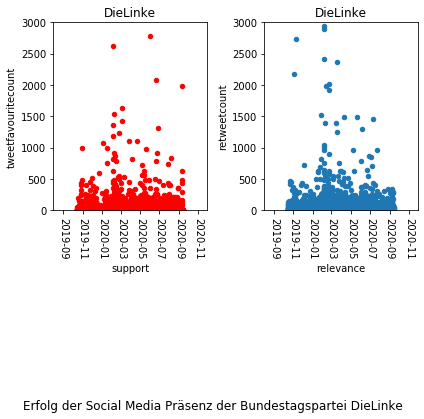

In [99]:
#Erfolg über Zeit/ favourites
fig=plt.figure(figsize=[100.4, 20.8])
fig,(ax1,ax2) = plt.subplots(1,2)

db_linke.plot.scatter(x="usercreatedts",y="tweetfavouritecount" , rot=-90, title='DieLinke', ax=ax1, color='red', ylim=(0,3000))
ax1.set_xlabel("support")
db_linke.plot.scatter(x="usercreatedts",y="retweetcount", rot=-90, title='DieLinke', ax=ax2, ylim=(0,3000))
ax2.set_xlabel("relevance")
plt.tight_layout()
fig.suptitle('Erfolg der Social Media Präsenz der Bundestagspartei DieLinke', y=-0.4)
plt.savefig('erfolg_linke.png', bbox_inches = "tight")

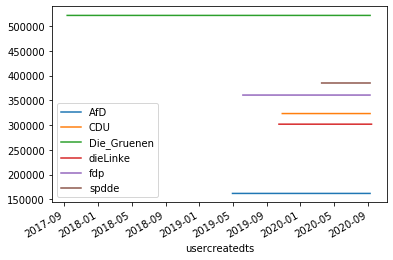

In [103]:
#Followerzahl
db_all_parties.groupby('username')['followers'].plot(legend=True)
plt.savefig('follower.png', bbox_inches = "tight")

In [135]:
#erfolgreichster Tweet pro Partei
db_spd.loc[db_spd["tweetfavouritecount"]==db_spd["tweetfavouritecount"].max(),:]
print('Most supported:',db_spd['text'].iloc[1704],'Favourites: ', db_spd['tweetfavouritecount'].iloc[1704])
db_spd.loc[db_spd["retweetcount"]==db_spd["retweetcount"].max(),:]
print('Most relevant:',db_spd['text'].iloc[3097],'Retweets: ', db_spd['retweetcount'].iloc[3097])

Most supported: 157 und Antifa. Selbstverständlich. https://t.co/acdxoL7kbi Favourites:  8089
Most relevant: Das dargestellte Modell verdeutlicht, was #WirBleibenZuhause bewirken kann. Lassen Sie uns gemeinsam dem Virus die Chance nehmen, sich weiter zu verbreiten. Machen Sie jetzt mit bei der Aktion. https://t.co/dOpuJ7kE1G Retweets:  3801


In [131]:
db_cdu.loc[db_cdu["tweetfavouritecount"]==db_cdu["tweetfavouritecount"].max(),:]
print('Most supported:',db_cdu['text'].iloc[3089],'Favourites: ', db_cdu['tweetfavouritecount'].iloc[3089])
db_cdu.loc[db_cdu["retweetcount"]==db_cdu["retweetcount"].max(),:]
print('Most relevant:',db_cdu['text'].iloc[1207], 'Retweets: ', db_cdu['retweetcount'].iloc[3089])

Most supported: Es wird keine Zusammenarbeit mit der AfD geben:
"Jegliche Form der Zusammenarbeit - nicht nur Koalitionen, sondern jegliche Form, auch irgendwelche Stimmen oder wie auch immer von der AfD - ist für uns nicht akzeptabel. Es geht hier nicht ... Favourites:  1505
Most relevant: ❗️Achtung Fake News ❗️
Es wird behauptet und rasch verbreitet, das Bundesministerium für Gesundheit / die Bundesregierung würde bald massive weitere Einschränkungen des öffentlichen Lebens ankündigen. Das stimmt NICHT! 
Bitte helfen Sie mit, ihre Verbreitung zu stoppen. https://t.co/h8bG7ued9N Retweets:  143


In [140]:
db_fdp.loc[db_fdp["tweetfavouritecount"]==db_fdp["tweetfavouritecount"].max(),:]
print('Most supported:',db_fdp['text'].iloc[2112],'Favourites: ', db_fdp['tweetfavouritecount'].iloc[2112])
db_fdp.loc[db_fdp["retweetcount"]==db_fdp["retweetcount"].max(),:]
print('Most relevant:',db_fdp['text'].iloc[984], 'Retweets: ', db_fdp['retweetcount'].iloc[984])

Most supported: Vorläufiges amtliches Endergebnis: 5,0005 Vielen Dank. ❤️💪🚀 Favourites:  1565
Most relevant: Nur zwei AfD-MdBs haben für Beschluss nach Art 115 GG gestimmt. Der war aber Voraussetzung für Hilfen an kleine Betriebe bis 10 Beschäftigte. Jeder, der in solchen Betrieben arbeitet und schon mal AfD gewählt hat, sollte wissen: Die waren heute bereit, Euch hängen zu lassen. Retweets:  4013


In [145]:
db_gruene.loc[db_gruene["tweetfavouritecount"]==db_gruene["tweetfavouritecount"].max(),:]
print('Most supported:',db_gruene['text'].iloc[813],'Favourites: ', db_gruene['tweetfavouritecount'].iloc[813])
db_gruene.loc[db_gruene["retweetcount"]==db_gruene["retweetcount"].max(),:]
print('Most relevant:',db_gruene['text'].iloc[1162], 'Retweets: ', db_gruene['retweetcount'].iloc[1162])

Most supported: Danke!
Für dieses Hammer-Ergebnis! Für jede Stimme! Für die zahllosen Stunden, die unsere Wahlkämpfer*innen dafür gearbeitet haben!
#Europawahl #EP2019 #2605 https://t.co/dJ3uXi2ouh Favourites:  6657
Most relevant: The only #10YearChallenge we should care about 🙏🏼🌍 #M1Ö https://t.co/S8hU7gNgZJ Retweets:  46354


In [151]:
db_afd.loc[db_afd["tweetfavouritecount"]==db_afd["tweetfavouritecount"].max(),:]
print('Most supported:',db_afd['text'].iloc[1356],'Favourites: ', db_afd['tweetfavouritecount'].iloc[1356])
db_afd.loc[db_afd["retweetcount"]==db_afd["retweetcount"].max(),:]
print('Most relevant:',db_afd['text'].iloc[2779], 'Retweets: ', db_afd['retweetcount'].iloc[2779])

Most supported: #AfD-Bundesvorstand stellt Strafanzeige gegen Kanzlerin #Merkel wegen Nötigung des thüringischen Ministerpräsidenten #Kemmerich. AfD-Bundessprecher Jörg Meuthen: „Hier liegt ein klarer Fall von Amtsmissbrauch mit Verletzung der Chancengleichheit der Parteien vor" #Thueringen Favourites:  2240
Most relevant: Wait, wait. Why is that fishing trawler towing an empty wooden boat at high seas??? https://t.co/psy2z6z9Wp Retweets:  4952


In [141]:
#db_linke.sort_index(inplace=True)
db_linke.loc[db_linke["tweetfavouritecount"]==db_linke["tweetfavouritecount"].max(),:]
print('Most supported:',db_linke['text'].iloc[2215],'Favourites: ', db_linke['tweetfavouritecount'].iloc[2215])
db_linke.loc[db_linke["retweetcount"]==db_linke["retweetcount"].max(),:]
print('Most relevant:',db_linke['text'].iloc[935], 'Retweets: ', db_linke['retweetcount'].iloc[935])

Most supported: #FDP und @c_lindner: Lieber mit Faschisten regieren, als nicht regieren.

#MPWahl #Kemmerich #CDU #Thüringen https://t.co/P11kfcBwdL Favourites:  9728
Most relevant: Großartige Ansage im #ICE an all die Anhänger*innen von #Verschwoerungstheorien in Zeiten des #coronavirus 👇🏽👍🏼 Genau zuhören👂🏻#Bahn #DeutscheBahn https://t.co/CRqnLbxZBh Retweets:  10962


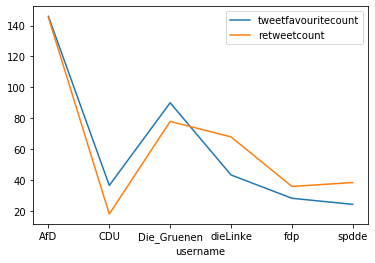

In [105]:
#durchschnittliche Likes und Retweets total
db_all_parties.groupby('username')['tweetfavouritecount'].mean().plot(legend=True)
db_all_parties.groupby('username')['retweetcount'].mean().plot(legend=True)
#plt.savefig('Likes_Retweets_mean_all.png', bbox_inches = "tight")

### durchschnittliche Tweets pro Tag ->> hier morgen weiter!

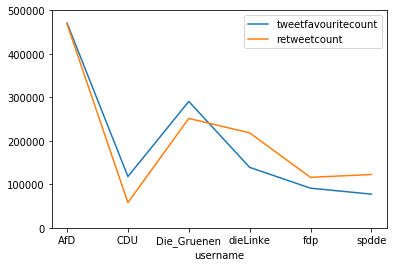

In [109]:
db_all_parties.groupby('username')['tweetfavouritecount'].sum().plot(legend=True, ylim=(0,500000))
db_all_parties.groupby('username')['retweetcount'].sum().plot(legend=True, ylim=(0,500000))
plt.savefig('Likes_Retweets_sum_all.png', bbox_inches = "tight")

In [112]:
db_all_parties.groupby('username')['count'].sum()

username
AfD            3226
CDU            3237
Die_Gruenen    3230
dieLinke       3216
fdp            3243
spdde          3201
Name: count, dtype: int64

In [111]:
db_all_parties['count']=1


In [32]:
db_all_parties['day']=db_all_parties.index.day

In [48]:
db_all_parties

,username,following,followers,tweetfavouritecount,retweetcount,text,retweeted_user,hashtags,count,day
usercreatedts,,,,,,,,,,
2020-09-08 12:52:58,spdde,4064,385281,0,5,"""#Lukaschenko ist persönlich für das Wohlergeh...",NilsSchmid,"[{'text': 'Lukaschenko', 'indices': [17, 29]},...",1,8
2020-09-08 12:52:54,spdde,4064,385281,0,7,"""Frau #Kolesnikowa wird offensichtlich gegen i...",NilsSchmid,"[{'text': 'Kolesnikowa', 'indices': [22, 34]}]",1,8
2020-09-08 12:51:20,spdde,4064,385281,8,3,"Soll niemand sagen, vom #Warntag2020 nichts ge...",NaN,"[{'text': 'Warntag2020', 'indices': [24, 36]}]",1,8
2020-09-08 09:40:05,spdde,4064,385281,0,14,„Die Botschaft des heutigen Tages lautet: #Fra...,BMFSFJ,"[{'text': 'Frauen', 'indices': [54, 61]}, {'te...",1,8
2020-09-08 09:38:55,spdde,4064,385281,4,1,Vor einigen Wochen sprachen wir im #Zukunftsdi...,NaN,"[{'text': 'Zukunftsdialog', 'indices': [35, 50...",1,8
...,...,...,...,...,...,...,...,...,...,...
2019-05-01 11:32:09,AfD,889,161946,0,204,Linke Landtagsabgeordnete versuchen #Demo-Rout...,WMuhsal,"[{'text': 'Demo', 'indices': [49, 54]}, {'text...",1,1
2019-05-01 09:30:00,AfD,889,161946,787,192,Wir möchten heute am #TagderArbeit wiederholt ...,NaN,"[{'text': 'TagderArbeit', 'indices': [21, 34]}...",1,1
2019-04-30 16:39:42,AfD,889,161946,0,137,#Einzelfall xxx: Polizeibekannter Syrer schläg...,M_Reichardt_AfD,"[{'text': 'Einzelfall', 'indices': [21, 32]}, ...",1,30


In [45]:
db_daily_tweets=db_all_parties.groupby(['day','username'])['count'].sum()

In [46]:
db_daily_tweets

day  username   
1    AfD            105
     CDU             84
     Die_Gruenen     72
     fdp             72
     spdde          211
                   ... 
31   AfD             50
     CDU             48
     Die_Gruenen     64
     fdp             42
     spdde           93
Name: count, Length: 155, dtype: int64

## Text Analysis

Text Classifiaction: Bag-of-words/Naive Bayes

In [4]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to C:\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [3]:
from matplotlib import pyplot as plt
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer


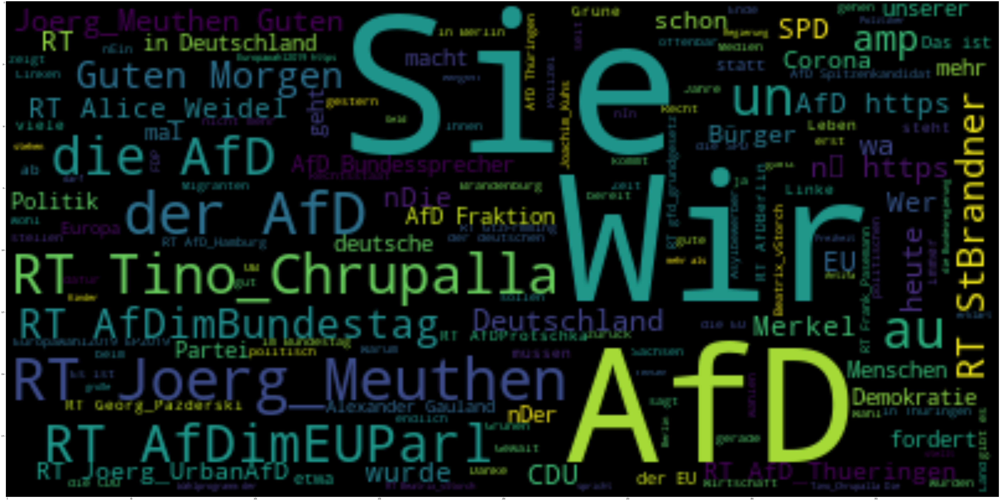

In [24]:
#wordcloud
from matplotlib import pyplot as plt
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer
german_stop_words = stopwords.words('german')

from wordcloud import WordCloud, STOPWORDS
stopwords = ["https", "co", "RT", "nhttps","http","al","de"] + list(set(stopwords.words('german')))
cloud = WordCloud(max_words=1400,stopwords = stopwords).generate(str(tweet_list_afd))

plt.figure(figsize = (100,100))
plt.imshow(cloud, interpolation='bilinear')
plt.savefig('word_cloud_afd.png')
plt.show()

In [5]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

In [55]:
'''Data einlesen'''
'''databases&Tweet_list'''
parties=['dieLinke']#Spdde,CDU,Die_Gruenen, fdp,AfD, dieLinke]

for party in parties:
    with open ('tweets_'+str(party)+'.txt', 'rb') as fp:
        tweet_list_linke = pickle.load(fp)

In [56]:
print(len(tweet_list_spd))
print(len(tweet_list_cdu))
print(len(tweet_list_gruene))
print(len(tweet_list_fdp))
print(len(tweet_list_afd))
print(len(tweet_list_linke))

3201
3237
3230
3243
3226
3216


Bag of words per Party

In [57]:
corpus= tweet_list_afd

In [6]:
import re
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'\d+', '', text)
    return text

#count_vectorizer = CountVectorizer(preprocessor=preprocess_text)

In [101]:
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer
#stopwords = ["https", "co", "RT", "nhttps","http","al","de"] + list(set(stopwords.words('german')))
german_stop_words = stopwords.words('german')
cv = CountVectorizer(analyzer='word', preprocessor=preprocess_text,stop_words = german_stop_words, max_features = 11524)

In [102]:
cv.fit(corpus)
out = cv.transform(corpus)

In [103]:
out.todense()

matrix([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [104]:
df_afd_vectorwords = pd.DataFrame(out.todense(), columns=cv.get_feature_names())
df_afd_vectorwords

,_donalphonso,_friedrichmerz,_seebruecke_,_tmopper,aachen,aavrvfd,aavscrb,aazflzg,ab,abaerbock,...,übrig,übrigen,übrigens,übt,übte,𝐀𝐥𝐭𝐩𝐚𝐫𝐭𝐞𝐢𝐞𝐧,𝐁𝐥𝐨𝐜𝐤𝐚𝐝𝐞𝐧,𝐄𝐫𝐟𝐨𝐥𝐠𝐞,𝐝𝐞𝐫,𝐭𝐫𝐨𝐭𝐳
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3221,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3222,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3223,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3224,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [6]:
from sklearn.feature_extraction.text import TfidfTransformer

In [106]:
tf = TfidfTransformer()
transformed = tf.fit_transform(out)
transformed

<3226x11524 sparse matrix of type '<class 'numpy.float64'>'
	with 42449 stored elements in Compressed Sparse Row format>

In [107]:
tdf = pd.DataFrame(transformed.todense(), columns=cv.get_feature_names())
tdf.round(6)

,_donalphonso,_friedrichmerz,_seebruecke_,_tmopper,aachen,aavrvfd,aavscrb,aazflzg,ab,abaerbock,...,übrig,übrigen,übrigens,übt,übte,𝐀𝐥𝐭𝐩𝐚𝐫𝐭𝐞𝐢𝐞𝐧,𝐁𝐥𝐨𝐜𝐤𝐚𝐝𝐞𝐧,𝐄𝐫𝐟𝐨𝐥𝐠𝐞,𝐝𝐞𝐫,𝐭𝐫𝐨𝐭𝐳
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3221,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3222,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3223,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3224,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [108]:
cv.get_feature_names()

['_donalphonso',
 '_friedrichmerz',
 '_seebruecke_',
 '_tmopper',
 'aachen',
 'aavrvfd',
 'aavscrb',
 'aazflzg',
 'ab',
 'abaerbock',
 'abarbeiten',
 'abbauen',
 'abc',
 'abdulkadir',
 'abe',
 'abend',
 'abermillionen',
 'abfindungen',
 'abg',
 'abgabe',
 'abgaben',
 'abge',
 'abgeben',
 'abgebrannt',
 'abgeholzt',
 'abgeknöpft',
 'abgelehnt',
 'abgelehnte',
 'abgeliefert',
 'abgeor',
 'abgeordnete',
 'abgeordneten',
 'abgeordneter',
 'abgeschlossen',
 'abgeschoben',
 'abgeschobene',
 'abgesondert',
 'abgespielt',
 'abgestellt',
 'abgestimmten',
 'abgetan',
 'abgewiesen',
 'abgraben',
 'abgrenzen',
 'abgrenzung',
 'abgrund',
 'abhängig',
 'abhören',
 'abkanzeln',
 'ablehnen',
 'ablehnende',
 'ablehnenden',
 'ablehnte',
 'ablehnung',
 'abo',
 'abonnenten',
 'abonnieren',
 'abriss',
 'abrutschen',
 'abs',
 'absage',
 'absagen',
 'absatz',
 'abschaffer',
 'abschaffung',
 'abschaffungsprogramm',
 'abschalten',
 'abschaum',
 'abscheuliche',
 'abschiebe',
 'abschieben',
 'abschiebequoten',
 

In [109]:
cv.vocabulary_

{'rt': 8091,
 'stbrandner': 8952,
 'fakten': 3083,
 'bt': 1623,
 'drs': 2332,
 'gefährliche': 3679,
 'körperverletzung': 5761,
 'deutsche': 2135,
 'tatverdächtige': 9240,
 'tv': 9504,
 'minus': 6505,
 'ca': 1784,
 'afdimeuparl': 164,
 'eu': 2957,
 'überwacht': 11496,
 'autofahrt': 864,
 'neuwagen': 6911,
 'buchheitmarkus': 1630,
 'afd': 137,
 'parlament': 7279,
 'zuständig': 11313,
 'verbraucherschutz': 9924,
 'ninalooksatit': 6957,
 'nehmen': 6865,
 'niemanden': 6950,
 'schutz': 8413,
 'gewalt': 3977,
 'mittel': 6562,
 'politik': 7493,
 'betrachtet': 1292,
 'weisen': 10673,
 'widersprüchlichkeit': 10775,
 'linker': 6025,
 'positionen': 7532,
 'sparen': 8782,
 'statt': 8943,
 'neue': 6888,
 'steuern': 9006,
 'entlarvend': 2702,
 'europa': 2969,
 'staatsminister': 8904,
 'miro_spd': 6510,
 'plädiert': 7466,
 'höhere': 4750,
 'beiträge': 1093,
 'staaten': 8884,
 'erneut': 2854,
 'massiver': 6298,
 'farbanschlag': 3131,
 'wahlkreisbüro': 10552,
 'erfurt': 2789,
 'narrenhände': 6817,
 'bes

Text Classifiaction: Naive Bayes Classifier (siehe Script)

## Next step: Entity recognition mit spacey

In [7]:
'''Data einlesen'''
'''Tweet_list'''
parties=['AfD']#Spdde,CDU,Die_Gruenen, fdp,AfD, dieLinke]

for party in parties:
    with open ('tweets_'+str(party)+'.txt', 'rb') as fp:
        tweet_list_AfD = pickle.load(fp)

In [8]:
'''Data einlesen'''
'''Tweet_list_partisan'''
parties=['AfD']#Spdde,CDU,Die_Gruenen, fdp,AfD, dieLinke]

for party in parties:
    with open ('tweets_partisan_'+str(party)+'.txt', 'rb') as fp:
        tweet_list_AfD_partisan = pickle.load(fp)

In [9]:
db_tweets_afd=pd.read_csv('Tweets_db_AfD.csv')

In [10]:
db_tweets_afd_partisan=pd.read_csv('tweets_AfD_partisan.csv')

In [11]:
db_all_parties_tweets_count=pd.read_csv('Tweets_all_parties_tweets_count.csv')
db_all_parties_tweets_count

,ABaerbock,AFD,AG,AHA,AHTbouHj,AKK,ALDEParty,ALLE,ARD,ARDSommerinterview,...,übernehmen,übernimmt,übernommen,überprüft,übertragen,überwiegend,überwinden,überwunden,überzeugt,übrigens
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5996,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5997,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5998,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [12]:
db_all_parties_tweets_tdf=pd.read_csv('Tweets_all_parties_tweets_tdf.csv')
db_all_parties_tweets_tdf

,ABaerbock,AFD,AG,AHA,AHTbouHj,AKK,ALDEParty,ALLE,ARD,ARDSommerinterview,...,übernehmen,übernimmt,übernommen,überprüft,übertragen,überwiegend,überwinden,überwunden,überzeugt,übrigens
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
